# Shopee Code League: Marketing Analytics

Author: Joanna Khek Cuina     
Date: 1 August 2020 - 8 August 2020

# Project Background

The aim of this project is to build a model that can predict whether a user opens the emails sent by Shopee.    

Sending emails is one of the marketing channels Shopee uses to reach out to our users. Being able to predict whether a user opens an email allows Shopee to forecast and evaluate the performance of future marketing campaigns before launch. This is because when a user opens an email, the probability of the user knowing the campaign increases and this in turn increases the probability of the user making a checkout during the campaign period. Therefore, with the predicted open rates, Shopee can better develop, strategize and implement future marketing campaigns.   

We provide you with data related to marketing emails (Electronic Direct Mail) that were sent to Shopee users over a certain period. It contains information about    
- User-specific information      
- Email nature      
- Users’ engagement on the platform    
- User’s reaction to the email, including whether users opened the email    

Based on the data provided, you must predict whether each user will open an email sent to him/her.    

# Data Description

- country_code: An integer code for the country where the user lives         
- grass_date: The date when the email was sent    
- user_id: the unique identifier of each user      
- subject_line_length: the number of characters in the subject of the email       
- last_open_day: How many days ago was the last time the user opened an email        
- last_login_day: How many days ago the user last logged in its Shopee account     
- last_checkout_day: How many days ago the user last purchased on Shopee     
- open_: the total number of email opens in the last N days     
- open_count_last_[10/30/60]_days: the total number of email opens in the last N days    
- login_count_last_[10/30/60]_days: the total number of user logins in the last N days     
- checkout_count_last_[10/30/60]_days: the total number of checkouts by the user in the last N days     
- open_flag: the target variable. Whether or not the email was opened    

# 1. Import Libraries

In [118]:
import numpy as np
import pandas as pd
import missingno
from datetime import datetime, timedelta
import ppscore as pps
import statistics 

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# model building
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, cross_val_score
from sklearn.model_selection import ShuffleSplit
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier,RandomForestClassifier,StackingClassifier,VotingClassifier,BaggingClassifier,ExtraTreesClassifier,GradientBoostingClassifier,BaggingClassifier,ExtraTreesClassifier
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from xgboost.sklearn import XGBClassifier
from lightgbm import LGBMClassifier
import xgboost as xgb
import lightgbm as lgb
import catboost as cat
from xgboost import XGBClassifier
from catboost import CatBoostClassifier, Pool, cv
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

from mlxtend.classifier import StackingCVClassifier
# evaluation metric
import shap
from sklearn import metrics
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import classification_report, f1_score, confusion_matrix, precision_score, matthews_corrcoef
from sklearn.ensemble import VotingClassifier

In [6]:
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)
pd.set_option("display.max_colwidth", -1)

Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.


# 2. Import Data

In [7]:
data_train = pd.read_csv("train.csv")
data_test = pd.read_csv("test.csv")
data_user = pd.read_csv("users.csv")

In [8]:
submission = pd.read_csv("sample_submission_0_1.csv")

In [9]:
data_train = data_train.drop("row_id", axis=1)
data_test = data_test.drop("row_id", axis=1)

In [10]:
data_train["train_test"] = "train"
data_test["open_flag"] = 0
data_test["train_test"] = "test"

In [11]:
data_full = pd.concat([data_train, data_test], axis=0)

In [12]:
data_full.shape

(129509, 18)

# 3. Exploratory Data Analysis

## Overview

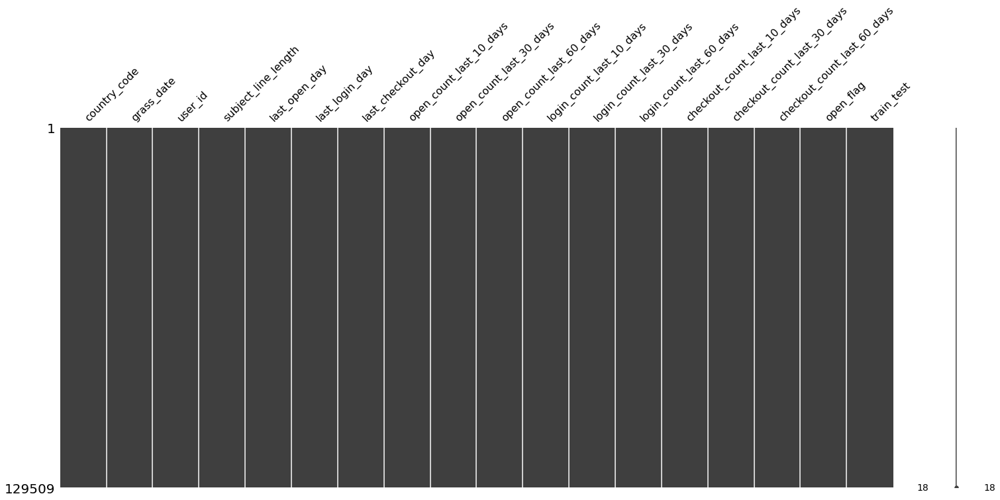

In [13]:
# check for missing data
missingno.matrix(data_full)

There are no missing values

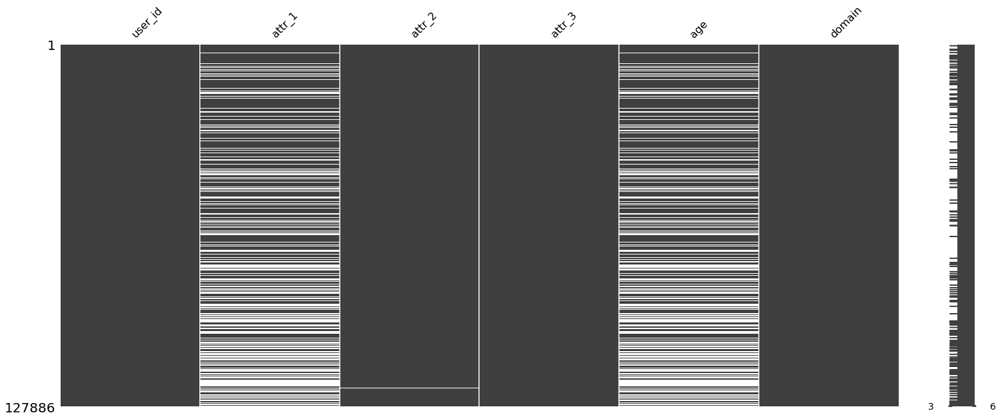

In [14]:
missingno.matrix(data_user)

Therea are missing values in attr_1 and age

In [15]:
data_full.dtypes

country_code                   int64 
grass_date                     object
user_id                        int64 
subject_line_length            int64 
last_open_day                  object
last_login_day                 object
last_checkout_day              object
open_count_last_10_days        int64 
open_count_last_30_days        int64 
open_count_last_60_days        int64 
login_count_last_10_days       int64 
login_count_last_30_days       int64 
login_count_last_60_days       int64 
checkout_count_last_10_days    int64 
checkout_count_last_30_days    int64 
checkout_count_last_60_days    int64 
open_flag                      int64 
train_test                     object
dtype: object

In [16]:
# convert datetime format
data_full["grass_date"] = pd.to_datetime(data_full["grass_date"])

In [17]:
# convert data type
data_full["open_flag"] = data_full["open_flag"].astype(object)
data_full["country_code"] = data_full["country_code"].astype(object)

In [18]:
# merge data_user and data_full
data_full_user = pd.merge(data_full, data_user, left_on="user_id", right_on="user_id", how="left")

In [19]:
data_full_user.head()

,country_code,grass_date,user_id,subject_line_length,last_open_day,last_login_day,last_checkout_day,open_count_last_10_days,open_count_last_30_days,open_count_last_60_days,login_count_last_10_days,login_count_last_30_days,login_count_last_60_days,checkout_count_last_10_days,checkout_count_last_30_days,checkout_count_last_60_days,open_flag,train_test,attr_1,attr_2,attr_3,age,domain
0,4,2019-07-16 00:00:00+08:00,43,44,19,6,18,0,2,4,12,43,99,0,5,10,0,train,1.0,1.0,2.0,47.0,@gmail.com
1,4,2019-07-16 00:00:00+08:00,102,44,9,4,8,2,9,17,18,48,90,1,1,4,1,train,1.0,1.0,2.0,25.0,@hotmail.com
2,6,2019-07-16 00:00:00+08:00,177,49,14,5,5,0,4,12,24,69,119,5,19,27,0,train,NaN,1.0,0.0,NaN,@yahoo.com
3,1,2019-07-16 00:00:00+08:00,184,49,49,9,53,0,0,1,9,23,69,1,3,6,0,train,1.0,1.0,2.0,24.0,@yahoo.com
4,6,2019-07-16 00:00:00+08:00,221,49,227,6,221,0,0,0,2,5,5,0,0,0,0,train,NaN,1.0,0.0,NaN,@hotmail.com


In [20]:
data_full_user[data_full_user["train_test"] == "train"].describe()

,user_id,subject_line_length,open_count_last_10_days,open_count_last_30_days,open_count_last_60_days,login_count_last_10_days,login_count_last_30_days,login_count_last_60_days,checkout_count_last_10_days,checkout_count_last_30_days,checkout_count_last_60_days,attr_1,attr_2,attr_3,age
count,73539.000000,73539.000000,73539.000000,73539.000000,73539.000000,73539.000000,73539.000000,73539.000000,73539.000000,73539.000000,73539.000000,45347.000000,73260.000000,73539.000000,45347.000000
mean,63048.595358,43.656373,0.911829,2.780457,5.019364,8.382287,25.284053,49.010430,0.909898,2.796040,5.420960,0.999757,0.997256,1.077863,31.445564
std,36068.006037,11.219323,1.754052,4.570239,7.902313,13.424436,37.853189,71.819327,2.887416,7.686064,13.980182,0.015573,0.052308,1.035252,11.797405
min,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-17.000000
25%,31679.500000,34.000000,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,24.000000
50%,63340.000000,43.000000,0.000000,1.000000,2.000000,3.000000,11.000000,22.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,29.000000
75%,94731.500000,52.000000,1.000000,3.000000,6.000000,12.000000,35.000000,69.000000,1.000000,3.000000,6.000000,1.000000,1.000000,2.000000,36.000000
max,127925.000000,75.000000,31.000000,92.000000,135.000000,254.000000,735.000000,1260.000000,157.000000,531.000000,783.000000,1.000000,1.000000,4.000000,118.000000


In [21]:
data_full_user[data_full_user["train_test"] == "test"].describe()

,user_id,subject_line_length,open_count_last_10_days,open_count_last_30_days,open_count_last_60_days,login_count_last_10_days,login_count_last_30_days,login_count_last_60_days,checkout_count_last_10_days,checkout_count_last_30_days,checkout_count_last_60_days,attr_1,attr_2,attr_3,age
count,55970.000000,55970.000000,55970.000000,55970.000000,55970.000000,55970.000000,55970.000000,55970.000000,55970.000000,55970.000000,55970.000000,34737.000000,55802.000000,55970.000000,34737.000000
mean,65049.007790,42.212703,0.774272,2.441880,5.323530,8.978899,26.289459,50.713882,1.124674,3.219385,5.933893,0.999885,0.999032,1.085778,31.267409
std,37934.945847,12.276136,1.752984,4.786883,9.053473,13.975840,38.572656,73.289199,3.500704,8.197445,14.233715,0.010730,0.031093,1.035913,11.312572
min,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32293.250000,35.000000,0.000000,0.000000,0.000000,0.000000,2.000000,4.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,24.000000
50%,64683.000000,41.000000,0.000000,0.000000,2.000000,4.000000,13.000000,25.000000,0.000000,1.000000,2.000000,1.000000,1.000000,1.000000,29.000000
75%,97776.500000,48.000000,1.000000,3.000000,6.000000,13.000000,36.000000,70.000000,1.000000,3.000000,7.000000,1.000000,1.000000,2.000000,36.000000
max,127922.000000,79.000000,30.000000,79.000000,120.000000,329.000000,746.000000,1300.000000,252.000000,404.000000,609.000000,1.000000,1.000000,4.000000,118.000000


In [22]:
def get_summary_df(df):
    
    columns = df.columns.tolist()
    
    dtypes = []
    unique_counts = []
    missing_counts = []
    missing_percentages = []
    total_counts = [df.shape[0]] * len(columns)

    for column in columns:
        dtype = str(df[column].dtype)
        dtypes.append(dtype)
        
        unique_count = df[column].nunique()
        unique_counts.append(unique_count)

        missing_count = df[column].isnull().sum()
        missing_counts.append(missing_count)
        
        missing_percentage = round((missing_count/df.shape[0]) * 100, 2)
        missing_percentages.append(missing_percentage)
        


    summary_df = pd.DataFrame({
        "column": columns,
        "dtype": dtypes,
        "unique_count": unique_counts,
        "missing_count": missing_counts,
        "missing_percentage": missing_percentages,
        "total_count": total_counts,
    })
    
    summary_df = summary_df.sort_values(by="missing_percentage", ascending=False).reset_index(drop=True)
    
    return summary_df

In [23]:
get_summary_df(data_full_user[data_full_user["train_test"] == "train"])

,column,dtype,unique_count,missing_count,missing_percentage,total_count
0,age,float64,99,28192,38.34,73539
1,attr_1,float64,2,28192,38.34,73539
2,attr_2,float64,2,279,0.38,73539
3,country_code,object,7,0,0.00,73539
4,login_count_last_60_days,int64,637,0,0.00,73539
5,attr_3,float64,5,0,0.00,73539
6,train_test,object,1,0,0.00,73539
7,open_flag,object,2,0,0.00,73539
8,checkout_count_last_60_days,int64,219,0,0.00,73539
9,checkout_count_last_30_days,int64,142,0,0.00,73539


In [24]:
get_summary_df(data_full_user[data_full_user["train_test"] == "test"])

,column,dtype,unique_count,missing_count,missing_percentage,total_count
0,age,float64,98,21233,37.94,55970
1,attr_1,float64,2,21233,37.94,55970
2,attr_2,float64,2,168,0.30,55970
3,country_code,object,7,0,0.00,55970
4,login_count_last_60_days,int64,615,0,0.00,55970
5,attr_3,float64,5,0,0.00,55970
6,train_test,object,1,0,0.00,55970
7,open_flag,object,1,0,0.00,55970
8,checkout_count_last_60_days,int64,202,0,0.00,55970
9,checkout_count_last_30_days,int64,131,0,0.00,55970


- last_{activity}_day is not in the form int64 but object --> There could be strings
- Despite having different number of unique values age and attr_1 have similar count of missing values --> They could be related
- Age can be low as -17 and as high as 118    
- Maximum values of {activity}_count_last_{duration}_days can be 100% higher than the 75% percentile value --> There could be many outliers

## Last_{Activity}_Day

In [25]:
data_full_user["last_open_day"].value_counts()

Never open    15107
1             8804 
2             7045 
3             5343 
4             4551 
5             4187 
6             3729 
7             3345 
8             3054 
9             2617 
10            2597 
11            2432 
13            2406 
12            2311 
14            2143 
15            1922 
17            1780 
16            1710 
20            1695 
19            1695 
18            1683 
21            1672 
27            1474 
22            1439 
23            1369 
26            1347 
24            1346 
25            1308 
28            1269 
29            1191 
30            1149 
35            1014 
31            965  
34            947  
33            922  
32            910  
40            833  
41            832  
36            803  
38            784  
37            782  
39            747  
42            707  
48            667  
44            665  
47            653  
49            646  
43            623  
46            622  
45            603  


In [26]:
data_full_user["last_login_day"].value_counts()

1              19499
2              11598
3              8939 
4              7139 
5              5749 
6              4568 
8              3834 
9              3806 
7              3800 
10             3347 
11             2935 
12             2672 
13             2328 
14             2144 
15             1841 
16             1679 
17             1576 
18             1439 
0              1374 
19             1289 
20             1177 
21             1064 
22             1014 
23             932  
24             883  
25             865  
26             792  
27             739  
28             700  
29             624  
30             563  
31             508  
32             456  
Never login    448  
34             394  
33             389  
36             366  
35             307  
37             303  
38             279  
42             272  
39             270  
40             261  
45             260  
41             259  
43             246  
49             235  
44           

In [27]:
data_full_user["last_checkout_day"].value_counts()

Never checkout    28308
1                 6035 
2                 4845 
3                 4103 
4                 3764 
5                 3265 
6                 2996 
7                 2665 
8                 2491 
9                 2296 
10                2202 
11                1955 
12                1792 
13                1761 
14                1753 
15                1592 
16                1506 
17                1319 
18                1291 
20                1270 
19                1266 
21                1102 
22                1082 
23                1011 
25                910  
24                902  
26                877  
27                865  
28                840  
29                764  
30                745  
31                701  
32                673  
33                604  
36                585  
34                568  
35                558  
40                524  
42                504  
37                501  
41                500  
38              

In [28]:
data_full_user["last_open_day"] = data_full_user["last_open_day"].apply(lambda x: np.nan if x=="Never open" else int(x))
data_full_user["last_login_day"] = data_full_user["last_login_day"].apply(lambda x: np.nan if x=="Never login" else int(x))
data_full_user["last_checkout_day"] = data_full_user["last_checkout_day"].apply(lambda x: np.nan if x=="Never checkout" else int(x))

In [29]:
last_activity_columns = ["last_open_day", "last_login_day", "last_checkout_day"]

In [30]:
get_summary_df(data_full_user[data_full_user["train_test"] == "train"][last_activity_columns])

,column,dtype,unique_count,missing_count,missing_percentage,total_count
0,last_checkout_day,float64,946,16905,22.99,73539
1,last_open_day,float64,548,7518,10.22,73539
2,last_login_day,float64,892,279,0.38,73539


In [31]:
get_summary_df(data_full_user[data_full_user["train_test"] == "test"][last_activity_columns])

,column,dtype,unique_count,missing_count,missing_percentage,total_count
0,last_checkout_day,float64,897,11403,20.37,55970
1,last_open_day,float64,490,7589,13.56,55970
2,last_login_day,float64,828,169,0.30,55970


In [32]:
data_full_user[data_full_user["train_test"] == "train"][last_activity_columns].describe()

,last_open_day,last_login_day,last_checkout_day
count,66021.00000,73260.000000,56634.000000
mean,32.75323,53.335695,73.645725
std,55.16675,345.223999,129.415239
min,1.00000,0.000000,1.000000
25%,5.00000,3.000000,7.000000
50%,14.00000,8.000000,22.000000
75%,38.00000,26.000000,77.000000
max,808.00000,18141.000000,1445.000000


In [33]:
data_full_user[data_full_user["train_test"] == "test"][last_activity_columns].describe()

,last_open_day,last_login_day,last_checkout_day
count,48381.000000,55801.000000,44567.000000
mean,32.641078,47.723607,69.409743
std,52.263247,276.075845,126.579497
min,1.000000,0.000000,1.000000
25%,6.000000,2.000000,6.000000
50%,18.000000,8.000000,19.000000
75%,40.000000,23.000000,69.000000
max,812.000000,18165.000000,1462.000000


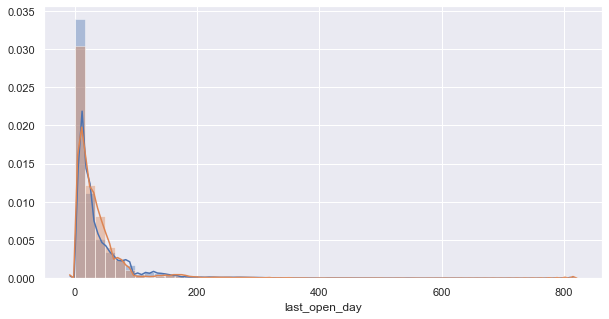

In [34]:
sns.set(rc={'figure.figsize':(10,5)})
train_ = data_full_user[data_full_user["train_test"] == "train"]
test_ = data_full_user[data_full_user["train_test"] == "test"]
sns.distplot(train_["last_open_day"], kde=True)
sns.distplot(test_["last_open_day"], kde=True)

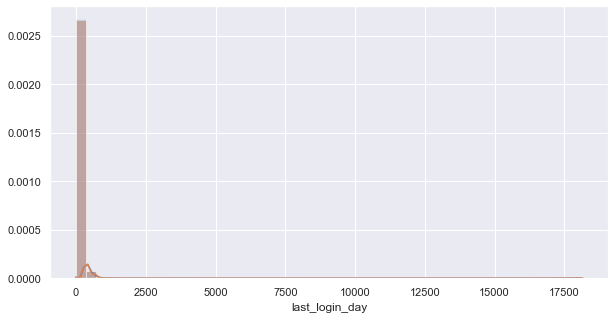

In [35]:
sns.distplot(train_["last_login_day"], kde=True)
sns.distplot(test_["last_login_day"], kde=True)

Last_login_day can be as old as 18K days which is weird

In [36]:
def plot_feature_scatter(df1, df2, features):
    i = 0
    plt.figure
    fix, ax = plt.subplots(5, 4, figsize=(20,20))
    for feature in features:
        i += 1
        plt.subplot(5, 4, i)
        plt.scatter(df1[feature], df2[feature], marker="+", color="#2B3A67", alpha=0.2)
        plt.xlabel(feature, fontsize=9)
        
    plt.show()

In [37]:
features = ["subject_line_length", "login_count_last_10_days", "login_count_last_30_days", "login_count_last_60_days", "open_count_last_10_days", "open_count_last_30_days", "open_count_last_60_days", "checkout_count_last_10_days", "checkout_count_last_30_days", "checkout_count_last_60_days", "age", "attr_1", "attr_2", "attr_3", "last_open_day", "last_checkout_day", "last_login_day"]

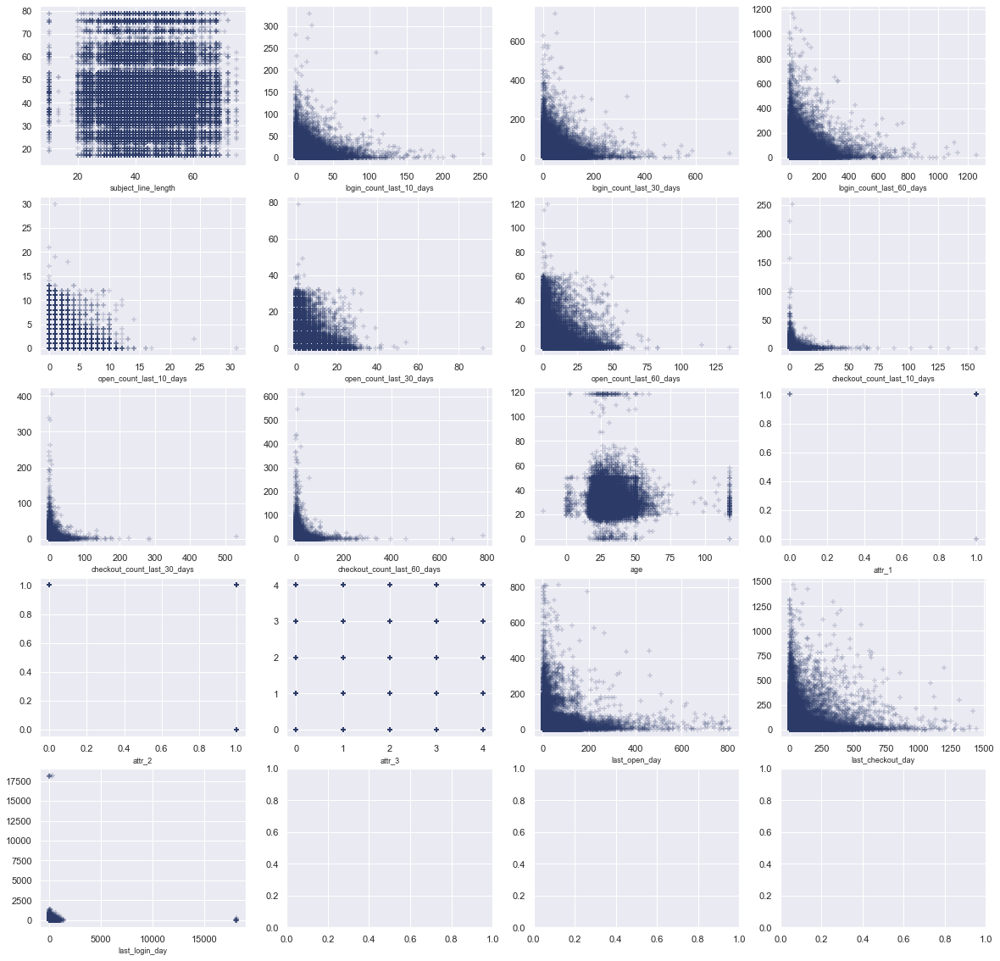

In [38]:
plot_feature_scatter(data_full_user[data_full_user["train_test"] == "train"].sample(50000), data_full_user[data_full_user["train_test"] == "test"].sample(50000), features)

- there is a gap between 10 to 20 in subject_line_length    
- there are some extreme outliers in last_login_day

In [39]:
def plot_feature_distribution(df1, df2, label1, label2, features, size=[4,5]):
    i = 0
    plt.figure()
    fix, ax = plt.subplots(size[0], size[1], figsize=(22,20))
    
    for feature in features:
        i += 1
        plt.subplot(size[0], size[1], i)
        sns.distplot(df1[feature], hist=False, label=label1, kde_kws={'bw':1.5}, color="#5982C5")
        sns.distplot(df2[feature], hist=False, label=label2, kde_kws={'bw':1.5}, color="#FB3523")
        
        plt.xlabel(feature, fontsize=9)
        
        locs, labels = plt.xticks()
        plt.tick_params(axis="x", which="major", labelsize=6, pad=6)
        plt.tick_params(axis="y", which="major", labelsize=6)
    plt.show()

In [40]:
target_0_df = data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["open_flag"] == 0)]
target_1_df = data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["open_flag"] == 1)]

<Figure size 720x360 with 0 Axes>

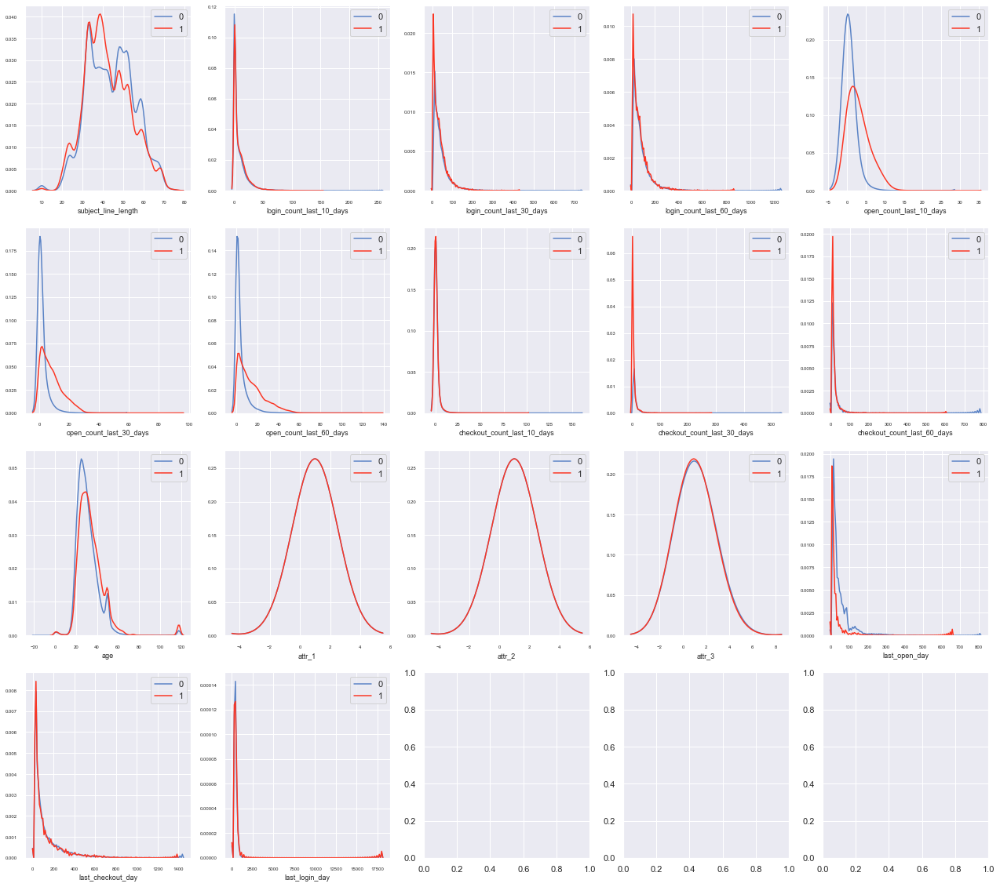

In [41]:
plot_feature_distribution(target_0_df, target_1_df, '0', '1', features, size=[4,5])

- The distribution of open_flag = 0 and 1 is somewhat dissimilar.    
- when subject_line_length is in between length of 35 and 45, the probability of having open_flag = 1 is high. But it could be that different country have different languages.   
- For the open_count feature, more emails open have higher tendency of opening shopee's email    
- age also has a different distribution. 

## Last Login Day Outliers

Find the maximum days of last login excluding the 18000

In [42]:
data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["last_login_day"] < 18000)]["last_login_day"].max()

1445.0

In [43]:
data_full_user[(data_full_user["train_test"] == "test") & (data_full_user["last_login_day"] < 18000)]["last_login_day"].max()

1399.0

It turns out that the last login days excluding 18000 is 1445 days for train and 1399 days for test which is around 4 years ago. That is when Shopee was just established in 2015 hence it makes sense.

In [44]:
data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["last_login_day"] > 18000)].sort_values(by="last_login_day").head(10)[["grass_date", "last_login_day"]]

,grass_date,last_login_day
6049,2019-07-19 00:00:00+08:00,18096.0
15395,2019-07-25 00:00:00+08:00,18102.0
16805,2019-07-26 00:00:00+08:00,18103.0
18744,2019-07-28 00:00:00+08:00,18105.0
22973,2019-07-30 00:00:00+08:00,18107.0
23050,2019-07-30 00:00:00+08:00,18107.0
32076,2019-08-06 00:00:00+08:00,18114.0
32234,2019-08-06 00:00:00+08:00,18114.0
32366,2019-08-06 00:00:00+08:00,18114.0
36255,2019-08-08 00:00:00+08:00,18116.0


If you see the grass_date and last_login_day, last_login_day is increasing as the grass_date increases, interesting! and if we actually substract the last_login_day from the grass_date they all trace back to the similar date which is January 1st, 1970. Yes you got that right it's UNIX epoch time. So this can be a consideration for the next step on what to do with these data points during the modelling.

## Age Outliers

In [45]:
data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["age"] <0)]

,country_code,grass_date,user_id,subject_line_length,last_open_day,last_login_day,last_checkout_day,open_count_last_10_days,open_count_last_30_days,open_count_last_60_days,login_count_last_10_days,login_count_last_30_days,login_count_last_60_days,checkout_count_last_10_days,checkout_count_last_30_days,checkout_count_last_60_days,open_flag,train_test,attr_1,attr_2,attr_3,age,domain
55774,3,2019-08-22 00:00:00+08:00,86151,52,37.0,128.0,259.0,0,0,0,0,0,0,0,0,0,0,train,1.0,1.0,3.0,-17.0,@gmail.com
59683,5,2019-08-26 00:00:00+08:00,1973,31,30.0,2.0,2.0,0,0,7,8,25,28,1,4,5,0,train,1.0,1.0,2.0,-16.0,@gmail.com


In [46]:
index = data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["age"] <0)].index

In [47]:
data_full_user = data_full_user.drop(index)

In [48]:
data_full_user[(data_full_user["train_test"] == "test") & (data_full_user["age"] <0)]

,country_code,grass_date,user_id,subject_line_length,last_open_day,last_login_day,last_checkout_day,open_count_last_10_days,open_count_last_30_days,open_count_last_60_days,login_count_last_10_days,login_count_last_30_days,login_count_last_60_days,checkout_count_last_10_days,checkout_count_last_30_days,checkout_count_last_60_days,open_flag,train_test,attr_1,attr_2,attr_3,age,domain


In [49]:
data_full_user = data_full_user.reset_index().drop("index", axis=1)

Let's see the clients with ages lower than legal age

In [50]:
data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["age"] < 18)].shape

(916, 23)

In [51]:
data_full_user[(data_full_user["train_test"] == "test") & (data_full_user["age"] < 18)].shape

(804, 23)

In [52]:
data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["age"] > 100)].shape

(314, 23)

In [53]:
data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["age"] > 100)]["age"].value_counts()

118.0    287
110.0    6  
115.0    5  
107.0    4  
101.0    3  
109.0    3  
114.0    2  
104.0    1  
112.0    1  
108.0    1  
105.0    1  
Name: age, dtype: int64

In [54]:
data_full_user[(data_full_user["train_test"] == "test") & (data_full_user["age"] > 100)]["age"].value_counts()

118.0    166
114.0    2  
110.0    2  
109.0    2  
103.0    2  
115.0    2  
106.0    2  
116.0    1  
105.0    1  
112.0    1  
117.0    1  
107.0    1  
Name: age, dtype: int64

- In train you can see someone with the age of negative value while fortunately in test you can't    
- From the result you can also see that we still have clients with ages lower than 18 and can't be as low as zero which is somehow impossible    
- Also, you can see from train data that the clients whose age is higher than 100 are mostly having similar age which is 118. So how is this possible?    

### Age 118

- Most of users with age 118 comes from country 4    

In [55]:
age_118 = data_full_user[data_full_user["age"] == 118]

In [56]:
age_118.head()

,country_code,grass_date,user_id,subject_line_length,last_open_day,last_login_day,last_checkout_day,open_count_last_10_days,open_count_last_30_days,open_count_last_60_days,login_count_last_10_days,login_count_last_30_days,login_count_last_60_days,checkout_count_last_10_days,checkout_count_last_30_days,checkout_count_last_60_days,open_flag,train_test,attr_1,attr_2,attr_3,age,domain
395,4,2019-07-16 00:00:00+08:00,23206,44,10.0,2.0,2.0,1,1,2,25,69,163,4,8,16,0,train,1.0,1.0,2.0,118.0,@gmail.com
639,4,2019-07-16 00:00:00+08:00,36248,44,9.0,2.0,13.0,1,1,2,3,10,11,1,2,2,1,train,1.0,1.0,1.0,118.0,@gmail.com
677,4,2019-07-16 00:00:00+08:00,38235,44,12.0,6.0,42.0,0,3,3,1,5,36,0,0,4,0,train,1.0,1.0,2.0,118.0,@hotmail.com
862,4,2019-07-16 00:00:00+08:00,47984,44,12.0,1.0,128.0,0,2,2,2,5,12,0,0,0,1,train,1.0,1.0,2.0,118.0,@gmail.com
896,4,2019-07-16 00:00:00+08:00,49721,44,7.0,12.0,15.0,1,1,1,1,12,21,0,4,4,0,train,1.0,1.0,1.0,118.0,@gmail.com


In [57]:
age_118["country_code"].value_counts()

4    445
3    4  
2    3  
5    1  
Name: country_code, dtype: int64

For those age 50:

In [58]:
label_1 = data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["age"] == 50) & (data_full_user["open_flag"] == 0)]
label_2 = data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["age"] == 50) & (data_full_user["open_flag"] == 1)]

Data must have variance to compute a kernel density estimate.
Data must have variance to compute a kernel density estimate.
Data must have variance to compute a kernel density estimate.
Data must have variance to compute a kernel density estimate.


<Figure size 720x360 with 0 Axes>

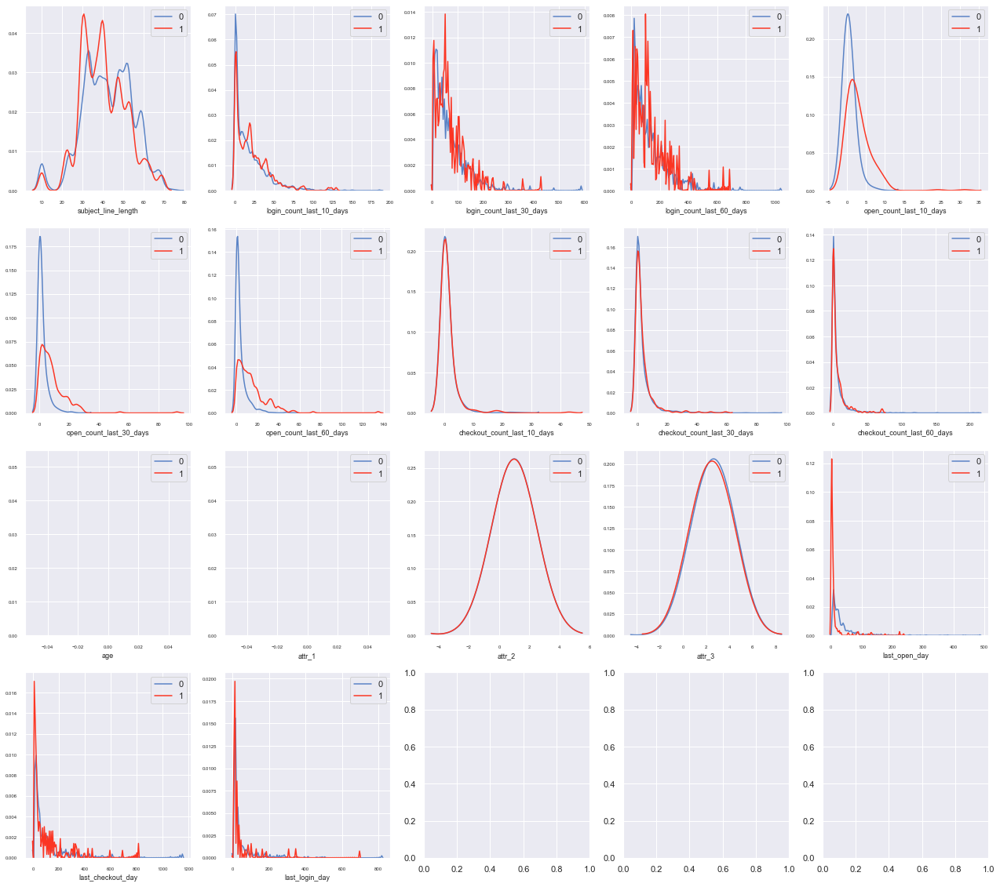

In [59]:
# investigate those age 50 concentration
plot_feature_distribution(label_1, label_2, "0", "1", features,size=[4,5])

In [60]:
# comparing with other ages
label_1 = data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["age"] != 50) & (data_full_user["open_flag"] == 0)]
label_2 = data_full_user[(data_full_user["train_test"] == "train") & (data_full_user["age"] != 50) & (data_full_user["open_flag"] == 1)]

<Figure size 720x360 with 0 Axes>

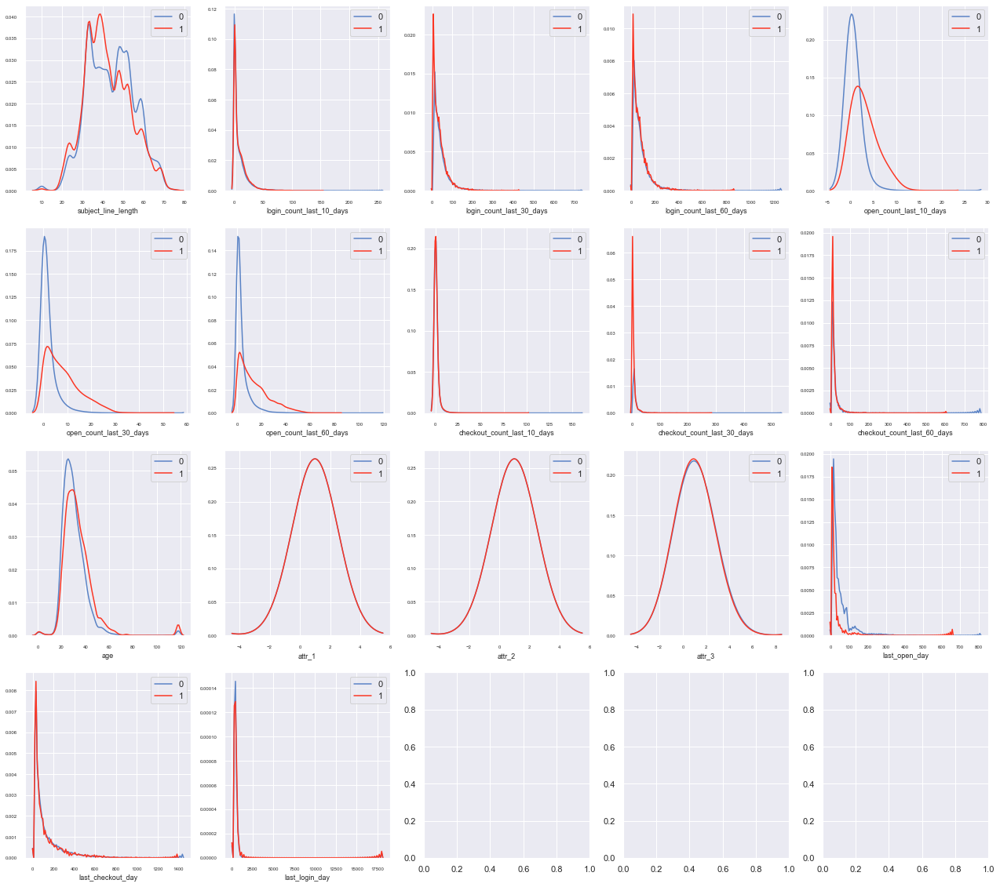

In [61]:
# investigate those age 50 concentration
plot_feature_distribution(label_1, label_2, "0", "1", features,size=[4,5])

- The distributions between age = 50 and age != 50 are similar except for last_open day   
- customers who open email frequently is just as likely to not open shopee's email.

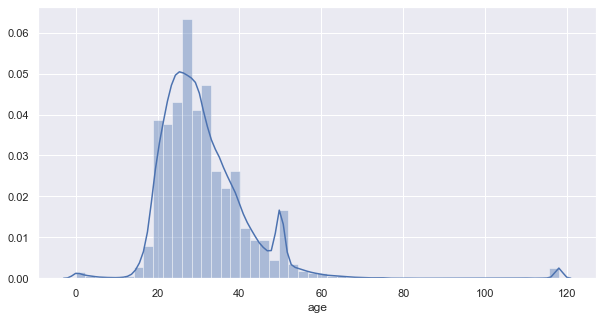

In [62]:
sns.distplot(data_full_user["age"], kde=True)

In [63]:
data_full_user[pd.isnull(data_full_user["age"])].shape

(49425, 23)

In [64]:
data_full_user[pd.isnull(data_full_user["age"])].head()

,country_code,grass_date,user_id,subject_line_length,last_open_day,last_login_day,last_checkout_day,open_count_last_10_days,open_count_last_30_days,open_count_last_60_days,login_count_last_10_days,login_count_last_30_days,login_count_last_60_days,checkout_count_last_10_days,checkout_count_last_30_days,checkout_count_last_60_days,open_flag,train_test,attr_1,attr_2,attr_3,age,domain
2,6,2019-07-16 00:00:00+08:00,177,49,14.0,5.0,5.0,0,4,12,24,69,119,5,19,27,0,train,NaN,1.0,0.0,NaN,@yahoo.com
4,6,2019-07-16 00:00:00+08:00,221,49,227.0,6.0,221.0,0,0,0,2,5,5,0,0,0,0,train,NaN,1.0,0.0,NaN,@hotmail.com
8,1,2019-07-16 00:00:00+08:00,350,49,7.0,5.0,26.0,2,4,7,1,8,10,0,1,1,1,train,NaN,1.0,0.0,NaN,@yahoo.com
14,2,2019-07-16 00:00:00+08:00,635,36,NaN,44.0,57.0,0,0,0,0,0,6,0,0,1,0,train,NaN,1.0,0.0,NaN,@hotmail.com
26,1,2019-07-16 00:00:00+08:00,1217,64,70.0,1396.0,NaN,0,0,0,0,0,0,0,0,0,0,train,NaN,1.0,0.0,NaN,@gmail.com


In [65]:
data_full_user[pd.notnull(data_full_user["age"])].shape

(80082, 23)

In [66]:
data_full_user[pd.notnull(data_full_user["age"])].head()

,country_code,grass_date,user_id,subject_line_length,last_open_day,last_login_day,last_checkout_day,open_count_last_10_days,open_count_last_30_days,open_count_last_60_days,login_count_last_10_days,login_count_last_30_days,login_count_last_60_days,checkout_count_last_10_days,checkout_count_last_30_days,checkout_count_last_60_days,open_flag,train_test,attr_1,attr_2,attr_3,age,domain
0,4,2019-07-16 00:00:00+08:00,43,44,19.0,6.0,18.0,0,2,4,12,43,99,0,5,10,0,train,1.0,1.0,2.0,47.0,@gmail.com
1,4,2019-07-16 00:00:00+08:00,102,44,9.0,4.0,8.0,2,9,17,18,48,90,1,1,4,1,train,1.0,1.0,2.0,25.0,@hotmail.com
3,1,2019-07-16 00:00:00+08:00,184,49,49.0,9.0,53.0,0,0,1,9,23,69,1,3,6,0,train,1.0,1.0,2.0,24.0,@yahoo.com
5,4,2019-07-16 00:00:00+08:00,246,44,5.0,8.0,70.0,3,7,13,6,18,45,0,0,7,0,train,1.0,1.0,2.0,35.0,@gmail.com
6,5,2019-07-16 00:00:00+08:00,258,43,13.0,3.0,3.0,0,0,0,9,32,46,2,3,3,0,train,1.0,1.0,2.0,22.0,@gmail.com


## Country Subject Length 

In [67]:
def plot_feature_distribution_by_elems(df1, df2, label1, label2, elems, size=[2,4]):
    i = 0
    
    fig, ax = plt.subplots(size[0], size[1], figsize=(20, 10))
    
    for i, elem in enumerate(elems):
        plt.subplot(size[0], size[1], i+1)

        sns.kdeplot(df1[df1["country_code"] == elem]["subject_line_length"], bw=0.5, label=label1, color="#5982C5")
        sns.kdeplot(df2[df2["country_code"] == elem]["subject_line_length"], bw=0.5, label=label2, color="#FB3523")

        plt.xlabel(elem, fontsize=11)
        locs, labels = plt.xticks()

        plt.tick_params(axis="x", which="major", labelsize=8)
        plt.tick_params(axis="y", which="major", labelsize=8)

    plt.show()

In [68]:
country_codes = sorted(data_full_user[data_full_user["train_test"] == "train"]["country_code"].unique().tolist())

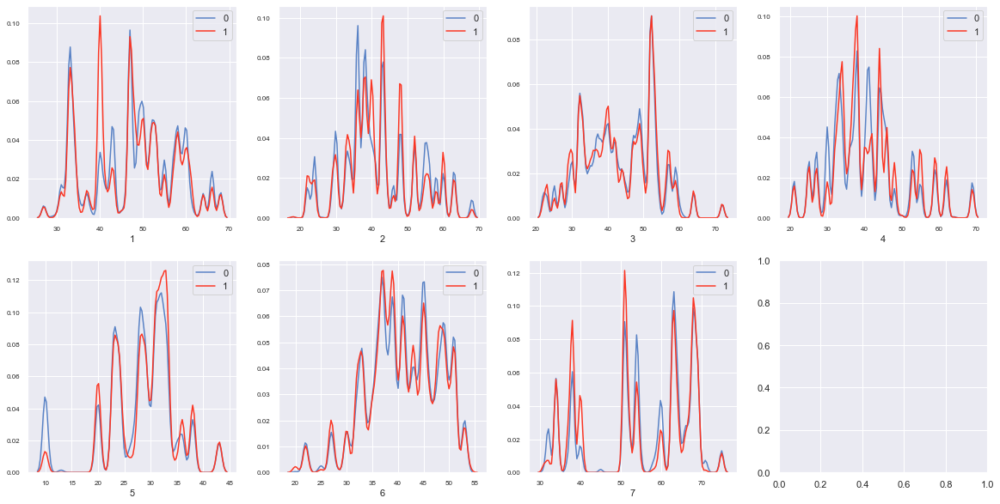

In [69]:
plot_feature_distribution_by_elems(target_0_df, target_1_df, "0", "1", country_codes, size=[2,4])

- The gap we saw in the scatterplot is caused by country code 5 which has length between 10 and 20.    
- No really clear pattern but we can see in some country at some points in the graph the distribution between the open_flag 0 and 1 is different. The distribution for country with id 3 and 6 almost look similar between open_flag 0 and 1.    

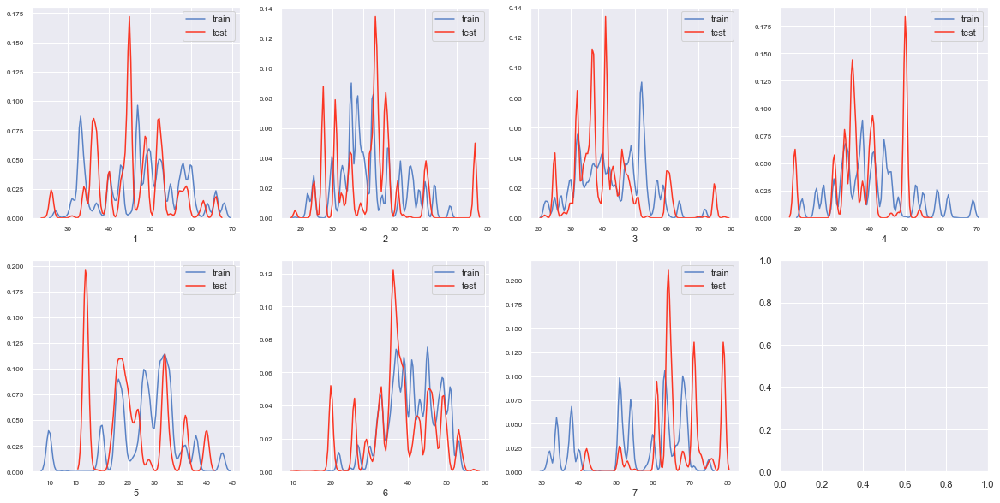

In [70]:
plot_feature_distribution_by_elems(data_full_user[data_full_user["train_test"] == "train"], 
                                   data_full_user[data_full_user["train_test"] == "test"], "train", "test", country_codes, size=[2,4])

In [71]:
def date_features(data):
    data["grass_month"] = data["grass_date"].dt.month
    data["grass_day"] = data["grass_date"].dt.day
    data["grass_dayofweek"] = data["grass_date"].dt.dayofweek
    data["grass_dayofyear"] = data["grass_date"].dt.dayofyear
    data["grass_week"] = data["grass_date"].dt.week
    data["grass_weekend"] = np.where(data["grass_dayofweek"].isin([5,6]), 1,0)
    data["grass_weekday"] = np.where(data["grass_dayofweek"].isin([0,1,2,3,4]),1,0)
    return data

In [72]:
def differences_interval(data, cols_1, cols_2, cols_3, name):
    name_20 = "20_interval_{}".format(name)
    name_30 = "30_interval_{}".format(name)
    name_50 = "50_interval_{}".format(name)
    data[name_20] = data[cols_2] - data[cols_1]
    data[name_30] = data[cols_3] - data[cols_2]
    data[name_50] = data[cols_3] - data[cols_1]
    return data

In [73]:
def average_features(data, cols_1, cols_2, cols_3, name):
    name_total = "total_open_{}".format(name)
    name_average_10 = "average_{}".format(cols_1)
    name_average_30 = "average_{}".format(cols_2)
    name_average_60 = "average_{}".format(cols_3)
    data[name_total] = data[cols_1] + data[cols_2] + data[cols_3]
    data[name_average_10] = data[cols_1]/10
    data[name_average_30] = data[cols_2]/30
    data[name_average_60] = data[cols_3]/60
    return data

In [74]:
data_full_user = date_features(data_full_user)

In [75]:
data_full_user["last_open_day"] = data_full_user["last_open_day"].fillna(-999)
data_full_user["last_login_day"] = data_full_user["last_login_day"].fillna(-999)
data_full_user["last_checkout_day"] = data_full_user["last_checkout_day"].fillna(-999)
data_full_user["age"] = data_full_user["age"].fillna(-999)

In [76]:
data_full_user["last_login_day"] = data_full_user["last_login_day"].astype(float)

In [77]:
grass_login = []
for i in range(0, len(data_full_user)):
    if (data_full_user["last_login_day"][i] != -999):
        grass_login.append(data_full_user["grass_date"][i] - timedelta(days=data_full_user["last_login_day"][i]))
    else:
        grass_login.append("Never Login")

In [78]:
data_full_user["grass_login"] = grass_login

In [79]:
data_full_user["grass_login_year"] = data_full_user["grass_login"].apply(lambda x: x.date().year if x != "Never Login" else x)
data_full_user["grass_login_month"] = data_full_user["grass_login"].apply(lambda x: x.date().month if x != "Never Login" else x)
data_full_user["grass_login_day"] = data_full_user["grass_login"].apply(lambda x: x.date().day if x != "Never Login" else x)

In [80]:
data_full_user = differences_interval(data_full_user, "open_count_last_10_days", "open_count_last_30_days", "open_count_last_60_days", "open")
data_full_user = differences_interval(data_full_user, "login_count_last_10_days", "login_count_last_30_days", "login_count_last_60_days", "login")
data_full_user = differences_interval(data_full_user, "checkout_count_last_10_days", "checkout_count_last_30_days", "checkout_count_last_60_days", "checkout")

In [81]:
data_full_user = average_features(data_full_user, "open_count_last_10_days", "open_count_last_30_days", "open_count_last_60_days", "open_count")
data_full_user = average_features(data_full_user, "login_count_last_10_days", "login_count_last_30_days", "login_count_last_60_days", "login")
data_full_user = average_features(data_full_user, "checkout_count_last_10_days", "checkout_count_last_30_days", "checkout_count_last_60_days", "checkout")

In [82]:
data_full_user["unix_epoch"] = data_full_user["grass_login_year"].apply(lambda x: 1 if x==1970 else 0)

In [83]:
data_full_user["attr_1"] = data_full_user["attr_1"].fillna(-999)
data_full_user["attr_2"] = data_full_user["attr_2"].fillna(-999)
data_full_user["attr_3"] = data_full_user["attr_3"].fillna(-999)

In [84]:
data_full_user.columns

Index(['country_code', 'grass_date', 'user_id', 'subject_line_length',
       'last_open_day', 'last_login_day', 'last_checkout_day',
       'open_count_last_10_days', 'open_count_last_30_days',
       'open_count_last_60_days', 'login_count_last_10_days',
       'login_count_last_30_days', 'login_count_last_60_days',
       'checkout_count_last_10_days', 'checkout_count_last_30_days',
       'checkout_count_last_60_days', 'open_flag', 'train_test', 'attr_1',
       'attr_2', 'attr_3', 'age', 'domain', 'grass_month', 'grass_day',
       'grass_dayofweek', 'grass_dayofyear', 'grass_week', 'grass_weekend',
       'grass_weekday', 'grass_login', 'grass_login_year', 'grass_login_month',
       'grass_login_day', '20_interval_open', '30_interval_open',
       '50_interval_open', '20_interval_login', '30_interval_login',
       '50_interval_login', '20_interval_checkout', '30_interval_checkout',
       '50_interval_checkout', 'total_open_open_count',
       'average_open_count_last_10_days',

In [85]:
keep_cols = ['country_code', 'subject_line_length',
       'last_open_day', 'last_login_day', 'last_checkout_day',
       'open_count_last_10_days', 'open_count_last_30_days',
       'open_count_last_60_days', 'login_count_last_10_days',
       'login_count_last_30_days', 'login_count_last_60_days',
       'checkout_count_last_10_days', 'checkout_count_last_30_days',
       'checkout_count_last_60_days', 'open_flag', 'train_test', 'age',
       'attr_2', 'attr_3', 'domain', 'grass_month', 'grass_day',
       'grass_dayofweek', 'grass_dayofyear', 'grass_week', 'grass_weekend',
       'grass_weekday', 'unix_epoch']

In [86]:
data_full_user_final = data_full_user

In [87]:
data_full_user_final = data_full_user_final[keep_cols]

In [88]:
data_full_user_final.head()

,country_code,subject_line_length,last_open_day,last_login_day,last_checkout_day,open_count_last_10_days,open_count_last_30_days,open_count_last_60_days,login_count_last_10_days,login_count_last_30_days,login_count_last_60_days,checkout_count_last_10_days,checkout_count_last_30_days,checkout_count_last_60_days,open_flag,train_test,age,attr_2,attr_3,domain,grass_month,grass_day,grass_dayofweek,grass_dayofyear,grass_week,grass_weekend,grass_weekday,unix_epoch
0,4,44,19.0,6.0,18.0,0,2,4,12,43,99,0,5,10,0,train,47.0,1.0,2.0,@gmail.com,7,16,1,197,29,0,1,0
1,4,44,9.0,4.0,8.0,2,9,17,18,48,90,1,1,4,1,train,25.0,1.0,2.0,@hotmail.com,7,16,1,197,29,0,1,0
2,6,49,14.0,5.0,5.0,0,4,12,24,69,119,5,19,27,0,train,-999.0,1.0,0.0,@yahoo.com,7,16,1,197,29,0,1,0
3,1,49,49.0,9.0,53.0,0,0,1,9,23,69,1,3,6,0,train,24.0,1.0,2.0,@yahoo.com,7,16,1,197,29,0,1,0
4,6,49,227.0,6.0,221.0,0,0,0,2,5,5,0,0,0,0,train,-999.0,1.0,0.0,@hotmail.com,7,16,1,197,29,0,1,0


In [89]:
for col in ['country_code', 'domain']:
    data_full_user_final = pd.get_dummies(data_full_user_final, columns=[col])

In [90]:
data_train = data_full_user_final[data_full_user_final["train_test"] == "train"]
data_test = data_full_user_final[data_full_user_final["train_test"] == "test"]

In [91]:
data_train = data_train.drop("train_test", axis=1)
data_test = data_test.drop("train_test", axis=1)

# Train Test Split

In [92]:
data_test = data_test.drop("open_flag", axis=1)

In [93]:
X_test = data_test

In [94]:
X = data_train.drop("open_flag", axis=1)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(data_train["open_flag"])

In [95]:
# X_train, x_valid, y_train, y_valid = train_test_split(X_scaled, y, test_size=0.1, random_state=101)

In [96]:
# These are the class weights for each class
class_0 =(len(y) - len(y[y==0]))/len(y)
class_1 =(len(y) - len(y[y==1]))/len(y)

In [97]:
print(class_0, class_1)

0.15578552293403322 0.8442144770659668


In [98]:
#weight = {0: round(class_0, 1), 1: round(class_1,1)}

In [99]:
weight = {0: 0.2, 1: 0.8}

In [100]:
weight

{0: 0.2, 1: 0.8}

# LGBM Classifier

In [119]:
def metrics(y_true, y_pred):
    print('Weighted F1 Score :', f1_score(y_true, y_pred, average='weighted'))
    print('MCC Score :', matthews_corrcoef(y_true, y_pred))
    cm = confusion_matrix(y_true, y_pred)
    cm = pd.DataFrame(cm, [0, 1], [0, 1])

    sns.heatmap(cm, annot=True, cmap="YlGnBu", fmt="d")
    plt.show()

In [122]:
pred_y

array([[0.95308953, 0.04691047],
       [0.82528431, 0.17471569],
       [0.91731351, 0.08268649],
       ...,
       [0.73199978, 0.26800022],
       [0.78501478, 0.21498522],
       [0.87445851, 0.12554149]])

Training until validation scores don't improve for 100 rounds
[200]	training's binary_logloss: 0.417591	valid_1's binary_logloss: 0.374356
[400]	training's binary_logloss: 0.402622	valid_1's binary_logloss: 0.367879
[600]	training's binary_logloss: 0.391447	valid_1's binary_logloss: 0.364458
[800]	training's binary_logloss: 0.381343	valid_1's binary_logloss: 0.361945
[1000]	training's binary_logloss: 0.373065	valid_1's binary_logloss: 0.360677
[1200]	training's binary_logloss: 0.366065	valid_1's binary_logloss: 0.359641
[1400]	training's binary_logloss: 0.359381	valid_1's binary_logloss: 0.358801
[1600]	training's binary_logloss: 0.353061	valid_1's binary_logloss: 0.357877
[1800]	training's binary_logloss: 0.347248	valid_1's binary_logloss: 0.357262
[2000]	training's binary_logloss: 0.3417	valid_1's binary_logloss: 0.356467
[2200]	training's binary_logloss: 0.336319	valid_1's binary_logloss: 0.355906
[2400]	training's binary_logloss: 0.331147	valid_1's binary_logloss: 0.355491
[2600]	t

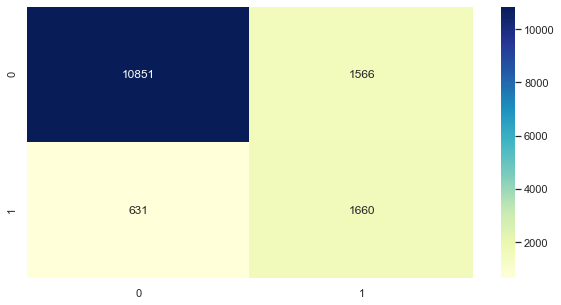

Training until validation scores don't improve for 100 rounds
[200]	training's binary_logloss: 0.414868	valid_1's binary_logloss: 0.378555
[400]	training's binary_logloss: 0.399081	valid_1's binary_logloss: 0.37287
[600]	training's binary_logloss: 0.387643	valid_1's binary_logloss: 0.369648
[800]	training's binary_logloss: 0.378522	valid_1's binary_logloss: 0.367679
[1000]	training's binary_logloss: 0.370347	valid_1's binary_logloss: 0.366007
[1200]	training's binary_logloss: 0.363262	valid_1's binary_logloss: 0.364859
[1400]	training's binary_logloss: 0.356926	valid_1's binary_logloss: 0.364353
[1600]	training's binary_logloss: 0.350307	valid_1's binary_logloss: 0.363692
[1800]	training's binary_logloss: 0.344583	valid_1's binary_logloss: 0.363179
[2000]	training's binary_logloss: 0.339306	valid_1's binary_logloss: 0.36267
[2200]	training's binary_logloss: 0.334269	valid_1's binary_logloss: 0.362394
Early stopping, best iteration is:
[2144]	training's binary_logloss: 0.335658	valid_1'

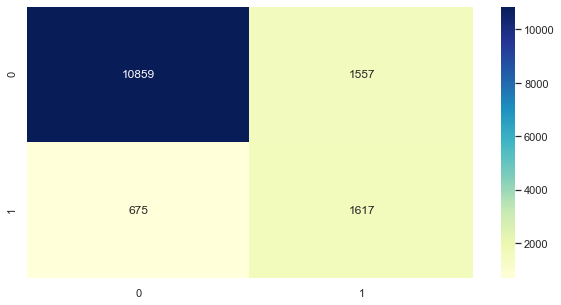

Training until validation scores don't improve for 100 rounds
[200]	training's binary_logloss: 0.417387	valid_1's binary_logloss: 0.374516
[400]	training's binary_logloss: 0.402551	valid_1's binary_logloss: 0.367591
[600]	training's binary_logloss: 0.391546	valid_1's binary_logloss: 0.364116
[800]	training's binary_logloss: 0.382801	valid_1's binary_logloss: 0.361926
[1000]	training's binary_logloss: 0.375479	valid_1's binary_logloss: 0.360558
[1200]	training's binary_logloss: 0.367939	valid_1's binary_logloss: 0.358682
[1400]	training's binary_logloss: 0.361259	valid_1's binary_logloss: 0.357561
[1600]	training's binary_logloss: 0.355233	valid_1's binary_logloss: 0.35642
[1800]	training's binary_logloss: 0.349421	valid_1's binary_logloss: 0.355522
[2000]	training's binary_logloss: 0.343973	valid_1's binary_logloss: 0.354602
[2200]	training's binary_logloss: 0.339096	valid_1's binary_logloss: 0.35393
[2400]	training's binary_logloss: 0.334384	valid_1's binary_logloss: 0.353562
Early st

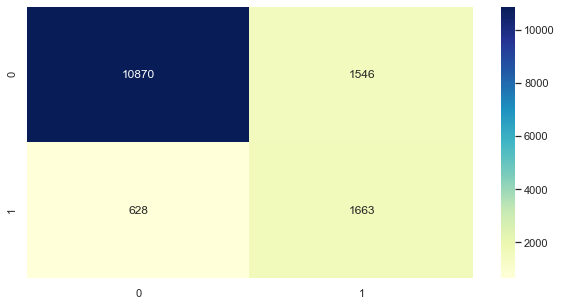

Training until validation scores don't improve for 100 rounds
[200]	training's binary_logloss: 0.417988	valid_1's binary_logloss: 0.373208
[400]	training's binary_logloss: 0.402517	valid_1's binary_logloss: 0.36725
[600]	training's binary_logloss: 0.390937	valid_1's binary_logloss: 0.363575
[800]	training's binary_logloss: 0.382056	valid_1's binary_logloss: 0.361013
[1000]	training's binary_logloss: 0.374165	valid_1's binary_logloss: 0.358803
[1200]	training's binary_logloss: 0.366768	valid_1's binary_logloss: 0.356875
[1400]	training's binary_logloss: 0.360471	valid_1's binary_logloss: 0.355817
[1600]	training's binary_logloss: 0.354203	valid_1's binary_logloss: 0.355019
[1800]	training's binary_logloss: 0.348821	valid_1's binary_logloss: 0.354452
[2000]	training's binary_logloss: 0.343402	valid_1's binary_logloss: 0.353592
[2200]	training's binary_logloss: 0.338129	valid_1's binary_logloss: 0.352539
[2400]	training's binary_logloss: 0.333209	valid_1's binary_logloss: 0.351629
[2600]	

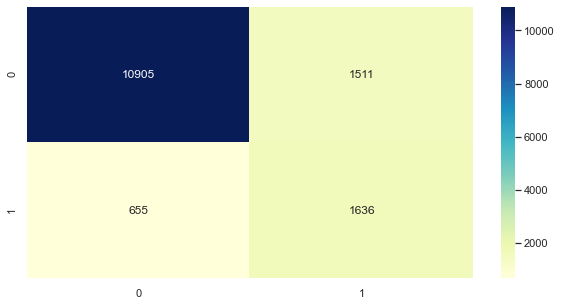

Training until validation scores don't improve for 100 rounds
[200]	training's binary_logloss: 0.415511	valid_1's binary_logloss: 0.376093
[400]	training's binary_logloss: 0.400587	valid_1's binary_logloss: 0.369552
[600]	training's binary_logloss: 0.389685	valid_1's binary_logloss: 0.366045
[800]	training's binary_logloss: 0.380393	valid_1's binary_logloss: 0.363526
[1000]	training's binary_logloss: 0.372991	valid_1's binary_logloss: 0.3618
[1200]	training's binary_logloss: 0.365893	valid_1's binary_logloss: 0.360363
[1400]	training's binary_logloss: 0.359443	valid_1's binary_logloss: 0.359242
[1600]	training's binary_logloss: 0.353698	valid_1's binary_logloss: 0.358784
[1800]	training's binary_logloss: 0.34794	valid_1's binary_logloss: 0.357935
[2000]	training's binary_logloss: 0.342178	valid_1's binary_logloss: 0.357362
[2200]	training's binary_logloss: 0.337045	valid_1's binary_logloss: 0.356583
[2400]	training's binary_logloss: 0.332423	valid_1's binary_logloss: 0.355799
Early sto

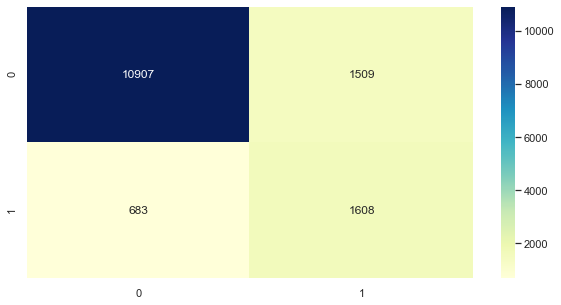

In [124]:
err_lgm = []
y_pred_tot_lgm = []

fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=101)
i=1
for train_index, test_index in fold.split(X, y):
    X_train, X_valid = X.iloc[train_index], X.iloc[test_index]
    y_train, y_valid = y[train_index], y[test_index]
    
    clf_lgbm = LGBMClassifier(boosting_type="gbdt",
                       objective="binary",
                       max_depth = 3,
                       class_weight = weight,
                       learning_rate = 0.08,
                       n_estimators=10000,
                       random_state=101)
    
    clf_lgbm.fit(X_train, y_train,
         eval_set= [(X_train, y_train), (X_valid, y_valid)],
         early_stopping_rounds=100,
         verbose=200)
    
    pred_y = clf_lgbm.predict_proba(X_valid)
    print("score_lgm: ", matthews_corrcoef(y_pred = [np.argmax(x) for x in pred_y], 
                                         y_true = y_valid))
    
    err_lgm.append(matthews_corrcoef(y_pred = [np.argmax(x) for x in pred_y],
                                     y_true = y_valid))
    pred_test = clf_lgbm.predict_proba(X_test)
    i = i + 1
    y_pred_tot_lgm.append(pred_test)
    metrics(y_valid, [np.argmax(x) for x in pred_y])

In [102]:
print("Accuracy: {}".format(np.mean(err_lgm,0)))

Accuracy: 0.5205443362824852


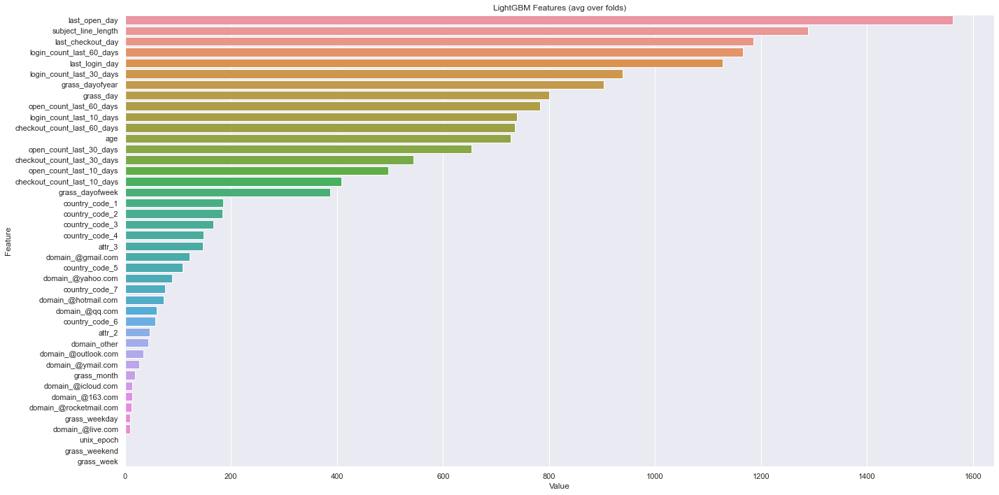

In [114]:
feature_imp = pd.DataFrame(sorted(zip(clf_lgbm.feature_importances_,X.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()
plt.show()

# XGBOOST

In [410]:
err_xgb = []
y_pred_tot_xgb = []

fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=101)
i = 1
for train_index, test_index in fold.split(X,y):
    X_train, X_valid = X.iloc[train_index], X.iloc[test_index] #.iloc for dataframe X
    y_train, y_valid = y[train_index], y[test_index]
    
    clf_xgb = XGBClassifier(boosting_type="gbdt",
                      max_depth=3,
                      class_weight=weight,
                      learning_rate=0.1,
                      n_estimators=5000,
                      gamma = 10,
                      colsample_bytree = 0.4,
                      subsample = 0.8,
                      random_state=101)
    
    clf_xgb.fit(X_train, y_train,
          eval_set=[(X_train, y_train), (X_valid, y_valid)],
          early_stopping_rounds=100,
          verbose=200)
    
    pred_y = clf_xgb.predict_proba(X_valid)
    print("err_xgb: ", matthews_corrcoef(y_pred = [np.argmax(x) for x in pred_y], 
                                         y_true = y_valid))
    
    err_xgb.append(matthews_corrcoef(y_pred = [np.argmax(x) for x in pred_y],
                                     y_true = y_valid))
    pred_test = clf_xgb.predict_proba(X_test)
    i = i + 1
    y_pred_tot_xgb.append(pred_test)

[0]	validation_0-error:0.132214	validation_1-error:0.132989
Multiple eval metrics have been passed: 'validation_1-error' will be used for early stopping.

Will train until validation_1-error hasn't improved in 100 rounds.
[200]	validation_0-error:0.109113	validation_1-error:0.108308
[400]	validation_0-error:0.108671	validation_1-error:0.107629
Stopping. Best iteration:
[468]	validation_0-error:0.108569	validation_1-error:0.106541

err_xgb:  0.5429264476368453
[0]	validation_0-error:0.132435	validation_1-error:0.132105
Multiple eval metrics have been passed: 'validation_1-error' will be used for early stopping.

Will train until validation_1-error hasn't improved in 100 rounds.
[200]	validation_0-error:0.108603	validation_1-error:0.113068
Stopping. Best iteration:
[107]	validation_0-error:0.10998	validation_1-error:0.112592

err_xgb:  0.5124988622539713
[0]	validation_0-error:0.13284	validation_1-error:0.130414
Multiple eval metrics have been passed: 'validation_1-error' will be used fo

In [411]:
print("Accuracy: {}".format(np.mean(err_xgb,0)))

Accuracy: 0.5297091734949845


In [412]:
err_cb = []
y_pred_tot_cb = []

fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=101)
i = 1
for train_index, test_index in fold.split(X,y):
    X_train, X_valid = X.iloc[train_index], X.iloc[test_index]
    y_train, y_valid = y[train_index], y[test_index]
    
    clf_cb = CatBoostClassifier(n_estimators=10000,
                           random_state=101,
                           learning_rate = 0.03,
                           boost_from_average=True,
                           max_depth=3)
    
    clf_cb.fit(X_train, y_train,
          eval_set=[(X_train, y_train), (X_valid, y_valid)],
          early_stopping_rounds=200,
          verbose=200)
    
    pred_y = clf_cb.predict_proba(X_valid)
    print("err_cb: ", matthews_corrcoef(y_pred = [np.argmax(x) for x in pred_y], 
                                         y_true = y_valid))
    
    err_cb.append(matthews_corrcoef(y_pred = [np.argmax(x) for x in pred_y],
                                     y_true = y_valid))
    pred_test = clf_cb.predict_proba(X_test)
    i = i + 1
    y_pred_tot_cb.append(pred_test)

0:	learn: 0.4260944	test: 0.4260944	test1: 0.4259748	best: 0.4259748 (0)	total: 17.3ms	remaining: 2m 53s
200:	learn: 0.2929666	test: 0.2929666	test1: 0.2906523	best: 0.2906523 (200)	total: 3.3s	remaining: 2m 41s
400:	learn: 0.2859774	test: 0.2859774	test1: 0.2843945	best: 0.2843945 (400)	total: 6.7s	remaining: 2m 40s
600:	learn: 0.2814138	test: 0.2814138	test1: 0.2810470	best: 0.2810470 (600)	total: 10.9s	remaining: 2m 50s
800:	learn: 0.2781769	test: 0.2781769	test1: 0.2792208	best: 0.2792208 (800)	total: 15.2s	remaining: 2m 54s
1000:	learn: 0.2755486	test: 0.2755486	test1: 0.2778523	best: 0.2778523 (1000)	total: 19.2s	remaining: 2m 52s
1200:	learn: 0.2734159	test: 0.2734159	test1: 0.2769326	best: 0.2769326 (1200)	total: 23.6s	remaining: 2m 52s
1400:	learn: 0.2714320	test: 0.2714320	test1: 0.2761432	best: 0.2761333 (1399)	total: 27.9s	remaining: 2m 51s
1600:	learn: 0.2696469	test: 0.2696469	test1: 0.2757364	best: 0.2757070 (1588)	total: 31.9s	remaining: 2m 47s
1800:	learn: 0.2680166	te

3200:	learn: 0.2588971	test: 0.2588971	test1: 0.2735483	best: 0.2735483 (3200)	total: 1m 4s	remaining: 2m 17s
3400:	learn: 0.2578193	test: 0.2578193	test1: 0.2733483	best: 0.2733323 (3372)	total: 1m 8s	remaining: 2m 12s
3600:	learn: 0.2568233	test: 0.2568233	test1: 0.2733499	best: 0.2733028 (3459)	total: 1m 12s	remaining: 2m 8s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.2733027685
bestIteration = 3459

Shrink model to first 3460 iterations.
err_cb:  0.5445264978273757
0:	learn: 0.4259791	test: 0.4259791	test1: 0.4261650	best: 0.4261650 (0)	total: 15.6ms	remaining: 2m 36s
200:	learn: 0.2907892	test: 0.2907892	test1: 0.2972502	best: 0.2972502 (200)	total: 3.81s	remaining: 3m 5s
400:	learn: 0.2838897	test: 0.2838897	test1: 0.2914068	best: 0.2914068 (400)	total: 7.59s	remaining: 3m 1s
600:	learn: 0.2793280	test: 0.2793280	test1: 0.2880425	best: 0.2880425 (600)	total: 11.3s	remaining: 2m 56s
800:	learn: 0.2761059	test: 0.2761059	test1: 0.2862042	best: 0.2862029 (79

In [413]:
print("Accuracy: {}".format(np.mean(err_cb,0)))

Accuracy: 0.5344578515347188


In [346]:
shap.initjs()

In [347]:
explainer = shap.TreeExplainer(clf_cb)
shap_values = explainer.shap_values(Pool(X_train, y_train))

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


Features with large absolute Shapley values are important

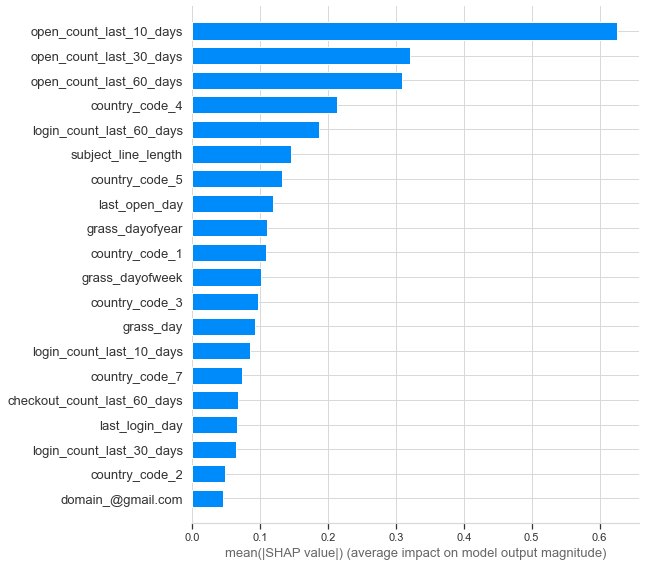

In [348]:
shap.summary_plot(shap_values, X_train, plot_type="bar")

The summary plot combines feature importance with feature effects. 

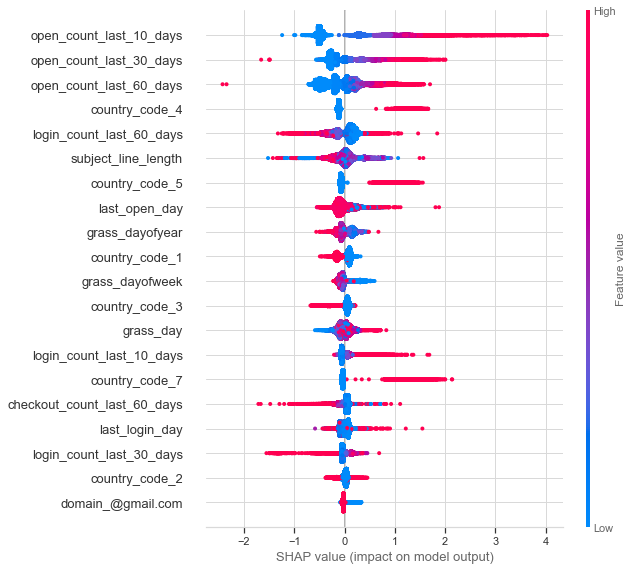

In [349]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X_train)

# Submission (Average Ensemble)

In [166]:
# submission_Ensemble

In [414]:
submission_ensemble = submission
mean = (np.mean(y_pred_tot_lgm,0) + np.mean(y_pred_tot_xgb,0) + np.mean(y_pred_tot_cb,0))/3
submission_ensemble["open_flag"] = np.argmax(mean,1)

In [415]:
submission_ensemble["open_flag"].value_counts()

0    49188
1    6782 
Name: open_flag, dtype: int64

In [416]:
submission_ensemble.to_csv("submission_ensemble_3_8Aug.csv", index=False, header=True)

In [417]:
submission_ensemble.head()

,row_id,open_flag
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0


# Submission (Stacking)

In [354]:
# meta = CatBoostClassifier(learning_rate=0.03)

In [355]:
# X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size = 0.20, random_state = 101)

In [356]:
# sclf = StackingCVClassifier(classifiers=[clf_lgbm, clf_xgb, clf_cb],
#                             cv = 5,
#                             shuffle = False,
#                             use_probas = True,
#                             meta_classifier = meta,
#                             random_state = 101)

In [357]:
# classifiers = {"LGBM": clf_lgbm,
#                "XGB": clf_xgb,
#                "CB": clf_cb,
#                "Stack": sclf}

In [358]:
# for key in classifiers:
#     classifier = classifiers[key]
#     # fit
#     classifier.fit(X_train, y_train)
#     # save
#     classifiers[key] = classifier

0:	learn: 0.4265721	total: 16.5ms	remaining: 2m 45s
1:	learn: 0.4203103	total: 33.6ms	remaining: 2m 48s
2:	learn: 0.4144832	total: 47.4ms	remaining: 2m 37s
3:	learn: 0.4092240	total: 61ms	remaining: 2m 32s
4:	learn: 0.4041486	total: 74.9ms	remaining: 2m 29s
5:	learn: 0.3990644	total: 89.4ms	remaining: 2m 28s
6:	learn: 0.3942755	total: 107ms	remaining: 2m 32s
7:	learn: 0.3898541	total: 122ms	remaining: 2m 31s
8:	learn: 0.3856296	total: 143ms	remaining: 2m 38s
9:	learn: 0.3814521	total: 161ms	remaining: 2m 40s
10:	learn: 0.3779103	total: 178ms	remaining: 2m 41s
11:	learn: 0.3742152	total: 194ms	remaining: 2m 41s
12:	learn: 0.3709489	total: 210ms	remaining: 2m 40s
13:	learn: 0.3675564	total: 225ms	remaining: 2m 40s
14:	learn: 0.3644311	total: 247ms	remaining: 2m 44s
15:	learn: 0.3615422	total: 265ms	remaining: 2m 45s
16:	learn: 0.3586335	total: 285ms	remaining: 2m 47s
17:	learn: 0.3559365	total: 302ms	remaining: 2m 47s
18:	learn: 0.3533902	total: 324ms	remaining: 2m 50s
19:	learn: 0.35098

167:	learn: 0.2931597	total: 2.81s	remaining: 2m 44s
168:	learn: 0.2930983	total: 2.83s	remaining: 2m 44s
169:	learn: 0.2930443	total: 2.84s	remaining: 2m 44s
170:	learn: 0.2929521	total: 2.85s	remaining: 2m 44s
171:	learn: 0.2929085	total: 2.87s	remaining: 2m 43s
172:	learn: 0.2928284	total: 2.88s	remaining: 2m 43s
173:	learn: 0.2927877	total: 2.9s	remaining: 2m 43s
174:	learn: 0.2927149	total: 2.92s	remaining: 2m 43s
175:	learn: 0.2926423	total: 2.93s	remaining: 2m 43s
176:	learn: 0.2925994	total: 2.94s	remaining: 2m 43s
177:	learn: 0.2925465	total: 2.96s	remaining: 2m 43s
178:	learn: 0.2925041	total: 2.97s	remaining: 2m 42s
179:	learn: 0.2924457	total: 2.98s	remaining: 2m 42s
180:	learn: 0.2924126	total: 3s	remaining: 2m 42s
181:	learn: 0.2923661	total: 3.01s	remaining: 2m 42s
182:	learn: 0.2923057	total: 3.02s	remaining: 2m 42s
183:	learn: 0.2922390	total: 3.04s	remaining: 2m 41s
184:	learn: 0.2922137	total: 3.05s	remaining: 2m 41s
185:	learn: 0.2921242	total: 3.06s	remaining: 2m 4

326:	learn: 0.2864019	total: 5.19s	remaining: 2m 33s
327:	learn: 0.2863268	total: 5.2s	remaining: 2m 33s
328:	learn: 0.2863091	total: 5.22s	remaining: 2m 33s
329:	learn: 0.2862845	total: 5.24s	remaining: 2m 33s
330:	learn: 0.2862526	total: 5.25s	remaining: 2m 33s
331:	learn: 0.2862161	total: 5.27s	remaining: 2m 33s
332:	learn: 0.2862029	total: 5.28s	remaining: 2m 33s
333:	learn: 0.2861711	total: 5.3s	remaining: 2m 33s
334:	learn: 0.2861257	total: 5.31s	remaining: 2m 33s
335:	learn: 0.2860649	total: 5.33s	remaining: 2m 33s
336:	learn: 0.2860529	total: 5.34s	remaining: 2m 33s
337:	learn: 0.2860072	total: 5.35s	remaining: 2m 33s
338:	learn: 0.2859979	total: 5.37s	remaining: 2m 33s
339:	learn: 0.2859626	total: 5.38s	remaining: 2m 32s
340:	learn: 0.2859139	total: 5.4s	remaining: 2m 32s
341:	learn: 0.2859008	total: 5.41s	remaining: 2m 32s
342:	learn: 0.2858740	total: 5.43s	remaining: 2m 32s
343:	learn: 0.2858022	total: 5.44s	remaining: 2m 32s
344:	learn: 0.2857898	total: 5.46s	remaining: 2m 

488:	learn: 0.2818613	total: 7.74s	remaining: 2m 30s
489:	learn: 0.2818345	total: 7.76s	remaining: 2m 30s
490:	learn: 0.2818186	total: 7.78s	remaining: 2m 30s
491:	learn: 0.2817948	total: 7.8s	remaining: 2m 30s
492:	learn: 0.2817708	total: 7.81s	remaining: 2m 30s
493:	learn: 0.2817443	total: 7.83s	remaining: 2m 30s
494:	learn: 0.2817316	total: 7.85s	remaining: 2m 30s
495:	learn: 0.2817082	total: 7.86s	remaining: 2m 30s
496:	learn: 0.2816864	total: 7.88s	remaining: 2m 30s
497:	learn: 0.2816513	total: 7.89s	remaining: 2m 30s
498:	learn: 0.2816364	total: 7.91s	remaining: 2m 30s
499:	learn: 0.2816161	total: 7.93s	remaining: 2m 30s
500:	learn: 0.2815958	total: 7.95s	remaining: 2m 30s
501:	learn: 0.2815733	total: 7.96s	remaining: 2m 30s
502:	learn: 0.2815510	total: 7.99s	remaining: 2m 30s
503:	learn: 0.2815305	total: 8s	remaining: 2m 30s
504:	learn: 0.2815086	total: 8.03s	remaining: 2m 31s
505:	learn: 0.2814914	total: 8.05s	remaining: 2m 31s
506:	learn: 0.2814480	total: 8.06s	remaining: 2m 3

644:	learn: 0.2786472	total: 10.4s	remaining: 2m 30s
645:	learn: 0.2786222	total: 10.4s	remaining: 2m 30s
646:	learn: 0.2786103	total: 10.4s	remaining: 2m 30s
647:	learn: 0.2785861	total: 10.4s	remaining: 2m 30s
648:	learn: 0.2785606	total: 10.4s	remaining: 2m 30s
649:	learn: 0.2785492	total: 10.4s	remaining: 2m 30s
650:	learn: 0.2785393	total: 10.4s	remaining: 2m 30s
651:	learn: 0.2785174	total: 10.5s	remaining: 2m 30s
652:	learn: 0.2784969	total: 10.5s	remaining: 2m 30s
653:	learn: 0.2784853	total: 10.5s	remaining: 2m 30s
654:	learn: 0.2784547	total: 10.5s	remaining: 2m 30s
655:	learn: 0.2784430	total: 10.5s	remaining: 2m 30s
656:	learn: 0.2784344	total: 10.6s	remaining: 2m 30s
657:	learn: 0.2784223	total: 10.6s	remaining: 2m 30s
658:	learn: 0.2784095	total: 10.6s	remaining: 2m 29s
659:	learn: 0.2783983	total: 10.6s	remaining: 2m 29s
660:	learn: 0.2783812	total: 10.6s	remaining: 2m 29s
661:	learn: 0.2783704	total: 10.6s	remaining: 2m 29s
662:	learn: 0.2783615	total: 10.6s	remaining: 

802:	learn: 0.2759784	total: 12.9s	remaining: 2m 27s
803:	learn: 0.2759666	total: 12.9s	remaining: 2m 27s
804:	learn: 0.2759554	total: 12.9s	remaining: 2m 27s
805:	learn: 0.2759429	total: 12.9s	remaining: 2m 27s
806:	learn: 0.2759331	total: 13s	remaining: 2m 27s
807:	learn: 0.2759230	total: 13s	remaining: 2m 27s
808:	learn: 0.2759148	total: 13s	remaining: 2m 27s
809:	learn: 0.2759039	total: 13s	remaining: 2m 27s
810:	learn: 0.2758848	total: 13s	remaining: 2m 27s
811:	learn: 0.2758740	total: 13s	remaining: 2m 27s
812:	learn: 0.2758658	total: 13.1s	remaining: 2m 27s
813:	learn: 0.2758574	total: 13.1s	remaining: 2m 27s
814:	learn: 0.2758557	total: 13.1s	remaining: 2m 27s
815:	learn: 0.2758466	total: 13.1s	remaining: 2m 27s
816:	learn: 0.2758285	total: 13.1s	remaining: 2m 27s
817:	learn: 0.2758196	total: 13.1s	remaining: 2m 27s
818:	learn: 0.2758084	total: 13.2s	remaining: 2m 27s
819:	learn: 0.2757987	total: 13.2s	remaining: 2m 27s
820:	learn: 0.2757916	total: 13.2s	remaining: 2m 27s
821:	

967:	learn: 0.2740320	total: 15.6s	remaining: 2m 25s
968:	learn: 0.2740254	total: 15.6s	remaining: 2m 25s
969:	learn: 0.2740182	total: 15.7s	remaining: 2m 25s
970:	learn: 0.2740083	total: 15.7s	remaining: 2m 25s
971:	learn: 0.2740073	total: 15.7s	remaining: 2m 25s
972:	learn: 0.2739959	total: 15.7s	remaining: 2m 25s
973:	learn: 0.2739873	total: 15.7s	remaining: 2m 25s
974:	learn: 0.2739762	total: 15.7s	remaining: 2m 25s
975:	learn: 0.2739667	total: 15.8s	remaining: 2m 25s
976:	learn: 0.2739582	total: 15.8s	remaining: 2m 25s
977:	learn: 0.2739413	total: 15.8s	remaining: 2m 25s
978:	learn: 0.2739226	total: 15.8s	remaining: 2m 25s
979:	learn: 0.2738968	total: 15.8s	remaining: 2m 25s
980:	learn: 0.2738724	total: 15.8s	remaining: 2m 25s
981:	learn: 0.2738638	total: 15.9s	remaining: 2m 25s
982:	learn: 0.2738538	total: 15.9s	remaining: 2m 25s
983:	learn: 0.2738463	total: 15.9s	remaining: 2m 25s
984:	learn: 0.2738402	total: 15.9s	remaining: 2m 25s
985:	learn: 0.2738343	total: 15.9s	remaining: 

1120:	learn: 0.2724032	total: 18.2s	remaining: 2m 24s
1121:	learn: 0.2723931	total: 18.2s	remaining: 2m 24s
1122:	learn: 0.2723817	total: 18.2s	remaining: 2m 24s
1123:	learn: 0.2723748	total: 18.2s	remaining: 2m 24s
1124:	learn: 0.2723633	total: 18.3s	remaining: 2m 24s
1125:	learn: 0.2723535	total: 18.3s	remaining: 2m 24s
1126:	learn: 0.2723445	total: 18.3s	remaining: 2m 24s
1127:	learn: 0.2723371	total: 18.3s	remaining: 2m 24s
1128:	learn: 0.2723286	total: 18.3s	remaining: 2m 24s
1129:	learn: 0.2723170	total: 18.3s	remaining: 2m 24s
1130:	learn: 0.2723030	total: 18.4s	remaining: 2m 24s
1131:	learn: 0.2722973	total: 18.4s	remaining: 2m 24s
1132:	learn: 0.2722903	total: 18.4s	remaining: 2m 24s
1133:	learn: 0.2722837	total: 18.4s	remaining: 2m 24s
1134:	learn: 0.2722679	total: 18.4s	remaining: 2m 24s
1135:	learn: 0.2722593	total: 18.5s	remaining: 2m 24s
1136:	learn: 0.2722489	total: 18.5s	remaining: 2m 23s
1137:	learn: 0.2722409	total: 18.5s	remaining: 2m 23s
1138:	learn: 0.2722319	total

1279:	learn: 0.2709005	total: 21s	remaining: 2m 22s
1280:	learn: 0.2708841	total: 21s	remaining: 2m 22s
1281:	learn: 0.2708745	total: 21s	remaining: 2m 22s
1282:	learn: 0.2708682	total: 21s	remaining: 2m 22s
1283:	learn: 0.2708623	total: 21s	remaining: 2m 22s
1284:	learn: 0.2708584	total: 21.1s	remaining: 2m 22s
1285:	learn: 0.2708472	total: 21.1s	remaining: 2m 22s
1286:	learn: 0.2708427	total: 21.1s	remaining: 2m 22s
1287:	learn: 0.2708157	total: 21.1s	remaining: 2m 22s
1288:	learn: 0.2708114	total: 21.2s	remaining: 2m 22s
1289:	learn: 0.2708046	total: 21.2s	remaining: 2m 23s
1290:	learn: 0.2707975	total: 21.2s	remaining: 2m 23s
1291:	learn: 0.2707915	total: 21.2s	remaining: 2m 23s
1292:	learn: 0.2707796	total: 21.2s	remaining: 2m 23s
1293:	learn: 0.2707741	total: 21.3s	remaining: 2m 23s
1294:	learn: 0.2707685	total: 21.3s	remaining: 2m 23s
1295:	learn: 0.2707521	total: 21.3s	remaining: 2m 23s
1296:	learn: 0.2707386	total: 21.3s	remaining: 2m 23s
1297:	learn: 0.2707252	total: 21.3s	re

1434:	learn: 0.2696005	total: 23.7s	remaining: 2m 21s
1435:	learn: 0.2695904	total: 23.7s	remaining: 2m 21s
1436:	learn: 0.2695864	total: 23.8s	remaining: 2m 21s
1437:	learn: 0.2695834	total: 23.8s	remaining: 2m 21s
1438:	learn: 0.2695746	total: 23.8s	remaining: 2m 21s
1439:	learn: 0.2695596	total: 23.8s	remaining: 2m 21s
1440:	learn: 0.2695449	total: 23.8s	remaining: 2m 21s
1441:	learn: 0.2695373	total: 23.8s	remaining: 2m 21s
1442:	learn: 0.2695333	total: 23.8s	remaining: 2m 21s
1443:	learn: 0.2695289	total: 23.9s	remaining: 2m 21s
1444:	learn: 0.2695243	total: 23.9s	remaining: 2m 21s
1445:	learn: 0.2695167	total: 23.9s	remaining: 2m 21s
1446:	learn: 0.2695062	total: 23.9s	remaining: 2m 21s
1447:	learn: 0.2694983	total: 23.9s	remaining: 2m 21s
1448:	learn: 0.2694909	total: 23.9s	remaining: 2m 21s
1449:	learn: 0.2694861	total: 24s	remaining: 2m 21s
1450:	learn: 0.2694764	total: 24s	remaining: 2m 21s
1451:	learn: 0.2694706	total: 24s	remaining: 2m 21s
1452:	learn: 0.2694651	total: 24s	

1592:	learn: 0.2683626	total: 26.3s	remaining: 2m 18s
1593:	learn: 0.2683560	total: 26.3s	remaining: 2m 18s
1594:	learn: 0.2683467	total: 26.3s	remaining: 2m 18s
1595:	learn: 0.2683320	total: 26.3s	remaining: 2m 18s
1596:	learn: 0.2683295	total: 26.4s	remaining: 2m 18s
1597:	learn: 0.2683250	total: 26.4s	remaining: 2m 18s
1598:	learn: 0.2683236	total: 26.4s	remaining: 2m 18s
1599:	learn: 0.2683198	total: 26.4s	remaining: 2m 18s
1600:	learn: 0.2683106	total: 26.4s	remaining: 2m 18s
1601:	learn: 0.2683018	total: 26.5s	remaining: 2m 18s
1602:	learn: 0.2682946	total: 26.5s	remaining: 2m 18s
1603:	learn: 0.2682851	total: 26.5s	remaining: 2m 18s
1604:	learn: 0.2682841	total: 26.5s	remaining: 2m 18s
1605:	learn: 0.2682759	total: 26.5s	remaining: 2m 18s
1606:	learn: 0.2682683	total: 26.5s	remaining: 2m 18s
1607:	learn: 0.2682391	total: 26.6s	remaining: 2m 18s
1608:	learn: 0.2682331	total: 26.6s	remaining: 2m 18s
1609:	learn: 0.2682170	total: 26.6s	remaining: 2m 18s
1610:	learn: 0.2682135	total

1750:	learn: 0.2670655	total: 28.7s	remaining: 2m 15s
1751:	learn: 0.2670567	total: 28.7s	remaining: 2m 15s
1752:	learn: 0.2670536	total: 28.7s	remaining: 2m 15s
1753:	learn: 0.2670434	total: 28.7s	remaining: 2m 15s
1754:	learn: 0.2670333	total: 28.8s	remaining: 2m 15s
1755:	learn: 0.2670298	total: 28.8s	remaining: 2m 15s
1756:	learn: 0.2670204	total: 28.8s	remaining: 2m 15s
1757:	learn: 0.2670138	total: 28.8s	remaining: 2m 15s
1758:	learn: 0.2670043	total: 28.8s	remaining: 2m 14s
1759:	learn: 0.2669934	total: 28.8s	remaining: 2m 14s
1760:	learn: 0.2669857	total: 28.8s	remaining: 2m 14s
1761:	learn: 0.2669803	total: 28.9s	remaining: 2m 14s
1762:	learn: 0.2669703	total: 28.9s	remaining: 2m 14s
1763:	learn: 0.2669617	total: 28.9s	remaining: 2m 14s
1764:	learn: 0.2669585	total: 28.9s	remaining: 2m 14s
1765:	learn: 0.2669473	total: 28.9s	remaining: 2m 14s
1766:	learn: 0.2669390	total: 28.9s	remaining: 2m 14s
1767:	learn: 0.2669315	total: 28.9s	remaining: 2m 14s
1768:	learn: 0.2669246	total

1911:	learn: 0.2659004	total: 31.3s	remaining: 2m 12s
1912:	learn: 0.2658743	total: 31.3s	remaining: 2m 12s
1913:	learn: 0.2658690	total: 31.3s	remaining: 2m 12s
1914:	learn: 0.2658636	total: 31.3s	remaining: 2m 12s
1915:	learn: 0.2658598	total: 31.3s	remaining: 2m 12s
1916:	learn: 0.2658550	total: 31.3s	remaining: 2m 12s
1917:	learn: 0.2658487	total: 31.4s	remaining: 2m 12s
1918:	learn: 0.2658325	total: 31.4s	remaining: 2m 12s
1919:	learn: 0.2658277	total: 31.4s	remaining: 2m 12s
1920:	learn: 0.2658219	total: 31.4s	remaining: 2m 12s
1921:	learn: 0.2658149	total: 31.4s	remaining: 2m 12s
1922:	learn: 0.2658056	total: 31.4s	remaining: 2m 12s
1923:	learn: 0.2657985	total: 31.4s	remaining: 2m 11s
1924:	learn: 0.2657904	total: 31.5s	remaining: 2m 11s
1925:	learn: 0.2657840	total: 31.5s	remaining: 2m 11s
1926:	learn: 0.2657770	total: 31.5s	remaining: 2m 11s
1927:	learn: 0.2657689	total: 31.5s	remaining: 2m 11s
1928:	learn: 0.2657612	total: 31.5s	remaining: 2m 11s
1929:	learn: 0.2657579	total

2067:	learn: 0.2648190	total: 33.6s	remaining: 2m 8s
2068:	learn: 0.2648163	total: 33.6s	remaining: 2m 8s
2069:	learn: 0.2648079	total: 33.7s	remaining: 2m 8s
2070:	learn: 0.2647855	total: 33.7s	remaining: 2m 8s
2071:	learn: 0.2647781	total: 33.7s	remaining: 2m 8s
2072:	learn: 0.2647743	total: 33.7s	remaining: 2m 8s
2073:	learn: 0.2647687	total: 33.7s	remaining: 2m 8s
2074:	learn: 0.2647622	total: 33.7s	remaining: 2m 8s
2075:	learn: 0.2647567	total: 33.7s	remaining: 2m 8s
2076:	learn: 0.2647528	total: 33.8s	remaining: 2m 8s
2077:	learn: 0.2647427	total: 33.8s	remaining: 2m 8s
2078:	learn: 0.2647362	total: 33.8s	remaining: 2m 8s
2079:	learn: 0.2647312	total: 33.8s	remaining: 2m 8s
2080:	learn: 0.2647241	total: 33.8s	remaining: 2m 8s
2081:	learn: 0.2647178	total: 33.8s	remaining: 2m 8s
2082:	learn: 0.2647065	total: 33.9s	remaining: 2m 8s
2083:	learn: 0.2647028	total: 33.9s	remaining: 2m 8s
2084:	learn: 0.2646949	total: 33.9s	remaining: 2m 8s
2085:	learn: 0.2646868	total: 33.9s	remaining:

2228:	learn: 0.2637139	total: 36s	remaining: 2m 5s
2229:	learn: 0.2637087	total: 36s	remaining: 2m 5s
2230:	learn: 0.2636992	total: 36s	remaining: 2m 5s
2231:	learn: 0.2636924	total: 36s	remaining: 2m 5s
2232:	learn: 0.2636868	total: 36s	remaining: 2m 5s
2233:	learn: 0.2636785	total: 36.1s	remaining: 2m 5s
2234:	learn: 0.2636708	total: 36.1s	remaining: 2m 5s
2235:	learn: 0.2636644	total: 36.1s	remaining: 2m 5s
2236:	learn: 0.2636498	total: 36.1s	remaining: 2m 5s
2237:	learn: 0.2636424	total: 36.1s	remaining: 2m 5s
2238:	learn: 0.2636364	total: 36.1s	remaining: 2m 5s
2239:	learn: 0.2636314	total: 36.1s	remaining: 2m 5s
2240:	learn: 0.2636249	total: 36.1s	remaining: 2m 5s
2241:	learn: 0.2636191	total: 36.2s	remaining: 2m 5s
2242:	learn: 0.2636168	total: 36.2s	remaining: 2m 5s
2243:	learn: 0.2636136	total: 36.2s	remaining: 2m 5s
2244:	learn: 0.2636062	total: 36.2s	remaining: 2m 5s
2245:	learn: 0.2636014	total: 36.2s	remaining: 2m 5s
2246:	learn: 0.2635921	total: 36.2s	remaining: 2m 5s
224

2394:	learn: 0.2625827	total: 38.4s	remaining: 2m 1s
2395:	learn: 0.2625752	total: 38.4s	remaining: 2m 1s
2396:	learn: 0.2625679	total: 38.4s	remaining: 2m 1s
2397:	learn: 0.2625630	total: 38.4s	remaining: 2m 1s
2398:	learn: 0.2625530	total: 38.4s	remaining: 2m 1s
2399:	learn: 0.2625465	total: 38.4s	remaining: 2m 1s
2400:	learn: 0.2625360	total: 38.4s	remaining: 2m 1s
2401:	learn: 0.2625284	total: 38.4s	remaining: 2m 1s
2402:	learn: 0.2625186	total: 38.5s	remaining: 2m 1s
2403:	learn: 0.2625166	total: 38.5s	remaining: 2m 1s
2404:	learn: 0.2625075	total: 38.5s	remaining: 2m 1s
2405:	learn: 0.2625036	total: 38.5s	remaining: 2m 1s
2406:	learn: 0.2624979	total: 38.5s	remaining: 2m 1s
2407:	learn: 0.2624941	total: 38.5s	remaining: 2m 1s
2408:	learn: 0.2624874	total: 38.5s	remaining: 2m 1s
2409:	learn: 0.2624807	total: 38.6s	remaining: 2m 1s
2410:	learn: 0.2624716	total: 38.6s	remaining: 2m 1s
2411:	learn: 0.2624673	total: 38.6s	remaining: 2m 1s
2412:	learn: 0.2624546	total: 38.6s	remaining:

2551:	learn: 0.2616408	total: 40.7s	remaining: 1m 58s
2552:	learn: 0.2616350	total: 40.7s	remaining: 1m 58s
2553:	learn: 0.2616307	total: 40.7s	remaining: 1m 58s
2554:	learn: 0.2616261	total: 40.8s	remaining: 1m 58s
2555:	learn: 0.2616223	total: 40.8s	remaining: 1m 58s
2556:	learn: 0.2616173	total: 40.8s	remaining: 1m 58s
2557:	learn: 0.2616137	total: 40.8s	remaining: 1m 58s
2558:	learn: 0.2616101	total: 40.8s	remaining: 1m 58s
2559:	learn: 0.2616007	total: 40.8s	remaining: 1m 58s
2560:	learn: 0.2615956	total: 40.8s	remaining: 1m 58s
2561:	learn: 0.2615920	total: 40.9s	remaining: 1m 58s
2562:	learn: 0.2615866	total: 40.9s	remaining: 1m 58s
2563:	learn: 0.2615798	total: 40.9s	remaining: 1m 58s
2564:	learn: 0.2615739	total: 40.9s	remaining: 1m 58s
2565:	learn: 0.2615729	total: 40.9s	remaining: 1m 58s
2566:	learn: 0.2615642	total: 40.9s	remaining: 1m 58s
2567:	learn: 0.2615553	total: 41s	remaining: 1m 58s
2568:	learn: 0.2615488	total: 41s	remaining: 1m 58s
2569:	learn: 0.2615424	total: 41

2715:	learn: 0.2607254	total: 43.3s	remaining: 1m 56s
2716:	learn: 0.2607198	total: 43.3s	remaining: 1m 56s
2717:	learn: 0.2607126	total: 43.3s	remaining: 1m 56s
2718:	learn: 0.2607053	total: 43.3s	remaining: 1m 56s
2719:	learn: 0.2607007	total: 43.3s	remaining: 1m 56s
2720:	learn: 0.2606970	total: 43.4s	remaining: 1m 56s
2721:	learn: 0.2606946	total: 43.4s	remaining: 1m 55s
2722:	learn: 0.2606917	total: 43.4s	remaining: 1m 55s
2723:	learn: 0.2606858	total: 43.4s	remaining: 1m 55s
2724:	learn: 0.2606814	total: 43.4s	remaining: 1m 55s
2725:	learn: 0.2606800	total: 43.4s	remaining: 1m 55s
2726:	learn: 0.2606787	total: 43.5s	remaining: 1m 55s
2727:	learn: 0.2606720	total: 43.5s	remaining: 1m 55s
2728:	learn: 0.2606707	total: 43.5s	remaining: 1m 55s
2729:	learn: 0.2606627	total: 43.5s	remaining: 1m 55s
2730:	learn: 0.2606581	total: 43.5s	remaining: 1m 55s
2731:	learn: 0.2606457	total: 43.5s	remaining: 1m 55s
2732:	learn: 0.2606413	total: 43.6s	remaining: 1m 55s
2733:	learn: 0.2606348	total

2875:	learn: 0.2598576	total: 45.9s	remaining: 1m 53s
2876:	learn: 0.2598531	total: 45.9s	remaining: 1m 53s
2877:	learn: 0.2598485	total: 45.9s	remaining: 1m 53s
2878:	learn: 0.2598430	total: 46s	remaining: 1m 53s
2879:	learn: 0.2598376	total: 46s	remaining: 1m 53s
2880:	learn: 0.2598336	total: 46s	remaining: 1m 53s
2881:	learn: 0.2598281	total: 46s	remaining: 1m 53s
2882:	learn: 0.2598225	total: 46s	remaining: 1m 53s
2883:	learn: 0.2598178	total: 46s	remaining: 1m 53s
2884:	learn: 0.2598092	total: 46.1s	remaining: 1m 53s
2885:	learn: 0.2598036	total: 46.1s	remaining: 1m 53s
2886:	learn: 0.2598033	total: 46.1s	remaining: 1m 53s
2887:	learn: 0.2597964	total: 46.1s	remaining: 1m 53s
2888:	learn: 0.2597908	total: 46.1s	remaining: 1m 53s
2889:	learn: 0.2597841	total: 46.1s	remaining: 1m 53s
2890:	learn: 0.2597790	total: 46.2s	remaining: 1m 53s
2891:	learn: 0.2597755	total: 46.2s	remaining: 1m 53s
2892:	learn: 0.2597685	total: 46.2s	remaining: 1m 53s
2893:	learn: 0.2597590	total: 46.2s	rema

3031:	learn: 0.2590902	total: 48.7s	remaining: 1m 51s
3032:	learn: 0.2590800	total: 48.7s	remaining: 1m 51s
3033:	learn: 0.2590735	total: 48.7s	remaining: 1m 51s
3034:	learn: 0.2590685	total: 48.7s	remaining: 1m 51s
3035:	learn: 0.2590638	total: 48.7s	remaining: 1m 51s
3036:	learn: 0.2590568	total: 48.8s	remaining: 1m 51s
3037:	learn: 0.2590543	total: 48.8s	remaining: 1m 51s
3038:	learn: 0.2590516	total: 48.8s	remaining: 1m 51s
3039:	learn: 0.2590460	total: 48.8s	remaining: 1m 51s
3040:	learn: 0.2590441	total: 48.8s	remaining: 1m 51s
3041:	learn: 0.2590384	total: 48.8s	remaining: 1m 51s
3042:	learn: 0.2590326	total: 48.9s	remaining: 1m 51s
3043:	learn: 0.2590267	total: 48.9s	remaining: 1m 51s
3044:	learn: 0.2590217	total: 48.9s	remaining: 1m 51s
3045:	learn: 0.2590166	total: 48.9s	remaining: 1m 51s
3046:	learn: 0.2590116	total: 48.9s	remaining: 1m 51s
3047:	learn: 0.2590075	total: 49s	remaining: 1m 51s
3048:	learn: 0.2590014	total: 49s	remaining: 1m 51s
3049:	learn: 0.2589963	total: 49

3191:	learn: 0.2582622	total: 51.4s	remaining: 1m 49s
3192:	learn: 0.2582588	total: 51.4s	remaining: 1m 49s
3193:	learn: 0.2582517	total: 51.5s	remaining: 1m 49s
3194:	learn: 0.2582461	total: 51.5s	remaining: 1m 49s
3195:	learn: 0.2582414	total: 51.5s	remaining: 1m 49s
3196:	learn: 0.2582358	total: 51.5s	remaining: 1m 49s
3197:	learn: 0.2582303	total: 51.5s	remaining: 1m 49s
3198:	learn: 0.2582256	total: 51.5s	remaining: 1m 49s
3199:	learn: 0.2582253	total: 51.6s	remaining: 1m 49s
3200:	learn: 0.2582230	total: 51.6s	remaining: 1m 49s
3201:	learn: 0.2582184	total: 51.6s	remaining: 1m 49s
3202:	learn: 0.2582140	total: 51.6s	remaining: 1m 49s
3203:	learn: 0.2582138	total: 51.6s	remaining: 1m 49s
3204:	learn: 0.2582088	total: 51.6s	remaining: 1m 49s
3205:	learn: 0.2582044	total: 51.7s	remaining: 1m 49s
3206:	learn: 0.2581988	total: 51.7s	remaining: 1m 49s
3207:	learn: 0.2581926	total: 51.7s	remaining: 1m 49s
3208:	learn: 0.2581872	total: 51.7s	remaining: 1m 49s
3209:	learn: 0.2581824	total

3352:	learn: 0.2574271	total: 54.2s	remaining: 1m 47s
3353:	learn: 0.2574222	total: 54.2s	remaining: 1m 47s
3354:	learn: 0.2574185	total: 54.2s	remaining: 1m 47s
3355:	learn: 0.2574132	total: 54.3s	remaining: 1m 47s
3356:	learn: 0.2574088	total: 54.3s	remaining: 1m 47s
3357:	learn: 0.2573972	total: 54.3s	remaining: 1m 47s
3358:	learn: 0.2573877	total: 54.3s	remaining: 1m 47s
3359:	learn: 0.2573814	total: 54.3s	remaining: 1m 47s
3360:	learn: 0.2573753	total: 54.3s	remaining: 1m 47s
3361:	learn: 0.2573670	total: 54.4s	remaining: 1m 47s
3362:	learn: 0.2573626	total: 54.4s	remaining: 1m 47s
3363:	learn: 0.2573592	total: 54.4s	remaining: 1m 47s
3364:	learn: 0.2573525	total: 54.4s	remaining: 1m 47s
3365:	learn: 0.2573475	total: 54.4s	remaining: 1m 47s
3366:	learn: 0.2573449	total: 54.4s	remaining: 1m 47s
3367:	learn: 0.2573339	total: 54.5s	remaining: 1m 47s
3368:	learn: 0.2573288	total: 54.5s	remaining: 1m 47s
3369:	learn: 0.2573261	total: 54.5s	remaining: 1m 47s
3370:	learn: 0.2573232	total

3515:	learn: 0.2566425	total: 57s	remaining: 1m 45s
3516:	learn: 0.2566385	total: 57s	remaining: 1m 45s
3517:	learn: 0.2566358	total: 57s	remaining: 1m 45s
3518:	learn: 0.2566303	total: 57s	remaining: 1m 45s
3519:	learn: 0.2566241	total: 57s	remaining: 1m 44s
3520:	learn: 0.2566189	total: 57s	remaining: 1m 44s
3521:	learn: 0.2566135	total: 57.1s	remaining: 1m 44s
3522:	learn: 0.2566084	total: 57.1s	remaining: 1m 44s
3523:	learn: 0.2566044	total: 57.1s	remaining: 1m 44s
3524:	learn: 0.2566018	total: 57.1s	remaining: 1m 44s
3525:	learn: 0.2565962	total: 57.1s	remaining: 1m 44s
3526:	learn: 0.2565913	total: 57.2s	remaining: 1m 44s
3527:	learn: 0.2565874	total: 57.2s	remaining: 1m 44s
3528:	learn: 0.2565835	total: 57.2s	remaining: 1m 44s
3529:	learn: 0.2565802	total: 57.2s	remaining: 1m 44s
3530:	learn: 0.2565763	total: 57.2s	remaining: 1m 44s
3531:	learn: 0.2565739	total: 57.2s	remaining: 1m 44s
3532:	learn: 0.2565682	total: 57.3s	remaining: 1m 44s
3533:	learn: 0.2565608	total: 57.3s	rema

3668:	learn: 0.2558732	total: 59.5s	remaining: 1m 42s
3669:	learn: 0.2558691	total: 59.5s	remaining: 1m 42s
3670:	learn: 0.2558647	total: 59.6s	remaining: 1m 42s
3671:	learn: 0.2558615	total: 59.6s	remaining: 1m 42s
3672:	learn: 0.2558565	total: 59.6s	remaining: 1m 42s
3673:	learn: 0.2558519	total: 59.6s	remaining: 1m 42s
3674:	learn: 0.2558443	total: 59.6s	remaining: 1m 42s
3675:	learn: 0.2558402	total: 59.6s	remaining: 1m 42s
3676:	learn: 0.2558324	total: 59.7s	remaining: 1m 42s
3677:	learn: 0.2558276	total: 59.7s	remaining: 1m 42s
3678:	learn: 0.2558211	total: 59.7s	remaining: 1m 42s
3679:	learn: 0.2558171	total: 59.7s	remaining: 1m 42s
3680:	learn: 0.2558129	total: 59.7s	remaining: 1m 42s
3681:	learn: 0.2558104	total: 59.7s	remaining: 1m 42s
3682:	learn: 0.2558061	total: 59.8s	remaining: 1m 42s
3683:	learn: 0.2558005	total: 59.8s	remaining: 1m 42s
3684:	learn: 0.2557979	total: 59.8s	remaining: 1m 42s
3685:	learn: 0.2557932	total: 59.8s	remaining: 1m 42s
3686:	learn: 0.2557908	total

3824:	learn: 0.2551353	total: 1m 2s	remaining: 1m 40s
3825:	learn: 0.2551300	total: 1m 2s	remaining: 1m 40s
3826:	learn: 0.2551258	total: 1m 2s	remaining: 1m 40s
3827:	learn: 0.2551209	total: 1m 2s	remaining: 1m 40s
3828:	learn: 0.2551177	total: 1m 2s	remaining: 1m 40s
3829:	learn: 0.2551122	total: 1m 2s	remaining: 1m 40s
3830:	learn: 0.2551095	total: 1m 2s	remaining: 1m 40s
3831:	learn: 0.2551071	total: 1m 2s	remaining: 1m 40s
3832:	learn: 0.2551040	total: 1m 2s	remaining: 1m 40s
3833:	learn: 0.2550980	total: 1m 2s	remaining: 1m 40s
3834:	learn: 0.2550927	total: 1m 2s	remaining: 1m 40s
3835:	learn: 0.2550898	total: 1m 2s	remaining: 1m 40s
3836:	learn: 0.2550858	total: 1m 2s	remaining: 1m 40s
3837:	learn: 0.2550805	total: 1m 2s	remaining: 1m 40s
3838:	learn: 0.2550783	total: 1m 2s	remaining: 1m 40s
3839:	learn: 0.2550723	total: 1m 2s	remaining: 1m 40s
3840:	learn: 0.2550673	total: 1m 2s	remaining: 1m 40s
3841:	learn: 0.2550617	total: 1m 2s	remaining: 1m 40s
3842:	learn: 0.2550562	total

3982:	learn: 0.2544294	total: 1m 5s	remaining: 1m 38s
3983:	learn: 0.2544240	total: 1m 5s	remaining: 1m 38s
3984:	learn: 0.2544216	total: 1m 5s	remaining: 1m 38s
3985:	learn: 0.2544184	total: 1m 5s	remaining: 1m 38s
3986:	learn: 0.2544141	total: 1m 5s	remaining: 1m 38s
3987:	learn: 0.2544102	total: 1m 5s	remaining: 1m 38s
3988:	learn: 0.2544069	total: 1m 5s	remaining: 1m 38s
3989:	learn: 0.2544027	total: 1m 5s	remaining: 1m 38s
3990:	learn: 0.2543967	total: 1m 5s	remaining: 1m 38s
3991:	learn: 0.2543926	total: 1m 5s	remaining: 1m 38s
3992:	learn: 0.2543861	total: 1m 5s	remaining: 1m 38s
3993:	learn: 0.2543827	total: 1m 5s	remaining: 1m 38s
3994:	learn: 0.2543774	total: 1m 5s	remaining: 1m 38s
3995:	learn: 0.2543733	total: 1m 5s	remaining: 1m 38s
3996:	learn: 0.2543667	total: 1m 5s	remaining: 1m 38s
3997:	learn: 0.2543612	total: 1m 5s	remaining: 1m 38s
3998:	learn: 0.2543553	total: 1m 5s	remaining: 1m 38s
3999:	learn: 0.2543494	total: 1m 5s	remaining: 1m 38s
4000:	learn: 0.2543460	total

4142:	learn: 0.2537248	total: 1m 7s	remaining: 1m 36s
4143:	learn: 0.2537212	total: 1m 8s	remaining: 1m 36s
4144:	learn: 0.2537188	total: 1m 8s	remaining: 1m 36s
4145:	learn: 0.2537119	total: 1m 8s	remaining: 1m 36s
4146:	learn: 0.2537072	total: 1m 8s	remaining: 1m 36s
4147:	learn: 0.2537030	total: 1m 8s	remaining: 1m 36s
4148:	learn: 0.2536998	total: 1m 8s	remaining: 1m 36s
4149:	learn: 0.2536920	total: 1m 8s	remaining: 1m 36s
4150:	learn: 0.2536856	total: 1m 8s	remaining: 1m 35s
4151:	learn: 0.2536809	total: 1m 8s	remaining: 1m 35s
4152:	learn: 0.2536777	total: 1m 8s	remaining: 1m 35s
4153:	learn: 0.2536734	total: 1m 8s	remaining: 1m 35s
4154:	learn: 0.2536669	total: 1m 8s	remaining: 1m 35s
4155:	learn: 0.2536615	total: 1m 8s	remaining: 1m 35s
4156:	learn: 0.2536589	total: 1m 8s	remaining: 1m 35s
4157:	learn: 0.2536577	total: 1m 8s	remaining: 1m 35s
4158:	learn: 0.2536527	total: 1m 8s	remaining: 1m 35s
4159:	learn: 0.2536486	total: 1m 8s	remaining: 1m 35s
4160:	learn: 0.2536429	total

4298:	learn: 0.2530621	total: 1m 10s	remaining: 1m 33s
4299:	learn: 0.2530569	total: 1m 10s	remaining: 1m 33s
4300:	learn: 0.2530520	total: 1m 10s	remaining: 1m 33s
4301:	learn: 0.2530460	total: 1m 10s	remaining: 1m 33s
4302:	learn: 0.2530411	total: 1m 10s	remaining: 1m 33s
4303:	learn: 0.2530372	total: 1m 10s	remaining: 1m 33s
4304:	learn: 0.2530332	total: 1m 10s	remaining: 1m 33s
4305:	learn: 0.2530286	total: 1m 10s	remaining: 1m 33s
4306:	learn: 0.2530237	total: 1m 10s	remaining: 1m 33s
4307:	learn: 0.2530155	total: 1m 10s	remaining: 1m 33s
4308:	learn: 0.2530135	total: 1m 10s	remaining: 1m 33s
4309:	learn: 0.2530073	total: 1m 10s	remaining: 1m 33s
4310:	learn: 0.2530058	total: 1m 10s	remaining: 1m 33s
4311:	learn: 0.2530033	total: 1m 10s	remaining: 1m 33s
4312:	learn: 0.2529999	total: 1m 10s	remaining: 1m 33s
4313:	learn: 0.2529983	total: 1m 10s	remaining: 1m 33s
4314:	learn: 0.2529939	total: 1m 10s	remaining: 1m 33s
4315:	learn: 0.2529901	total: 1m 10s	remaining: 1m 33s
4316:	lear

4455:	learn: 0.2523515	total: 1m 13s	remaining: 1m 31s
4456:	learn: 0.2523509	total: 1m 13s	remaining: 1m 31s
4457:	learn: 0.2523468	total: 1m 13s	remaining: 1m 31s
4458:	learn: 0.2523440	total: 1m 13s	remaining: 1m 31s
4459:	learn: 0.2523397	total: 1m 13s	remaining: 1m 31s
4460:	learn: 0.2523333	total: 1m 13s	remaining: 1m 31s
4461:	learn: 0.2523302	total: 1m 13s	remaining: 1m 31s
4462:	learn: 0.2523258	total: 1m 13s	remaining: 1m 31s
4463:	learn: 0.2523146	total: 1m 13s	remaining: 1m 31s
4464:	learn: 0.2523127	total: 1m 13s	remaining: 1m 31s
4465:	learn: 0.2523080	total: 1m 13s	remaining: 1m 31s
4466:	learn: 0.2523039	total: 1m 13s	remaining: 1m 31s
4467:	learn: 0.2523000	total: 1m 13s	remaining: 1m 31s
4468:	learn: 0.2522964	total: 1m 13s	remaining: 1m 31s
4469:	learn: 0.2522926	total: 1m 13s	remaining: 1m 31s
4470:	learn: 0.2522872	total: 1m 13s	remaining: 1m 31s
4471:	learn: 0.2522804	total: 1m 13s	remaining: 1m 31s
4472:	learn: 0.2522753	total: 1m 13s	remaining: 1m 30s
4473:	lear

4612:	learn: 0.2516579	total: 1m 16s	remaining: 1m 28s
4613:	learn: 0.2516549	total: 1m 16s	remaining: 1m 28s
4614:	learn: 0.2516516	total: 1m 16s	remaining: 1m 28s
4615:	learn: 0.2516455	total: 1m 16s	remaining: 1m 28s
4616:	learn: 0.2516438	total: 1m 16s	remaining: 1m 28s
4617:	learn: 0.2516387	total: 1m 16s	remaining: 1m 28s
4618:	learn: 0.2516351	total: 1m 16s	remaining: 1m 28s
4619:	learn: 0.2516282	total: 1m 16s	remaining: 1m 28s
4620:	learn: 0.2516210	total: 1m 16s	remaining: 1m 28s
4621:	learn: 0.2516146	total: 1m 16s	remaining: 1m 28s
4622:	learn: 0.2516112	total: 1m 16s	remaining: 1m 28s
4623:	learn: 0.2516064	total: 1m 16s	remaining: 1m 28s
4624:	learn: 0.2516034	total: 1m 16s	remaining: 1m 28s
4625:	learn: 0.2516032	total: 1m 16s	remaining: 1m 28s
4626:	learn: 0.2515974	total: 1m 16s	remaining: 1m 28s
4627:	learn: 0.2515921	total: 1m 16s	remaining: 1m 28s
4628:	learn: 0.2515859	total: 1m 16s	remaining: 1m 28s
4629:	learn: 0.2515804	total: 1m 16s	remaining: 1m 28s
4630:	lear

4762:	learn: 0.2509858	total: 1m 18s	remaining: 1m 26s
4763:	learn: 0.2509825	total: 1m 18s	remaining: 1m 26s
4764:	learn: 0.2509735	total: 1m 18s	remaining: 1m 26s
4765:	learn: 0.2509697	total: 1m 18s	remaining: 1m 26s
4766:	learn: 0.2509650	total: 1m 18s	remaining: 1m 26s
4767:	learn: 0.2509599	total: 1m 18s	remaining: 1m 26s
4768:	learn: 0.2509544	total: 1m 19s	remaining: 1m 26s
4769:	learn: 0.2509488	total: 1m 19s	remaining: 1m 26s
4770:	learn: 0.2509443	total: 1m 19s	remaining: 1m 26s
4771:	learn: 0.2509438	total: 1m 19s	remaining: 1m 26s
4772:	learn: 0.2509405	total: 1m 19s	remaining: 1m 26s
4773:	learn: 0.2509398	total: 1m 19s	remaining: 1m 26s
4774:	learn: 0.2509374	total: 1m 19s	remaining: 1m 26s
4775:	learn: 0.2509336	total: 1m 19s	remaining: 1m 26s
4776:	learn: 0.2509311	total: 1m 19s	remaining: 1m 26s
4777:	learn: 0.2509282	total: 1m 19s	remaining: 1m 26s
4778:	learn: 0.2509183	total: 1m 19s	remaining: 1m 26s
4779:	learn: 0.2509169	total: 1m 19s	remaining: 1m 26s
4780:	lear

4911:	learn: 0.2503365	total: 1m 21s	remaining: 1m 24s
4912:	learn: 0.2503299	total: 1m 21s	remaining: 1m 24s
4913:	learn: 0.2503263	total: 1m 21s	remaining: 1m 24s
4914:	learn: 0.2503224	total: 1m 21s	remaining: 1m 24s
4915:	learn: 0.2503155	total: 1m 21s	remaining: 1m 24s
4916:	learn: 0.2503108	total: 1m 21s	remaining: 1m 24s
4917:	learn: 0.2502973	total: 1m 21s	remaining: 1m 24s
4918:	learn: 0.2502925	total: 1m 21s	remaining: 1m 24s
4919:	learn: 0.2502916	total: 1m 21s	remaining: 1m 24s
4920:	learn: 0.2502871	total: 1m 21s	remaining: 1m 24s
4921:	learn: 0.2502853	total: 1m 21s	remaining: 1m 24s
4922:	learn: 0.2502816	total: 1m 21s	remaining: 1m 24s
4923:	learn: 0.2502789	total: 1m 21s	remaining: 1m 24s
4924:	learn: 0.2502757	total: 1m 21s	remaining: 1m 24s
4925:	learn: 0.2502730	total: 1m 21s	remaining: 1m 24s
4926:	learn: 0.2502687	total: 1m 21s	remaining: 1m 24s
4927:	learn: 0.2502650	total: 1m 21s	remaining: 1m 24s
4928:	learn: 0.2502622	total: 1m 21s	remaining: 1m 24s
4929:	lear

5066:	learn: 0.2496959	total: 1m 24s	remaining: 1m 22s
5067:	learn: 0.2496905	total: 1m 24s	remaining: 1m 21s
5068:	learn: 0.2496878	total: 1m 24s	remaining: 1m 21s
5069:	learn: 0.2496850	total: 1m 24s	remaining: 1m 21s
5070:	learn: 0.2496814	total: 1m 24s	remaining: 1m 21s
5071:	learn: 0.2496796	total: 1m 24s	remaining: 1m 21s
5072:	learn: 0.2496761	total: 1m 24s	remaining: 1m 21s
5073:	learn: 0.2496732	total: 1m 24s	remaining: 1m 21s
5074:	learn: 0.2496683	total: 1m 24s	remaining: 1m 21s
5075:	learn: 0.2496645	total: 1m 24s	remaining: 1m 21s
5076:	learn: 0.2496624	total: 1m 24s	remaining: 1m 21s
5077:	learn: 0.2496570	total: 1m 24s	remaining: 1m 21s
5078:	learn: 0.2496551	total: 1m 24s	remaining: 1m 21s
5079:	learn: 0.2496494	total: 1m 24s	remaining: 1m 21s
5080:	learn: 0.2496462	total: 1m 24s	remaining: 1m 21s
5081:	learn: 0.2496430	total: 1m 24s	remaining: 1m 21s
5082:	learn: 0.2496385	total: 1m 24s	remaining: 1m 21s
5083:	learn: 0.2496348	total: 1m 24s	remaining: 1m 21s
5084:	lear

5216:	learn: 0.2490763	total: 1m 26s	remaining: 1m 19s
5217:	learn: 0.2490690	total: 1m 26s	remaining: 1m 19s
5218:	learn: 0.2490643	total: 1m 26s	remaining: 1m 19s
5219:	learn: 0.2490619	total: 1m 26s	remaining: 1m 19s
5220:	learn: 0.2490560	total: 1m 26s	remaining: 1m 19s
5221:	learn: 0.2490506	total: 1m 26s	remaining: 1m 19s
5222:	learn: 0.2490465	total: 1m 26s	remaining: 1m 19s
5223:	learn: 0.2490445	total: 1m 26s	remaining: 1m 19s
5224:	learn: 0.2490402	total: 1m 26s	remaining: 1m 19s
5225:	learn: 0.2490350	total: 1m 26s	remaining: 1m 19s
5226:	learn: 0.2490318	total: 1m 26s	remaining: 1m 19s
5227:	learn: 0.2490240	total: 1m 26s	remaining: 1m 19s
5228:	learn: 0.2490195	total: 1m 26s	remaining: 1m 19s
5229:	learn: 0.2490175	total: 1m 26s	remaining: 1m 19s
5230:	learn: 0.2490146	total: 1m 26s	remaining: 1m 19s
5231:	learn: 0.2490114	total: 1m 26s	remaining: 1m 19s
5232:	learn: 0.2490053	total: 1m 26s	remaining: 1m 19s
5233:	learn: 0.2490027	total: 1m 26s	remaining: 1m 19s
5234:	lear

5374:	learn: 0.2484285	total: 1m 29s	remaining: 1m 16s
5375:	learn: 0.2484194	total: 1m 29s	remaining: 1m 16s
5376:	learn: 0.2484146	total: 1m 29s	remaining: 1m 16s
5377:	learn: 0.2484099	total: 1m 29s	remaining: 1m 16s
5378:	learn: 0.2484016	total: 1m 29s	remaining: 1m 16s
5379:	learn: 0.2483970	total: 1m 29s	remaining: 1m 16s
5380:	learn: 0.2483932	total: 1m 29s	remaining: 1m 16s
5381:	learn: 0.2483902	total: 1m 29s	remaining: 1m 16s
5382:	learn: 0.2483853	total: 1m 29s	remaining: 1m 16s
5383:	learn: 0.2483818	total: 1m 29s	remaining: 1m 16s
5384:	learn: 0.2483778	total: 1m 29s	remaining: 1m 16s
5385:	learn: 0.2483727	total: 1m 29s	remaining: 1m 16s
5386:	learn: 0.2483689	total: 1m 29s	remaining: 1m 16s
5387:	learn: 0.2483661	total: 1m 29s	remaining: 1m 16s
5388:	learn: 0.2483609	total: 1m 29s	remaining: 1m 16s
5389:	learn: 0.2483575	total: 1m 29s	remaining: 1m 16s
5390:	learn: 0.2483503	total: 1m 29s	remaining: 1m 16s
5391:	learn: 0.2483463	total: 1m 29s	remaining: 1m 16s
5392:	lear

5532:	learn: 0.2477600	total: 1m 31s	remaining: 1m 14s
5533:	learn: 0.2477566	total: 1m 31s	remaining: 1m 14s
5534:	learn: 0.2477529	total: 1m 31s	remaining: 1m 14s
5535:	learn: 0.2477472	total: 1m 31s	remaining: 1m 14s
5536:	learn: 0.2477427	total: 1m 31s	remaining: 1m 14s
5537:	learn: 0.2477390	total: 1m 31s	remaining: 1m 13s
5538:	learn: 0.2477349	total: 1m 31s	remaining: 1m 13s
5539:	learn: 0.2477324	total: 1m 31s	remaining: 1m 13s
5540:	learn: 0.2477271	total: 1m 31s	remaining: 1m 13s
5541:	learn: 0.2477222	total: 1m 31s	remaining: 1m 13s
5542:	learn: 0.2477181	total: 1m 31s	remaining: 1m 13s
5543:	learn: 0.2477144	total: 1m 31s	remaining: 1m 13s
5544:	learn: 0.2477108	total: 1m 31s	remaining: 1m 13s
5545:	learn: 0.2477064	total: 1m 31s	remaining: 1m 13s
5546:	learn: 0.2477037	total: 1m 32s	remaining: 1m 13s
5547:	learn: 0.2476984	total: 1m 32s	remaining: 1m 13s
5548:	learn: 0.2476923	total: 1m 32s	remaining: 1m 13s
5549:	learn: 0.2476861	total: 1m 32s	remaining: 1m 13s
5550:	lear

5681:	learn: 0.2471587	total: 1m 34s	remaining: 1m 11s
5682:	learn: 0.2471546	total: 1m 34s	remaining: 1m 11s
5683:	learn: 0.2471486	total: 1m 34s	remaining: 1m 11s
5684:	learn: 0.2471447	total: 1m 34s	remaining: 1m 11s
5685:	learn: 0.2471432	total: 1m 34s	remaining: 1m 11s
5686:	learn: 0.2471414	total: 1m 34s	remaining: 1m 11s
5687:	learn: 0.2471384	total: 1m 34s	remaining: 1m 11s
5688:	learn: 0.2471353	total: 1m 34s	remaining: 1m 11s
5689:	learn: 0.2471321	total: 1m 34s	remaining: 1m 11s
5690:	learn: 0.2471262	total: 1m 34s	remaining: 1m 11s
5691:	learn: 0.2471244	total: 1m 34s	remaining: 1m 11s
5692:	learn: 0.2471192	total: 1m 34s	remaining: 1m 11s
5693:	learn: 0.2471153	total: 1m 34s	remaining: 1m 11s
5694:	learn: 0.2471113	total: 1m 34s	remaining: 1m 11s
5695:	learn: 0.2471094	total: 1m 34s	remaining: 1m 11s
5696:	learn: 0.2471051	total: 1m 34s	remaining: 1m 11s
5697:	learn: 0.2471019	total: 1m 34s	remaining: 1m 11s
5698:	learn: 0.2470950	total: 1m 34s	remaining: 1m 11s
5699:	lear

5840:	learn: 0.2465316	total: 1m 37s	remaining: 1m 9s
5841:	learn: 0.2465288	total: 1m 37s	remaining: 1m 9s
5842:	learn: 0.2465246	total: 1m 37s	remaining: 1m 9s
5843:	learn: 0.2465214	total: 1m 37s	remaining: 1m 9s
5844:	learn: 0.2465164	total: 1m 37s	remaining: 1m 9s
5845:	learn: 0.2465116	total: 1m 37s	remaining: 1m 9s
5846:	learn: 0.2465086	total: 1m 37s	remaining: 1m 9s
5847:	learn: 0.2465073	total: 1m 37s	remaining: 1m 9s
5848:	learn: 0.2465047	total: 1m 37s	remaining: 1m 8s
5849:	learn: 0.2465036	total: 1m 37s	remaining: 1m 8s
5850:	learn: 0.2464991	total: 1m 37s	remaining: 1m 8s
5851:	learn: 0.2464972	total: 1m 37s	remaining: 1m 8s
5852:	learn: 0.2464923	total: 1m 37s	remaining: 1m 8s
5853:	learn: 0.2464883	total: 1m 37s	remaining: 1m 8s
5854:	learn: 0.2464850	total: 1m 37s	remaining: 1m 8s
5855:	learn: 0.2464838	total: 1m 37s	remaining: 1m 8s
5856:	learn: 0.2464738	total: 1m 37s	remaining: 1m 8s
5857:	learn: 0.2464683	total: 1m 37s	remaining: 1m 8s
5858:	learn: 0.2464662	total

5998:	learn: 0.2459253	total: 1m 39s	remaining: 1m 6s
5999:	learn: 0.2459234	total: 1m 39s	remaining: 1m 6s
6000:	learn: 0.2459194	total: 1m 39s	remaining: 1m 6s
6001:	learn: 0.2459160	total: 1m 39s	remaining: 1m 6s
6002:	learn: 0.2459126	total: 1m 39s	remaining: 1m 6s
6003:	learn: 0.2459107	total: 1m 39s	remaining: 1m 6s
6004:	learn: 0.2459049	total: 1m 39s	remaining: 1m 6s
6005:	learn: 0.2459026	total: 1m 39s	remaining: 1m 6s
6006:	learn: 0.2458985	total: 1m 39s	remaining: 1m 6s
6007:	learn: 0.2458951	total: 1m 39s	remaining: 1m 6s
6008:	learn: 0.2458938	total: 1m 39s	remaining: 1m 6s
6009:	learn: 0.2458927	total: 1m 39s	remaining: 1m 6s
6010:	learn: 0.2458871	total: 1m 39s	remaining: 1m 6s
6011:	learn: 0.2458858	total: 1m 39s	remaining: 1m 6s
6012:	learn: 0.2458821	total: 1m 39s	remaining: 1m 6s
6013:	learn: 0.2458784	total: 1m 39s	remaining: 1m 6s
6014:	learn: 0.2458756	total: 1m 39s	remaining: 1m 6s
6015:	learn: 0.2458732	total: 1m 39s	remaining: 1m 6s
6016:	learn: 0.2458718	total

6155:	learn: 0.2453168	total: 1m 42s	remaining: 1m 3s
6156:	learn: 0.2453130	total: 1m 42s	remaining: 1m 3s
6157:	learn: 0.2453090	total: 1m 42s	remaining: 1m 3s
6158:	learn: 0.2453065	total: 1m 42s	remaining: 1m 3s
6159:	learn: 0.2453012	total: 1m 42s	remaining: 1m 3s
6160:	learn: 0.2452994	total: 1m 42s	remaining: 1m 3s
6161:	learn: 0.2452957	total: 1m 42s	remaining: 1m 3s
6162:	learn: 0.2452928	total: 1m 42s	remaining: 1m 3s
6163:	learn: 0.2452911	total: 1m 42s	remaining: 1m 3s
6164:	learn: 0.2452891	total: 1m 42s	remaining: 1m 3s
6165:	learn: 0.2452836	total: 1m 42s	remaining: 1m 3s
6166:	learn: 0.2452788	total: 1m 42s	remaining: 1m 3s
6167:	learn: 0.2452725	total: 1m 42s	remaining: 1m 3s
6168:	learn: 0.2452690	total: 1m 42s	remaining: 1m 3s
6169:	learn: 0.2452650	total: 1m 42s	remaining: 1m 3s
6170:	learn: 0.2452629	total: 1m 42s	remaining: 1m 3s
6171:	learn: 0.2452596	total: 1m 42s	remaining: 1m 3s
6172:	learn: 0.2452548	total: 1m 42s	remaining: 1m 3s
6173:	learn: 0.2452519	total

6312:	learn: 0.2447252	total: 1m 44s	remaining: 1m 1s
6313:	learn: 0.2447239	total: 1m 44s	remaining: 1m 1s
6314:	learn: 0.2447197	total: 1m 44s	remaining: 1m 1s
6315:	learn: 0.2447119	total: 1m 44s	remaining: 1m 1s
6316:	learn: 0.2447092	total: 1m 44s	remaining: 1m 1s
6317:	learn: 0.2447052	total: 1m 44s	remaining: 1m 1s
6318:	learn: 0.2446996	total: 1m 44s	remaining: 1m 1s
6319:	learn: 0.2446959	total: 1m 44s	remaining: 1m 1s
6320:	learn: 0.2446929	total: 1m 44s	remaining: 1m 1s
6321:	learn: 0.2446908	total: 1m 44s	remaining: 1m 1s
6322:	learn: 0.2446875	total: 1m 45s	remaining: 1m 1s
6323:	learn: 0.2446842	total: 1m 45s	remaining: 1m 1s
6324:	learn: 0.2446804	total: 1m 45s	remaining: 1m 1s
6325:	learn: 0.2446782	total: 1m 45s	remaining: 1m 1s
6326:	learn: 0.2446761	total: 1m 45s	remaining: 1m 1s
6327:	learn: 0.2446733	total: 1m 45s	remaining: 1m
6328:	learn: 0.2446693	total: 1m 45s	remaining: 1m
6329:	learn: 0.2446646	total: 1m 45s	remaining: 1m
6330:	learn: 0.2446614	total: 1m 45s	

6476:	learn: 0.2440924	total: 1m 47s	remaining: 58.5s
6477:	learn: 0.2440896	total: 1m 47s	remaining: 58.5s
6478:	learn: 0.2440868	total: 1m 47s	remaining: 58.5s
6479:	learn: 0.2440818	total: 1m 47s	remaining: 58.5s
6480:	learn: 0.2440791	total: 1m 47s	remaining: 58.4s
6481:	learn: 0.2440744	total: 1m 47s	remaining: 58.4s
6482:	learn: 0.2440696	total: 1m 47s	remaining: 58.4s
6483:	learn: 0.2440668	total: 1m 47s	remaining: 58.4s
6484:	learn: 0.2440597	total: 1m 47s	remaining: 58.4s
6485:	learn: 0.2440554	total: 1m 47s	remaining: 58.4s
6486:	learn: 0.2440482	total: 1m 47s	remaining: 58.4s
6487:	learn: 0.2440435	total: 1m 47s	remaining: 58.3s
6488:	learn: 0.2440399	total: 1m 47s	remaining: 58.3s
6489:	learn: 0.2440355	total: 1m 47s	remaining: 58.3s
6490:	learn: 0.2440315	total: 1m 47s	remaining: 58.3s
6491:	learn: 0.2440285	total: 1m 47s	remaining: 58.3s
6492:	learn: 0.2440200	total: 1m 47s	remaining: 58.3s
6493:	learn: 0.2440158	total: 1m 47s	remaining: 58.2s
6494:	learn: 0.2440152	total

6629:	learn: 0.2434623	total: 1m 50s	remaining: 56s
6630:	learn: 0.2434586	total: 1m 50s	remaining: 56s
6631:	learn: 0.2434556	total: 1m 50s	remaining: 55.9s
6632:	learn: 0.2434519	total: 1m 50s	remaining: 55.9s
6633:	learn: 0.2434485	total: 1m 50s	remaining: 55.9s
6634:	learn: 0.2434481	total: 1m 50s	remaining: 55.9s
6635:	learn: 0.2434440	total: 1m 50s	remaining: 55.9s
6636:	learn: 0.2434408	total: 1m 50s	remaining: 55.9s
6637:	learn: 0.2434366	total: 1m 50s	remaining: 55.8s
6638:	learn: 0.2434330	total: 1m 50s	remaining: 55.8s
6639:	learn: 0.2434306	total: 1m 50s	remaining: 55.8s
6640:	learn: 0.2434297	total: 1m 50s	remaining: 55.8s
6641:	learn: 0.2434280	total: 1m 50s	remaining: 55.8s
6642:	learn: 0.2434230	total: 1m 50s	remaining: 55.8s
6643:	learn: 0.2434197	total: 1m 50s	remaining: 55.7s
6644:	learn: 0.2434153	total: 1m 50s	remaining: 55.7s
6645:	learn: 0.2434140	total: 1m 50s	remaining: 55.7s
6646:	learn: 0.2434106	total: 1m 50s	remaining: 55.7s
6647:	learn: 0.2434052	total: 1m

6784:	learn: 0.2428987	total: 1m 52s	remaining: 53.4s
6785:	learn: 0.2428966	total: 1m 52s	remaining: 53.4s
6786:	learn: 0.2428910	total: 1m 52s	remaining: 53.4s
6787:	learn: 0.2428876	total: 1m 52s	remaining: 53.4s
6788:	learn: 0.2428854	total: 1m 52s	remaining: 53.3s
6789:	learn: 0.2428850	total: 1m 52s	remaining: 53.3s
6790:	learn: 0.2428809	total: 1m 52s	remaining: 53.3s
6791:	learn: 0.2428792	total: 1m 52s	remaining: 53.3s
6792:	learn: 0.2428757	total: 1m 52s	remaining: 53.3s
6793:	learn: 0.2428733	total: 1m 52s	remaining: 53.3s
6794:	learn: 0.2428688	total: 1m 52s	remaining: 53.2s
6795:	learn: 0.2428660	total: 1m 52s	remaining: 53.2s
6796:	learn: 0.2428621	total: 1m 52s	remaining: 53.2s
6797:	learn: 0.2428596	total: 1m 52s	remaining: 53.2s
6798:	learn: 0.2428568	total: 1m 52s	remaining: 53.2s
6799:	learn: 0.2428515	total: 1m 52s	remaining: 53.2s
6800:	learn: 0.2428514	total: 1m 52s	remaining: 53.1s
6801:	learn: 0.2428467	total: 1m 52s	remaining: 53.1s
6802:	learn: 0.2428409	total

6943:	learn: 0.2423187	total: 1m 55s	remaining: 50.7s
6944:	learn: 0.2423160	total: 1m 55s	remaining: 50.7s
6945:	learn: 0.2423122	total: 1m 55s	remaining: 50.7s
6946:	learn: 0.2423070	total: 1m 55s	remaining: 50.7s
6947:	learn: 0.2423030	total: 1m 55s	remaining: 50.7s
6948:	learn: 0.2422970	total: 1m 55s	remaining: 50.6s
6949:	learn: 0.2422960	total: 1m 55s	remaining: 50.6s
6950:	learn: 0.2422907	total: 1m 55s	remaining: 50.6s
6951:	learn: 0.2422885	total: 1m 55s	remaining: 50.6s
6952:	learn: 0.2422861	total: 1m 55s	remaining: 50.6s
6953:	learn: 0.2422837	total: 1m 55s	remaining: 50.6s
6954:	learn: 0.2422826	total: 1m 55s	remaining: 50.5s
6955:	learn: 0.2422784	total: 1m 55s	remaining: 50.5s
6956:	learn: 0.2422745	total: 1m 55s	remaining: 50.5s
6957:	learn: 0.2422676	total: 1m 55s	remaining: 50.5s
6958:	learn: 0.2422617	total: 1m 55s	remaining: 50.5s
6959:	learn: 0.2422578	total: 1m 55s	remaining: 50.5s
6960:	learn: 0.2422529	total: 1m 55s	remaining: 50.4s
6961:	learn: 0.2422481	total

7098:	learn: 0.2417458	total: 1m 57s	remaining: 48.1s
7099:	learn: 0.2417439	total: 1m 57s	remaining: 48.1s
7100:	learn: 0.2417402	total: 1m 57s	remaining: 48.1s
7101:	learn: 0.2417336	total: 1m 57s	remaining: 48.1s
7102:	learn: 0.2417301	total: 1m 57s	remaining: 48.1s
7103:	learn: 0.2417272	total: 1m 57s	remaining: 48.1s
7104:	learn: 0.2417236	total: 1m 57s	remaining: 48s
7105:	learn: 0.2417199	total: 1m 57s	remaining: 48s
7106:	learn: 0.2417174	total: 1m 57s	remaining: 48s
7107:	learn: 0.2417135	total: 1m 57s	remaining: 48s
7108:	learn: 0.2417097	total: 1m 57s	remaining: 48s
7109:	learn: 0.2417060	total: 1m 57s	remaining: 48s
7110:	learn: 0.2417032	total: 1m 57s	remaining: 47.9s
7111:	learn: 0.2416990	total: 1m 58s	remaining: 47.9s
7112:	learn: 0.2416959	total: 1m 58s	remaining: 47.9s
7113:	learn: 0.2416951	total: 1m 58s	remaining: 47.9s
7114:	learn: 0.2416925	total: 1m 58s	remaining: 47.9s
7115:	learn: 0.2416888	total: 1m 58s	remaining: 47.8s
7116:	learn: 0.2416841	total: 1m 58s	rem

7257:	learn: 0.2411886	total: 2m	remaining: 45.5s
7258:	learn: 0.2411852	total: 2m	remaining: 45.4s
7259:	learn: 0.2411828	total: 2m	remaining: 45.4s
7260:	learn: 0.2411803	total: 2m	remaining: 45.4s
7261:	learn: 0.2411776	total: 2m	remaining: 45.4s
7262:	learn: 0.2411732	total: 2m	remaining: 45.4s
7263:	learn: 0.2411687	total: 2m	remaining: 45.4s
7264:	learn: 0.2411644	total: 2m	remaining: 45.3s
7265:	learn: 0.2411609	total: 2m	remaining: 45.3s
7266:	learn: 0.2411564	total: 2m	remaining: 45.3s
7267:	learn: 0.2411534	total: 2m	remaining: 45.3s
7268:	learn: 0.2411499	total: 2m	remaining: 45.3s
7269:	learn: 0.2411492	total: 2m	remaining: 45.3s
7270:	learn: 0.2411464	total: 2m	remaining: 45.2s
7271:	learn: 0.2411431	total: 2m	remaining: 45.2s
7272:	learn: 0.2411399	total: 2m	remaining: 45.2s
7273:	learn: 0.2411396	total: 2m	remaining: 45.2s
7274:	learn: 0.2411359	total: 2m	remaining: 45.2s
7275:	learn: 0.2411336	total: 2m	remaining: 45.2s
7276:	learn: 0.2411308	total: 2m	remaining: 45.1s


7424:	learn: 0.2406327	total: 2m 3s	remaining: 42.7s
7425:	learn: 0.2406292	total: 2m 3s	remaining: 42.7s
7426:	learn: 0.2406257	total: 2m 3s	remaining: 42.7s
7427:	learn: 0.2406219	total: 2m 3s	remaining: 42.6s
7428:	learn: 0.2406187	total: 2m 3s	remaining: 42.6s
7429:	learn: 0.2406143	total: 2m 3s	remaining: 42.6s
7430:	learn: 0.2406098	total: 2m 3s	remaining: 42.6s
7431:	learn: 0.2406062	total: 2m 3s	remaining: 42.6s
7432:	learn: 0.2406044	total: 2m 3s	remaining: 42.6s
7433:	learn: 0.2405983	total: 2m 3s	remaining: 42.5s
7434:	learn: 0.2405954	total: 2m 3s	remaining: 42.5s
7435:	learn: 0.2405926	total: 2m 3s	remaining: 42.5s
7436:	learn: 0.2405896	total: 2m 3s	remaining: 42.5s
7437:	learn: 0.2405857	total: 2m 3s	remaining: 42.5s
7438:	learn: 0.2405822	total: 2m 3s	remaining: 42.5s
7439:	learn: 0.2405804	total: 2m 3s	remaining: 42.4s
7440:	learn: 0.2405749	total: 2m 3s	remaining: 42.4s
7441:	learn: 0.2405716	total: 2m 3s	remaining: 42.4s
7442:	learn: 0.2405636	total: 2m 3s	remaining:

7591:	learn: 0.2400293	total: 2m 5s	remaining: 39.9s
7592:	learn: 0.2400255	total: 2m 5s	remaining: 39.9s
7593:	learn: 0.2400223	total: 2m 5s	remaining: 39.9s
7594:	learn: 0.2400190	total: 2m 5s	remaining: 39.9s
7595:	learn: 0.2400158	total: 2m 5s	remaining: 39.8s
7596:	learn: 0.2400139	total: 2m 5s	remaining: 39.8s
7597:	learn: 0.2400115	total: 2m 5s	remaining: 39.8s
7598:	learn: 0.2400089	total: 2m 5s	remaining: 39.8s
7599:	learn: 0.2400039	total: 2m 5s	remaining: 39.8s
7600:	learn: 0.2399995	total: 2m 5s	remaining: 39.8s
7601:	learn: 0.2399963	total: 2m 5s	remaining: 39.7s
7602:	learn: 0.2399938	total: 2m 6s	remaining: 39.7s
7603:	learn: 0.2399914	total: 2m 6s	remaining: 39.7s
7604:	learn: 0.2399871	total: 2m 6s	remaining: 39.7s
7605:	learn: 0.2399848	total: 2m 6s	remaining: 39.7s
7606:	learn: 0.2399814	total: 2m 6s	remaining: 39.7s
7607:	learn: 0.2399797	total: 2m 6s	remaining: 39.6s
7608:	learn: 0.2399782	total: 2m 6s	remaining: 39.6s
7609:	learn: 0.2399751	total: 2m 6s	remaining:

7749:	learn: 0.2394872	total: 2m 8s	remaining: 37.3s
7750:	learn: 0.2394832	total: 2m 8s	remaining: 37.3s
7751:	learn: 0.2394805	total: 2m 8s	remaining: 37.2s
7752:	learn: 0.2394768	total: 2m 8s	remaining: 37.2s
7753:	learn: 0.2394681	total: 2m 8s	remaining: 37.2s
7754:	learn: 0.2394677	total: 2m 8s	remaining: 37.2s
7755:	learn: 0.2394668	total: 2m 8s	remaining: 37.2s
7756:	learn: 0.2394634	total: 2m 8s	remaining: 37.2s
7757:	learn: 0.2394600	total: 2m 8s	remaining: 37.1s
7758:	learn: 0.2394578	total: 2m 8s	remaining: 37.1s
7759:	learn: 0.2394543	total: 2m 8s	remaining: 37.1s
7760:	learn: 0.2394524	total: 2m 8s	remaining: 37.1s
7761:	learn: 0.2394481	total: 2m 8s	remaining: 37.1s
7762:	learn: 0.2394458	total: 2m 8s	remaining: 37.1s
7763:	learn: 0.2394425	total: 2m 8s	remaining: 37s
7764:	learn: 0.2394415	total: 2m 8s	remaining: 37s
7765:	learn: 0.2394360	total: 2m 8s	remaining: 37s
7766:	learn: 0.2394333	total: 2m 8s	remaining: 37s
7767:	learn: 0.2394306	total: 2m 8s	remaining: 37s
776

7907:	learn: 0.2389300	total: 2m 10s	remaining: 34.6s
7908:	learn: 0.2389259	total: 2m 10s	remaining: 34.6s
7909:	learn: 0.2389209	total: 2m 10s	remaining: 34.6s
7910:	learn: 0.2389179	total: 2m 10s	remaining: 34.6s
7911:	learn: 0.2389115	total: 2m 11s	remaining: 34.6s
7912:	learn: 0.2389083	total: 2m 11s	remaining: 34.6s
7913:	learn: 0.2389052	total: 2m 11s	remaining: 34.5s
7914:	learn: 0.2389032	total: 2m 11s	remaining: 34.5s
7915:	learn: 0.2389012	total: 2m 11s	remaining: 34.5s
7916:	learn: 0.2388976	total: 2m 11s	remaining: 34.5s
7917:	learn: 0.2388930	total: 2m 11s	remaining: 34.5s
7918:	learn: 0.2388915	total: 2m 11s	remaining: 34.5s
7919:	learn: 0.2388882	total: 2m 11s	remaining: 34.4s
7920:	learn: 0.2388851	total: 2m 11s	remaining: 34.4s
7921:	learn: 0.2388810	total: 2m 11s	remaining: 34.4s
7922:	learn: 0.2388794	total: 2m 11s	remaining: 34.4s
7923:	learn: 0.2388758	total: 2m 11s	remaining: 34.4s
7924:	learn: 0.2388738	total: 2m 11s	remaining: 34.4s
7925:	learn: 0.2388690	total

8060:	learn: 0.2383965	total: 2m 13s	remaining: 32.1s
8061:	learn: 0.2383928	total: 2m 13s	remaining: 32.1s
8062:	learn: 0.2383891	total: 2m 13s	remaining: 32.1s
8063:	learn: 0.2383861	total: 2m 13s	remaining: 32.1s
8064:	learn: 0.2383801	total: 2m 13s	remaining: 32s
8065:	learn: 0.2383775	total: 2m 13s	remaining: 32s
8066:	learn: 0.2383737	total: 2m 13s	remaining: 32s
8067:	learn: 0.2383690	total: 2m 13s	remaining: 32s
8068:	learn: 0.2383644	total: 2m 13s	remaining: 32s
8069:	learn: 0.2383611	total: 2m 13s	remaining: 32s
8070:	learn: 0.2383576	total: 2m 13s	remaining: 31.9s
8071:	learn: 0.2383560	total: 2m 13s	remaining: 31.9s
8072:	learn: 0.2383525	total: 2m 13s	remaining: 31.9s
8073:	learn: 0.2383504	total: 2m 13s	remaining: 31.9s
8074:	learn: 0.2383492	total: 2m 13s	remaining: 31.9s
8075:	learn: 0.2383460	total: 2m 13s	remaining: 31.9s
8076:	learn: 0.2383433	total: 2m 13s	remaining: 31.8s
8077:	learn: 0.2383406	total: 2m 13s	remaining: 31.8s
8078:	learn: 0.2383388	total: 2m 13s	rem

8217:	learn: 0.2378939	total: 2m 16s	remaining: 29.5s
8218:	learn: 0.2378897	total: 2m 16s	remaining: 29.5s
8219:	learn: 0.2378867	total: 2m 16s	remaining: 29.5s
8220:	learn: 0.2378806	total: 2m 16s	remaining: 29.5s
8221:	learn: 0.2378781	total: 2m 16s	remaining: 29.4s
8222:	learn: 0.2378756	total: 2m 16s	remaining: 29.4s
8223:	learn: 0.2378710	total: 2m 16s	remaining: 29.4s
8224:	learn: 0.2378660	total: 2m 16s	remaining: 29.4s
8225:	learn: 0.2378640	total: 2m 16s	remaining: 29.4s
8226:	learn: 0.2378586	total: 2m 16s	remaining: 29.4s
8227:	learn: 0.2378559	total: 2m 16s	remaining: 29.3s
8228:	learn: 0.2378525	total: 2m 16s	remaining: 29.3s
8229:	learn: 0.2378478	total: 2m 16s	remaining: 29.3s
8230:	learn: 0.2378447	total: 2m 16s	remaining: 29.3s
8231:	learn: 0.2378425	total: 2m 16s	remaining: 29.3s
8232:	learn: 0.2378392	total: 2m 16s	remaining: 29.3s
8233:	learn: 0.2378358	total: 2m 16s	remaining: 29.2s
8234:	learn: 0.2378326	total: 2m 16s	remaining: 29.2s
8235:	learn: 0.2378319	total

8373:	learn: 0.2374026	total: 2m 18s	remaining: 27s
8374:	learn: 0.2373968	total: 2m 18s	remaining: 26.9s
8375:	learn: 0.2373953	total: 2m 18s	remaining: 26.9s
8376:	learn: 0.2373911	total: 2m 18s	remaining: 26.9s
8377:	learn: 0.2373877	total: 2m 18s	remaining: 26.9s
8378:	learn: 0.2373846	total: 2m 18s	remaining: 26.9s
8379:	learn: 0.2373812	total: 2m 18s	remaining: 26.9s
8380:	learn: 0.2373792	total: 2m 19s	remaining: 26.9s
8381:	learn: 0.2373760	total: 2m 19s	remaining: 26.8s
8382:	learn: 0.2373710	total: 2m 19s	remaining: 26.8s
8383:	learn: 0.2373672	total: 2m 19s	remaining: 26.8s
8384:	learn: 0.2373655	total: 2m 19s	remaining: 26.8s
8385:	learn: 0.2373632	total: 2m 19s	remaining: 26.8s
8386:	learn: 0.2373582	total: 2m 19s	remaining: 26.8s
8387:	learn: 0.2373545	total: 2m 19s	remaining: 26.7s
8388:	learn: 0.2373527	total: 2m 19s	remaining: 26.7s
8389:	learn: 0.2373509	total: 2m 19s	remaining: 26.7s
8390:	learn: 0.2373453	total: 2m 19s	remaining: 26.7s
8391:	learn: 0.2373418	total: 

8530:	learn: 0.2369088	total: 2m 21s	remaining: 24.4s
8531:	learn: 0.2369034	total: 2m 21s	remaining: 24.4s
8532:	learn: 0.2369018	total: 2m 21s	remaining: 24.4s
8533:	learn: 0.2368985	total: 2m 21s	remaining: 24.4s
8534:	learn: 0.2368942	total: 2m 21s	remaining: 24.3s
8535:	learn: 0.2368905	total: 2m 21s	remaining: 24.3s
8536:	learn: 0.2368889	total: 2m 21s	remaining: 24.3s
8537:	learn: 0.2368843	total: 2m 21s	remaining: 24.3s
8538:	learn: 0.2368813	total: 2m 21s	remaining: 24.3s
8539:	learn: 0.2368751	total: 2m 21s	remaining: 24.3s
8540:	learn: 0.2368717	total: 2m 21s	remaining: 24.3s
8541:	learn: 0.2368707	total: 2m 21s	remaining: 24.2s
8542:	learn: 0.2368691	total: 2m 22s	remaining: 24.2s
8543:	learn: 0.2368660	total: 2m 22s	remaining: 24.2s
8544:	learn: 0.2368648	total: 2m 22s	remaining: 24.2s
8545:	learn: 0.2368634	total: 2m 22s	remaining: 24.2s
8546:	learn: 0.2368609	total: 2m 22s	remaining: 24.2s
8547:	learn: 0.2368584	total: 2m 22s	remaining: 24.1s
8548:	learn: 0.2368579	total

8685:	learn: 0.2364304	total: 2m 24s	remaining: 21.9s
8686:	learn: 0.2364269	total: 2m 24s	remaining: 21.8s
8687:	learn: 0.2364259	total: 2m 24s	remaining: 21.8s
8688:	learn: 0.2364236	total: 2m 24s	remaining: 21.8s
8689:	learn: 0.2364197	total: 2m 24s	remaining: 21.8s
8690:	learn: 0.2364169	total: 2m 24s	remaining: 21.8s
8691:	learn: 0.2364142	total: 2m 24s	remaining: 21.8s
8692:	learn: 0.2364112	total: 2m 24s	remaining: 21.7s
8693:	learn: 0.2364088	total: 2m 24s	remaining: 21.7s
8694:	learn: 0.2364061	total: 2m 24s	remaining: 21.7s
8695:	learn: 0.2364027	total: 2m 24s	remaining: 21.7s
8696:	learn: 0.2364002	total: 2m 24s	remaining: 21.7s
8697:	learn: 0.2363967	total: 2m 24s	remaining: 21.7s
8698:	learn: 0.2363957	total: 2m 24s	remaining: 21.6s
8699:	learn: 0.2363923	total: 2m 24s	remaining: 21.6s
8700:	learn: 0.2363875	total: 2m 24s	remaining: 21.6s
8701:	learn: 0.2363815	total: 2m 24s	remaining: 21.6s
8702:	learn: 0.2363768	total: 2m 24s	remaining: 21.6s
8703:	learn: 0.2363716	total

8839:	learn: 0.2359339	total: 2m 27s	remaining: 19.3s
8840:	learn: 0.2359308	total: 2m 27s	remaining: 19.3s
8841:	learn: 0.2359277	total: 2m 27s	remaining: 19.3s
8842:	learn: 0.2359252	total: 2m 27s	remaining: 19.2s
8843:	learn: 0.2359233	total: 2m 27s	remaining: 19.2s
8844:	learn: 0.2359168	total: 2m 27s	remaining: 19.2s
8845:	learn: 0.2359136	total: 2m 27s	remaining: 19.2s
8846:	learn: 0.2359124	total: 2m 27s	remaining: 19.2s
8847:	learn: 0.2359098	total: 2m 27s	remaining: 19.2s
8848:	learn: 0.2359060	total: 2m 27s	remaining: 19.1s
8849:	learn: 0.2359019	total: 2m 27s	remaining: 19.1s
8850:	learn: 0.2358997	total: 2m 27s	remaining: 19.1s
8851:	learn: 0.2358955	total: 2m 27s	remaining: 19.1s
8852:	learn: 0.2358935	total: 2m 27s	remaining: 19.1s
8853:	learn: 0.2358876	total: 2m 27s	remaining: 19.1s
8854:	learn: 0.2358864	total: 2m 27s	remaining: 19s
8855:	learn: 0.2358831	total: 2m 27s	remaining: 19s
8856:	learn: 0.2358781	total: 2m 27s	remaining: 19s
8857:	learn: 0.2358752	total: 2m 2

8993:	learn: 0.2354260	total: 2m 29s	remaining: 16.7s
8994:	learn: 0.2354210	total: 2m 29s	remaining: 16.7s
8995:	learn: 0.2354154	total: 2m 29s	remaining: 16.7s
8996:	learn: 0.2354143	total: 2m 29s	remaining: 16.7s
8997:	learn: 0.2354133	total: 2m 29s	remaining: 16.7s
8998:	learn: 0.2354123	total: 2m 29s	remaining: 16.6s
8999:	learn: 0.2354057	total: 2m 29s	remaining: 16.6s
9000:	learn: 0.2354000	total: 2m 29s	remaining: 16.6s
9001:	learn: 0.2353937	total: 2m 29s	remaining: 16.6s
9002:	learn: 0.2353888	total: 2m 29s	remaining: 16.6s
9003:	learn: 0.2353855	total: 2m 29s	remaining: 16.6s
9004:	learn: 0.2353818	total: 2m 29s	remaining: 16.6s
9005:	learn: 0.2353792	total: 2m 29s	remaining: 16.5s
9006:	learn: 0.2353759	total: 2m 29s	remaining: 16.5s
9007:	learn: 0.2353734	total: 2m 29s	remaining: 16.5s
9008:	learn: 0.2353714	total: 2m 29s	remaining: 16.5s
9009:	learn: 0.2353681	total: 2m 29s	remaining: 16.5s
9010:	learn: 0.2353630	total: 2m 29s	remaining: 16.5s
9011:	learn: 0.2353616	total

9148:	learn: 0.2349026	total: 2m 32s	remaining: 14.2s
9149:	learn: 0.2348994	total: 2m 32s	remaining: 14.1s
9150:	learn: 0.2348963	total: 2m 32s	remaining: 14.1s
9151:	learn: 0.2348944	total: 2m 32s	remaining: 14.1s
9152:	learn: 0.2348914	total: 2m 32s	remaining: 14.1s
9153:	learn: 0.2348891	total: 2m 32s	remaining: 14.1s
9154:	learn: 0.2348856	total: 2m 32s	remaining: 14.1s
9155:	learn: 0.2348835	total: 2m 32s	remaining: 14s
9156:	learn: 0.2348810	total: 2m 32s	remaining: 14s
9157:	learn: 0.2348781	total: 2m 32s	remaining: 14s
9158:	learn: 0.2348746	total: 2m 32s	remaining: 14s
9159:	learn: 0.2348690	total: 2m 32s	remaining: 14s
9160:	learn: 0.2348648	total: 2m 32s	remaining: 14s
9161:	learn: 0.2348613	total: 2m 32s	remaining: 13.9s
9162:	learn: 0.2348583	total: 2m 32s	remaining: 13.9s
9163:	learn: 0.2348556	total: 2m 32s	remaining: 13.9s
9164:	learn: 0.2348528	total: 2m 32s	remaining: 13.9s
9165:	learn: 0.2348472	total: 2m 32s	remaining: 13.9s
9166:	learn: 0.2348416	total: 2m 32s	rem

9304:	learn: 0.2344221	total: 2m 34s	remaining: 11.6s
9305:	learn: 0.2344188	total: 2m 34s	remaining: 11.6s
9306:	learn: 0.2344155	total: 2m 35s	remaining: 11.5s
9307:	learn: 0.2344129	total: 2m 35s	remaining: 11.5s
9308:	learn: 0.2344101	total: 2m 35s	remaining: 11.5s
9309:	learn: 0.2344089	total: 2m 35s	remaining: 11.5s
9310:	learn: 0.2344069	total: 2m 35s	remaining: 11.5s
9311:	learn: 0.2343997	total: 2m 35s	remaining: 11.5s
9312:	learn: 0.2343972	total: 2m 35s	remaining: 11.4s
9313:	learn: 0.2343949	total: 2m 35s	remaining: 11.4s
9314:	learn: 0.2343897	total: 2m 35s	remaining: 11.4s
9315:	learn: 0.2343863	total: 2m 35s	remaining: 11.4s
9316:	learn: 0.2343843	total: 2m 35s	remaining: 11.4s
9317:	learn: 0.2343814	total: 2m 35s	remaining: 11.4s
9318:	learn: 0.2343776	total: 2m 35s	remaining: 11.3s
9319:	learn: 0.2343742	total: 2m 35s	remaining: 11.3s
9320:	learn: 0.2343741	total: 2m 35s	remaining: 11.3s
9321:	learn: 0.2343712	total: 2m 35s	remaining: 11.3s
9322:	learn: 0.2343674	total

9466:	learn: 0.2339048	total: 2m 37s	remaining: 8.88s
9467:	learn: 0.2339026	total: 2m 37s	remaining: 8.86s
9468:	learn: 0.2338985	total: 2m 37s	remaining: 8.85s
9469:	learn: 0.2338954	total: 2m 37s	remaining: 8.83s
9470:	learn: 0.2338919	total: 2m 37s	remaining: 8.81s
9471:	learn: 0.2338890	total: 2m 37s	remaining: 8.79s
9472:	learn: 0.2338870	total: 2m 37s	remaining: 8.78s
9473:	learn: 0.2338837	total: 2m 37s	remaining: 8.76s
9474:	learn: 0.2338801	total: 2m 37s	remaining: 8.75s
9475:	learn: 0.2338762	total: 2m 37s	remaining: 8.73s
9476:	learn: 0.2338752	total: 2m 37s	remaining: 8.71s
9477:	learn: 0.2338683	total: 2m 37s	remaining: 8.7s
9478:	learn: 0.2338647	total: 2m 37s	remaining: 8.68s
9479:	learn: 0.2338594	total: 2m 37s	remaining: 8.66s
9480:	learn: 0.2338562	total: 2m 37s	remaining: 8.65s
9481:	learn: 0.2338542	total: 2m 37s	remaining: 8.63s
9482:	learn: 0.2338511	total: 2m 38s	remaining: 8.61s
9483:	learn: 0.2338482	total: 2m 38s	remaining: 8.6s
9484:	learn: 0.2338434	total: 

9623:	learn: 0.2334185	total: 2m 40s	remaining: 6.28s
9624:	learn: 0.2334152	total: 2m 40s	remaining: 6.26s
9625:	learn: 0.2334121	total: 2m 40s	remaining: 6.25s
9626:	learn: 0.2334090	total: 2m 40s	remaining: 6.23s
9627:	learn: 0.2334049	total: 2m 40s	remaining: 6.21s
9628:	learn: 0.2334033	total: 2m 40s	remaining: 6.2s
9629:	learn: 0.2334006	total: 2m 40s	remaining: 6.18s
9630:	learn: 0.2333978	total: 2m 40s	remaining: 6.16s
9631:	learn: 0.2333952	total: 2m 40s	remaining: 6.14s
9632:	learn: 0.2333900	total: 2m 40s	remaining: 6.13s
9633:	learn: 0.2333890	total: 2m 40s	remaining: 6.11s
9634:	learn: 0.2333851	total: 2m 40s	remaining: 6.09s
9635:	learn: 0.2333828	total: 2m 40s	remaining: 6.08s
9636:	learn: 0.2333799	total: 2m 40s	remaining: 6.06s
9637:	learn: 0.2333772	total: 2m 40s	remaining: 6.04s
9638:	learn: 0.2333743	total: 2m 40s	remaining: 6.03s
9639:	learn: 0.2333723	total: 2m 40s	remaining: 6.01s
9640:	learn: 0.2333689	total: 2m 41s	remaining: 6s
9641:	learn: 0.2333670	total: 2m

9777:	learn: 0.2329654	total: 2m 43s	remaining: 3.71s
9778:	learn: 0.2329638	total: 2m 43s	remaining: 3.69s
9779:	learn: 0.2329585	total: 2m 43s	remaining: 3.68s
9780:	learn: 0.2329555	total: 2m 43s	remaining: 3.66s
9781:	learn: 0.2329530	total: 2m 43s	remaining: 3.65s
9782:	learn: 0.2329514	total: 2m 43s	remaining: 3.63s
9783:	learn: 0.2329473	total: 2m 43s	remaining: 3.61s
9784:	learn: 0.2329435	total: 2m 43s	remaining: 3.6s
9785:	learn: 0.2329397	total: 2m 43s	remaining: 3.58s
9786:	learn: 0.2329389	total: 2m 43s	remaining: 3.56s
9787:	learn: 0.2329352	total: 2m 43s	remaining: 3.54s
9788:	learn: 0.2329329	total: 2m 43s	remaining: 3.53s
9789:	learn: 0.2329299	total: 2m 43s	remaining: 3.51s
9790:	learn: 0.2329244	total: 2m 43s	remaining: 3.5s
9791:	learn: 0.2329217	total: 2m 43s	remaining: 3.48s
9792:	learn: 0.2329193	total: 2m 43s	remaining: 3.46s
9793:	learn: 0.2329160	total: 2m 43s	remaining: 3.44s
9794:	learn: 0.2329146	total: 2m 43s	remaining: 3.43s
9795:	learn: 0.2329129	total: 

9935:	learn: 0.2324890	total: 2m 46s	remaining: 1.07s
9936:	learn: 0.2324863	total: 2m 46s	remaining: 1.05s
9937:	learn: 0.2324807	total: 2m 46s	remaining: 1.04s
9938:	learn: 0.2324764	total: 2m 46s	remaining: 1.02s
9939:	learn: 0.2324729	total: 2m 46s	remaining: 1s
9940:	learn: 0.2324683	total: 2m 46s	remaining: 987ms
9941:	learn: 0.2324650	total: 2m 46s	remaining: 970ms
9942:	learn: 0.2324623	total: 2m 46s	remaining: 954ms
9943:	learn: 0.2324584	total: 2m 46s	remaining: 937ms
9944:	learn: 0.2324543	total: 2m 46s	remaining: 920ms
9945:	learn: 0.2324513	total: 2m 46s	remaining: 903ms
9946:	learn: 0.2324494	total: 2m 46s	remaining: 887ms
9947:	learn: 0.2324472	total: 2m 46s	remaining: 870ms
9948:	learn: 0.2324447	total: 2m 46s	remaining: 853ms
9949:	learn: 0.2324410	total: 2m 46s	remaining: 837ms
9950:	learn: 0.2324383	total: 2m 46s	remaining: 820ms
9951:	learn: 0.2324357	total: 2m 46s	remaining: 803ms
9952:	learn: 0.2324327	total: 2m 46s	remaining: 786ms
9953:	learn: 0.2324302	total: 2

98:	learn: 0.2987661	total: 1.53s	remaining: 2m 33s
99:	learn: 0.2986328	total: 1.55s	remaining: 2m 33s
100:	learn: 0.2985177	total: 1.57s	remaining: 2m 34s
101:	learn: 0.2983496	total: 1.59s	remaining: 2m 34s
102:	learn: 0.2982309	total: 1.6s	remaining: 2m 33s
103:	learn: 0.2981456	total: 1.62s	remaining: 2m 34s
104:	learn: 0.2979312	total: 1.63s	remaining: 2m 33s
105:	learn: 0.2977974	total: 1.65s	remaining: 2m 33s
106:	learn: 0.2976903	total: 1.66s	remaining: 2m 33s
107:	learn: 0.2975651	total: 1.68s	remaining: 2m 34s
108:	learn: 0.2974506	total: 1.7s	remaining: 2m 34s
109:	learn: 0.2973718	total: 1.72s	remaining: 2m 34s
110:	learn: 0.2972938	total: 1.73s	remaining: 2m 34s
111:	learn: 0.2971066	total: 1.75s	remaining: 2m 34s
112:	learn: 0.2969972	total: 1.76s	remaining: 2m 34s
113:	learn: 0.2969153	total: 1.78s	remaining: 2m 34s
114:	learn: 0.2967689	total: 1.79s	remaining: 2m 34s
115:	learn: 0.2966739	total: 1.81s	remaining: 2m 33s
116:	learn: 0.2965821	total: 1.82s	remaining: 2m 3

258:	learn: 0.2881136	total: 4.07s	remaining: 2m 33s
259:	learn: 0.2880874	total: 4.1s	remaining: 2m 33s
260:	learn: 0.2880686	total: 4.11s	remaining: 2m 33s
261:	learn: 0.2879690	total: 4.13s	remaining: 2m 33s
262:	learn: 0.2879483	total: 4.14s	remaining: 2m 33s
263:	learn: 0.2879075	total: 4.16s	remaining: 2m 33s
264:	learn: 0.2878721	total: 4.18s	remaining: 2m 33s
265:	learn: 0.2878243	total: 4.19s	remaining: 2m 33s
266:	learn: 0.2878095	total: 4.21s	remaining: 2m 33s
267:	learn: 0.2877011	total: 4.22s	remaining: 2m 33s
268:	learn: 0.2876581	total: 4.24s	remaining: 2m 33s
269:	learn: 0.2876197	total: 4.26s	remaining: 2m 33s
270:	learn: 0.2875947	total: 4.27s	remaining: 2m 33s
271:	learn: 0.2875452	total: 4.31s	remaining: 2m 34s
272:	learn: 0.2875094	total: 4.32s	remaining: 2m 33s
273:	learn: 0.2874814	total: 4.34s	remaining: 2m 34s
274:	learn: 0.2873963	total: 4.36s	remaining: 2m 34s
275:	learn: 0.2873771	total: 4.38s	remaining: 2m 34s
276:	learn: 0.2873252	total: 4.39s	remaining: 2

417:	learn: 0.2829632	total: 7.02s	remaining: 2m 40s
418:	learn: 0.2829171	total: 7.04s	remaining: 2m 40s
419:	learn: 0.2828907	total: 7.07s	remaining: 2m 41s
420:	learn: 0.2828780	total: 7.09s	remaining: 2m 41s
421:	learn: 0.2828353	total: 7.12s	remaining: 2m 41s
422:	learn: 0.2828074	total: 7.14s	remaining: 2m 41s
423:	learn: 0.2827799	total: 7.16s	remaining: 2m 41s
424:	learn: 0.2827279	total: 7.18s	remaining: 2m 41s
425:	learn: 0.2827073	total: 7.2s	remaining: 2m 41s
426:	learn: 0.2826826	total: 7.24s	remaining: 2m 42s
427:	learn: 0.2826556	total: 7.26s	remaining: 2m 42s
428:	learn: 0.2826354	total: 7.29s	remaining: 2m 42s
429:	learn: 0.2826238	total: 7.3s	remaining: 2m 42s
430:	learn: 0.2826038	total: 7.33s	remaining: 2m 42s
431:	learn: 0.2825731	total: 7.36s	remaining: 2m 42s
432:	learn: 0.2825569	total: 7.4s	remaining: 2m 43s
433:	learn: 0.2825309	total: 7.41s	remaining: 2m 43s
434:	learn: 0.2824997	total: 7.43s	remaining: 2m 43s
435:	learn: 0.2824229	total: 7.45s	remaining: 2m 

578:	learn: 0.2791898	total: 10.3s	remaining: 2m 48s
579:	learn: 0.2791710	total: 10.4s	remaining: 2m 48s
580:	learn: 0.2791645	total: 10.4s	remaining: 2m 48s
581:	learn: 0.2791431	total: 10.4s	remaining: 2m 48s
582:	learn: 0.2791267	total: 10.4s	remaining: 2m 48s
583:	learn: 0.2791125	total: 10.4s	remaining: 2m 48s
584:	learn: 0.2790745	total: 10.4s	remaining: 2m 48s
585:	learn: 0.2790664	total: 10.5s	remaining: 2m 48s
586:	learn: 0.2790550	total: 10.5s	remaining: 2m 48s
587:	learn: 0.2790360	total: 10.5s	remaining: 2m 48s
588:	learn: 0.2790280	total: 10.5s	remaining: 2m 48s
589:	learn: 0.2790031	total: 10.5s	remaining: 2m 48s
590:	learn: 0.2789959	total: 10.6s	remaining: 2m 48s
591:	learn: 0.2789743	total: 10.6s	remaining: 2m 48s
592:	learn: 0.2789528	total: 10.6s	remaining: 2m 47s
593:	learn: 0.2789370	total: 10.6s	remaining: 2m 47s
594:	learn: 0.2789244	total: 10.6s	remaining: 2m 47s
595:	learn: 0.2789093	total: 10.6s	remaining: 2m 47s
596:	learn: 0.2788920	total: 10.6s	remaining: 

737:	learn: 0.2765491	total: 13.2s	remaining: 2m 45s
738:	learn: 0.2765347	total: 13.2s	remaining: 2m 45s
739:	learn: 0.2765225	total: 13.2s	remaining: 2m 45s
740:	learn: 0.2765063	total: 13.2s	remaining: 2m 45s
741:	learn: 0.2764910	total: 13.2s	remaining: 2m 45s
742:	learn: 0.2764817	total: 13.3s	remaining: 2m 45s
743:	learn: 0.2764646	total: 13.3s	remaining: 2m 45s
744:	learn: 0.2764485	total: 13.3s	remaining: 2m 45s
745:	learn: 0.2764406	total: 13.3s	remaining: 2m 44s
746:	learn: 0.2764293	total: 13.3s	remaining: 2m 44s
747:	learn: 0.2764167	total: 13.3s	remaining: 2m 44s
748:	learn: 0.2763665	total: 13.3s	remaining: 2m 44s
749:	learn: 0.2763560	total: 13.4s	remaining: 2m 44s
750:	learn: 0.2763445	total: 13.4s	remaining: 2m 44s
751:	learn: 0.2763354	total: 13.4s	remaining: 2m 44s
752:	learn: 0.2763128	total: 13.4s	remaining: 2m 44s
753:	learn: 0.2762929	total: 13.4s	remaining: 2m 44s
754:	learn: 0.2762809	total: 13.5s	remaining: 2m 44s
755:	learn: 0.2762798	total: 13.5s	remaining: 

901:	learn: 0.2739596	total: 15.9s	remaining: 2m 40s
902:	learn: 0.2739498	total: 16s	remaining: 2m 40s
903:	learn: 0.2739408	total: 16s	remaining: 2m 40s
904:	learn: 0.2739233	total: 16s	remaining: 2m 40s
905:	learn: 0.2739114	total: 16s	remaining: 2m 40s
906:	learn: 0.2738672	total: 16s	remaining: 2m 40s
907:	learn: 0.2738554	total: 16s	remaining: 2m 40s
908:	learn: 0.2738516	total: 16.1s	remaining: 2m 40s
909:	learn: 0.2738507	total: 16.1s	remaining: 2m 40s
910:	learn: 0.2738434	total: 16.1s	remaining: 2m 40s
911:	learn: 0.2738239	total: 16.1s	remaining: 2m 40s
912:	learn: 0.2738164	total: 16.1s	remaining: 2m 40s
913:	learn: 0.2738034	total: 16.1s	remaining: 2m 40s
914:	learn: 0.2737896	total: 16.2s	remaining: 2m 40s
915:	learn: 0.2737810	total: 16.2s	remaining: 2m 40s
916:	learn: 0.2737683	total: 16.2s	remaining: 2m 40s
917:	learn: 0.2737309	total: 16.2s	remaining: 2m 40s
918:	learn: 0.2737184	total: 16.2s	remaining: 2m 40s
919:	learn: 0.2737019	total: 16.2s	remaining: 2m 40s
920:	

1056:	learn: 0.2718272	total: 18.5s	remaining: 2m 36s
1057:	learn: 0.2718109	total: 18.5s	remaining: 2m 36s
1058:	learn: 0.2717917	total: 18.5s	remaining: 2m 36s
1059:	learn: 0.2717839	total: 18.5s	remaining: 2m 36s
1060:	learn: 0.2717652	total: 18.5s	remaining: 2m 36s
1061:	learn: 0.2717511	total: 18.6s	remaining: 2m 36s
1062:	learn: 0.2717378	total: 18.6s	remaining: 2m 36s
1063:	learn: 0.2717166	total: 18.6s	remaining: 2m 36s
1064:	learn: 0.2717105	total: 18.6s	remaining: 2m 36s
1065:	learn: 0.2717075	total: 18.6s	remaining: 2m 36s
1066:	learn: 0.2716893	total: 18.6s	remaining: 2m 36s
1067:	learn: 0.2716821	total: 18.7s	remaining: 2m 35s
1068:	learn: 0.2716754	total: 18.7s	remaining: 2m 35s
1069:	learn: 0.2716534	total: 18.7s	remaining: 2m 35s
1070:	learn: 0.2716206	total: 18.7s	remaining: 2m 35s
1071:	learn: 0.2716113	total: 18.7s	remaining: 2m 35s
1072:	learn: 0.2715964	total: 18.7s	remaining: 2m 35s
1073:	learn: 0.2715800	total: 18.7s	remaining: 2m 35s
1074:	learn: 0.2715671	total

1212:	learn: 0.2699880	total: 21s	remaining: 2m 32s
1213:	learn: 0.2699759	total: 21s	remaining: 2m 32s
1214:	learn: 0.2699650	total: 21s	remaining: 2m 32s
1215:	learn: 0.2699578	total: 21.1s	remaining: 2m 32s
1216:	learn: 0.2699554	total: 21.1s	remaining: 2m 32s
1217:	learn: 0.2699404	total: 21.1s	remaining: 2m 32s
1218:	learn: 0.2699263	total: 21.1s	remaining: 2m 32s
1219:	learn: 0.2699162	total: 21.1s	remaining: 2m 32s
1220:	learn: 0.2699109	total: 21.2s	remaining: 2m 32s
1221:	learn: 0.2699021	total: 21.2s	remaining: 2m 32s
1222:	learn: 0.2698941	total: 21.2s	remaining: 2m 32s
1223:	learn: 0.2698578	total: 21.2s	remaining: 2m 32s
1224:	learn: 0.2698507	total: 21.2s	remaining: 2m 32s
1225:	learn: 0.2698412	total: 21.2s	remaining: 2m 32s
1226:	learn: 0.2698312	total: 21.3s	remaining: 2m 32s
1227:	learn: 0.2698184	total: 21.3s	remaining: 2m 32s
1228:	learn: 0.2698027	total: 21.3s	remaining: 2m 31s
1229:	learn: 0.2697877	total: 21.3s	remaining: 2m 31s
1230:	learn: 0.2697772	total: 21.3

1372:	learn: 0.2683479	total: 24s	remaining: 2m 31s
1373:	learn: 0.2683397	total: 24.1s	remaining: 2m 31s
1374:	learn: 0.2683311	total: 24.1s	remaining: 2m 30s
1375:	learn: 0.2683092	total: 24.1s	remaining: 2m 31s
1376:	learn: 0.2682995	total: 24.1s	remaining: 2m 30s
1377:	learn: 0.2682923	total: 24.1s	remaining: 2m 30s
1378:	learn: 0.2682866	total: 24.1s	remaining: 2m 30s
1379:	learn: 0.2682801	total: 24.2s	remaining: 2m 30s
1380:	learn: 0.2682673	total: 24.2s	remaining: 2m 30s
1381:	learn: 0.2682544	total: 24.2s	remaining: 2m 30s
1382:	learn: 0.2682447	total: 24.2s	remaining: 2m 30s
1383:	learn: 0.2682367	total: 24.2s	remaining: 2m 30s
1384:	learn: 0.2682286	total: 24.2s	remaining: 2m 30s
1385:	learn: 0.2682175	total: 24.3s	remaining: 2m 30s
1386:	learn: 0.2682116	total: 24.3s	remaining: 2m 30s
1387:	learn: 0.2681999	total: 24.3s	remaining: 2m 30s
1388:	learn: 0.2681906	total: 24.3s	remaining: 2m 30s
1389:	learn: 0.2681776	total: 24.4s	remaining: 2m 30s
1390:	learn: 0.2681578	total: 

1530:	learn: 0.2668402	total: 26.8s	remaining: 2m 28s
1531:	learn: 0.2668315	total: 26.8s	remaining: 2m 28s
1532:	learn: 0.2668246	total: 26.8s	remaining: 2m 28s
1533:	learn: 0.2668154	total: 26.9s	remaining: 2m 28s
1534:	learn: 0.2668072	total: 26.9s	remaining: 2m 28s
1535:	learn: 0.2667962	total: 26.9s	remaining: 2m 28s
1536:	learn: 0.2667875	total: 26.9s	remaining: 2m 28s
1537:	learn: 0.2667795	total: 26.9s	remaining: 2m 28s
1538:	learn: 0.2667717	total: 26.9s	remaining: 2m 28s
1539:	learn: 0.2667605	total: 26.9s	remaining: 2m 28s
1540:	learn: 0.2667558	total: 27s	remaining: 2m 28s
1541:	learn: 0.2667474	total: 27s	remaining: 2m 27s
1542:	learn: 0.2667375	total: 27s	remaining: 2m 27s
1543:	learn: 0.2667281	total: 27s	remaining: 2m 27s
1544:	learn: 0.2667214	total: 27s	remaining: 2m 27s
1545:	learn: 0.2667126	total: 27s	remaining: 2m 27s
1546:	learn: 0.2667116	total: 27.1s	remaining: 2m 27s
1547:	learn: 0.2667048	total: 27.1s	remaining: 2m 27s
1548:	learn: 0.2666978	total: 27.1s	rema

1690:	learn: 0.2654495	total: 29.7s	remaining: 2m 25s
1691:	learn: 0.2654437	total: 29.7s	remaining: 2m 25s
1692:	learn: 0.2654315	total: 29.7s	remaining: 2m 25s
1693:	learn: 0.2654246	total: 29.7s	remaining: 2m 25s
1694:	learn: 0.2654167	total: 29.7s	remaining: 2m 25s
1695:	learn: 0.2654063	total: 29.8s	remaining: 2m 25s
1696:	learn: 0.2653982	total: 29.8s	remaining: 2m 25s
1697:	learn: 0.2653937	total: 29.8s	remaining: 2m 25s
1698:	learn: 0.2653910	total: 29.8s	remaining: 2m 25s
1699:	learn: 0.2653860	total: 29.8s	remaining: 2m 25s
1700:	learn: 0.2653789	total: 29.9s	remaining: 2m 25s
1701:	learn: 0.2653671	total: 29.9s	remaining: 2m 25s
1702:	learn: 0.2653580	total: 29.9s	remaining: 2m 25s
1703:	learn: 0.2653530	total: 29.9s	remaining: 2m 25s
1704:	learn: 0.2653404	total: 29.9s	remaining: 2m 25s
1705:	learn: 0.2653294	total: 30s	remaining: 2m 25s
1706:	learn: 0.2653212	total: 30s	remaining: 2m 25s
1707:	learn: 0.2653123	total: 30s	remaining: 2m 25s
1708:	learn: 0.2653019	total: 30s	

1850:	learn: 0.2641114	total: 32.5s	remaining: 2m 22s
1851:	learn: 0.2641035	total: 32.5s	remaining: 2m 22s
1852:	learn: 0.2640914	total: 32.5s	remaining: 2m 22s
1853:	learn: 0.2640819	total: 32.5s	remaining: 2m 22s
1854:	learn: 0.2640747	total: 32.5s	remaining: 2m 22s
1855:	learn: 0.2640631	total: 32.6s	remaining: 2m 22s
1856:	learn: 0.2640526	total: 32.6s	remaining: 2m 22s
1857:	learn: 0.2640490	total: 32.6s	remaining: 2m 22s
1858:	learn: 0.2640379	total: 32.6s	remaining: 2m 22s
1859:	learn: 0.2640311	total: 32.6s	remaining: 2m 22s
1860:	learn: 0.2640238	total: 32.6s	remaining: 2m 22s
1861:	learn: 0.2640128	total: 32.7s	remaining: 2m 22s
1862:	learn: 0.2640019	total: 32.7s	remaining: 2m 22s
1863:	learn: 0.2639944	total: 32.7s	remaining: 2m 22s
1864:	learn: 0.2639872	total: 32.7s	remaining: 2m 22s
1865:	learn: 0.2639761	total: 32.7s	remaining: 2m 22s
1866:	learn: 0.2639676	total: 32.7s	remaining: 2m 22s
1867:	learn: 0.2639598	total: 32.8s	remaining: 2m 22s
1868:	learn: 0.2639565	total

2009:	learn: 0.2628093	total: 35.1s	remaining: 2m 19s
2010:	learn: 0.2628030	total: 35.1s	remaining: 2m 19s
2011:	learn: 0.2627954	total: 35.1s	remaining: 2m 19s
2012:	learn: 0.2627826	total: 35.1s	remaining: 2m 19s
2013:	learn: 0.2627709	total: 35.1s	remaining: 2m 19s
2014:	learn: 0.2627650	total: 35.1s	remaining: 2m 19s
2015:	learn: 0.2627601	total: 35.2s	remaining: 2m 19s
2016:	learn: 0.2627567	total: 35.2s	remaining: 2m 19s
2017:	learn: 0.2627529	total: 35.2s	remaining: 2m 19s
2018:	learn: 0.2627473	total: 35.2s	remaining: 2m 19s
2019:	learn: 0.2627340	total: 35.3s	remaining: 2m 19s
2020:	learn: 0.2627251	total: 35.3s	remaining: 2m 19s
2021:	learn: 0.2627178	total: 35.3s	remaining: 2m 19s
2022:	learn: 0.2626985	total: 35.3s	remaining: 2m 19s
2023:	learn: 0.2626870	total: 35.3s	remaining: 2m 19s
2024:	learn: 0.2626805	total: 35.4s	remaining: 2m 19s
2025:	learn: 0.2626734	total: 35.4s	remaining: 2m 19s
2026:	learn: 0.2626653	total: 35.4s	remaining: 2m 19s
2027:	learn: 0.2626579	total

2165:	learn: 0.2615875	total: 37.8s	remaining: 2m 16s
2166:	learn: 0.2615820	total: 37.8s	remaining: 2m 16s
2167:	learn: 0.2615730	total: 37.8s	remaining: 2m 16s
2168:	learn: 0.2615663	total: 37.9s	remaining: 2m 16s
2169:	learn: 0.2615649	total: 37.9s	remaining: 2m 16s
2170:	learn: 0.2615579	total: 37.9s	remaining: 2m 16s
2171:	learn: 0.2615466	total: 37.9s	remaining: 2m 16s
2172:	learn: 0.2615417	total: 37.9s	remaining: 2m 16s
2173:	learn: 0.2615386	total: 37.9s	remaining: 2m 16s
2174:	learn: 0.2615334	total: 38s	remaining: 2m 16s
2175:	learn: 0.2615236	total: 38s	remaining: 2m 16s
2176:	learn: 0.2615153	total: 38s	remaining: 2m 16s
2177:	learn: 0.2615067	total: 38s	remaining: 2m 16s
2178:	learn: 0.2614996	total: 38s	remaining: 2m 16s
2179:	learn: 0.2614894	total: 38.1s	remaining: 2m 16s
2180:	learn: 0.2614818	total: 38.1s	remaining: 2m 16s
2181:	learn: 0.2614741	total: 38.1s	remaining: 2m 16s
2182:	learn: 0.2614684	total: 38.1s	remaining: 2m 16s
2183:	learn: 0.2614617	total: 38.1s	re

2325:	learn: 0.2604251	total: 40.6s	remaining: 2m 13s
2326:	learn: 0.2604176	total: 40.6s	remaining: 2m 13s
2327:	learn: 0.2604107	total: 40.6s	remaining: 2m 13s
2328:	learn: 0.2604050	total: 40.6s	remaining: 2m 13s
2329:	learn: 0.2603970	total: 40.6s	remaining: 2m 13s
2330:	learn: 0.2603903	total: 40.7s	remaining: 2m 13s
2331:	learn: 0.2603829	total: 40.7s	remaining: 2m 13s
2332:	learn: 0.2603769	total: 40.7s	remaining: 2m 13s
2333:	learn: 0.2603703	total: 40.7s	remaining: 2m 13s
2334:	learn: 0.2603620	total: 40.7s	remaining: 2m 13s
2335:	learn: 0.2603528	total: 40.7s	remaining: 2m 13s
2336:	learn: 0.2603474	total: 40.8s	remaining: 2m 13s
2337:	learn: 0.2603396	total: 40.8s	remaining: 2m 13s
2338:	learn: 0.2603327	total: 40.8s	remaining: 2m 13s
2339:	learn: 0.2603221	total: 40.9s	remaining: 2m 13s
2340:	learn: 0.2603186	total: 40.9s	remaining: 2m 13s
2341:	learn: 0.2603114	total: 40.9s	remaining: 2m 13s
2342:	learn: 0.2603067	total: 40.9s	remaining: 2m 13s
2343:	learn: 0.2603009	total

2481:	learn: 0.2592464	total: 43.1s	remaining: 2m 10s
2482:	learn: 0.2592370	total: 43.1s	remaining: 2m 10s
2483:	learn: 0.2592331	total: 43.1s	remaining: 2m 10s
2484:	learn: 0.2592255	total: 43.2s	remaining: 2m 10s
2485:	learn: 0.2592134	total: 43.2s	remaining: 2m 10s
2486:	learn: 0.2592103	total: 43.2s	remaining: 2m 10s
2487:	learn: 0.2592048	total: 43.2s	remaining: 2m 10s
2488:	learn: 0.2591992	total: 43.2s	remaining: 2m 10s
2489:	learn: 0.2591927	total: 43.2s	remaining: 2m 10s
2490:	learn: 0.2591840	total: 43.3s	remaining: 2m 10s
2491:	learn: 0.2591782	total: 43.3s	remaining: 2m 10s
2492:	learn: 0.2591704	total: 43.3s	remaining: 2m 10s
2493:	learn: 0.2591621	total: 43.3s	remaining: 2m 10s
2494:	learn: 0.2591591	total: 43.3s	remaining: 2m 10s
2495:	learn: 0.2591530	total: 43.3s	remaining: 2m 10s
2496:	learn: 0.2591450	total: 43.4s	remaining: 2m 10s
2497:	learn: 0.2591374	total: 43.4s	remaining: 2m 10s
2498:	learn: 0.2591333	total: 43.4s	remaining: 2m 10s
2499:	learn: 0.2591263	total

2638:	learn: 0.2581023	total: 45.7s	remaining: 2m 7s
2639:	learn: 0.2580987	total: 45.7s	remaining: 2m 7s
2640:	learn: 0.2580908	total: 45.7s	remaining: 2m 7s
2641:	learn: 0.2580828	total: 45.7s	remaining: 2m 7s
2642:	learn: 0.2580799	total: 45.7s	remaining: 2m 7s
2643:	learn: 0.2580752	total: 45.8s	remaining: 2m 7s
2644:	learn: 0.2580703	total: 45.8s	remaining: 2m 7s
2645:	learn: 0.2580622	total: 45.8s	remaining: 2m 7s
2646:	learn: 0.2580562	total: 45.8s	remaining: 2m 7s
2647:	learn: 0.2580498	total: 45.8s	remaining: 2m 7s
2648:	learn: 0.2580452	total: 45.8s	remaining: 2m 7s
2649:	learn: 0.2580405	total: 45.9s	remaining: 2m 7s
2650:	learn: 0.2580345	total: 45.9s	remaining: 2m 7s
2651:	learn: 0.2580319	total: 45.9s	remaining: 2m 7s
2652:	learn: 0.2580281	total: 45.9s	remaining: 2m 7s
2653:	learn: 0.2580253	total: 45.9s	remaining: 2m 7s
2654:	learn: 0.2580251	total: 45.9s	remaining: 2m 7s
2655:	learn: 0.2580121	total: 45.9s	remaining: 2m 7s
2656:	learn: 0.2580062	total: 46s	remaining: 2

2794:	learn: 0.2570529	total: 48.1s	remaining: 2m 3s
2795:	learn: 0.2570421	total: 48.1s	remaining: 2m 3s
2796:	learn: 0.2570368	total: 48.1s	remaining: 2m 3s
2797:	learn: 0.2570272	total: 48.1s	remaining: 2m 3s
2798:	learn: 0.2570175	total: 48.1s	remaining: 2m 3s
2799:	learn: 0.2570155	total: 48.2s	remaining: 2m 3s
2800:	learn: 0.2570105	total: 48.2s	remaining: 2m 3s
2801:	learn: 0.2570043	total: 48.2s	remaining: 2m 3s
2802:	learn: 0.2569943	total: 48.2s	remaining: 2m 3s
2803:	learn: 0.2569863	total: 48.2s	remaining: 2m 3s
2804:	learn: 0.2569799	total: 48.2s	remaining: 2m 3s
2805:	learn: 0.2569783	total: 48.3s	remaining: 2m 3s
2806:	learn: 0.2569718	total: 48.3s	remaining: 2m 3s
2807:	learn: 0.2569668	total: 48.3s	remaining: 2m 3s
2808:	learn: 0.2569610	total: 48.3s	remaining: 2m 3s
2809:	learn: 0.2569608	total: 48.3s	remaining: 2m 3s
2810:	learn: 0.2569551	total: 48.3s	remaining: 2m 3s
2811:	learn: 0.2569512	total: 48.3s	remaining: 2m 3s
2812:	learn: 0.2569461	total: 48.4s	remaining:

2958:	learn: 0.2559468	total: 50.7s	remaining: 2m
2959:	learn: 0.2559386	total: 50.7s	remaining: 2m
2960:	learn: 0.2559335	total: 50.7s	remaining: 2m
2961:	learn: 0.2559306	total: 50.7s	remaining: 2m
2962:	learn: 0.2559280	total: 50.7s	remaining: 2m
2963:	learn: 0.2559234	total: 50.8s	remaining: 2m
2964:	learn: 0.2559151	total: 50.8s	remaining: 2m
2965:	learn: 0.2559070	total: 50.8s	remaining: 2m
2966:	learn: 0.2559037	total: 50.8s	remaining: 2m
2967:	learn: 0.2558977	total: 50.8s	remaining: 2m
2968:	learn: 0.2558899	total: 50.9s	remaining: 2m
2969:	learn: 0.2558821	total: 50.9s	remaining: 2m
2970:	learn: 0.2558757	total: 50.9s	remaining: 2m
2971:	learn: 0.2558714	total: 50.9s	remaining: 2m
2972:	learn: 0.2558676	total: 50.9s	remaining: 2m
2973:	learn: 0.2558561	total: 50.9s	remaining: 2m
2974:	learn: 0.2558519	total: 51s	remaining: 2m
2975:	learn: 0.2558443	total: 51s	remaining: 2m
2976:	learn: 0.2558374	total: 51s	remaining: 2m
2977:	learn: 0.2558304	total: 51s	remaining: 2m
2978:	le

3113:	learn: 0.2549769	total: 53.3s	remaining: 1m 57s
3114:	learn: 0.2549738	total: 53.3s	remaining: 1m 57s
3115:	learn: 0.2549689	total: 53.3s	remaining: 1m 57s
3116:	learn: 0.2549632	total: 53.3s	remaining: 1m 57s
3117:	learn: 0.2549587	total: 53.3s	remaining: 1m 57s
3118:	learn: 0.2549551	total: 53.3s	remaining: 1m 57s
3119:	learn: 0.2549506	total: 53.4s	remaining: 1m 57s
3120:	learn: 0.2549455	total: 53.4s	remaining: 1m 57s
3121:	learn: 0.2549403	total: 53.4s	remaining: 1m 57s
3122:	learn: 0.2549315	total: 53.4s	remaining: 1m 57s
3123:	learn: 0.2549275	total: 53.4s	remaining: 1m 57s
3124:	learn: 0.2549246	total: 53.4s	remaining: 1m 57s
3125:	learn: 0.2549208	total: 53.4s	remaining: 1m 57s
3126:	learn: 0.2549157	total: 53.5s	remaining: 1m 57s
3127:	learn: 0.2549084	total: 53.5s	remaining: 1m 57s
3128:	learn: 0.2548992	total: 53.5s	remaining: 1m 57s
3129:	learn: 0.2548882	total: 53.5s	remaining: 1m 57s
3130:	learn: 0.2548817	total: 53.5s	remaining: 1m 57s
3131:	learn: 0.2548754	total

3266:	learn: 0.2539762	total: 55.8s	remaining: 1m 55s
3267:	learn: 0.2539719	total: 55.8s	remaining: 1m 55s
3268:	learn: 0.2539698	total: 55.8s	remaining: 1m 54s
3269:	learn: 0.2539664	total: 55.9s	remaining: 1m 54s
3270:	learn: 0.2539635	total: 55.9s	remaining: 1m 54s
3271:	learn: 0.2539549	total: 55.9s	remaining: 1m 54s
3272:	learn: 0.2539497	total: 55.9s	remaining: 1m 54s
3273:	learn: 0.2539413	total: 55.9s	remaining: 1m 54s
3274:	learn: 0.2539357	total: 55.9s	remaining: 1m 54s
3275:	learn: 0.2539265	total: 55.9s	remaining: 1m 54s
3276:	learn: 0.2539212	total: 56s	remaining: 1m 54s
3277:	learn: 0.2539154	total: 56s	remaining: 1m 54s
3278:	learn: 0.2539125	total: 56s	remaining: 1m 54s
3279:	learn: 0.2539083	total: 56s	remaining: 1m 54s
3280:	learn: 0.2539046	total: 56s	remaining: 1m 54s
3281:	learn: 0.2539017	total: 56.1s	remaining: 1m 54s
3282:	learn: 0.2538977	total: 56.1s	remaining: 1m 54s
3283:	learn: 0.2538910	total: 56.1s	remaining: 1m 54s
3284:	learn: 0.2538843	total: 56.1s	re

3424:	learn: 0.2530595	total: 58.3s	remaining: 1m 52s
3425:	learn: 0.2530563	total: 58.4s	remaining: 1m 51s
3426:	learn: 0.2530465	total: 58.4s	remaining: 1m 51s
3427:	learn: 0.2530423	total: 58.4s	remaining: 1m 51s
3428:	learn: 0.2530388	total: 58.4s	remaining: 1m 51s
3429:	learn: 0.2530343	total: 58.4s	remaining: 1m 51s
3430:	learn: 0.2530312	total: 58.4s	remaining: 1m 51s
3431:	learn: 0.2530246	total: 58.5s	remaining: 1m 51s
3432:	learn: 0.2530156	total: 58.5s	remaining: 1m 51s
3433:	learn: 0.2530114	total: 58.5s	remaining: 1m 51s
3434:	learn: 0.2530051	total: 58.5s	remaining: 1m 51s
3435:	learn: 0.2530016	total: 58.5s	remaining: 1m 51s
3436:	learn: 0.2529930	total: 58.5s	remaining: 1m 51s
3437:	learn: 0.2529871	total: 58.6s	remaining: 1m 51s
3438:	learn: 0.2529743	total: 58.6s	remaining: 1m 51s
3439:	learn: 0.2529675	total: 58.6s	remaining: 1m 51s
3440:	learn: 0.2529638	total: 58.6s	remaining: 1m 51s
3441:	learn: 0.2529605	total: 58.6s	remaining: 1m 51s
3442:	learn: 0.2529544	total

3582:	learn: 0.2521509	total: 1m	remaining: 1m 49s
3583:	learn: 0.2521431	total: 1m	remaining: 1m 49s
3584:	learn: 0.2521388	total: 1m	remaining: 1m 49s
3585:	learn: 0.2521342	total: 1m	remaining: 1m 49s
3586:	learn: 0.2521286	total: 1m 1s	remaining: 1m 49s
3587:	learn: 0.2521227	total: 1m 1s	remaining: 1m 49s
3588:	learn: 0.2521169	total: 1m 1s	remaining: 1m 49s
3589:	learn: 0.2521112	total: 1m 1s	remaining: 1m 49s
3590:	learn: 0.2521062	total: 1m 1s	remaining: 1m 49s
3591:	learn: 0.2521022	total: 1m 1s	remaining: 1m 48s
3592:	learn: 0.2520953	total: 1m 1s	remaining: 1m 48s
3593:	learn: 0.2520888	total: 1m 1s	remaining: 1m 48s
3594:	learn: 0.2520765	total: 1m 1s	remaining: 1m 48s
3595:	learn: 0.2520690	total: 1m 1s	remaining: 1m 48s
3596:	learn: 0.2520599	total: 1m 1s	remaining: 1m 48s
3597:	learn: 0.2520544	total: 1m 1s	remaining: 1m 48s
3598:	learn: 0.2520449	total: 1m 1s	remaining: 1m 48s
3599:	learn: 0.2520406	total: 1m 1s	remaining: 1m 48s
3600:	learn: 0.2520334	total: 1m 1s	rema

3740:	learn: 0.2512283	total: 1m 3s	remaining: 1m 46s
3741:	learn: 0.2512206	total: 1m 3s	remaining: 1m 46s
3742:	learn: 0.2512138	total: 1m 3s	remaining: 1m 46s
3743:	learn: 0.2512075	total: 1m 3s	remaining: 1m 46s
3744:	learn: 0.2512050	total: 1m 3s	remaining: 1m 46s
3745:	learn: 0.2512000	total: 1m 3s	remaining: 1m 46s
3746:	learn: 0.2511953	total: 1m 3s	remaining: 1m 46s
3747:	learn: 0.2511877	total: 1m 3s	remaining: 1m 46s
3748:	learn: 0.2511817	total: 1m 3s	remaining: 1m 46s
3749:	learn: 0.2511764	total: 1m 3s	remaining: 1m 46s
3750:	learn: 0.2511651	total: 1m 3s	remaining: 1m 46s
3751:	learn: 0.2511645	total: 1m 3s	remaining: 1m 46s
3752:	learn: 0.2511573	total: 1m 3s	remaining: 1m 46s
3753:	learn: 0.2511528	total: 1m 3s	remaining: 1m 45s
3754:	learn: 0.2511490	total: 1m 3s	remaining: 1m 45s
3755:	learn: 0.2511407	total: 1m 3s	remaining: 1m 45s
3756:	learn: 0.2511368	total: 1m 3s	remaining: 1m 45s
3757:	learn: 0.2511311	total: 1m 3s	remaining: 1m 45s
3758:	learn: 0.2511275	total

3894:	learn: 0.2504113	total: 1m 6s	remaining: 1m 43s
3895:	learn: 0.2504074	total: 1m 6s	remaining: 1m 43s
3896:	learn: 0.2504032	total: 1m 6s	remaining: 1m 43s
3897:	learn: 0.2504013	total: 1m 6s	remaining: 1m 43s
3898:	learn: 0.2503963	total: 1m 6s	remaining: 1m 43s
3899:	learn: 0.2503921	total: 1m 6s	remaining: 1m 43s
3900:	learn: 0.2503895	total: 1m 6s	remaining: 1m 43s
3901:	learn: 0.2503843	total: 1m 6s	remaining: 1m 43s
3902:	learn: 0.2503778	total: 1m 6s	remaining: 1m 43s
3903:	learn: 0.2503730	total: 1m 6s	remaining: 1m 43s
3904:	learn: 0.2503655	total: 1m 6s	remaining: 1m 43s
3905:	learn: 0.2503603	total: 1m 6s	remaining: 1m 43s
3906:	learn: 0.2503545	total: 1m 6s	remaining: 1m 43s
3907:	learn: 0.2503518	total: 1m 6s	remaining: 1m 43s
3908:	learn: 0.2503480	total: 1m 6s	remaining: 1m 43s
3909:	learn: 0.2503433	total: 1m 6s	remaining: 1m 43s
3910:	learn: 0.2503330	total: 1m 6s	remaining: 1m 43s
3911:	learn: 0.2503290	total: 1m 6s	remaining: 1m 43s
3912:	learn: 0.2503243	total

4053:	learn: 0.2495617	total: 1m 8s	remaining: 1m 40s
4054:	learn: 0.2495549	total: 1m 8s	remaining: 1m 40s
4055:	learn: 0.2495510	total: 1m 8s	remaining: 1m 40s
4056:	learn: 0.2495467	total: 1m 8s	remaining: 1m 40s
4057:	learn: 0.2495444	total: 1m 8s	remaining: 1m 40s
4058:	learn: 0.2495396	total: 1m 8s	remaining: 1m 40s
4059:	learn: 0.2495328	total: 1m 8s	remaining: 1m 40s
4060:	learn: 0.2495301	total: 1m 8s	remaining: 1m 40s
4061:	learn: 0.2495274	total: 1m 8s	remaining: 1m 40s
4062:	learn: 0.2495224	total: 1m 8s	remaining: 1m 40s
4063:	learn: 0.2495144	total: 1m 8s	remaining: 1m 40s
4064:	learn: 0.2495086	total: 1m 8s	remaining: 1m 40s
4065:	learn: 0.2495028	total: 1m 8s	remaining: 1m 40s
4066:	learn: 0.2495013	total: 1m 8s	remaining: 1m 40s
4067:	learn: 0.2494978	total: 1m 9s	remaining: 1m 40s
4068:	learn: 0.2494953	total: 1m 9s	remaining: 1m 40s
4069:	learn: 0.2494900	total: 1m 9s	remaining: 1m 40s
4070:	learn: 0.2494842	total: 1m 9s	remaining: 1m 40s
4071:	learn: 0.2494779	total

4212:	learn: 0.2487173	total: 1m 11s	remaining: 1m 38s
4213:	learn: 0.2487131	total: 1m 11s	remaining: 1m 38s
4214:	learn: 0.2487098	total: 1m 11s	remaining: 1m 38s
4215:	learn: 0.2487051	total: 1m 11s	remaining: 1m 37s
4216:	learn: 0.2487019	total: 1m 11s	remaining: 1m 37s
4217:	learn: 0.2486946	total: 1m 11s	remaining: 1m 37s
4218:	learn: 0.2486887	total: 1m 11s	remaining: 1m 37s
4219:	learn: 0.2486821	total: 1m 11s	remaining: 1m 37s
4220:	learn: 0.2486777	total: 1m 11s	remaining: 1m 37s
4221:	learn: 0.2486722	total: 1m 11s	remaining: 1m 37s
4222:	learn: 0.2486663	total: 1m 11s	remaining: 1m 37s
4223:	learn: 0.2486586	total: 1m 11s	remaining: 1m 37s
4224:	learn: 0.2486536	total: 1m 11s	remaining: 1m 37s
4225:	learn: 0.2486451	total: 1m 11s	remaining: 1m 37s
4226:	learn: 0.2486401	total: 1m 11s	remaining: 1m 37s
4227:	learn: 0.2486366	total: 1m 11s	remaining: 1m 37s
4228:	learn: 0.2486344	total: 1m 11s	remaining: 1m 37s
4229:	learn: 0.2486289	total: 1m 11s	remaining: 1m 37s
4230:	lear

4370:	learn: 0.2478840	total: 1m 13s	remaining: 1m 35s
4371:	learn: 0.2478797	total: 1m 13s	remaining: 1m 35s
4372:	learn: 0.2478713	total: 1m 14s	remaining: 1m 35s
4373:	learn: 0.2478618	total: 1m 14s	remaining: 1m 35s
4374:	learn: 0.2478564	total: 1m 14s	remaining: 1m 35s
4375:	learn: 0.2478531	total: 1m 14s	remaining: 1m 35s
4376:	learn: 0.2478486	total: 1m 14s	remaining: 1m 35s
4377:	learn: 0.2478439	total: 1m 14s	remaining: 1m 35s
4378:	learn: 0.2478348	total: 1m 14s	remaining: 1m 35s
4379:	learn: 0.2478299	total: 1m 14s	remaining: 1m 35s
4380:	learn: 0.2478214	total: 1m 14s	remaining: 1m 35s
4381:	learn: 0.2478162	total: 1m 14s	remaining: 1m 35s
4382:	learn: 0.2478104	total: 1m 14s	remaining: 1m 35s
4383:	learn: 0.2478033	total: 1m 14s	remaining: 1m 35s
4384:	learn: 0.2477951	total: 1m 14s	remaining: 1m 35s
4385:	learn: 0.2477923	total: 1m 14s	remaining: 1m 34s
4386:	learn: 0.2477886	total: 1m 14s	remaining: 1m 34s
4387:	learn: 0.2477864	total: 1m 14s	remaining: 1m 34s
4388:	lear

4528:	learn: 0.2470354	total: 1m 16s	remaining: 1m 32s
4529:	learn: 0.2470310	total: 1m 16s	remaining: 1m 32s
4530:	learn: 0.2470240	total: 1m 16s	remaining: 1m 32s
4531:	learn: 0.2470196	total: 1m 16s	remaining: 1m 32s
4532:	learn: 0.2470146	total: 1m 16s	remaining: 1m 32s
4533:	learn: 0.2470073	total: 1m 16s	remaining: 1m 32s
4534:	learn: 0.2470036	total: 1m 16s	remaining: 1m 32s
4535:	learn: 0.2470005	total: 1m 16s	remaining: 1m 32s
4536:	learn: 0.2469955	total: 1m 16s	remaining: 1m 32s
4537:	learn: 0.2469844	total: 1m 16s	remaining: 1m 32s
4538:	learn: 0.2469737	total: 1m 16s	remaining: 1m 32s
4539:	learn: 0.2469710	total: 1m 16s	remaining: 1m 32s
4540:	learn: 0.2469643	total: 1m 16s	remaining: 1m 32s
4541:	learn: 0.2469596	total: 1m 16s	remaining: 1m 32s
4542:	learn: 0.2469521	total: 1m 16s	remaining: 1m 32s
4543:	learn: 0.2469487	total: 1m 16s	remaining: 1m 32s
4544:	learn: 0.2469441	total: 1m 16s	remaining: 1m 32s
4545:	learn: 0.2469384	total: 1m 16s	remaining: 1m 32s
4546:	lear

4688:	learn: 0.2461442	total: 1m 19s	remaining: 1m 29s
4689:	learn: 0.2461429	total: 1m 19s	remaining: 1m 29s
4690:	learn: 0.2461366	total: 1m 19s	remaining: 1m 29s
4691:	learn: 0.2461322	total: 1m 19s	remaining: 1m 29s
4692:	learn: 0.2461249	total: 1m 19s	remaining: 1m 29s
4693:	learn: 0.2461214	total: 1m 19s	remaining: 1m 29s
4694:	learn: 0.2461119	total: 1m 19s	remaining: 1m 29s
4695:	learn: 0.2461082	total: 1m 19s	remaining: 1m 29s
4696:	learn: 0.2460989	total: 1m 19s	remaining: 1m 29s
4697:	learn: 0.2460938	total: 1m 19s	remaining: 1m 29s
4698:	learn: 0.2460875	total: 1m 19s	remaining: 1m 29s
4699:	learn: 0.2460804	total: 1m 19s	remaining: 1m 29s
4700:	learn: 0.2460701	total: 1m 19s	remaining: 1m 29s
4701:	learn: 0.2460612	total: 1m 19s	remaining: 1m 29s
4702:	learn: 0.2460569	total: 1m 19s	remaining: 1m 29s
4703:	learn: 0.2460498	total: 1m 19s	remaining: 1m 29s
4704:	learn: 0.2460457	total: 1m 19s	remaining: 1m 29s
4705:	learn: 0.2460410	total: 1m 19s	remaining: 1m 29s
4706:	lear

4842:	learn: 0.2453298	total: 1m 21s	remaining: 1m 27s
4843:	learn: 0.2453249	total: 1m 21s	remaining: 1m 27s
4844:	learn: 0.2453225	total: 1m 21s	remaining: 1m 27s
4845:	learn: 0.2453166	total: 1m 21s	remaining: 1m 27s
4846:	learn: 0.2453138	total: 1m 21s	remaining: 1m 27s
4847:	learn: 0.2453091	total: 1m 21s	remaining: 1m 27s
4848:	learn: 0.2453040	total: 1m 22s	remaining: 1m 27s
4849:	learn: 0.2452978	total: 1m 22s	remaining: 1m 27s
4850:	learn: 0.2452938	total: 1m 22s	remaining: 1m 27s
4851:	learn: 0.2452896	total: 1m 22s	remaining: 1m 27s
4852:	learn: 0.2452866	total: 1m 22s	remaining: 1m 27s
4853:	learn: 0.2452845	total: 1m 22s	remaining: 1m 27s
4854:	learn: 0.2452818	total: 1m 22s	remaining: 1m 27s
4855:	learn: 0.2452774	total: 1m 22s	remaining: 1m 26s
4856:	learn: 0.2452704	total: 1m 22s	remaining: 1m 26s
4857:	learn: 0.2452652	total: 1m 22s	remaining: 1m 26s
4858:	learn: 0.2452600	total: 1m 22s	remaining: 1m 26s
4859:	learn: 0.2452541	total: 1m 22s	remaining: 1m 26s
4860:	lear

5000:	learn: 0.2445869	total: 1m 24s	remaining: 1m 24s
5001:	learn: 0.2445744	total: 1m 24s	remaining: 1m 24s
5002:	learn: 0.2445652	total: 1m 24s	remaining: 1m 24s
5003:	learn: 0.2445628	total: 1m 24s	remaining: 1m 24s
5004:	learn: 0.2445586	total: 1m 24s	remaining: 1m 24s
5005:	learn: 0.2445534	total: 1m 24s	remaining: 1m 24s
5006:	learn: 0.2445483	total: 1m 24s	remaining: 1m 24s
5007:	learn: 0.2445445	total: 1m 24s	remaining: 1m 24s
5008:	learn: 0.2445409	total: 1m 24s	remaining: 1m 24s
5009:	learn: 0.2445367	total: 1m 24s	remaining: 1m 24s
5010:	learn: 0.2445281	total: 1m 24s	remaining: 1m 24s
5011:	learn: 0.2445228	total: 1m 24s	remaining: 1m 24s
5012:	learn: 0.2445151	total: 1m 24s	remaining: 1m 24s
5013:	learn: 0.2445103	total: 1m 24s	remaining: 1m 24s
5014:	learn: 0.2445055	total: 1m 24s	remaining: 1m 24s
5015:	learn: 0.2445009	total: 1m 24s	remaining: 1m 24s
5016:	learn: 0.2444943	total: 1m 24s	remaining: 1m 24s
5017:	learn: 0.2444933	total: 1m 24s	remaining: 1m 24s
5018:	lear

5151:	learn: 0.2438702	total: 1m 27s	remaining: 1m 21s
5152:	learn: 0.2438671	total: 1m 27s	remaining: 1m 21s
5153:	learn: 0.2438610	total: 1m 27s	remaining: 1m 21s
5154:	learn: 0.2438540	total: 1m 27s	remaining: 1m 21s
5155:	learn: 0.2438485	total: 1m 27s	remaining: 1m 21s
5156:	learn: 0.2438432	total: 1m 27s	remaining: 1m 21s
5157:	learn: 0.2438384	total: 1m 27s	remaining: 1m 21s
5158:	learn: 0.2438327	total: 1m 27s	remaining: 1m 21s
5159:	learn: 0.2438304	total: 1m 27s	remaining: 1m 21s
5160:	learn: 0.2438251	total: 1m 27s	remaining: 1m 21s
5161:	learn: 0.2438210	total: 1m 27s	remaining: 1m 21s
5162:	learn: 0.2438146	total: 1m 27s	remaining: 1m 21s
5163:	learn: 0.2438106	total: 1m 27s	remaining: 1m 21s
5164:	learn: 0.2438069	total: 1m 27s	remaining: 1m 21s
5165:	learn: 0.2438052	total: 1m 27s	remaining: 1m 21s
5166:	learn: 0.2437987	total: 1m 27s	remaining: 1m 21s
5167:	learn: 0.2437949	total: 1m 27s	remaining: 1m 21s
5168:	learn: 0.2437879	total: 1m 27s	remaining: 1m 21s
5169:	lear

5309:	learn: 0.2431214	total: 1m 29s	remaining: 1m 19s
5310:	learn: 0.2431184	total: 1m 29s	remaining: 1m 19s
5311:	learn: 0.2431095	total: 1m 29s	remaining: 1m 19s
5312:	learn: 0.2431044	total: 1m 29s	remaining: 1m 19s
5313:	learn: 0.2431011	total: 1m 29s	remaining: 1m 19s
5314:	learn: 0.2430950	total: 1m 29s	remaining: 1m 19s
5315:	learn: 0.2430912	total: 1m 29s	remaining: 1m 19s
5316:	learn: 0.2430826	total: 1m 29s	remaining: 1m 19s
5317:	learn: 0.2430779	total: 1m 29s	remaining: 1m 19s
5318:	learn: 0.2430717	total: 1m 29s	remaining: 1m 19s
5319:	learn: 0.2430674	total: 1m 29s	remaining: 1m 18s
5320:	learn: 0.2430613	total: 1m 29s	remaining: 1m 18s
5321:	learn: 0.2430562	total: 1m 29s	remaining: 1m 18s
5322:	learn: 0.2430525	total: 1m 29s	remaining: 1m 18s
5323:	learn: 0.2430443	total: 1m 29s	remaining: 1m 18s
5324:	learn: 0.2430430	total: 1m 29s	remaining: 1m 18s
5325:	learn: 0.2430376	total: 1m 29s	remaining: 1m 18s
5326:	learn: 0.2430298	total: 1m 29s	remaining: 1m 18s
5327:	lear

5466:	learn: 0.2423650	total: 1m 32s	remaining: 1m 16s
5467:	learn: 0.2423611	total: 1m 32s	remaining: 1m 16s
5468:	learn: 0.2423567	total: 1m 32s	remaining: 1m 16s
5469:	learn: 0.2423507	total: 1m 32s	remaining: 1m 16s
5470:	learn: 0.2423459	total: 1m 32s	remaining: 1m 16s
5471:	learn: 0.2423367	total: 1m 32s	remaining: 1m 16s
5472:	learn: 0.2423292	total: 1m 32s	remaining: 1m 16s
5473:	learn: 0.2423251	total: 1m 32s	remaining: 1m 16s
5474:	learn: 0.2423197	total: 1m 32s	remaining: 1m 16s
5475:	learn: 0.2423187	total: 1m 32s	remaining: 1m 16s
5476:	learn: 0.2423147	total: 1m 32s	remaining: 1m 16s
5477:	learn: 0.2423094	total: 1m 32s	remaining: 1m 16s
5478:	learn: 0.2423017	total: 1m 32s	remaining: 1m 16s
5479:	learn: 0.2422995	total: 1m 32s	remaining: 1m 16s
5480:	learn: 0.2422968	total: 1m 32s	remaining: 1m 16s
5481:	learn: 0.2422917	total: 1m 32s	remaining: 1m 16s
5482:	learn: 0.2422864	total: 1m 32s	remaining: 1m 16s
5483:	learn: 0.2422777	total: 1m 32s	remaining: 1m 16s
5484:	lear

5622:	learn: 0.2415960	total: 1m 34s	remaining: 1m 13s
5623:	learn: 0.2415910	total: 1m 34s	remaining: 1m 13s
5624:	learn: 0.2415842	total: 1m 34s	remaining: 1m 13s
5625:	learn: 0.2415795	total: 1m 34s	remaining: 1m 13s
5626:	learn: 0.2415720	total: 1m 34s	remaining: 1m 13s
5627:	learn: 0.2415696	total: 1m 34s	remaining: 1m 13s
5628:	learn: 0.2415688	total: 1m 34s	remaining: 1m 13s
5629:	learn: 0.2415646	total: 1m 34s	remaining: 1m 13s
5630:	learn: 0.2415537	total: 1m 34s	remaining: 1m 13s
5631:	learn: 0.2415506	total: 1m 34s	remaining: 1m 13s
5632:	learn: 0.2415456	total: 1m 34s	remaining: 1m 13s
5633:	learn: 0.2415384	total: 1m 34s	remaining: 1m 13s
5634:	learn: 0.2415329	total: 1m 34s	remaining: 1m 13s
5635:	learn: 0.2415302	total: 1m 34s	remaining: 1m 13s
5636:	learn: 0.2415244	total: 1m 34s	remaining: 1m 13s
5637:	learn: 0.2415214	total: 1m 34s	remaining: 1m 13s
5638:	learn: 0.2415170	total: 1m 34s	remaining: 1m 13s
5639:	learn: 0.2415132	total: 1m 34s	remaining: 1m 13s
5640:	lear

5779:	learn: 0.2408870	total: 1m 37s	remaining: 1m 10s
5780:	learn: 0.2408837	total: 1m 37s	remaining: 1m 10s
5781:	learn: 0.2408788	total: 1m 37s	remaining: 1m 10s
5782:	learn: 0.2408684	total: 1m 37s	remaining: 1m 10s
5783:	learn: 0.2408644	total: 1m 37s	remaining: 1m 10s
5784:	learn: 0.2408576	total: 1m 37s	remaining: 1m 10s
5785:	learn: 0.2408559	total: 1m 37s	remaining: 1m 10s
5786:	learn: 0.2408487	total: 1m 37s	remaining: 1m 10s
5787:	learn: 0.2408428	total: 1m 37s	remaining: 1m 10s
5788:	learn: 0.2408397	total: 1m 37s	remaining: 1m 10s
5789:	learn: 0.2408361	total: 1m 37s	remaining: 1m 10s
5790:	learn: 0.2408300	total: 1m 37s	remaining: 1m 10s
5791:	learn: 0.2408278	total: 1m 37s	remaining: 1m 10s
5792:	learn: 0.2408177	total: 1m 37s	remaining: 1m 10s
5793:	learn: 0.2408105	total: 1m 37s	remaining: 1m 10s
5794:	learn: 0.2408049	total: 1m 37s	remaining: 1m 10s
5795:	learn: 0.2407990	total: 1m 37s	remaining: 1m 10s
5796:	learn: 0.2407939	total: 1m 37s	remaining: 1m 10s
5797:	lear

5941:	learn: 0.2401370	total: 1m 39s	remaining: 1m 8s
5942:	learn: 0.2401317	total: 1m 39s	remaining: 1m 8s
5943:	learn: 0.2401279	total: 1m 39s	remaining: 1m 8s
5944:	learn: 0.2401259	total: 1m 39s	remaining: 1m 8s
5945:	learn: 0.2401168	total: 1m 39s	remaining: 1m 8s
5946:	learn: 0.2401131	total: 1m 39s	remaining: 1m 8s
5947:	learn: 0.2401090	total: 1m 39s	remaining: 1m 8s
5948:	learn: 0.2401042	total: 1m 39s	remaining: 1m 8s
5949:	learn: 0.2401001	total: 1m 40s	remaining: 1m 8s
5950:	learn: 0.2400955	total: 1m 40s	remaining: 1m 8s
5951:	learn: 0.2400929	total: 1m 40s	remaining: 1m 8s
5952:	learn: 0.2400896	total: 1m 40s	remaining: 1m 8s
5953:	learn: 0.2400838	total: 1m 40s	remaining: 1m 8s
5954:	learn: 0.2400800	total: 1m 40s	remaining: 1m 8s
5955:	learn: 0.2400764	total: 1m 40s	remaining: 1m 7s
5956:	learn: 0.2400689	total: 1m 40s	remaining: 1m 7s
5957:	learn: 0.2400617	total: 1m 40s	remaining: 1m 7s
5958:	learn: 0.2400574	total: 1m 40s	remaining: 1m 7s
5959:	learn: 0.2400543	total

6101:	learn: 0.2393993	total: 1m 42s	remaining: 1m 5s
6102:	learn: 0.2393941	total: 1m 42s	remaining: 1m 5s
6103:	learn: 0.2393895	total: 1m 42s	remaining: 1m 5s
6104:	learn: 0.2393872	total: 1m 42s	remaining: 1m 5s
6105:	learn: 0.2393833	total: 1m 42s	remaining: 1m 5s
6106:	learn: 0.2393771	total: 1m 42s	remaining: 1m 5s
6107:	learn: 0.2393686	total: 1m 42s	remaining: 1m 5s
6108:	learn: 0.2393676	total: 1m 42s	remaining: 1m 5s
6109:	learn: 0.2393619	total: 1m 42s	remaining: 1m 5s
6110:	learn: 0.2393566	total: 1m 42s	remaining: 1m 5s
6111:	learn: 0.2393541	total: 1m 42s	remaining: 1m 5s
6112:	learn: 0.2393479	total: 1m 42s	remaining: 1m 5s
6113:	learn: 0.2393463	total: 1m 42s	remaining: 1m 5s
6114:	learn: 0.2393454	total: 1m 42s	remaining: 1m 5s
6115:	learn: 0.2393428	total: 1m 42s	remaining: 1m 5s
6116:	learn: 0.2393392	total: 1m 42s	remaining: 1m 5s
6117:	learn: 0.2393333	total: 1m 43s	remaining: 1m 5s
6118:	learn: 0.2393297	total: 1m 43s	remaining: 1m 5s
6119:	learn: 0.2393232	total

6259:	learn: 0.2386977	total: 1m 45s	remaining: 1m 2s
6260:	learn: 0.2386933	total: 1m 45s	remaining: 1m 2s
6261:	learn: 0.2386875	total: 1m 45s	remaining: 1m 2s
6262:	learn: 0.2386849	total: 1m 45s	remaining: 1m 2s
6263:	learn: 0.2386820	total: 1m 45s	remaining: 1m 2s
6264:	learn: 0.2386793	total: 1m 45s	remaining: 1m 2s
6265:	learn: 0.2386760	total: 1m 45s	remaining: 1m 2s
6266:	learn: 0.2386687	total: 1m 45s	remaining: 1m 2s
6267:	learn: 0.2386622	total: 1m 45s	remaining: 1m 2s
6268:	learn: 0.2386578	total: 1m 45s	remaining: 1m 2s
6269:	learn: 0.2386524	total: 1m 45s	remaining: 1m 2s
6270:	learn: 0.2386468	total: 1m 45s	remaining: 1m 2s
6271:	learn: 0.2386442	total: 1m 45s	remaining: 1m 2s
6272:	learn: 0.2386348	total: 1m 45s	remaining: 1m 2s
6273:	learn: 0.2386302	total: 1m 45s	remaining: 1m 2s
6274:	learn: 0.2386264	total: 1m 45s	remaining: 1m 2s
6275:	learn: 0.2386202	total: 1m 45s	remaining: 1m 2s
6276:	learn: 0.2386178	total: 1m 45s	remaining: 1m 2s
6277:	learn: 0.2386150	total

6417:	learn: 0.2380241	total: 1m 47s	remaining: 1m
6418:	learn: 0.2380239	total: 1m 47s	remaining: 1m
6419:	learn: 0.2380201	total: 1m 47s	remaining: 1m
6420:	learn: 0.2380155	total: 1m 47s	remaining: 1m
6421:	learn: 0.2380152	total: 1m 47s	remaining: 1m
6422:	learn: 0.2380065	total: 1m 47s	remaining: 1m
6423:	learn: 0.2379987	total: 1m 48s	remaining: 1m
6424:	learn: 0.2379944	total: 1m 48s	remaining: 1m
6425:	learn: 0.2379906	total: 1m 48s	remaining: 1m
6426:	learn: 0.2379864	total: 1m 48s	remaining: 1m
6427:	learn: 0.2379849	total: 1m 48s	remaining: 1m
6428:	learn: 0.2379790	total: 1m 48s	remaining: 1m
6429:	learn: 0.2379762	total: 1m 48s	remaining: 1m
6430:	learn: 0.2379742	total: 1m 48s	remaining: 1m
6431:	learn: 0.2379674	total: 1m 48s	remaining: 60s
6432:	learn: 0.2379622	total: 1m 48s	remaining: 60s
6433:	learn: 0.2379595	total: 1m 48s	remaining: 59.9s
6434:	learn: 0.2379536	total: 1m 48s	remaining: 59.9s
6435:	learn: 0.2379476	total: 1m 48s	remaining: 59.9s
6436:	learn: 0.23794

6577:	learn: 0.2373476	total: 1m 50s	remaining: 57.5s
6578:	learn: 0.2373455	total: 1m 50s	remaining: 57.4s
6579:	learn: 0.2373424	total: 1m 50s	remaining: 57.4s
6580:	learn: 0.2373349	total: 1m 50s	remaining: 57.4s
6581:	learn: 0.2373335	total: 1m 50s	remaining: 57.4s
6582:	learn: 0.2373315	total: 1m 50s	remaining: 57.4s
6583:	learn: 0.2373273	total: 1m 50s	remaining: 57.4s
6584:	learn: 0.2373229	total: 1m 50s	remaining: 57.3s
6585:	learn: 0.2373173	total: 1m 50s	remaining: 57.3s
6586:	learn: 0.2373128	total: 1m 50s	remaining: 57.3s
6587:	learn: 0.2373097	total: 1m 50s	remaining: 57.3s
6588:	learn: 0.2373046	total: 1m 50s	remaining: 57.3s
6589:	learn: 0.2373006	total: 1m 50s	remaining: 57.3s
6590:	learn: 0.2372964	total: 1m 50s	remaining: 57.2s
6591:	learn: 0.2372948	total: 1m 50s	remaining: 57.2s
6592:	learn: 0.2372905	total: 1m 50s	remaining: 57.2s
6593:	learn: 0.2372815	total: 1m 50s	remaining: 57.2s
6594:	learn: 0.2372771	total: 1m 50s	remaining: 57.2s
6595:	learn: 0.2372707	total

6730:	learn: 0.2367601	total: 1m 53s	remaining: 54.9s
6731:	learn: 0.2367539	total: 1m 53s	remaining: 54.9s
6732:	learn: 0.2367502	total: 1m 53s	remaining: 54.9s
6733:	learn: 0.2367441	total: 1m 53s	remaining: 54.8s
6734:	learn: 0.2367400	total: 1m 53s	remaining: 54.8s
6735:	learn: 0.2367340	total: 1m 53s	remaining: 54.8s
6736:	learn: 0.2367305	total: 1m 53s	remaining: 54.8s
6737:	learn: 0.2367265	total: 1m 53s	remaining: 54.8s
6738:	learn: 0.2367189	total: 1m 53s	remaining: 54.8s
6739:	learn: 0.2367143	total: 1m 53s	remaining: 54.7s
6740:	learn: 0.2367118	total: 1m 53s	remaining: 54.7s
6741:	learn: 0.2367080	total: 1m 53s	remaining: 54.7s
6742:	learn: 0.2367027	total: 1m 53s	remaining: 54.7s
6743:	learn: 0.2366966	total: 1m 53s	remaining: 54.7s
6744:	learn: 0.2366907	total: 1m 53s	remaining: 54.7s
6745:	learn: 0.2366867	total: 1m 53s	remaining: 54.6s
6746:	learn: 0.2366809	total: 1m 53s	remaining: 54.6s
6747:	learn: 0.2366770	total: 1m 53s	remaining: 54.6s
6748:	learn: 0.2366743	total

6887:	learn: 0.2361173	total: 1m 55s	remaining: 52.2s
6888:	learn: 0.2361153	total: 1m 55s	remaining: 52.2s
6889:	learn: 0.2361126	total: 1m 55s	remaining: 52.2s
6890:	learn: 0.2361102	total: 1m 55s	remaining: 52.2s
6891:	learn: 0.2361073	total: 1m 55s	remaining: 52.2s
6892:	learn: 0.2360998	total: 1m 55s	remaining: 52.2s
6893:	learn: 0.2360960	total: 1m 55s	remaining: 52.1s
6894:	learn: 0.2360909	total: 1m 55s	remaining: 52.1s
6895:	learn: 0.2360856	total: 1m 55s	remaining: 52.1s
6896:	learn: 0.2360834	total: 1m 55s	remaining: 52.1s
6897:	learn: 0.2360805	total: 1m 55s	remaining: 52.1s
6898:	learn: 0.2360771	total: 1m 55s	remaining: 52s
6899:	learn: 0.2360729	total: 1m 55s	remaining: 52s
6900:	learn: 0.2360690	total: 1m 55s	remaining: 52s
6901:	learn: 0.2360625	total: 1m 55s	remaining: 52s
6902:	learn: 0.2360596	total: 1m 55s	remaining: 52s
6903:	learn: 0.2360561	total: 1m 55s	remaining: 52s
6904:	learn: 0.2360513	total: 1m 55s	remaining: 51.9s
6905:	learn: 0.2360468	total: 1m 55s	rem

7047:	learn: 0.2354049	total: 1m 58s	remaining: 49.5s
7048:	learn: 0.2353990	total: 1m 58s	remaining: 49.5s
7049:	learn: 0.2353936	total: 1m 58s	remaining: 49.5s
7050:	learn: 0.2353879	total: 1m 58s	remaining: 49.5s
7051:	learn: 0.2353846	total: 1m 58s	remaining: 49.4s
7052:	learn: 0.2353805	total: 1m 58s	remaining: 49.4s
7053:	learn: 0.2353782	total: 1m 58s	remaining: 49.4s
7054:	learn: 0.2353733	total: 1m 58s	remaining: 49.4s
7055:	learn: 0.2353694	total: 1m 58s	remaining: 49.4s
7056:	learn: 0.2353650	total: 1m 58s	remaining: 49.4s
7057:	learn: 0.2353609	total: 1m 58s	remaining: 49.3s
7058:	learn: 0.2353597	total: 1m 58s	remaining: 49.3s
7059:	learn: 0.2353575	total: 1m 58s	remaining: 49.3s
7060:	learn: 0.2353523	total: 1m 58s	remaining: 49.3s
7061:	learn: 0.2353444	total: 1m 58s	remaining: 49.3s
7062:	learn: 0.2353416	total: 1m 58s	remaining: 49.3s
7063:	learn: 0.2353360	total: 1m 58s	remaining: 49.2s
7064:	learn: 0.2353327	total: 1m 58s	remaining: 49.2s
7065:	learn: 0.2353286	total

7203:	learn: 0.2347860	total: 2m	remaining: 46.9s
7204:	learn: 0.2347841	total: 2m	remaining: 46.9s
7205:	learn: 0.2347824	total: 2m	remaining: 46.8s
7206:	learn: 0.2347798	total: 2m	remaining: 46.8s
7207:	learn: 0.2347730	total: 2m	remaining: 46.8s
7208:	learn: 0.2347683	total: 2m	remaining: 46.8s
7209:	learn: 0.2347619	total: 2m	remaining: 46.8s
7210:	learn: 0.2347602	total: 2m	remaining: 46.8s
7211:	learn: 0.2347558	total: 2m	remaining: 46.8s
7212:	learn: 0.2347508	total: 2m	remaining: 46.7s
7213:	learn: 0.2347482	total: 2m	remaining: 46.7s
7214:	learn: 0.2347428	total: 2m 1s	remaining: 46.7s
7215:	learn: 0.2347376	total: 2m 1s	remaining: 46.7s
7216:	learn: 0.2347339	total: 2m 1s	remaining: 46.7s
7217:	learn: 0.2347306	total: 2m 1s	remaining: 46.7s
7218:	learn: 0.2347283	total: 2m 1s	remaining: 46.6s
7219:	learn: 0.2347242	total: 2m 1s	remaining: 46.6s
7220:	learn: 0.2347205	total: 2m 1s	remaining: 46.6s
7221:	learn: 0.2347160	total: 2m 1s	remaining: 46.6s
7222:	learn: 0.2347100	tot

7367:	learn: 0.2340902	total: 2m 3s	remaining: 44.1s
7368:	learn: 0.2340845	total: 2m 3s	remaining: 44.1s
7369:	learn: 0.2340797	total: 2m 3s	remaining: 44.1s
7370:	learn: 0.2340785	total: 2m 3s	remaining: 44.1s
7371:	learn: 0.2340746	total: 2m 3s	remaining: 44.1s
7372:	learn: 0.2340688	total: 2m 3s	remaining: 44s
7373:	learn: 0.2340650	total: 2m 3s	remaining: 44s
7374:	learn: 0.2340602	total: 2m 3s	remaining: 44s
7375:	learn: 0.2340569	total: 2m 3s	remaining: 44s
7376:	learn: 0.2340528	total: 2m 3s	remaining: 44s
7377:	learn: 0.2340473	total: 2m 3s	remaining: 44s
7378:	learn: 0.2340440	total: 2m 3s	remaining: 43.9s
7379:	learn: 0.2340427	total: 2m 3s	remaining: 43.9s
7380:	learn: 0.2340376	total: 2m 3s	remaining: 43.9s
7381:	learn: 0.2340345	total: 2m 3s	remaining: 43.9s
7382:	learn: 0.2340306	total: 2m 3s	remaining: 43.9s
7383:	learn: 0.2340273	total: 2m 3s	remaining: 43.9s
7384:	learn: 0.2340199	total: 2m 3s	remaining: 43.8s
7385:	learn: 0.2340148	total: 2m 3s	remaining: 43.8s
7386:

7528:	learn: 0.2334734	total: 2m 6s	remaining: 41.4s
7529:	learn: 0.2334716	total: 2m 6s	remaining: 41.4s
7530:	learn: 0.2334645	total: 2m 6s	remaining: 41.4s
7531:	learn: 0.2334607	total: 2m 6s	remaining: 41.4s
7532:	learn: 0.2334559	total: 2m 6s	remaining: 41.4s
7533:	learn: 0.2334528	total: 2m 6s	remaining: 41.4s
7534:	learn: 0.2334474	total: 2m 6s	remaining: 41.3s
7535:	learn: 0.2334439	total: 2m 6s	remaining: 41.3s
7536:	learn: 0.2334401	total: 2m 6s	remaining: 41.3s
7537:	learn: 0.2334364	total: 2m 6s	remaining: 41.3s
7538:	learn: 0.2334347	total: 2m 6s	remaining: 41.3s
7539:	learn: 0.2334332	total: 2m 6s	remaining: 41.3s
7540:	learn: 0.2334301	total: 2m 6s	remaining: 41.2s
7541:	learn: 0.2334231	total: 2m 6s	remaining: 41.2s
7542:	learn: 0.2334208	total: 2m 6s	remaining: 41.2s
7543:	learn: 0.2334171	total: 2m 6s	remaining: 41.2s
7544:	learn: 0.2334125	total: 2m 6s	remaining: 41.2s
7545:	learn: 0.2334081	total: 2m 6s	remaining: 41.2s
7546:	learn: 0.2334047	total: 2m 6s	remaining:

7688:	learn: 0.2328571	total: 2m 9s	remaining: 38.8s
7689:	learn: 0.2328523	total: 2m 9s	remaining: 38.8s
7690:	learn: 0.2328478	total: 2m 9s	remaining: 38.7s
7691:	learn: 0.2328462	total: 2m 9s	remaining: 38.7s
7692:	learn: 0.2328455	total: 2m 9s	remaining: 38.7s
7693:	learn: 0.2328427	total: 2m 9s	remaining: 38.7s
7694:	learn: 0.2328375	total: 2m 9s	remaining: 38.7s
7695:	learn: 0.2328331	total: 2m 9s	remaining: 38.7s
7696:	learn: 0.2328269	total: 2m 9s	remaining: 38.6s
7697:	learn: 0.2328247	total: 2m 9s	remaining: 38.6s
7698:	learn: 0.2328215	total: 2m 9s	remaining: 38.6s
7699:	learn: 0.2328195	total: 2m 9s	remaining: 38.6s
7700:	learn: 0.2328155	total: 2m 9s	remaining: 38.6s
7701:	learn: 0.2328104	total: 2m 9s	remaining: 38.6s
7702:	learn: 0.2328077	total: 2m 9s	remaining: 38.6s
7703:	learn: 0.2328030	total: 2m 9s	remaining: 38.5s
7704:	learn: 0.2327997	total: 2m 9s	remaining: 38.5s
7705:	learn: 0.2327938	total: 2m 9s	remaining: 38.5s
7706:	learn: 0.2327916	total: 2m 9s	remaining:

7849:	learn: 0.2322769	total: 2m 11s	remaining: 36.1s
7850:	learn: 0.2322739	total: 2m 11s	remaining: 36.1s
7851:	learn: 0.2322671	total: 2m 11s	remaining: 36.1s
7852:	learn: 0.2322625	total: 2m 11s	remaining: 36.1s
7853:	learn: 0.2322598	total: 2m 11s	remaining: 36s
7854:	learn: 0.2322555	total: 2m 11s	remaining: 36s
7855:	learn: 0.2322537	total: 2m 11s	remaining: 36s
7856:	learn: 0.2322518	total: 2m 11s	remaining: 36s
7857:	learn: 0.2322475	total: 2m 11s	remaining: 36s
7858:	learn: 0.2322438	total: 2m 11s	remaining: 36s
7859:	learn: 0.2322377	total: 2m 11s	remaining: 35.9s
7860:	learn: 0.2322354	total: 2m 12s	remaining: 35.9s
7861:	learn: 0.2322315	total: 2m 12s	remaining: 35.9s
7862:	learn: 0.2322277	total: 2m 12s	remaining: 35.9s
7863:	learn: 0.2322240	total: 2m 12s	remaining: 35.9s
7864:	learn: 0.2322147	total: 2m 12s	remaining: 35.9s
7865:	learn: 0.2322099	total: 2m 12s	remaining: 35.8s
7866:	learn: 0.2322067	total: 2m 12s	remaining: 35.8s
7867:	learn: 0.2321997	total: 2m 12s	rem

8008:	learn: 0.2316859	total: 2m 14s	remaining: 33.4s
8009:	learn: 0.2316807	total: 2m 14s	remaining: 33.4s
8010:	learn: 0.2316756	total: 2m 14s	remaining: 33.4s
8011:	learn: 0.2316692	total: 2m 14s	remaining: 33.4s
8012:	learn: 0.2316666	total: 2m 14s	remaining: 33.3s
8013:	learn: 0.2316611	total: 2m 14s	remaining: 33.3s
8014:	learn: 0.2316558	total: 2m 14s	remaining: 33.3s
8015:	learn: 0.2316530	total: 2m 14s	remaining: 33.3s
8016:	learn: 0.2316496	total: 2m 14s	remaining: 33.3s
8017:	learn: 0.2316441	total: 2m 14s	remaining: 33.3s
8018:	learn: 0.2316394	total: 2m 14s	remaining: 33.2s
8019:	learn: 0.2316386	total: 2m 14s	remaining: 33.2s
8020:	learn: 0.2316365	total: 2m 14s	remaining: 33.2s
8021:	learn: 0.2316301	total: 2m 14s	remaining: 33.2s
8022:	learn: 0.2316284	total: 2m 14s	remaining: 33.2s
8023:	learn: 0.2316250	total: 2m 14s	remaining: 33.2s
8024:	learn: 0.2316203	total: 2m 14s	remaining: 33.1s
8025:	learn: 0.2316185	total: 2m 14s	remaining: 33.1s
8026:	learn: 0.2316107	total

8166:	learn: 0.2310923	total: 2m 16s	remaining: 30.7s
8167:	learn: 0.2310884	total: 2m 16s	remaining: 30.7s
8168:	learn: 0.2310842	total: 2m 17s	remaining: 30.7s
8169:	learn: 0.2310809	total: 2m 17s	remaining: 30.7s
8170:	learn: 0.2310765	total: 2m 17s	remaining: 30.7s
8171:	learn: 0.2310740	total: 2m 17s	remaining: 30.7s
8172:	learn: 0.2310714	total: 2m 17s	remaining: 30.6s
8173:	learn: 0.2310701	total: 2m 17s	remaining: 30.6s
8174:	learn: 0.2310672	total: 2m 17s	remaining: 30.6s
8175:	learn: 0.2310627	total: 2m 17s	remaining: 30.6s
8176:	learn: 0.2310611	total: 2m 17s	remaining: 30.6s
8177:	learn: 0.2310589	total: 2m 17s	remaining: 30.6s
8178:	learn: 0.2310572	total: 2m 17s	remaining: 30.5s
8179:	learn: 0.2310554	total: 2m 17s	remaining: 30.5s
8180:	learn: 0.2310526	total: 2m 17s	remaining: 30.5s
8181:	learn: 0.2310522	total: 2m 17s	remaining: 30.5s
8182:	learn: 0.2310493	total: 2m 17s	remaining: 30.5s
8183:	learn: 0.2310447	total: 2m 17s	remaining: 30.5s
8184:	learn: 0.2310420	total

8321:	learn: 0.2305380	total: 2m 19s	remaining: 28.1s
8322:	learn: 0.2305361	total: 2m 19s	remaining: 28.1s
8323:	learn: 0.2305292	total: 2m 19s	remaining: 28.1s
8324:	learn: 0.2305271	total: 2m 19s	remaining: 28.1s
8325:	learn: 0.2305198	total: 2m 19s	remaining: 28.1s
8326:	learn: 0.2305164	total: 2m 19s	remaining: 28s
8327:	learn: 0.2305108	total: 2m 19s	remaining: 28s
8328:	learn: 0.2305096	total: 2m 19s	remaining: 28s
8329:	learn: 0.2305081	total: 2m 19s	remaining: 28s
8330:	learn: 0.2305032	total: 2m 19s	remaining: 28s
8331:	learn: 0.2304977	total: 2m 19s	remaining: 28s
8332:	learn: 0.2304954	total: 2m 19s	remaining: 27.9s
8333:	learn: 0.2304930	total: 2m 19s	remaining: 27.9s
8334:	learn: 0.2304908	total: 2m 19s	remaining: 27.9s
8335:	learn: 0.2304884	total: 2m 19s	remaining: 27.9s
8336:	learn: 0.2304849	total: 2m 19s	remaining: 27.9s
8337:	learn: 0.2304837	total: 2m 19s	remaining: 27.9s
8338:	learn: 0.2304801	total: 2m 19s	remaining: 27.8s
8339:	learn: 0.2304750	total: 2m 19s	rem

8476:	learn: 0.2299833	total: 2m 21s	remaining: 25.5s
8477:	learn: 0.2299806	total: 2m 21s	remaining: 25.4s
8478:	learn: 0.2299782	total: 2m 21s	remaining: 25.4s
8479:	learn: 0.2299738	total: 2m 21s	remaining: 25.4s
8480:	learn: 0.2299703	total: 2m 21s	remaining: 25.4s
8481:	learn: 0.2299691	total: 2m 21s	remaining: 25.4s
8482:	learn: 0.2299669	total: 2m 21s	remaining: 25.4s
8483:	learn: 0.2299639	total: 2m 21s	remaining: 25.3s
8484:	learn: 0.2299590	total: 2m 21s	remaining: 25.3s
8485:	learn: 0.2299556	total: 2m 21s	remaining: 25.3s
8486:	learn: 0.2299525	total: 2m 21s	remaining: 25.3s
8487:	learn: 0.2299444	total: 2m 21s	remaining: 25.3s
8488:	learn: 0.2299427	total: 2m 21s	remaining: 25.3s
8489:	learn: 0.2299369	total: 2m 21s	remaining: 25.2s
8490:	learn: 0.2299346	total: 2m 21s	remaining: 25.2s
8491:	learn: 0.2299327	total: 2m 21s	remaining: 25.2s
8492:	learn: 0.2299261	total: 2m 21s	remaining: 25.2s
8493:	learn: 0.2299230	total: 2m 21s	remaining: 25.2s
8494:	learn: 0.2299203	total

8640:	learn: 0.2294025	total: 2m 24s	remaining: 22.7s
8641:	learn: 0.2294005	total: 2m 24s	remaining: 22.6s
8642:	learn: 0.2293974	total: 2m 24s	remaining: 22.6s
8643:	learn: 0.2293948	total: 2m 24s	remaining: 22.6s
8644:	learn: 0.2293935	total: 2m 24s	remaining: 22.6s
8645:	learn: 0.2293920	total: 2m 24s	remaining: 22.6s
8646:	learn: 0.2293890	total: 2m 24s	remaining: 22.6s
8647:	learn: 0.2293861	total: 2m 24s	remaining: 22.5s
8648:	learn: 0.2293822	total: 2m 24s	remaining: 22.5s
8649:	learn: 0.2293745	total: 2m 24s	remaining: 22.5s
8650:	learn: 0.2293707	total: 2m 24s	remaining: 22.5s
8651:	learn: 0.2293688	total: 2m 24s	remaining: 22.5s
8652:	learn: 0.2293680	total: 2m 24s	remaining: 22.5s
8653:	learn: 0.2293659	total: 2m 24s	remaining: 22.4s
8654:	learn: 0.2293634	total: 2m 24s	remaining: 22.4s
8655:	learn: 0.2293603	total: 2m 24s	remaining: 22.4s
8656:	learn: 0.2293574	total: 2m 24s	remaining: 22.4s
8657:	learn: 0.2293530	total: 2m 24s	remaining: 22.4s
8658:	learn: 0.2293487	total

8793:	learn: 0.2288837	total: 2m 26s	remaining: 20.1s
8794:	learn: 0.2288817	total: 2m 26s	remaining: 20s
8795:	learn: 0.2288774	total: 2m 26s	remaining: 20s
8796:	learn: 0.2288741	total: 2m 26s	remaining: 20s
8797:	learn: 0.2288722	total: 2m 26s	remaining: 20s
8798:	learn: 0.2288666	total: 2m 26s	remaining: 20s
8799:	learn: 0.2288648	total: 2m 26s	remaining: 20s
8800:	learn: 0.2288601	total: 2m 26s	remaining: 19.9s
8801:	learn: 0.2288558	total: 2m 26s	remaining: 19.9s
8802:	learn: 0.2288515	total: 2m 26s	remaining: 19.9s
8803:	learn: 0.2288450	total: 2m 26s	remaining: 19.9s
8804:	learn: 0.2288446	total: 2m 26s	remaining: 19.9s
8805:	learn: 0.2288408	total: 2m 26s	remaining: 19.9s
8806:	learn: 0.2288388	total: 2m 26s	remaining: 19.8s
8807:	learn: 0.2288368	total: 2m 26s	remaining: 19.8s
8808:	learn: 0.2288296	total: 2m 26s	remaining: 19.8s
8809:	learn: 0.2288250	total: 2m 26s	remaining: 19.8s
8810:	learn: 0.2288231	total: 2m 26s	remaining: 19.8s
8811:	learn: 0.2288210	total: 2m 26s	rem

8948:	learn: 0.2283700	total: 2m 28s	remaining: 17.4s
8949:	learn: 0.2283646	total: 2m 28s	remaining: 17.4s
8950:	learn: 0.2283630	total: 2m 28s	remaining: 17.4s
8951:	learn: 0.2283617	total: 2m 28s	remaining: 17.4s
8952:	learn: 0.2283582	total: 2m 28s	remaining: 17.4s
8953:	learn: 0.2283559	total: 2m 28s	remaining: 17.4s
8954:	learn: 0.2283519	total: 2m 28s	remaining: 17.3s
8955:	learn: 0.2283484	total: 2m 28s	remaining: 17.3s
8956:	learn: 0.2283476	total: 2m 28s	remaining: 17.3s
8957:	learn: 0.2283418	total: 2m 28s	remaining: 17.3s
8958:	learn: 0.2283416	total: 2m 28s	remaining: 17.3s
8959:	learn: 0.2283389	total: 2m 28s	remaining: 17.3s
8960:	learn: 0.2283373	total: 2m 28s	remaining: 17.2s
8961:	learn: 0.2283347	total: 2m 28s	remaining: 17.2s
8962:	learn: 0.2283317	total: 2m 28s	remaining: 17.2s
8963:	learn: 0.2283279	total: 2m 28s	remaining: 17.2s
8964:	learn: 0.2283260	total: 2m 28s	remaining: 17.2s
8965:	learn: 0.2283230	total: 2m 28s	remaining: 17.1s
8966:	learn: 0.2283204	total

9101:	learn: 0.2278448	total: 2m 30s	remaining: 14.9s
9102:	learn: 0.2278413	total: 2m 30s	remaining: 14.8s
9103:	learn: 0.2278389	total: 2m 30s	remaining: 14.8s
9104:	learn: 0.2278351	total: 2m 30s	remaining: 14.8s
9105:	learn: 0.2278330	total: 2m 30s	remaining: 14.8s
9106:	learn: 0.2278293	total: 2m 30s	remaining: 14.8s
9107:	learn: 0.2278267	total: 2m 30s	remaining: 14.8s
9108:	learn: 0.2278235	total: 2m 30s	remaining: 14.7s
9109:	learn: 0.2278198	total: 2m 30s	remaining: 14.7s
9110:	learn: 0.2278140	total: 2m 30s	remaining: 14.7s
9111:	learn: 0.2278067	total: 2m 30s	remaining: 14.7s
9112:	learn: 0.2278027	total: 2m 30s	remaining: 14.7s
9113:	learn: 0.2277967	total: 2m 30s	remaining: 14.7s
9114:	learn: 0.2277959	total: 2m 30s	remaining: 14.6s
9115:	learn: 0.2277909	total: 2m 30s	remaining: 14.6s
9116:	learn: 0.2277906	total: 2m 30s	remaining: 14.6s
9117:	learn: 0.2277839	total: 2m 30s	remaining: 14.6s
9118:	learn: 0.2277833	total: 2m 30s	remaining: 14.6s
9119:	learn: 0.2277806	total

9259:	learn: 0.2272485	total: 2m 32s	remaining: 12.2s
9260:	learn: 0.2272445	total: 2m 32s	remaining: 12.2s
9261:	learn: 0.2272417	total: 2m 32s	remaining: 12.2s
9262:	learn: 0.2272392	total: 2m 32s	remaining: 12.2s
9263:	learn: 0.2272348	total: 2m 32s	remaining: 12.1s
9264:	learn: 0.2272287	total: 2m 32s	remaining: 12.1s
9265:	learn: 0.2272269	total: 2m 32s	remaining: 12.1s
9266:	learn: 0.2272188	total: 2m 32s	remaining: 12.1s
9267:	learn: 0.2272170	total: 2m 32s	remaining: 12.1s
9268:	learn: 0.2272124	total: 2m 32s	remaining: 12.1s
9269:	learn: 0.2272076	total: 2m 32s	remaining: 12s
9270:	learn: 0.2272030	total: 2m 32s	remaining: 12s
9271:	learn: 0.2271970	total: 2m 32s	remaining: 12s
9272:	learn: 0.2271929	total: 2m 33s	remaining: 12s
9273:	learn: 0.2271892	total: 2m 33s	remaining: 12s
9274:	learn: 0.2271834	total: 2m 33s	remaining: 12s
9275:	learn: 0.2271792	total: 2m 33s	remaining: 11.9s
9276:	learn: 0.2271761	total: 2m 33s	remaining: 11.9s
9277:	learn: 0.2271723	total: 2m 33s	rem

9417:	learn: 0.2266673	total: 2m 35s	remaining: 9.59s
9418:	learn: 0.2266654	total: 2m 35s	remaining: 9.57s
9419:	learn: 0.2266638	total: 2m 35s	remaining: 9.56s
9420:	learn: 0.2266598	total: 2m 35s	remaining: 9.54s
9421:	learn: 0.2266575	total: 2m 35s	remaining: 9.52s
9422:	learn: 0.2266532	total: 2m 35s	remaining: 9.51s
9423:	learn: 0.2266466	total: 2m 35s	remaining: 9.49s
9424:	learn: 0.2266442	total: 2m 35s	remaining: 9.47s
9425:	learn: 0.2266411	total: 2m 35s	remaining: 9.46s
9426:	learn: 0.2266354	total: 2m 35s	remaining: 9.44s
9427:	learn: 0.2266332	total: 2m 35s	remaining: 9.43s
9428:	learn: 0.2266305	total: 2m 35s	remaining: 9.41s
9429:	learn: 0.2266300	total: 2m 35s	remaining: 9.39s
9430:	learn: 0.2266241	total: 2m 35s	remaining: 9.38s
9431:	learn: 0.2266204	total: 2m 35s	remaining: 9.36s
9432:	learn: 0.2266166	total: 2m 35s	remaining: 9.35s
9433:	learn: 0.2266151	total: 2m 35s	remaining: 9.33s
9434:	learn: 0.2266121	total: 2m 35s	remaining: 9.31s
9435:	learn: 0.2266089	total

9570:	learn: 0.2261618	total: 2m 37s	remaining: 7.08s
9571:	learn: 0.2261563	total: 2m 37s	remaining: 7.06s
9572:	learn: 0.2261535	total: 2m 37s	remaining: 7.05s
9573:	learn: 0.2261490	total: 2m 37s	remaining: 7.03s
9574:	learn: 0.2261439	total: 2m 38s	remaining: 7.01s
9575:	learn: 0.2261399	total: 2m 38s	remaining: 7s
9576:	learn: 0.2261355	total: 2m 38s	remaining: 6.98s
9577:	learn: 0.2261313	total: 2m 38s	remaining: 6.96s
9578:	learn: 0.2261256	total: 2m 38s	remaining: 6.95s
9579:	learn: 0.2261223	total: 2m 38s	remaining: 6.93s
9580:	learn: 0.2261183	total: 2m 38s	remaining: 6.91s
9581:	learn: 0.2261152	total: 2m 38s	remaining: 6.9s
9582:	learn: 0.2261104	total: 2m 38s	remaining: 6.88s
9583:	learn: 0.2261041	total: 2m 38s	remaining: 6.86s
9584:	learn: 0.2261012	total: 2m 38s	remaining: 6.85s
9585:	learn: 0.2260967	total: 2m 38s	remaining: 6.83s
9586:	learn: 0.2260952	total: 2m 38s	remaining: 6.82s
9587:	learn: 0.2260920	total: 2m 38s	remaining: 6.8s
9588:	learn: 0.2260888	total: 2m 

9726:	learn: 0.2256266	total: 2m 40s	remaining: 4.5s
9727:	learn: 0.2256253	total: 2m 40s	remaining: 4.49s
9728:	learn: 0.2256230	total: 2m 40s	remaining: 4.47s
9729:	learn: 0.2256186	total: 2m 40s	remaining: 4.46s
9730:	learn: 0.2256136	total: 2m 40s	remaining: 4.44s
9731:	learn: 0.2256116	total: 2m 40s	remaining: 4.42s
9732:	learn: 0.2256046	total: 2m 40s	remaining: 4.41s
9733:	learn: 0.2256004	total: 2m 40s	remaining: 4.39s
9734:	learn: 0.2256001	total: 2m 40s	remaining: 4.37s
9735:	learn: 0.2255957	total: 2m 40s	remaining: 4.36s
9736:	learn: 0.2255932	total: 2m 40s	remaining: 4.34s
9737:	learn: 0.2255896	total: 2m 40s	remaining: 4.32s
9738:	learn: 0.2255883	total: 2m 40s	remaining: 4.31s
9739:	learn: 0.2255852	total: 2m 40s	remaining: 4.29s
9740:	learn: 0.2255811	total: 2m 40s	remaining: 4.27s
9741:	learn: 0.2255797	total: 2m 40s	remaining: 4.26s
9742:	learn: 0.2255752	total: 2m 40s	remaining: 4.24s
9743:	learn: 0.2255722	total: 2m 40s	remaining: 4.22s
9744:	learn: 0.2255658	total:

9884:	learn: 0.2251064	total: 2m 42s	remaining: 1.9s
9885:	learn: 0.2251053	total: 2m 42s	remaining: 1.88s
9886:	learn: 0.2251023	total: 2m 42s	remaining: 1.86s
9887:	learn: 0.2250992	total: 2m 42s	remaining: 1.84s
9888:	learn: 0.2250949	total: 2m 42s	remaining: 1.83s
9889:	learn: 0.2250943	total: 2m 42s	remaining: 1.81s
9890:	learn: 0.2250918	total: 2m 43s	remaining: 1.8s
9891:	learn: 0.2250895	total: 2m 43s	remaining: 1.78s
9892:	learn: 0.2250878	total: 2m 43s	remaining: 1.76s
9893:	learn: 0.2250852	total: 2m 43s	remaining: 1.75s
9894:	learn: 0.2250816	total: 2m 43s	remaining: 1.73s
9895:	learn: 0.2250783	total: 2m 43s	remaining: 1.71s
9896:	learn: 0.2250753	total: 2m 43s	remaining: 1.7s
9897:	learn: 0.2250726	total: 2m 43s	remaining: 1.68s
9898:	learn: 0.2250695	total: 2m 43s	remaining: 1.66s
9899:	learn: 0.2250641	total: 2m 43s	remaining: 1.65s
9900:	learn: 0.2250628	total: 2m 43s	remaining: 1.63s
9901:	learn: 0.2250603	total: 2m 43s	remaining: 1.61s
9902:	learn: 0.2250528	total: 2

41:	learn: 0.3205888	total: 579ms	remaining: 2m 17s
42:	learn: 0.3198471	total: 596ms	remaining: 2m 17s
43:	learn: 0.3189785	total: 612ms	remaining: 2m 18s
44:	learn: 0.3181532	total: 630ms	remaining: 2m 19s
45:	learn: 0.3173478	total: 649ms	remaining: 2m 20s
46:	learn: 0.3166407	total: 667ms	remaining: 2m 21s
47:	learn: 0.3160899	total: 686ms	remaining: 2m 22s
48:	learn: 0.3153814	total: 702ms	remaining: 2m 22s
49:	learn: 0.3147138	total: 720ms	remaining: 2m 23s
50:	learn: 0.3140637	total: 736ms	remaining: 2m 23s
51:	learn: 0.3134536	total: 751ms	remaining: 2m 23s
52:	learn: 0.3128544	total: 772ms	remaining: 2m 24s
53:	learn: 0.3123907	total: 789ms	remaining: 2m 25s
54:	learn: 0.3118292	total: 806ms	remaining: 2m 25s
55:	learn: 0.3113109	total: 824ms	remaining: 2m 26s
56:	learn: 0.3109140	total: 840ms	remaining: 2m 26s
57:	learn: 0.3104109	total: 857ms	remaining: 2m 26s
58:	learn: 0.3099143	total: 880ms	remaining: 2m 28s
59:	learn: 0.3094671	total: 894ms	remaining: 2m 28s
60:	learn: 0

200:	learn: 0.2910664	total: 3.35s	remaining: 2m 43s
201:	learn: 0.2909955	total: 3.37s	remaining: 2m 43s
202:	learn: 0.2909652	total: 3.39s	remaining: 2m 43s
203:	learn: 0.2909105	total: 3.4s	remaining: 2m 43s
204:	learn: 0.2908549	total: 3.42s	remaining: 2m 43s
205:	learn: 0.2907477	total: 3.43s	remaining: 2m 43s
206:	learn: 0.2907086	total: 3.44s	remaining: 2m 43s
207:	learn: 0.2906550	total: 3.46s	remaining: 2m 42s
208:	learn: 0.2905762	total: 3.48s	remaining: 2m 42s
209:	learn: 0.2905561	total: 3.5s	remaining: 2m 42s
210:	learn: 0.2905243	total: 3.52s	remaining: 2m 43s
211:	learn: 0.2904953	total: 3.54s	remaining: 2m 43s
212:	learn: 0.2904338	total: 3.55s	remaining: 2m 43s
213:	learn: 0.2903939	total: 3.57s	remaining: 2m 43s
214:	learn: 0.2903495	total: 3.59s	remaining: 2m 43s
215:	learn: 0.2903150	total: 3.61s	remaining: 2m 43s
216:	learn: 0.2902678	total: 3.63s	remaining: 2m 43s
217:	learn: 0.2902200	total: 3.64s	remaining: 2m 43s
218:	learn: 0.2901794	total: 3.66s	remaining: 2m

365:	learn: 0.2850708	total: 6.1s	remaining: 2m 40s
366:	learn: 0.2849843	total: 6.12s	remaining: 2m 40s
367:	learn: 0.2849432	total: 6.13s	remaining: 2m 40s
368:	learn: 0.2849096	total: 6.15s	remaining: 2m 40s
369:	learn: 0.2848742	total: 6.17s	remaining: 2m 40s
370:	learn: 0.2848482	total: 6.19s	remaining: 2m 40s
371:	learn: 0.2848147	total: 6.2s	remaining: 2m 40s
372:	learn: 0.2847838	total: 6.21s	remaining: 2m 40s
373:	learn: 0.2847745	total: 6.23s	remaining: 2m 40s
374:	learn: 0.2847526	total: 6.25s	remaining: 2m 40s
375:	learn: 0.2846925	total: 6.26s	remaining: 2m 40s
376:	learn: 0.2846828	total: 6.28s	remaining: 2m 40s
377:	learn: 0.2846633	total: 6.3s	remaining: 2m 40s
378:	learn: 0.2846508	total: 6.32s	remaining: 2m 40s
379:	learn: 0.2846274	total: 6.33s	remaining: 2m 40s
380:	learn: 0.2845915	total: 6.35s	remaining: 2m 40s
381:	learn: 0.2845759	total: 6.38s	remaining: 2m 40s
382:	learn: 0.2845264	total: 6.39s	remaining: 2m 40s
383:	learn: 0.2845073	total: 6.41s	remaining: 2m 

530:	learn: 0.2807481	total: 8.83s	remaining: 2m 37s
531:	learn: 0.2807289	total: 8.85s	remaining: 2m 37s
532:	learn: 0.2807152	total: 8.88s	remaining: 2m 37s
533:	learn: 0.2806897	total: 8.89s	remaining: 2m 37s
534:	learn: 0.2806802	total: 8.91s	remaining: 2m 37s
535:	learn: 0.2806732	total: 8.93s	remaining: 2m 37s
536:	learn: 0.2806639	total: 8.94s	remaining: 2m 37s
537:	learn: 0.2806489	total: 8.96s	remaining: 2m 37s
538:	learn: 0.2806269	total: 8.97s	remaining: 2m 37s
539:	learn: 0.2806026	total: 9s	remaining: 2m 37s
540:	learn: 0.2805913	total: 9.02s	remaining: 2m 37s
541:	learn: 0.2805761	total: 9.05s	remaining: 2m 37s
542:	learn: 0.2805461	total: 9.06s	remaining: 2m 37s
543:	learn: 0.2805172	total: 9.08s	remaining: 2m 37s
544:	learn: 0.2804900	total: 9.09s	remaining: 2m 37s
545:	learn: 0.2804770	total: 9.11s	remaining: 2m 37s
546:	learn: 0.2804590	total: 9.13s	remaining: 2m 37s
547:	learn: 0.2804488	total: 9.14s	remaining: 2m 37s
548:	learn: 0.2804392	total: 9.16s	remaining: 2m 

694:	learn: 0.2776094	total: 11.8s	remaining: 2m 37s
695:	learn: 0.2775920	total: 11.8s	remaining: 2m 37s
696:	learn: 0.2775585	total: 11.8s	remaining: 2m 37s
697:	learn: 0.2775487	total: 11.8s	remaining: 2m 37s
698:	learn: 0.2775348	total: 11.8s	remaining: 2m 37s
699:	learn: 0.2775103	total: 11.8s	remaining: 2m 37s
700:	learn: 0.2775004	total: 11.9s	remaining: 2m 37s
701:	learn: 0.2774773	total: 11.9s	remaining: 2m 37s
702:	learn: 0.2774718	total: 11.9s	remaining: 2m 37s
703:	learn: 0.2774477	total: 11.9s	remaining: 2m 37s
704:	learn: 0.2774366	total: 11.9s	remaining: 2m 37s
705:	learn: 0.2774203	total: 12s	remaining: 2m 37s
706:	learn: 0.2774114	total: 12s	remaining: 2m 37s
707:	learn: 0.2774001	total: 12s	remaining: 2m 37s
708:	learn: 0.2773849	total: 12s	remaining: 2m 37s
709:	learn: 0.2773724	total: 12s	remaining: 2m 37s
710:	learn: 0.2773545	total: 12s	remaining: 2m 37s
711:	learn: 0.2773356	total: 12.1s	remaining: 2m 37s
712:	learn: 0.2773212	total: 12.1s	remaining: 2m 37s
713:	

851:	learn: 0.2749417	total: 14.5s	remaining: 2m 36s
852:	learn: 0.2749002	total: 14.6s	remaining: 2m 36s
853:	learn: 0.2748923	total: 14.6s	remaining: 2m 36s
854:	learn: 0.2748827	total: 14.6s	remaining: 2m 36s
855:	learn: 0.2748727	total: 14.6s	remaining: 2m 36s
856:	learn: 0.2748515	total: 14.6s	remaining: 2m 36s
857:	learn: 0.2748433	total: 14.7s	remaining: 2m 36s
858:	learn: 0.2748306	total: 14.7s	remaining: 2m 36s
859:	learn: 0.2748195	total: 14.7s	remaining: 2m 36s
860:	learn: 0.2748095	total: 14.7s	remaining: 2m 36s
861:	learn: 0.2748014	total: 14.7s	remaining: 2m 36s
862:	learn: 0.2747886	total: 14.7s	remaining: 2m 36s
863:	learn: 0.2747493	total: 14.8s	remaining: 2m 36s
864:	learn: 0.2747376	total: 14.8s	remaining: 2m 36s
865:	learn: 0.2747216	total: 14.8s	remaining: 2m 36s
866:	learn: 0.2747089	total: 14.8s	remaining: 2m 36s
867:	learn: 0.2747081	total: 14.8s	remaining: 2m 36s
868:	learn: 0.2746902	total: 14.8s	remaining: 2m 36s
869:	learn: 0.2746793	total: 14.9s	remaining: 

1010:	learn: 0.2727295	total: 17.9s	remaining: 2m 39s
1011:	learn: 0.2727198	total: 17.9s	remaining: 2m 39s
1012:	learn: 0.2727129	total: 18s	remaining: 2m 39s
1013:	learn: 0.2727040	total: 18s	remaining: 2m 39s
1014:	learn: 0.2726955	total: 18s	remaining: 2m 39s
1015:	learn: 0.2726827	total: 18s	remaining: 2m 39s
1016:	learn: 0.2726690	total: 18.1s	remaining: 2m 39s
1017:	learn: 0.2726564	total: 18.1s	remaining: 2m 39s
1018:	learn: 0.2726515	total: 18.1s	remaining: 2m 39s
1019:	learn: 0.2726447	total: 18.1s	remaining: 2m 39s
1020:	learn: 0.2726272	total: 18.2s	remaining: 2m 39s
1021:	learn: 0.2726169	total: 18.2s	remaining: 2m 39s
1022:	learn: 0.2726093	total: 18.2s	remaining: 2m 39s
1023:	learn: 0.2726036	total: 18.2s	remaining: 2m 39s
1024:	learn: 0.2725902	total: 18.3s	remaining: 2m 39s
1025:	learn: 0.2725829	total: 18.3s	remaining: 2m 40s
1026:	learn: 0.2725732	total: 18.3s	remaining: 2m 40s
1027:	learn: 0.2725621	total: 18.4s	remaining: 2m 40s
1028:	learn: 0.2725537	total: 18.4s	

1163:	learn: 0.2708003	total: 21.5s	remaining: 2m 43s
1164:	learn: 0.2707936	total: 21.6s	remaining: 2m 43s
1165:	learn: 0.2707757	total: 21.6s	remaining: 2m 43s
1166:	learn: 0.2707687	total: 21.6s	remaining: 2m 43s
1167:	learn: 0.2707588	total: 21.6s	remaining: 2m 43s
1168:	learn: 0.2707490	total: 21.7s	remaining: 2m 43s
1169:	learn: 0.2707367	total: 21.7s	remaining: 2m 43s
1170:	learn: 0.2707279	total: 21.7s	remaining: 2m 43s
1171:	learn: 0.2707174	total: 21.7s	remaining: 2m 43s
1172:	learn: 0.2707096	total: 21.7s	remaining: 2m 43s
1173:	learn: 0.2706951	total: 21.8s	remaining: 2m 43s
1174:	learn: 0.2706852	total: 21.8s	remaining: 2m 43s
1175:	learn: 0.2706804	total: 21.8s	remaining: 2m 43s
1176:	learn: 0.2706673	total: 21.8s	remaining: 2m 43s
1177:	learn: 0.2706515	total: 21.9s	remaining: 2m 43s
1178:	learn: 0.2706454	total: 21.9s	remaining: 2m 43s
1179:	learn: 0.2706373	total: 21.9s	remaining: 2m 43s
1180:	learn: 0.2706305	total: 21.9s	remaining: 2m 43s
1181:	learn: 0.2706148	total

1319:	learn: 0.2691116	total: 25.2s	remaining: 2m 45s
1320:	learn: 0.2691021	total: 25.2s	remaining: 2m 45s
1321:	learn: 0.2690950	total: 25.2s	remaining: 2m 45s
1322:	learn: 0.2690890	total: 25.3s	remaining: 2m 45s
1323:	learn: 0.2690831	total: 25.3s	remaining: 2m 45s
1324:	learn: 0.2690731	total: 25.3s	remaining: 2m 45s
1325:	learn: 0.2690477	total: 25.3s	remaining: 2m 45s
1326:	learn: 0.2690412	total: 25.4s	remaining: 2m 45s
1327:	learn: 0.2690319	total: 25.4s	remaining: 2m 45s
1328:	learn: 0.2690287	total: 25.4s	remaining: 2m 45s
1329:	learn: 0.2690187	total: 25.4s	remaining: 2m 45s
1330:	learn: 0.2690076	total: 25.4s	remaining: 2m 45s
1331:	learn: 0.2689976	total: 25.4s	remaining: 2m 45s
1332:	learn: 0.2689855	total: 25.5s	remaining: 2m 45s
1333:	learn: 0.2689832	total: 25.5s	remaining: 2m 45s
1334:	learn: 0.2689757	total: 25.5s	remaining: 2m 45s
1335:	learn: 0.2689656	total: 25.5s	remaining: 2m 45s
1336:	learn: 0.2689508	total: 25.5s	remaining: 2m 45s
1337:	learn: 0.2689437	total

1482:	learn: 0.2674615	total: 28s	remaining: 2m 40s
1483:	learn: 0.2674520	total: 28s	remaining: 2m 40s
1484:	learn: 0.2674438	total: 28s	remaining: 2m 40s
1485:	learn: 0.2674360	total: 28s	remaining: 2m 40s
1486:	learn: 0.2674283	total: 28s	remaining: 2m 40s
1487:	learn: 0.2674274	total: 28.1s	remaining: 2m 40s
1488:	learn: 0.2674208	total: 28.1s	remaining: 2m 40s
1489:	learn: 0.2674146	total: 28.1s	remaining: 2m 40s
1490:	learn: 0.2673925	total: 28.1s	remaining: 2m 40s
1491:	learn: 0.2673814	total: 28.1s	remaining: 2m 40s
1492:	learn: 0.2673761	total: 28.2s	remaining: 2m 40s
1493:	learn: 0.2673592	total: 28.2s	remaining: 2m 40s
1494:	learn: 0.2673493	total: 28.2s	remaining: 2m 40s
1495:	learn: 0.2673417	total: 28.2s	remaining: 2m 40s
1496:	learn: 0.2673387	total: 28.2s	remaining: 2m 40s
1497:	learn: 0.2673334	total: 28.2s	remaining: 2m 40s
1498:	learn: 0.2673246	total: 28.3s	remaining: 2m 40s
1499:	learn: 0.2673095	total: 28.3s	remaining: 2m 40s
1500:	learn: 0.2673029	total: 28.3s	re

1638:	learn: 0.2660227	total: 30.5s	remaining: 2m 35s
1639:	learn: 0.2660151	total: 30.5s	remaining: 2m 35s
1640:	learn: 0.2660006	total: 30.6s	remaining: 2m 35s
1641:	learn: 0.2659969	total: 30.6s	remaining: 2m 35s
1642:	learn: 0.2659918	total: 30.6s	remaining: 2m 35s
1643:	learn: 0.2659847	total: 30.6s	remaining: 2m 35s
1644:	learn: 0.2659774	total: 30.6s	remaining: 2m 35s
1645:	learn: 0.2659746	total: 30.6s	remaining: 2m 35s
1646:	learn: 0.2659682	total: 30.7s	remaining: 2m 35s
1647:	learn: 0.2659598	total: 30.7s	remaining: 2m 35s
1648:	learn: 0.2659550	total: 30.7s	remaining: 2m 35s
1649:	learn: 0.2659501	total: 30.7s	remaining: 2m 35s
1650:	learn: 0.2659345	total: 30.7s	remaining: 2m 35s
1651:	learn: 0.2659262	total: 30.7s	remaining: 2m 35s
1652:	learn: 0.2659186	total: 30.8s	remaining: 2m 35s
1653:	learn: 0.2659014	total: 30.8s	remaining: 2m 35s
1654:	learn: 0.2658900	total: 30.8s	remaining: 2m 35s
1655:	learn: 0.2658795	total: 30.8s	remaining: 2m 35s
1656:	learn: 0.2658722	total

1796:	learn: 0.2646317	total: 33.3s	remaining: 2m 32s
1797:	learn: 0.2646234	total: 33.3s	remaining: 2m 32s
1798:	learn: 0.2646184	total: 33.3s	remaining: 2m 32s
1799:	learn: 0.2646126	total: 33.4s	remaining: 2m 32s
1800:	learn: 0.2646010	total: 33.4s	remaining: 2m 31s
1801:	learn: 0.2645949	total: 33.4s	remaining: 2m 31s
1802:	learn: 0.2645889	total: 33.4s	remaining: 2m 31s
1803:	learn: 0.2645846	total: 33.4s	remaining: 2m 31s
1804:	learn: 0.2645751	total: 33.5s	remaining: 2m 31s
1805:	learn: 0.2645668	total: 33.5s	remaining: 2m 31s
1806:	learn: 0.2645598	total: 33.5s	remaining: 2m 31s
1807:	learn: 0.2645467	total: 33.5s	remaining: 2m 31s
1808:	learn: 0.2645343	total: 33.5s	remaining: 2m 31s
1809:	learn: 0.2645217	total: 33.5s	remaining: 2m 31s
1810:	learn: 0.2645103	total: 33.5s	remaining: 2m 31s
1811:	learn: 0.2645014	total: 33.6s	remaining: 2m 31s
1812:	learn: 0.2644931	total: 33.6s	remaining: 2m 31s
1813:	learn: 0.2644914	total: 33.6s	remaining: 2m 31s
1814:	learn: 0.2644842	total

1957:	learn: 0.2632758	total: 36.1s	remaining: 2m 28s
1958:	learn: 0.2632715	total: 36.1s	remaining: 2m 28s
1959:	learn: 0.2632669	total: 36.1s	remaining: 2m 28s
1960:	learn: 0.2632625	total: 36.1s	remaining: 2m 28s
1961:	learn: 0.2632533	total: 36.1s	remaining: 2m 28s
1962:	learn: 0.2632477	total: 36.2s	remaining: 2m 28s
1963:	learn: 0.2632431	total: 36.2s	remaining: 2m 27s
1964:	learn: 0.2632425	total: 36.2s	remaining: 2m 27s
1965:	learn: 0.2632332	total: 36.2s	remaining: 2m 27s
1966:	learn: 0.2632244	total: 36.2s	remaining: 2m 27s
1967:	learn: 0.2632196	total: 36.2s	remaining: 2m 27s
1968:	learn: 0.2632141	total: 36.3s	remaining: 2m 27s
1969:	learn: 0.2632031	total: 36.3s	remaining: 2m 27s
1970:	learn: 0.2631946	total: 36.3s	remaining: 2m 27s
1971:	learn: 0.2631872	total: 36.3s	remaining: 2m 27s
1972:	learn: 0.2631831	total: 36.3s	remaining: 2m 27s
1973:	learn: 0.2631730	total: 36.4s	remaining: 2m 27s
1974:	learn: 0.2631672	total: 36.4s	remaining: 2m 27s
1975:	learn: 0.2631594	total

2110:	learn: 0.2621510	total: 38.6s	remaining: 2m 24s
2111:	learn: 0.2621481	total: 38.6s	remaining: 2m 24s
2112:	learn: 0.2621430	total: 38.6s	remaining: 2m 24s
2113:	learn: 0.2621322	total: 38.7s	remaining: 2m 24s
2114:	learn: 0.2621265	total: 38.7s	remaining: 2m 24s
2115:	learn: 0.2621192	total: 38.7s	remaining: 2m 24s
2116:	learn: 0.2621056	total: 38.7s	remaining: 2m 24s
2117:	learn: 0.2621046	total: 38.7s	remaining: 2m 24s
2118:	learn: 0.2620888	total: 38.7s	remaining: 2m 24s
2119:	learn: 0.2620831	total: 38.7s	remaining: 2m 24s
2120:	learn: 0.2620752	total: 38.8s	remaining: 2m 23s
2121:	learn: 0.2620685	total: 38.8s	remaining: 2m 23s
2122:	learn: 0.2620627	total: 38.8s	remaining: 2m 23s
2123:	learn: 0.2620564	total: 38.8s	remaining: 2m 23s
2124:	learn: 0.2620491	total: 38.8s	remaining: 2m 23s
2125:	learn: 0.2620452	total: 38.8s	remaining: 2m 23s
2126:	learn: 0.2620394	total: 38.9s	remaining: 2m 23s
2127:	learn: 0.2620259	total: 38.9s	remaining: 2m 23s
2128:	learn: 0.2620186	total

2273:	learn: 0.2609750	total: 41.3s	remaining: 2m 20s
2274:	learn: 0.2609699	total: 41.3s	remaining: 2m 20s
2275:	learn: 0.2609581	total: 41.4s	remaining: 2m 20s
2276:	learn: 0.2609470	total: 41.4s	remaining: 2m 20s
2277:	learn: 0.2609355	total: 41.4s	remaining: 2m 20s
2278:	learn: 0.2609251	total: 41.4s	remaining: 2m 20s
2279:	learn: 0.2609211	total: 41.4s	remaining: 2m 20s
2280:	learn: 0.2609123	total: 41.4s	remaining: 2m 20s
2281:	learn: 0.2609048	total: 41.5s	remaining: 2m 20s
2282:	learn: 0.2608947	total: 41.5s	remaining: 2m 20s
2283:	learn: 0.2608861	total: 41.5s	remaining: 2m 20s
2284:	learn: 0.2608807	total: 41.5s	remaining: 2m 20s
2285:	learn: 0.2608736	total: 41.5s	remaining: 2m 20s
2286:	learn: 0.2608681	total: 41.5s	remaining: 2m 20s
2287:	learn: 0.2608629	total: 41.6s	remaining: 2m 20s
2288:	learn: 0.2608603	total: 41.6s	remaining: 2m 20s
2289:	learn: 0.2608548	total: 41.6s	remaining: 2m 20s
2290:	learn: 0.2608502	total: 41.6s	remaining: 2m 20s
2291:	learn: 0.2608416	total

2428:	learn: 0.2598312	total: 43.9s	remaining: 2m 16s
2429:	learn: 0.2598209	total: 43.9s	remaining: 2m 16s
2430:	learn: 0.2598150	total: 43.9s	remaining: 2m 16s
2431:	learn: 0.2598035	total: 43.9s	remaining: 2m 16s
2432:	learn: 0.2597969	total: 43.9s	remaining: 2m 16s
2433:	learn: 0.2597902	total: 43.9s	remaining: 2m 16s
2434:	learn: 0.2597861	total: 44s	remaining: 2m 16s
2435:	learn: 0.2597791	total: 44s	remaining: 2m 16s
2436:	learn: 0.2597692	total: 44s	remaining: 2m 16s
2437:	learn: 0.2597617	total: 44s	remaining: 2m 16s
2438:	learn: 0.2597507	total: 44s	remaining: 2m 16s
2439:	learn: 0.2597388	total: 44s	remaining: 2m 16s
2440:	learn: 0.2597323	total: 44s	remaining: 2m 16s
2441:	learn: 0.2597267	total: 44.1s	remaining: 2m 16s
2442:	learn: 0.2597191	total: 44.1s	remaining: 2m 16s
2443:	learn: 0.2597162	total: 44.1s	remaining: 2m 16s
2444:	learn: 0.2597064	total: 44.1s	remaining: 2m 16s
2445:	learn: 0.2597018	total: 44.1s	remaining: 2m 16s
2446:	learn: 0.2596968	total: 44.1s	remain

2590:	learn: 0.2586879	total: 46.4s	remaining: 2m 12s
2591:	learn: 0.2586816	total: 46.4s	remaining: 2m 12s
2592:	learn: 0.2586749	total: 46.5s	remaining: 2m 12s
2593:	learn: 0.2586733	total: 46.5s	remaining: 2m 12s
2594:	learn: 0.2586652	total: 46.5s	remaining: 2m 12s
2595:	learn: 0.2586604	total: 46.5s	remaining: 2m 12s
2596:	learn: 0.2586542	total: 46.5s	remaining: 2m 12s
2597:	learn: 0.2586444	total: 46.5s	remaining: 2m 12s
2598:	learn: 0.2586428	total: 46.6s	remaining: 2m 12s
2599:	learn: 0.2586384	total: 46.6s	remaining: 2m 12s
2600:	learn: 0.2586359	total: 46.6s	remaining: 2m 12s
2601:	learn: 0.2586266	total: 46.6s	remaining: 2m 12s
2602:	learn: 0.2586245	total: 46.6s	remaining: 2m 12s
2603:	learn: 0.2586183	total: 46.6s	remaining: 2m 12s
2604:	learn: 0.2586087	total: 46.6s	remaining: 2m 12s
2605:	learn: 0.2586013	total: 46.7s	remaining: 2m 12s
2606:	learn: 0.2585958	total: 46.7s	remaining: 2m 12s
2607:	learn: 0.2585915	total: 46.7s	remaining: 2m 12s
2608:	learn: 0.2585866	total

2748:	learn: 0.2576587	total: 49s	remaining: 2m 9s
2749:	learn: 0.2576537	total: 49s	remaining: 2m 9s
2750:	learn: 0.2576470	total: 49s	remaining: 2m 9s
2751:	learn: 0.2576412	total: 49s	remaining: 2m 9s
2752:	learn: 0.2576323	total: 49s	remaining: 2m 9s
2753:	learn: 0.2576265	total: 49.1s	remaining: 2m 9s
2754:	learn: 0.2576190	total: 49.1s	remaining: 2m 9s
2755:	learn: 0.2576173	total: 49.1s	remaining: 2m 9s
2756:	learn: 0.2576074	total: 49.1s	remaining: 2m 9s
2757:	learn: 0.2576047	total: 49.1s	remaining: 2m 8s
2758:	learn: 0.2575977	total: 49.1s	remaining: 2m 8s
2759:	learn: 0.2575940	total: 49.2s	remaining: 2m 8s
2760:	learn: 0.2575841	total: 49.2s	remaining: 2m 8s
2761:	learn: 0.2575771	total: 49.2s	remaining: 2m 8s
2762:	learn: 0.2575753	total: 49.2s	remaining: 2m 8s
2763:	learn: 0.2575687	total: 49.2s	remaining: 2m 8s
2764:	learn: 0.2575632	total: 49.3s	remaining: 2m 8s
2765:	learn: 0.2575558	total: 49.3s	remaining: 2m 8s
2766:	learn: 0.2575487	total: 49.3s	remaining: 2m 8s
276

2912:	learn: 0.2565892	total: 51.5s	remaining: 2m 5s
2913:	learn: 0.2565794	total: 51.6s	remaining: 2m 5s
2914:	learn: 0.2565729	total: 51.6s	remaining: 2m 5s
2915:	learn: 0.2565663	total: 51.6s	remaining: 2m 5s
2916:	learn: 0.2565591	total: 51.6s	remaining: 2m 5s
2917:	learn: 0.2565563	total: 51.6s	remaining: 2m 5s
2918:	learn: 0.2565526	total: 51.6s	remaining: 2m 5s
2919:	learn: 0.2565490	total: 51.7s	remaining: 2m 5s
2920:	learn: 0.2565440	total: 51.7s	remaining: 2m 5s
2921:	learn: 0.2565378	total: 51.7s	remaining: 2m 5s
2922:	learn: 0.2565338	total: 51.7s	remaining: 2m 5s
2923:	learn: 0.2565242	total: 51.7s	remaining: 2m 5s
2924:	learn: 0.2565135	total: 51.7s	remaining: 2m 5s
2925:	learn: 0.2565082	total: 51.7s	remaining: 2m 5s
2926:	learn: 0.2565031	total: 51.8s	remaining: 2m 5s
2927:	learn: 0.2564963	total: 51.8s	remaining: 2m 5s
2928:	learn: 0.2564881	total: 51.8s	remaining: 2m 5s
2929:	learn: 0.2564809	total: 51.8s	remaining: 2m 5s
2930:	learn: 0.2564714	total: 51.8s	remaining:

3079:	learn: 0.2555603	total: 54.1s	remaining: 2m 1s
3080:	learn: 0.2555570	total: 54.1s	remaining: 2m 1s
3081:	learn: 0.2555499	total: 54.1s	remaining: 2m 1s
3082:	learn: 0.2555413	total: 54.1s	remaining: 2m 1s
3083:	learn: 0.2555386	total: 54.1s	remaining: 2m 1s
3084:	learn: 0.2555312	total: 54.2s	remaining: 2m 1s
3085:	learn: 0.2555230	total: 54.2s	remaining: 2m 1s
3086:	learn: 0.2555176	total: 54.2s	remaining: 2m 1s
3087:	learn: 0.2555121	total: 54.2s	remaining: 2m 1s
3088:	learn: 0.2555064	total: 54.2s	remaining: 2m 1s
3089:	learn: 0.2555010	total: 54.2s	remaining: 2m 1s
3090:	learn: 0.2554938	total: 54.2s	remaining: 2m 1s
3091:	learn: 0.2554829	total: 54.3s	remaining: 2m 1s
3092:	learn: 0.2554728	total: 54.3s	remaining: 2m 1s
3093:	learn: 0.2554682	total: 54.3s	remaining: 2m 1s
3094:	learn: 0.2554541	total: 54.3s	remaining: 2m 1s
3095:	learn: 0.2554484	total: 54.3s	remaining: 2m 1s
3096:	learn: 0.2554399	total: 54.3s	remaining: 2m 1s
3097:	learn: 0.2554315	total: 54.3s	remaining:

3236:	learn: 0.2546122	total: 56.7s	remaining: 1m 58s
3237:	learn: 0.2546099	total: 56.7s	remaining: 1m 58s
3238:	learn: 0.2546003	total: 56.7s	remaining: 1m 58s
3239:	learn: 0.2545963	total: 56.7s	remaining: 1m 58s
3240:	learn: 0.2545922	total: 56.8s	remaining: 1m 58s
3241:	learn: 0.2545872	total: 56.8s	remaining: 1m 58s
3242:	learn: 0.2545823	total: 56.8s	remaining: 1m 58s
3243:	learn: 0.2545768	total: 56.8s	remaining: 1m 58s
3244:	learn: 0.2545727	total: 56.8s	remaining: 1m 58s
3245:	learn: 0.2545658	total: 56.8s	remaining: 1m 58s
3246:	learn: 0.2545600	total: 56.9s	remaining: 1m 58s
3247:	learn: 0.2545511	total: 56.9s	remaining: 1m 58s
3248:	learn: 0.2545405	total: 56.9s	remaining: 1m 58s
3249:	learn: 0.2545333	total: 56.9s	remaining: 1m 58s
3250:	learn: 0.2545274	total: 56.9s	remaining: 1m 58s
3251:	learn: 0.2545222	total: 57s	remaining: 1m 58s
3252:	learn: 0.2545136	total: 57s	remaining: 1m 58s
3253:	learn: 0.2545058	total: 57s	remaining: 1m 58s
3254:	learn: 0.2545019	total: 57s	

3392:	learn: 0.2537074	total: 59.2s	remaining: 1m 55s
3393:	learn: 0.2537034	total: 59.3s	remaining: 1m 55s
3394:	learn: 0.2536990	total: 59.3s	remaining: 1m 55s
3395:	learn: 0.2536912	total: 59.3s	remaining: 1m 55s
3396:	learn: 0.2536829	total: 59.3s	remaining: 1m 55s
3397:	learn: 0.2536774	total: 59.3s	remaining: 1m 55s
3398:	learn: 0.2536740	total: 59.3s	remaining: 1m 55s
3399:	learn: 0.2536711	total: 59.4s	remaining: 1m 55s
3400:	learn: 0.2536680	total: 59.4s	remaining: 1m 55s
3401:	learn: 0.2536623	total: 59.4s	remaining: 1m 55s
3402:	learn: 0.2536565	total: 59.4s	remaining: 1m 55s
3403:	learn: 0.2536478	total: 59.4s	remaining: 1m 55s
3404:	learn: 0.2536417	total: 59.4s	remaining: 1m 55s
3405:	learn: 0.2536357	total: 59.4s	remaining: 1m 55s
3406:	learn: 0.2536315	total: 59.5s	remaining: 1m 55s
3407:	learn: 0.2536246	total: 59.5s	remaining: 1m 55s
3408:	learn: 0.2536177	total: 59.5s	remaining: 1m 55s
3409:	learn: 0.2536131	total: 59.5s	remaining: 1m 55s
3410:	learn: 0.2536100	total

3553:	learn: 0.2527002	total: 1m 1s	remaining: 1m 52s
3554:	learn: 0.2526916	total: 1m 1s	remaining: 1m 52s
3555:	learn: 0.2526892	total: 1m 1s	remaining: 1m 52s
3556:	learn: 0.2526828	total: 1m 1s	remaining: 1m 51s
3557:	learn: 0.2526787	total: 1m 1s	remaining: 1m 51s
3558:	learn: 0.2526725	total: 1m 1s	remaining: 1m 51s
3559:	learn: 0.2526679	total: 1m 1s	remaining: 1m 51s
3560:	learn: 0.2526632	total: 1m 1s	remaining: 1m 51s
3561:	learn: 0.2526562	total: 1m 1s	remaining: 1m 51s
3562:	learn: 0.2526515	total: 1m 1s	remaining: 1m 51s
3563:	learn: 0.2526440	total: 1m 1s	remaining: 1m 51s
3564:	learn: 0.2526402	total: 1m 1s	remaining: 1m 51s
3565:	learn: 0.2526349	total: 1m 1s	remaining: 1m 51s
3566:	learn: 0.2526319	total: 1m 1s	remaining: 1m 51s
3567:	learn: 0.2526298	total: 1m 1s	remaining: 1m 51s
3568:	learn: 0.2526228	total: 1m 2s	remaining: 1m 51s
3569:	learn: 0.2526188	total: 1m 2s	remaining: 1m 51s
3570:	learn: 0.2526123	total: 1m 2s	remaining: 1m 51s
3571:	learn: 0.2526093	total

3708:	learn: 0.2518416	total: 1m 4s	remaining: 1m 48s
3709:	learn: 0.2518392	total: 1m 4s	remaining: 1m 48s
3710:	learn: 0.2518344	total: 1m 4s	remaining: 1m 48s
3711:	learn: 0.2518265	total: 1m 4s	remaining: 1m 48s
3712:	learn: 0.2518222	total: 1m 4s	remaining: 1m 48s
3713:	learn: 0.2518159	total: 1m 4s	remaining: 1m 48s
3714:	learn: 0.2518118	total: 1m 4s	remaining: 1m 48s
3715:	learn: 0.2518035	total: 1m 4s	remaining: 1m 48s
3716:	learn: 0.2517986	total: 1m 4s	remaining: 1m 48s
3717:	learn: 0.2517924	total: 1m 4s	remaining: 1m 48s
3718:	learn: 0.2517886	total: 1m 4s	remaining: 1m 48s
3719:	learn: 0.2517830	total: 1m 4s	remaining: 1m 48s
3720:	learn: 0.2517784	total: 1m 4s	remaining: 1m 48s
3721:	learn: 0.2517709	total: 1m 4s	remaining: 1m 48s
3722:	learn: 0.2517696	total: 1m 4s	remaining: 1m 48s
3723:	learn: 0.2517621	total: 1m 4s	remaining: 1m 48s
3724:	learn: 0.2517554	total: 1m 4s	remaining: 1m 48s
3725:	learn: 0.2517501	total: 1m 4s	remaining: 1m 48s
3726:	learn: 0.2517439	total

3866:	learn: 0.2510141	total: 1m 6s	remaining: 1m 45s
3867:	learn: 0.2510078	total: 1m 6s	remaining: 1m 45s
3868:	learn: 0.2510016	total: 1m 6s	remaining: 1m 45s
3869:	learn: 0.2509944	total: 1m 6s	remaining: 1m 45s
3870:	learn: 0.2509901	total: 1m 6s	remaining: 1m 45s
3871:	learn: 0.2509887	total: 1m 6s	remaining: 1m 45s
3872:	learn: 0.2509836	total: 1m 6s	remaining: 1m 45s
3873:	learn: 0.2509819	total: 1m 6s	remaining: 1m 45s
3874:	learn: 0.2509788	total: 1m 6s	remaining: 1m 45s
3875:	learn: 0.2509749	total: 1m 6s	remaining: 1m 45s
3876:	learn: 0.2509709	total: 1m 6s	remaining: 1m 45s
3877:	learn: 0.2509612	total: 1m 6s	remaining: 1m 45s
3878:	learn: 0.2509549	total: 1m 6s	remaining: 1m 45s
3879:	learn: 0.2509499	total: 1m 6s	remaining: 1m 45s
3880:	learn: 0.2509441	total: 1m 6s	remaining: 1m 45s
3881:	learn: 0.2509436	total: 1m 6s	remaining: 1m 45s
3882:	learn: 0.2509363	total: 1m 6s	remaining: 1m 45s
3883:	learn: 0.2509297	total: 1m 6s	remaining: 1m 45s
3884:	learn: 0.2509264	total

4028:	learn: 0.2501656	total: 1m 9s	remaining: 1m 42s
4029:	learn: 0.2501614	total: 1m 9s	remaining: 1m 42s
4030:	learn: 0.2501586	total: 1m 9s	remaining: 1m 42s
4031:	learn: 0.2501508	total: 1m 9s	remaining: 1m 42s
4032:	learn: 0.2501445	total: 1m 9s	remaining: 1m 42s
4033:	learn: 0.2501397	total: 1m 9s	remaining: 1m 42s
4034:	learn: 0.2501364	total: 1m 9s	remaining: 1m 42s
4035:	learn: 0.2501317	total: 1m 9s	remaining: 1m 42s
4036:	learn: 0.2501244	total: 1m 9s	remaining: 1m 42s
4037:	learn: 0.2501203	total: 1m 9s	remaining: 1m 42s
4038:	learn: 0.2501151	total: 1m 9s	remaining: 1m 42s
4039:	learn: 0.2501110	total: 1m 9s	remaining: 1m 42s
4040:	learn: 0.2501031	total: 1m 9s	remaining: 1m 42s
4041:	learn: 0.2500993	total: 1m 9s	remaining: 1m 42s
4042:	learn: 0.2500934	total: 1m 9s	remaining: 1m 42s
4043:	learn: 0.2500886	total: 1m 9s	remaining: 1m 42s
4044:	learn: 0.2500864	total: 1m 9s	remaining: 1m 42s
4045:	learn: 0.2500805	total: 1m 9s	remaining: 1m 42s
4046:	learn: 0.2500749	total

4188:	learn: 0.2493311	total: 1m 11s	remaining: 1m 39s
4189:	learn: 0.2493255	total: 1m 11s	remaining: 1m 39s
4190:	learn: 0.2493206	total: 1m 11s	remaining: 1m 39s
4191:	learn: 0.2493156	total: 1m 11s	remaining: 1m 39s
4192:	learn: 0.2493087	total: 1m 11s	remaining: 1m 39s
4193:	learn: 0.2493021	total: 1m 11s	remaining: 1m 39s
4194:	learn: 0.2492981	total: 1m 11s	remaining: 1m 39s
4195:	learn: 0.2492952	total: 1m 11s	remaining: 1m 39s
4196:	learn: 0.2492915	total: 1m 11s	remaining: 1m 39s
4197:	learn: 0.2492875	total: 1m 11s	remaining: 1m 39s
4198:	learn: 0.2492832	total: 1m 11s	remaining: 1m 39s
4199:	learn: 0.2492794	total: 1m 11s	remaining: 1m 39s
4200:	learn: 0.2492744	total: 1m 11s	remaining: 1m 39s
4201:	learn: 0.2492711	total: 1m 11s	remaining: 1m 39s
4202:	learn: 0.2492654	total: 1m 11s	remaining: 1m 39s
4203:	learn: 0.2492554	total: 1m 11s	remaining: 1m 39s
4204:	learn: 0.2492507	total: 1m 11s	remaining: 1m 39s
4205:	learn: 0.2492468	total: 1m 11s	remaining: 1m 39s
4206:	lear

4337:	learn: 0.2485606	total: 1m 14s	remaining: 1m 36s
4338:	learn: 0.2485575	total: 1m 14s	remaining: 1m 36s
4339:	learn: 0.2485530	total: 1m 14s	remaining: 1m 36s
4340:	learn: 0.2485474	total: 1m 14s	remaining: 1m 36s
4341:	learn: 0.2485420	total: 1m 14s	remaining: 1m 36s
4342:	learn: 0.2485410	total: 1m 14s	remaining: 1m 36s
4343:	learn: 0.2485373	total: 1m 14s	remaining: 1m 36s
4344:	learn: 0.2485366	total: 1m 14s	remaining: 1m 36s
4345:	learn: 0.2485344	total: 1m 14s	remaining: 1m 36s
4346:	learn: 0.2485280	total: 1m 14s	remaining: 1m 36s
4347:	learn: 0.2485253	total: 1m 14s	remaining: 1m 36s
4348:	learn: 0.2485206	total: 1m 14s	remaining: 1m 36s
4349:	learn: 0.2485140	total: 1m 14s	remaining: 1m 36s
4350:	learn: 0.2485103	total: 1m 14s	remaining: 1m 36s
4351:	learn: 0.2485069	total: 1m 14s	remaining: 1m 36s
4352:	learn: 0.2485040	total: 1m 14s	remaining: 1m 36s
4353:	learn: 0.2484991	total: 1m 14s	remaining: 1m 36s
4354:	learn: 0.2484912	total: 1m 14s	remaining: 1m 36s
4355:	lear

4488:	learn: 0.2478134	total: 1m 16s	remaining: 1m 33s
4489:	learn: 0.2478065	total: 1m 16s	remaining: 1m 33s
4490:	learn: 0.2477952	total: 1m 16s	remaining: 1m 33s
4491:	learn: 0.2477903	total: 1m 16s	remaining: 1m 33s
4492:	learn: 0.2477833	total: 1m 16s	remaining: 1m 33s
4493:	learn: 0.2477801	total: 1m 16s	remaining: 1m 33s
4494:	learn: 0.2477768	total: 1m 16s	remaining: 1m 33s
4495:	learn: 0.2477700	total: 1m 16s	remaining: 1m 33s
4496:	learn: 0.2477636	total: 1m 16s	remaining: 1m 33s
4497:	learn: 0.2477603	total: 1m 16s	remaining: 1m 33s
4498:	learn: 0.2477575	total: 1m 16s	remaining: 1m 33s
4499:	learn: 0.2477511	total: 1m 16s	remaining: 1m 33s
4500:	learn: 0.2477453	total: 1m 16s	remaining: 1m 33s
4501:	learn: 0.2477451	total: 1m 16s	remaining: 1m 33s
4502:	learn: 0.2477419	total: 1m 16s	remaining: 1m 33s
4503:	learn: 0.2477416	total: 1m 16s	remaining: 1m 33s
4504:	learn: 0.2477396	total: 1m 16s	remaining: 1m 33s
4505:	learn: 0.2477329	total: 1m 16s	remaining: 1m 33s
4506:	lear

4639:	learn: 0.2471008	total: 1m 19s	remaining: 1m 31s
4640:	learn: 0.2470966	total: 1m 19s	remaining: 1m 31s
4641:	learn: 0.2470883	total: 1m 19s	remaining: 1m 31s
4642:	learn: 0.2470807	total: 1m 19s	remaining: 1m 31s
4643:	learn: 0.2470765	total: 1m 19s	remaining: 1m 31s
4644:	learn: 0.2470708	total: 1m 19s	remaining: 1m 31s
4645:	learn: 0.2470643	total: 1m 19s	remaining: 1m 31s
4646:	learn: 0.2470588	total: 1m 19s	remaining: 1m 31s
4647:	learn: 0.2470540	total: 1m 19s	remaining: 1m 31s
4648:	learn: 0.2470470	total: 1m 19s	remaining: 1m 31s
4649:	learn: 0.2470421	total: 1m 19s	remaining: 1m 31s
4650:	learn: 0.2470350	total: 1m 19s	remaining: 1m 31s
4651:	learn: 0.2470283	total: 1m 19s	remaining: 1m 31s
4652:	learn: 0.2470222	total: 1m 19s	remaining: 1m 31s
4653:	learn: 0.2470216	total: 1m 19s	remaining: 1m 31s
4654:	learn: 0.2470178	total: 1m 19s	remaining: 1m 31s
4655:	learn: 0.2470153	total: 1m 19s	remaining: 1m 31s
4656:	learn: 0.2470101	total: 1m 19s	remaining: 1m 31s
4657:	lear

4792:	learn: 0.2463110	total: 1m 21s	remaining: 1m 28s
4793:	learn: 0.2463031	total: 1m 21s	remaining: 1m 28s
4794:	learn: 0.2462960	total: 1m 21s	remaining: 1m 28s
4795:	learn: 0.2462951	total: 1m 21s	remaining: 1m 28s
4796:	learn: 0.2462914	total: 1m 21s	remaining: 1m 28s
4797:	learn: 0.2462865	total: 1m 21s	remaining: 1m 28s
4798:	learn: 0.2462826	total: 1m 21s	remaining: 1m 28s
4799:	learn: 0.2462778	total: 1m 21s	remaining: 1m 28s
4800:	learn: 0.2462741	total: 1m 21s	remaining: 1m 28s
4801:	learn: 0.2462650	total: 1m 21s	remaining: 1m 28s
4802:	learn: 0.2462610	total: 1m 21s	remaining: 1m 28s
4803:	learn: 0.2462557	total: 1m 21s	remaining: 1m 28s
4804:	learn: 0.2462524	total: 1m 21s	remaining: 1m 28s
4805:	learn: 0.2462487	total: 1m 21s	remaining: 1m 28s
4806:	learn: 0.2462433	total: 1m 21s	remaining: 1m 28s
4807:	learn: 0.2462375	total: 1m 22s	remaining: 1m 28s
4808:	learn: 0.2462317	total: 1m 22s	remaining: 1m 28s
4809:	learn: 0.2462278	total: 1m 22s	remaining: 1m 28s
4810:	lear

4943:	learn: 0.2455773	total: 1m 24s	remaining: 1m 26s
4944:	learn: 0.2455722	total: 1m 24s	remaining: 1m 26s
4945:	learn: 0.2455702	total: 1m 24s	remaining: 1m 26s
4946:	learn: 0.2455667	total: 1m 24s	remaining: 1m 25s
4947:	learn: 0.2455628	total: 1m 24s	remaining: 1m 25s
4948:	learn: 0.2455562	total: 1m 24s	remaining: 1m 25s
4949:	learn: 0.2455509	total: 1m 24s	remaining: 1m 25s
4950:	learn: 0.2455431	total: 1m 24s	remaining: 1m 25s
4951:	learn: 0.2455395	total: 1m 24s	remaining: 1m 25s
4952:	learn: 0.2455365	total: 1m 24s	remaining: 1m 25s
4953:	learn: 0.2455292	total: 1m 24s	remaining: 1m 25s
4954:	learn: 0.2455243	total: 1m 24s	remaining: 1m 25s
4955:	learn: 0.2455225	total: 1m 24s	remaining: 1m 25s
4956:	learn: 0.2455181	total: 1m 24s	remaining: 1m 25s
4957:	learn: 0.2455110	total: 1m 24s	remaining: 1m 25s
4958:	learn: 0.2455087	total: 1m 24s	remaining: 1m 25s
4959:	learn: 0.2455085	total: 1m 24s	remaining: 1m 25s
4960:	learn: 0.2455024	total: 1m 24s	remaining: 1m 25s
4961:	lear

5097:	learn: 0.2448060	total: 1m 27s	remaining: 1m 23s
5098:	learn: 0.2448000	total: 1m 27s	remaining: 1m 23s
5099:	learn: 0.2447992	total: 1m 27s	remaining: 1m 23s
5100:	learn: 0.2447939	total: 1m 27s	remaining: 1m 23s
5101:	learn: 0.2447897	total: 1m 27s	remaining: 1m 23s
5102:	learn: 0.2447815	total: 1m 27s	remaining: 1m 23s
5103:	learn: 0.2447769	total: 1m 27s	remaining: 1m 23s
5104:	learn: 0.2447745	total: 1m 27s	remaining: 1m 23s
5105:	learn: 0.2447690	total: 1m 27s	remaining: 1m 23s
5106:	learn: 0.2447656	total: 1m 27s	remaining: 1m 23s
5107:	learn: 0.2447654	total: 1m 27s	remaining: 1m 23s
5108:	learn: 0.2447626	total: 1m 27s	remaining: 1m 23s
5109:	learn: 0.2447604	total: 1m 27s	remaining: 1m 23s
5110:	learn: 0.2447511	total: 1m 27s	remaining: 1m 23s
5111:	learn: 0.2447479	total: 1m 27s	remaining: 1m 23s
5112:	learn: 0.2447417	total: 1m 27s	remaining: 1m 23s
5113:	learn: 0.2447393	total: 1m 27s	remaining: 1m 23s
5114:	learn: 0.2447340	total: 1m 27s	remaining: 1m 23s
5115:	lear

5247:	learn: 0.2440805	total: 1m 29s	remaining: 1m 21s
5248:	learn: 0.2440748	total: 1m 29s	remaining: 1m 21s
5249:	learn: 0.2440690	total: 1m 29s	remaining: 1m 21s
5250:	learn: 0.2440665	total: 1m 29s	remaining: 1m 21s
5251:	learn: 0.2440613	total: 1m 29s	remaining: 1m 21s
5252:	learn: 0.2440569	total: 1m 29s	remaining: 1m 21s
5253:	learn: 0.2440487	total: 1m 29s	remaining: 1m 21s
5254:	learn: 0.2440433	total: 1m 29s	remaining: 1m 21s
5255:	learn: 0.2440426	total: 1m 29s	remaining: 1m 21s
5256:	learn: 0.2440374	total: 1m 29s	remaining: 1m 21s
5257:	learn: 0.2440324	total: 1m 29s	remaining: 1m 21s
5258:	learn: 0.2440285	total: 1m 29s	remaining: 1m 21s
5259:	learn: 0.2440225	total: 1m 29s	remaining: 1m 20s
5260:	learn: 0.2440171	total: 1m 29s	remaining: 1m 20s
5261:	learn: 0.2440119	total: 1m 29s	remaining: 1m 20s
5262:	learn: 0.2440097	total: 1m 29s	remaining: 1m 20s
5263:	learn: 0.2440062	total: 1m 29s	remaining: 1m 20s
5264:	learn: 0.2439983	total: 1m 29s	remaining: 1m 20s
5265:	lear

5405:	learn: 0.2433976	total: 1m 32s	remaining: 1m 18s
5406:	learn: 0.2433882	total: 1m 32s	remaining: 1m 18s
5407:	learn: 0.2433860	total: 1m 32s	remaining: 1m 18s
5408:	learn: 0.2433789	total: 1m 32s	remaining: 1m 18s
5409:	learn: 0.2433748	total: 1m 32s	remaining: 1m 18s
5410:	learn: 0.2433668	total: 1m 32s	remaining: 1m 18s
5411:	learn: 0.2433630	total: 1m 32s	remaining: 1m 18s
5412:	learn: 0.2433580	total: 1m 32s	remaining: 1m 18s
5413:	learn: 0.2433531	total: 1m 32s	remaining: 1m 18s
5414:	learn: 0.2433438	total: 1m 32s	remaining: 1m 18s
5415:	learn: 0.2433369	total: 1m 32s	remaining: 1m 18s
5416:	learn: 0.2433345	total: 1m 32s	remaining: 1m 18s
5417:	learn: 0.2433299	total: 1m 32s	remaining: 1m 18s
5418:	learn: 0.2433266	total: 1m 32s	remaining: 1m 18s
5419:	learn: 0.2433233	total: 1m 32s	remaining: 1m 18s
5420:	learn: 0.2433155	total: 1m 32s	remaining: 1m 18s
5421:	learn: 0.2433110	total: 1m 32s	remaining: 1m 18s
5422:	learn: 0.2433018	total: 1m 32s	remaining: 1m 18s
5423:	lear

5554:	learn: 0.2427000	total: 1m 34s	remaining: 1m 15s
5555:	learn: 0.2426920	total: 1m 34s	remaining: 1m 15s
5556:	learn: 0.2426888	total: 1m 34s	remaining: 1m 15s
5557:	learn: 0.2426858	total: 1m 34s	remaining: 1m 15s
5558:	learn: 0.2426846	total: 1m 34s	remaining: 1m 15s
5559:	learn: 0.2426803	total: 1m 34s	remaining: 1m 15s
5560:	learn: 0.2426771	total: 1m 34s	remaining: 1m 15s
5561:	learn: 0.2426703	total: 1m 34s	remaining: 1m 15s
5562:	learn: 0.2426671	total: 1m 34s	remaining: 1m 15s
5563:	learn: 0.2426631	total: 1m 34s	remaining: 1m 15s
5564:	learn: 0.2426582	total: 1m 34s	remaining: 1m 15s
5565:	learn: 0.2426536	total: 1m 34s	remaining: 1m 15s
5566:	learn: 0.2426470	total: 1m 34s	remaining: 1m 15s
5567:	learn: 0.2426423	total: 1m 34s	remaining: 1m 15s
5568:	learn: 0.2426359	total: 1m 34s	remaining: 1m 15s
5569:	learn: 0.2426311	total: 1m 34s	remaining: 1m 15s
5570:	learn: 0.2426275	total: 1m 34s	remaining: 1m 15s
5571:	learn: 0.2426246	total: 1m 34s	remaining: 1m 15s
5572:	lear

5706:	learn: 0.2419776	total: 1m 37s	remaining: 1m 12s
5707:	learn: 0.2419722	total: 1m 37s	remaining: 1m 12s
5708:	learn: 0.2419678	total: 1m 37s	remaining: 1m 12s
5709:	learn: 0.2419644	total: 1m 37s	remaining: 1m 12s
5710:	learn: 0.2419606	total: 1m 37s	remaining: 1m 12s
5711:	learn: 0.2419573	total: 1m 37s	remaining: 1m 12s
5712:	learn: 0.2419544	total: 1m 37s	remaining: 1m 12s
5713:	learn: 0.2419496	total: 1m 37s	remaining: 1m 12s
5714:	learn: 0.2419428	total: 1m 37s	remaining: 1m 12s
5715:	learn: 0.2419382	total: 1m 37s	remaining: 1m 12s
5716:	learn: 0.2419314	total: 1m 37s	remaining: 1m 12s
5717:	learn: 0.2419274	total: 1m 37s	remaining: 1m 12s
5718:	learn: 0.2419215	total: 1m 37s	remaining: 1m 12s
5719:	learn: 0.2419145	total: 1m 37s	remaining: 1m 12s
5720:	learn: 0.2419085	total: 1m 37s	remaining: 1m 12s
5721:	learn: 0.2419043	total: 1m 37s	remaining: 1m 12s
5722:	learn: 0.2419033	total: 1m 37s	remaining: 1m 12s
5723:	learn: 0.2418989	total: 1m 37s	remaining: 1m 12s
5724:	lear

5863:	learn: 0.2412712	total: 1m 39s	remaining: 1m 10s
5864:	learn: 0.2412673	total: 1m 39s	remaining: 1m 10s
5865:	learn: 0.2412613	total: 1m 39s	remaining: 1m 10s
5866:	learn: 0.2412547	total: 1m 39s	remaining: 1m 10s
5867:	learn: 0.2412517	total: 1m 39s	remaining: 1m 10s
5868:	learn: 0.2412497	total: 1m 39s	remaining: 1m 10s
5869:	learn: 0.2412428	total: 1m 39s	remaining: 1m 10s
5870:	learn: 0.2412373	total: 1m 39s	remaining: 1m 10s
5871:	learn: 0.2412332	total: 1m 39s	remaining: 1m 10s
5872:	learn: 0.2412279	total: 1m 39s	remaining: 1m 10s
5873:	learn: 0.2412198	total: 1m 39s	remaining: 1m 10s
5874:	learn: 0.2412168	total: 1m 39s	remaining: 1m 10s
5875:	learn: 0.2412141	total: 1m 39s	remaining: 1m 10s
5876:	learn: 0.2412104	total: 1m 39s	remaining: 1m 10s
5877:	learn: 0.2412070	total: 1m 39s	remaining: 1m 10s
5878:	learn: 0.2412005	total: 1m 39s	remaining: 1m 9s
5879:	learn: 0.2411927	total: 1m 39s	remaining: 1m 9s
5880:	learn: 0.2411831	total: 1m 39s	remaining: 1m 9s
5881:	learn: 

6024:	learn: 0.2405792	total: 1m 42s	remaining: 1m 7s
6025:	learn: 0.2405750	total: 1m 42s	remaining: 1m 7s
6026:	learn: 0.2405684	total: 1m 42s	remaining: 1m 7s
6027:	learn: 0.2405635	total: 1m 42s	remaining: 1m 7s
6028:	learn: 0.2405608	total: 1m 42s	remaining: 1m 7s
6029:	learn: 0.2405589	total: 1m 42s	remaining: 1m 7s
6030:	learn: 0.2405546	total: 1m 42s	remaining: 1m 7s
6031:	learn: 0.2405457	total: 1m 42s	remaining: 1m 7s
6032:	learn: 0.2405412	total: 1m 42s	remaining: 1m 7s
6033:	learn: 0.2405373	total: 1m 42s	remaining: 1m 7s
6034:	learn: 0.2405345	total: 1m 42s	remaining: 1m 7s
6035:	learn: 0.2405307	total: 1m 42s	remaining: 1m 7s
6036:	learn: 0.2405253	total: 1m 42s	remaining: 1m 7s
6037:	learn: 0.2405219	total: 1m 42s	remaining: 1m 7s
6038:	learn: 0.2405188	total: 1m 42s	remaining: 1m 7s
6039:	learn: 0.2405105	total: 1m 42s	remaining: 1m 7s
6040:	learn: 0.2405047	total: 1m 42s	remaining: 1m 7s
6041:	learn: 0.2404954	total: 1m 42s	remaining: 1m 7s
6042:	learn: 0.2404904	total

6184:	learn: 0.2398469	total: 1m 45s	remaining: 1m 4s
6185:	learn: 0.2398408	total: 1m 45s	remaining: 1m 4s
6186:	learn: 0.2398353	total: 1m 45s	remaining: 1m 4s
6187:	learn: 0.2398350	total: 1m 45s	remaining: 1m 4s
6188:	learn: 0.2398297	total: 1m 45s	remaining: 1m 4s
6189:	learn: 0.2398280	total: 1m 45s	remaining: 1m 4s
6190:	learn: 0.2398235	total: 1m 45s	remaining: 1m 4s
6191:	learn: 0.2398165	total: 1m 45s	remaining: 1m 4s
6192:	learn: 0.2398120	total: 1m 45s	remaining: 1m 4s
6193:	learn: 0.2398066	total: 1m 45s	remaining: 1m 4s
6194:	learn: 0.2398019	total: 1m 45s	remaining: 1m 4s
6195:	learn: 0.2397993	total: 1m 45s	remaining: 1m 4s
6196:	learn: 0.2397897	total: 1m 45s	remaining: 1m 4s
6197:	learn: 0.2397850	total: 1m 45s	remaining: 1m 4s
6198:	learn: 0.2397777	total: 1m 45s	remaining: 1m 4s
6199:	learn: 0.2397729	total: 1m 45s	remaining: 1m 4s
6200:	learn: 0.2397702	total: 1m 45s	remaining: 1m 4s
6201:	learn: 0.2397635	total: 1m 45s	remaining: 1m 4s
6202:	learn: 0.2397592	total

6346:	learn: 0.2391476	total: 1m 48s	remaining: 1m 2s
6347:	learn: 0.2391433	total: 1m 48s	remaining: 1m 2s
6348:	learn: 0.2391376	total: 1m 48s	remaining: 1m 2s
6349:	learn: 0.2391335	total: 1m 48s	remaining: 1m 2s
6350:	learn: 0.2391297	total: 1m 48s	remaining: 1m 2s
6351:	learn: 0.2391251	total: 1m 48s	remaining: 1m 2s
6352:	learn: 0.2391206	total: 1m 48s	remaining: 1m 2s
6353:	learn: 0.2391188	total: 1m 48s	remaining: 1m 2s
6354:	learn: 0.2391116	total: 1m 48s	remaining: 1m 2s
6355:	learn: 0.2391109	total: 1m 48s	remaining: 1m 2s
6356:	learn: 0.2391093	total: 1m 48s	remaining: 1m 2s
6357:	learn: 0.2391053	total: 1m 48s	remaining: 1m 2s
6358:	learn: 0.2391021	total: 1m 48s	remaining: 1m 2s
6359:	learn: 0.2390988	total: 1m 48s	remaining: 1m 1s
6360:	learn: 0.2390928	total: 1m 48s	remaining: 1m 1s
6361:	learn: 0.2390863	total: 1m 48s	remaining: 1m 1s
6362:	learn: 0.2390818	total: 1m 48s	remaining: 1m 1s
6363:	learn: 0.2390748	total: 1m 48s	remaining: 1m 1s
6364:	learn: 0.2390704	total

6507:	learn: 0.2384848	total: 1m 50s	remaining: 59.4s
6508:	learn: 0.2384790	total: 1m 50s	remaining: 59.4s
6509:	learn: 0.2384780	total: 1m 50s	remaining: 59.4s
6510:	learn: 0.2384717	total: 1m 50s	remaining: 59.4s
6511:	learn: 0.2384657	total: 1m 50s	remaining: 59.4s
6512:	learn: 0.2384631	total: 1m 50s	remaining: 59.4s
6513:	learn: 0.2384547	total: 1m 50s	remaining: 59.3s
6514:	learn: 0.2384471	total: 1m 50s	remaining: 59.3s
6515:	learn: 0.2384410	total: 1m 50s	remaining: 59.3s
6516:	learn: 0.2384392	total: 1m 50s	remaining: 59.3s
6517:	learn: 0.2384337	total: 1m 50s	remaining: 59.3s
6518:	learn: 0.2384307	total: 1m 50s	remaining: 59.3s
6519:	learn: 0.2384274	total: 1m 50s	remaining: 59.2s
6520:	learn: 0.2384239	total: 1m 50s	remaining: 59.2s
6521:	learn: 0.2384170	total: 1m 51s	remaining: 59.2s
6522:	learn: 0.2384114	total: 1m 51s	remaining: 59.2s
6523:	learn: 0.2384072	total: 1m 51s	remaining: 59.2s
6524:	learn: 0.2384019	total: 1m 51s	remaining: 59.1s
6525:	learn: 0.2383961	total

6669:	learn: 0.2377714	total: 1m 53s	remaining: 56.7s
6670:	learn: 0.2377643	total: 1m 53s	remaining: 56.6s
6671:	learn: 0.2377606	total: 1m 53s	remaining: 56.6s
6672:	learn: 0.2377533	total: 1m 53s	remaining: 56.6s
6673:	learn: 0.2377511	total: 1m 53s	remaining: 56.6s
6674:	learn: 0.2377471	total: 1m 53s	remaining: 56.6s
6675:	learn: 0.2377463	total: 1m 53s	remaining: 56.6s
6676:	learn: 0.2377395	total: 1m 53s	remaining: 56.5s
6677:	learn: 0.2377343	total: 1m 53s	remaining: 56.5s
6678:	learn: 0.2377301	total: 1m 53s	remaining: 56.5s
6679:	learn: 0.2377270	total: 1m 53s	remaining: 56.5s
6680:	learn: 0.2377226	total: 1m 53s	remaining: 56.5s
6681:	learn: 0.2377193	total: 1m 53s	remaining: 56.5s
6682:	learn: 0.2377181	total: 1m 53s	remaining: 56.5s
6683:	learn: 0.2377165	total: 1m 53s	remaining: 56.4s
6684:	learn: 0.2377154	total: 1m 53s	remaining: 56.4s
6685:	learn: 0.2377132	total: 1m 53s	remaining: 56.4s
6686:	learn: 0.2377116	total: 1m 53s	remaining: 56.4s
6687:	learn: 0.2377042	total

6830:	learn: 0.2370958	total: 1m 56s	remaining: 53.9s
6831:	learn: 0.2370930	total: 1m 56s	remaining: 53.9s
6832:	learn: 0.2370875	total: 1m 56s	remaining: 53.9s
6833:	learn: 0.2370841	total: 1m 56s	remaining: 53.9s
6834:	learn: 0.2370813	total: 1m 56s	remaining: 53.9s
6835:	learn: 0.2370751	total: 1m 56s	remaining: 53.9s
6836:	learn: 0.2370718	total: 1m 56s	remaining: 53.8s
6837:	learn: 0.2370675	total: 1m 56s	remaining: 53.8s
6838:	learn: 0.2370646	total: 1m 56s	remaining: 53.8s
6839:	learn: 0.2370574	total: 1m 56s	remaining: 53.8s
6840:	learn: 0.2370522	total: 1m 56s	remaining: 53.8s
6841:	learn: 0.2370504	total: 1m 56s	remaining: 53.8s
6842:	learn: 0.2370469	total: 1m 56s	remaining: 53.7s
6843:	learn: 0.2370427	total: 1m 56s	remaining: 53.7s
6844:	learn: 0.2370402	total: 1m 56s	remaining: 53.7s
6845:	learn: 0.2370349	total: 1m 56s	remaining: 53.7s
6846:	learn: 0.2370313	total: 1m 56s	remaining: 53.7s
6847:	learn: 0.2370271	total: 1m 56s	remaining: 53.7s
6848:	learn: 0.2370210	total

6985:	learn: 0.2364537	total: 1m 59s	remaining: 51.4s
6986:	learn: 0.2364486	total: 1m 59s	remaining: 51.3s
6987:	learn: 0.2364463	total: 1m 59s	remaining: 51.3s
6988:	learn: 0.2364432	total: 1m 59s	remaining: 51.3s
6989:	learn: 0.2364387	total: 1m 59s	remaining: 51.3s
6990:	learn: 0.2364333	total: 1m 59s	remaining: 51.3s
6991:	learn: 0.2364303	total: 1m 59s	remaining: 51.3s
6992:	learn: 0.2364254	total: 1m 59s	remaining: 51.2s
6993:	learn: 0.2364238	total: 1m 59s	remaining: 51.2s
6994:	learn: 0.2364182	total: 1m 59s	remaining: 51.2s
6995:	learn: 0.2364150	total: 1m 59s	remaining: 51.2s
6996:	learn: 0.2364111	total: 1m 59s	remaining: 51.2s
6997:	learn: 0.2364087	total: 1m 59s	remaining: 51.1s
6998:	learn: 0.2364042	total: 1m 59s	remaining: 51.1s
6999:	learn: 0.2363981	total: 1m 59s	remaining: 51.1s
7000:	learn: 0.2363922	total: 1m 59s	remaining: 51.1s
7001:	learn: 0.2363876	total: 1m 59s	remaining: 51.1s
7002:	learn: 0.2363840	total: 1m 59s	remaining: 51.1s
7003:	learn: 0.2363777	total

7152:	learn: 0.2357370	total: 2m 1s	remaining: 48.5s
7153:	learn: 0.2357350	total: 2m 1s	remaining: 48.5s
7154:	learn: 0.2357311	total: 2m 1s	remaining: 48.5s
7155:	learn: 0.2357263	total: 2m 1s	remaining: 48.5s
7156:	learn: 0.2357231	total: 2m 1s	remaining: 48.4s
7157:	learn: 0.2357166	total: 2m 1s	remaining: 48.4s
7158:	learn: 0.2357151	total: 2m 1s	remaining: 48.4s
7159:	learn: 0.2357113	total: 2m 1s	remaining: 48.4s
7160:	learn: 0.2357074	total: 2m 2s	remaining: 48.4s
7161:	learn: 0.2357017	total: 2m 2s	remaining: 48.4s
7162:	learn: 0.2356978	total: 2m 2s	remaining: 48.3s
7163:	learn: 0.2356936	total: 2m 2s	remaining: 48.3s
7164:	learn: 0.2356888	total: 2m 2s	remaining: 48.3s
7165:	learn: 0.2356832	total: 2m 2s	remaining: 48.3s
7166:	learn: 0.2356784	total: 2m 2s	remaining: 48.3s
7167:	learn: 0.2356752	total: 2m 2s	remaining: 48.3s
7168:	learn: 0.2356707	total: 2m 2s	remaining: 48.2s
7169:	learn: 0.2356663	total: 2m 2s	remaining: 48.2s
7170:	learn: 0.2356613	total: 2m 2s	remaining:

7308:	learn: 0.2350167	total: 2m 4s	remaining: 45.9s
7309:	learn: 0.2350112	total: 2m 4s	remaining: 45.9s
7310:	learn: 0.2350049	total: 2m 4s	remaining: 45.9s
7311:	learn: 0.2350037	total: 2m 4s	remaining: 45.8s
7312:	learn: 0.2349994	total: 2m 4s	remaining: 45.8s
7313:	learn: 0.2349965	total: 2m 4s	remaining: 45.8s
7314:	learn: 0.2349930	total: 2m 4s	remaining: 45.8s
7315:	learn: 0.2349884	total: 2m 4s	remaining: 45.8s
7316:	learn: 0.2349867	total: 2m 4s	remaining: 45.8s
7317:	learn: 0.2349832	total: 2m 4s	remaining: 45.7s
7318:	learn: 0.2349784	total: 2m 4s	remaining: 45.7s
7319:	learn: 0.2349735	total: 2m 4s	remaining: 45.7s
7320:	learn: 0.2349695	total: 2m 4s	remaining: 45.7s
7321:	learn: 0.2349645	total: 2m 4s	remaining: 45.7s
7322:	learn: 0.2349608	total: 2m 4s	remaining: 45.6s
7323:	learn: 0.2349571	total: 2m 4s	remaining: 45.6s
7324:	learn: 0.2349533	total: 2m 4s	remaining: 45.6s
7325:	learn: 0.2349489	total: 2m 4s	remaining: 45.6s
7326:	learn: 0.2349449	total: 2m 4s	remaining:

7466:	learn: 0.2343617	total: 2m 7s	remaining: 43.2s
7467:	learn: 0.2343543	total: 2m 7s	remaining: 43.1s
7468:	learn: 0.2343526	total: 2m 7s	remaining: 43.1s
7469:	learn: 0.2343486	total: 2m 7s	remaining: 43.1s
7470:	learn: 0.2343441	total: 2m 7s	remaining: 43.1s
7471:	learn: 0.2343385	total: 2m 7s	remaining: 43.1s
7472:	learn: 0.2343322	total: 2m 7s	remaining: 43s
7473:	learn: 0.2343253	total: 2m 7s	remaining: 43s
7474:	learn: 0.2343140	total: 2m 7s	remaining: 43s
7475:	learn: 0.2343109	total: 2m 7s	remaining: 43s
7476:	learn: 0.2343088	total: 2m 7s	remaining: 43s
7477:	learn: 0.2343043	total: 2m 7s	remaining: 43s
7478:	learn: 0.2343029	total: 2m 7s	remaining: 43s
7479:	learn: 0.2342977	total: 2m 7s	remaining: 42.9s
7480:	learn: 0.2342905	total: 2m 7s	remaining: 42.9s
7481:	learn: 0.2342861	total: 2m 7s	remaining: 42.9s
7482:	learn: 0.2342808	total: 2m 7s	remaining: 42.9s
7483:	learn: 0.2342759	total: 2m 7s	remaining: 42.9s
7484:	learn: 0.2342744	total: 2m 7s	remaining: 42.9s
7485:	l

7629:	learn: 0.2336829	total: 2m 9s	remaining: 40.3s
7630:	learn: 0.2336793	total: 2m 9s	remaining: 40.3s
7631:	learn: 0.2336742	total: 2m 9s	remaining: 40.3s
7632:	learn: 0.2336696	total: 2m 9s	remaining: 40.3s
7633:	learn: 0.2336636	total: 2m 9s	remaining: 40.2s
7634:	learn: 0.2336591	total: 2m 9s	remaining: 40.2s
7635:	learn: 0.2336544	total: 2m 9s	remaining: 40.2s
7636:	learn: 0.2336507	total: 2m 9s	remaining: 40.2s
7637:	learn: 0.2336451	total: 2m 9s	remaining: 40.2s
7638:	learn: 0.2336438	total: 2m 9s	remaining: 40.1s
7639:	learn: 0.2336414	total: 2m 9s	remaining: 40.1s
7640:	learn: 0.2336373	total: 2m 9s	remaining: 40.1s
7641:	learn: 0.2336334	total: 2m 9s	remaining: 40.1s
7642:	learn: 0.2336305	total: 2m 9s	remaining: 40.1s
7643:	learn: 0.2336278	total: 2m 9s	remaining: 40.1s
7644:	learn: 0.2336193	total: 2m 9s	remaining: 40s
7645:	learn: 0.2336158	total: 2m 10s	remaining: 40s
7646:	learn: 0.2336121	total: 2m 10s	remaining: 40s
7647:	learn: 0.2336088	total: 2m 10s	remaining: 40

7788:	learn: 0.2330450	total: 2m 12s	remaining: 37.5s
7789:	learn: 0.2330434	total: 2m 12s	remaining: 37.5s
7790:	learn: 0.2330378	total: 2m 12s	remaining: 37.5s
7791:	learn: 0.2330302	total: 2m 12s	remaining: 37.5s
7792:	learn: 0.2330241	total: 2m 12s	remaining: 37.4s
7793:	learn: 0.2330191	total: 2m 12s	remaining: 37.4s
7794:	learn: 0.2330157	total: 2m 12s	remaining: 37.4s
7795:	learn: 0.2330107	total: 2m 12s	remaining: 37.4s
7796:	learn: 0.2330073	total: 2m 12s	remaining: 37.4s
7797:	learn: 0.2330041	total: 2m 12s	remaining: 37.4s
7798:	learn: 0.2330029	total: 2m 12s	remaining: 37.3s
7799:	learn: 0.2329979	total: 2m 12s	remaining: 37.3s
7800:	learn: 0.2329921	total: 2m 12s	remaining: 37.3s
7801:	learn: 0.2329856	total: 2m 12s	remaining: 37.3s
7802:	learn: 0.2329825	total: 2m 12s	remaining: 37.3s
7803:	learn: 0.2329796	total: 2m 12s	remaining: 37.3s
7804:	learn: 0.2329770	total: 2m 12s	remaining: 37.2s
7805:	learn: 0.2329703	total: 2m 12s	remaining: 37.2s
7806:	learn: 0.2329668	total

7942:	learn: 0.2324282	total: 2m 14s	remaining: 34.9s
7943:	learn: 0.2324242	total: 2m 14s	remaining: 34.9s
7944:	learn: 0.2324183	total: 2m 14s	remaining: 34.9s
7945:	learn: 0.2324143	total: 2m 14s	remaining: 34.9s
7946:	learn: 0.2324133	total: 2m 14s	remaining: 34.8s
7947:	learn: 0.2324077	total: 2m 14s	remaining: 34.8s
7948:	learn: 0.2324058	total: 2m 14s	remaining: 34.8s
7949:	learn: 0.2324031	total: 2m 14s	remaining: 34.8s
7950:	learn: 0.2323962	total: 2m 14s	remaining: 34.8s
7951:	learn: 0.2323927	total: 2m 14s	remaining: 34.7s
7952:	learn: 0.2323891	total: 2m 14s	remaining: 34.7s
7953:	learn: 0.2323835	total: 2m 14s	remaining: 34.7s
7954:	learn: 0.2323807	total: 2m 14s	remaining: 34.7s
7955:	learn: 0.2323763	total: 2m 15s	remaining: 34.7s
7956:	learn: 0.2323714	total: 2m 15s	remaining: 34.7s
7957:	learn: 0.2323667	total: 2m 15s	remaining: 34.6s
7958:	learn: 0.2323613	total: 2m 15s	remaining: 34.6s
7959:	learn: 0.2323559	total: 2m 15s	remaining: 34.6s
7960:	learn: 0.2323516	total

8102:	learn: 0.2317923	total: 2m 17s	remaining: 32.2s
8103:	learn: 0.2317900	total: 2m 17s	remaining: 32.1s
8104:	learn: 0.2317872	total: 2m 17s	remaining: 32.1s
8105:	learn: 0.2317848	total: 2m 17s	remaining: 32.1s
8106:	learn: 0.2317843	total: 2m 17s	remaining: 32.1s
8107:	learn: 0.2317825	total: 2m 17s	remaining: 32.1s
8108:	learn: 0.2317807	total: 2m 17s	remaining: 32.1s
8109:	learn: 0.2317765	total: 2m 17s	remaining: 32s
8110:	learn: 0.2317738	total: 2m 17s	remaining: 32s
8111:	learn: 0.2317716	total: 2m 17s	remaining: 32s
8112:	learn: 0.2317668	total: 2m 17s	remaining: 32s
8113:	learn: 0.2317620	total: 2m 17s	remaining: 32s
8114:	learn: 0.2317578	total: 2m 17s	remaining: 32s
8115:	learn: 0.2317549	total: 2m 17s	remaining: 31.9s
8116:	learn: 0.2317490	total: 2m 17s	remaining: 31.9s
8117:	learn: 0.2317394	total: 2m 17s	remaining: 31.9s
8118:	learn: 0.2317369	total: 2m 17s	remaining: 31.9s
8119:	learn: 0.2317335	total: 2m 17s	remaining: 31.9s
8120:	learn: 0.2317279	total: 2m 17s	rem

8257:	learn: 0.2312259	total: 2m 19s	remaining: 29.5s
8258:	learn: 0.2312247	total: 2m 19s	remaining: 29.5s
8259:	learn: 0.2312178	total: 2m 19s	remaining: 29.4s
8260:	learn: 0.2312164	total: 2m 19s	remaining: 29.4s
8261:	learn: 0.2312135	total: 2m 19s	remaining: 29.4s
8262:	learn: 0.2312121	total: 2m 19s	remaining: 29.4s
8263:	learn: 0.2312090	total: 2m 19s	remaining: 29.4s
8264:	learn: 0.2312081	total: 2m 19s	remaining: 29.4s
8265:	learn: 0.2312045	total: 2m 19s	remaining: 29.3s
8266:	learn: 0.2312020	total: 2m 19s	remaining: 29.3s
8267:	learn: 0.2312014	total: 2m 19s	remaining: 29.3s
8268:	learn: 0.2311974	total: 2m 19s	remaining: 29.3s
8269:	learn: 0.2311950	total: 2m 19s	remaining: 29.3s
8270:	learn: 0.2311932	total: 2m 19s	remaining: 29.3s
8271:	learn: 0.2311901	total: 2m 19s	remaining: 29.2s
8272:	learn: 0.2311857	total: 2m 19s	remaining: 29.2s
8273:	learn: 0.2311841	total: 2m 19s	remaining: 29.2s
8274:	learn: 0.2311779	total: 2m 19s	remaining: 29.2s
8275:	learn: 0.2311735	total

8413:	learn: 0.2306255	total: 2m 22s	remaining: 26.8s
8414:	learn: 0.2306221	total: 2m 22s	remaining: 26.8s
8415:	learn: 0.2306198	total: 2m 22s	remaining: 26.8s
8416:	learn: 0.2306173	total: 2m 22s	remaining: 26.8s
8417:	learn: 0.2306145	total: 2m 22s	remaining: 26.8s
8418:	learn: 0.2306094	total: 2m 22s	remaining: 26.7s
8419:	learn: 0.2306063	total: 2m 22s	remaining: 26.7s
8420:	learn: 0.2306012	total: 2m 22s	remaining: 26.7s
8421:	learn: 0.2305985	total: 2m 22s	remaining: 26.7s
8422:	learn: 0.2305942	total: 2m 22s	remaining: 26.7s
8423:	learn: 0.2305910	total: 2m 22s	remaining: 26.6s
8424:	learn: 0.2305879	total: 2m 22s	remaining: 26.6s
8425:	learn: 0.2305820	total: 2m 22s	remaining: 26.6s
8426:	learn: 0.2305784	total: 2m 22s	remaining: 26.6s
8427:	learn: 0.2305734	total: 2m 22s	remaining: 26.6s
8428:	learn: 0.2305690	total: 2m 22s	remaining: 26.6s
8429:	learn: 0.2305645	total: 2m 22s	remaining: 26.5s
8430:	learn: 0.2305617	total: 2m 22s	remaining: 26.5s
8431:	learn: 0.2305580	total

8577:	learn: 0.2300143	total: 2m 25s	remaining: 24s
8578:	learn: 0.2300118	total: 2m 25s	remaining: 24s
8579:	learn: 0.2300075	total: 2m 25s	remaining: 24s
8580:	learn: 0.2300024	total: 2m 25s	remaining: 24s
8581:	learn: 0.2300008	total: 2m 25s	remaining: 24s
8582:	learn: 0.2299962	total: 2m 25s	remaining: 24s
8583:	learn: 0.2299928	total: 2m 25s	remaining: 23.9s
8584:	learn: 0.2299906	total: 2m 25s	remaining: 23.9s
8585:	learn: 0.2299860	total: 2m 25s	remaining: 23.9s
8586:	learn: 0.2299816	total: 2m 25s	remaining: 23.9s
8587:	learn: 0.2299742	total: 2m 25s	remaining: 23.9s
8588:	learn: 0.2299684	total: 2m 25s	remaining: 23.9s
8589:	learn: 0.2299661	total: 2m 25s	remaining: 23.8s
8590:	learn: 0.2299627	total: 2m 25s	remaining: 23.8s
8591:	learn: 0.2299587	total: 2m 25s	remaining: 23.8s
8592:	learn: 0.2299551	total: 2m 25s	remaining: 23.8s
8593:	learn: 0.2299512	total: 2m 25s	remaining: 23.8s
8594:	learn: 0.2299492	total: 2m 25s	remaining: 23.7s
8595:	learn: 0.2299454	total: 2m 25s	rem

8736:	learn: 0.2293878	total: 2m 27s	remaining: 21.3s
8737:	learn: 0.2293848	total: 2m 27s	remaining: 21.3s
8738:	learn: 0.2293787	total: 2m 27s	remaining: 21.3s
8739:	learn: 0.2293763	total: 2m 27s	remaining: 21.3s
8740:	learn: 0.2293729	total: 2m 27s	remaining: 21.3s
8741:	learn: 0.2293690	total: 2m 27s	remaining: 21.2s
8742:	learn: 0.2293656	total: 2m 27s	remaining: 21.2s
8743:	learn: 0.2293620	total: 2m 27s	remaining: 21.2s
8744:	learn: 0.2293593	total: 2m 27s	remaining: 21.2s
8745:	learn: 0.2293551	total: 2m 27s	remaining: 21.2s
8746:	learn: 0.2293501	total: 2m 27s	remaining: 21.2s
8747:	learn: 0.2293467	total: 2m 27s	remaining: 21.1s
8748:	learn: 0.2293431	total: 2m 27s	remaining: 21.1s
8749:	learn: 0.2293388	total: 2m 27s	remaining: 21.1s
8750:	learn: 0.2293371	total: 2m 27s	remaining: 21.1s
8751:	learn: 0.2293326	total: 2m 27s	remaining: 21.1s
8752:	learn: 0.2293282	total: 2m 27s	remaining: 21.1s
8753:	learn: 0.2293242	total: 2m 27s	remaining: 21s
8754:	learn: 0.2293214	total: 

8899:	learn: 0.2287739	total: 2m 30s	remaining: 18.6s
8900:	learn: 0.2287694	total: 2m 30s	remaining: 18.6s
8901:	learn: 0.2287681	total: 2m 30s	remaining: 18.6s
8902:	learn: 0.2287629	total: 2m 30s	remaining: 18.5s
8903:	learn: 0.2287599	total: 2m 30s	remaining: 18.5s
8904:	learn: 0.2287538	total: 2m 30s	remaining: 18.5s
8905:	learn: 0.2287506	total: 2m 30s	remaining: 18.5s
8906:	learn: 0.2287470	total: 2m 30s	remaining: 18.5s
8907:	learn: 0.2287458	total: 2m 30s	remaining: 18.5s
8908:	learn: 0.2287453	total: 2m 30s	remaining: 18.4s
8909:	learn: 0.2287410	total: 2m 30s	remaining: 18.4s
8910:	learn: 0.2287381	total: 2m 30s	remaining: 18.4s
8911:	learn: 0.2287344	total: 2m 30s	remaining: 18.4s
8912:	learn: 0.2287296	total: 2m 30s	remaining: 18.4s
8913:	learn: 0.2287258	total: 2m 30s	remaining: 18.4s
8914:	learn: 0.2287220	total: 2m 30s	remaining: 18.3s
8915:	learn: 0.2287201	total: 2m 30s	remaining: 18.3s
8916:	learn: 0.2287123	total: 2m 30s	remaining: 18.3s
8917:	learn: 0.2287088	total

9052:	learn: 0.2281561	total: 2m 32s	remaining: 16s
9053:	learn: 0.2281512	total: 2m 32s	remaining: 16s
9054:	learn: 0.2281457	total: 2m 32s	remaining: 16s
9055:	learn: 0.2281412	total: 2m 32s	remaining: 15.9s
9056:	learn: 0.2281331	total: 2m 33s	remaining: 15.9s
9057:	learn: 0.2281291	total: 2m 33s	remaining: 15.9s
9058:	learn: 0.2281242	total: 2m 33s	remaining: 15.9s
9059:	learn: 0.2281203	total: 2m 33s	remaining: 15.9s
9060:	learn: 0.2281176	total: 2m 33s	remaining: 15.9s
9061:	learn: 0.2281161	total: 2m 33s	remaining: 15.8s
9062:	learn: 0.2281106	total: 2m 33s	remaining: 15.8s
9063:	learn: 0.2281054	total: 2m 33s	remaining: 15.8s
9064:	learn: 0.2280990	total: 2m 33s	remaining: 15.8s
9065:	learn: 0.2280985	total: 2m 33s	remaining: 15.8s
9066:	learn: 0.2280949	total: 2m 33s	remaining: 15.8s
9067:	learn: 0.2280930	total: 2m 33s	remaining: 15.7s
9068:	learn: 0.2280912	total: 2m 33s	remaining: 15.7s
9069:	learn: 0.2280871	total: 2m 33s	remaining: 15.7s
9070:	learn: 0.2280836	total: 2m 3

9210:	learn: 0.2275759	total: 2m 35s	remaining: 13.3s
9211:	learn: 0.2275726	total: 2m 35s	remaining: 13.3s
9212:	learn: 0.2275713	total: 2m 35s	remaining: 13.3s
9213:	learn: 0.2275662	total: 2m 35s	remaining: 13.3s
9214:	learn: 0.2275631	total: 2m 35s	remaining: 13.3s
9215:	learn: 0.2275584	total: 2m 35s	remaining: 13.2s
9216:	learn: 0.2275556	total: 2m 35s	remaining: 13.2s
9217:	learn: 0.2275508	total: 2m 35s	remaining: 13.2s
9218:	learn: 0.2275455	total: 2m 35s	remaining: 13.2s
9219:	learn: 0.2275432	total: 2m 35s	remaining: 13.2s
9220:	learn: 0.2275413	total: 2m 35s	remaining: 13.2s
9221:	learn: 0.2275393	total: 2m 35s	remaining: 13.1s
9222:	learn: 0.2275379	total: 2m 35s	remaining: 13.1s
9223:	learn: 0.2275349	total: 2m 35s	remaining: 13.1s
9224:	learn: 0.2275293	total: 2m 35s	remaining: 13.1s
9225:	learn: 0.2275251	total: 2m 35s	remaining: 13.1s
9226:	learn: 0.2275219	total: 2m 35s	remaining: 13s
9227:	learn: 0.2275182	total: 2m 35s	remaining: 13s
9228:	learn: 0.2275148	total: 2m

9363:	learn: 0.2270132	total: 2m 37s	remaining: 10.7s
9364:	learn: 0.2270103	total: 2m 37s	remaining: 10.7s
9365:	learn: 0.2270090	total: 2m 37s	remaining: 10.7s
9366:	learn: 0.2270045	total: 2m 37s	remaining: 10.7s
9367:	learn: 0.2269983	total: 2m 38s	remaining: 10.7s
9368:	learn: 0.2269955	total: 2m 38s	remaining: 10.6s
9369:	learn: 0.2269896	total: 2m 38s	remaining: 10.6s
9370:	learn: 0.2269842	total: 2m 38s	remaining: 10.6s
9371:	learn: 0.2269797	total: 2m 38s	remaining: 10.6s
9372:	learn: 0.2269749	total: 2m 38s	remaining: 10.6s
9373:	learn: 0.2269700	total: 2m 38s	remaining: 10.6s
9374:	learn: 0.2269619	total: 2m 38s	remaining: 10.5s
9375:	learn: 0.2269588	total: 2m 38s	remaining: 10.5s
9376:	learn: 0.2269560	total: 2m 38s	remaining: 10.5s
9377:	learn: 0.2269527	total: 2m 38s	remaining: 10.5s
9378:	learn: 0.2269515	total: 2m 38s	remaining: 10.5s
9379:	learn: 0.2269475	total: 2m 38s	remaining: 10.5s
9380:	learn: 0.2269413	total: 2m 38s	remaining: 10.4s
9381:	learn: 0.2269368	total

9525:	learn: 0.2263932	total: 2m 40s	remaining: 7.99s
9526:	learn: 0.2263898	total: 2m 40s	remaining: 7.97s
9527:	learn: 0.2263857	total: 2m 40s	remaining: 7.95s
9528:	learn: 0.2263748	total: 2m 40s	remaining: 7.93s
9529:	learn: 0.2263725	total: 2m 40s	remaining: 7.92s
9530:	learn: 0.2263677	total: 2m 40s	remaining: 7.9s
9531:	learn: 0.2263666	total: 2m 40s	remaining: 7.88s
9532:	learn: 0.2263627	total: 2m 40s	remaining: 7.87s
9533:	learn: 0.2263585	total: 2m 40s	remaining: 7.85s
9534:	learn: 0.2263552	total: 2m 40s	remaining: 7.83s
9535:	learn: 0.2263547	total: 2m 40s	remaining: 7.82s
9536:	learn: 0.2263516	total: 2m 40s	remaining: 7.8s
9537:	learn: 0.2263483	total: 2m 40s	remaining: 7.78s
9538:	learn: 0.2263457	total: 2m 40s	remaining: 7.77s
9539:	learn: 0.2263445	total: 2m 40s	remaining: 7.75s
9540:	learn: 0.2263394	total: 2m 40s	remaining: 7.73s
9541:	learn: 0.2263383	total: 2m 40s	remaining: 7.71s
9542:	learn: 0.2263357	total: 2m 40s	remaining: 7.7s
9543:	learn: 0.2263311	total: 2

9684:	learn: 0.2258488	total: 2m 43s	remaining: 5.3s
9685:	learn: 0.2258483	total: 2m 43s	remaining: 5.29s
9686:	learn: 0.2258455	total: 2m 43s	remaining: 5.27s
9687:	learn: 0.2258421	total: 2m 43s	remaining: 5.25s
9688:	learn: 0.2258368	total: 2m 43s	remaining: 5.24s
9689:	learn: 0.2258336	total: 2m 43s	remaining: 5.22s
9690:	learn: 0.2258270	total: 2m 43s	remaining: 5.2s
9691:	learn: 0.2258249	total: 2m 43s	remaining: 5.18s
9692:	learn: 0.2258222	total: 2m 43s	remaining: 5.17s
9693:	learn: 0.2258208	total: 2m 43s	remaining: 5.15s
9694:	learn: 0.2258173	total: 2m 43s	remaining: 5.13s
9695:	learn: 0.2258165	total: 2m 43s	remaining: 5.12s
9696:	learn: 0.2258120	total: 2m 43s	remaining: 5.1s
9697:	learn: 0.2258097	total: 2m 43s	remaining: 5.08s
9698:	learn: 0.2258035	total: 2m 43s	remaining: 5.07s
9699:	learn: 0.2257999	total: 2m 43s	remaining: 5.05s
9700:	learn: 0.2257903	total: 2m 43s	remaining: 5.03s
9701:	learn: 0.2257858	total: 2m 43s	remaining: 5.02s
9702:	learn: 0.2257826	total: 2

9847:	learn: 0.2252595	total: 2m 45s	remaining: 2.56s
9848:	learn: 0.2252538	total: 2m 45s	remaining: 2.54s
9849:	learn: 0.2252499	total: 2m 46s	remaining: 2.53s
9850:	learn: 0.2252496	total: 2m 46s	remaining: 2.51s
9851:	learn: 0.2252484	total: 2m 46s	remaining: 2.49s
9852:	learn: 0.2252444	total: 2m 46s	remaining: 2.48s
9853:	learn: 0.2252411	total: 2m 46s	remaining: 2.46s
9854:	learn: 0.2252395	total: 2m 46s	remaining: 2.44s
9855:	learn: 0.2252378	total: 2m 46s	remaining: 2.43s
9856:	learn: 0.2252328	total: 2m 46s	remaining: 2.41s
9857:	learn: 0.2252280	total: 2m 46s	remaining: 2.39s
9858:	learn: 0.2252247	total: 2m 46s	remaining: 2.38s
9859:	learn: 0.2252213	total: 2m 46s	remaining: 2.36s
9860:	learn: 0.2252159	total: 2m 46s	remaining: 2.34s
9861:	learn: 0.2252126	total: 2m 46s	remaining: 2.33s
9862:	learn: 0.2252088	total: 2m 46s	remaining: 2.31s
9863:	learn: 0.2252051	total: 2m 46s	remaining: 2.29s
9864:	learn: 0.2251973	total: 2m 46s	remaining: 2.27s
9865:	learn: 0.2251900	total

9999:	learn: 0.2247338	total: 2m 48s	remaining: 0us
0:	learn: 0.4265775	total: 15.2ms	remaining: 2m 32s
1:	learn: 0.4206455	total: 29.9ms	remaining: 2m 29s
2:	learn: 0.4152828	total: 51.5ms	remaining: 2m 51s
3:	learn: 0.4099011	total: 66.3ms	remaining: 2m 45s
4:	learn: 0.4049369	total: 81ms	remaining: 2m 41s
5:	learn: 0.4001008	total: 94.1ms	remaining: 2m 36s
6:	learn: 0.3955846	total: 111ms	remaining: 2m 38s
7:	learn: 0.3912610	total: 124ms	remaining: 2m 34s
8:	learn: 0.3869619	total: 136ms	remaining: 2m 31s
9:	learn: 0.3827713	total: 153ms	remaining: 2m 32s
10:	learn: 0.3791157	total: 167ms	remaining: 2m 31s
11:	learn: 0.3753688	total: 181ms	remaining: 2m 30s
12:	learn: 0.3718650	total: 194ms	remaining: 2m 29s
13:	learn: 0.3684746	total: 208ms	remaining: 2m 28s
14:	learn: 0.3653998	total: 225ms	remaining: 2m 30s
15:	learn: 0.3623701	total: 239ms	remaining: 2m 29s
16:	learn: 0.3595236	total: 254ms	remaining: 2m 28s
17:	learn: 0.3570470	total: 269ms	remaining: 2m 28s
18:	learn: 0.35443

161:	learn: 0.2938411	total: 2.8s	remaining: 2m 50s
162:	learn: 0.2937861	total: 2.82s	remaining: 2m 50s
163:	learn: 0.2937353	total: 2.83s	remaining: 2m 49s
164:	learn: 0.2936578	total: 2.85s	remaining: 2m 49s
165:	learn: 0.2935782	total: 2.86s	remaining: 2m 49s
166:	learn: 0.2935245	total: 2.87s	remaining: 2m 49s
167:	learn: 0.2934669	total: 2.9s	remaining: 2m 49s
168:	learn: 0.2934066	total: 2.91s	remaining: 2m 49s
169:	learn: 0.2933463	total: 2.92s	remaining: 2m 49s
170:	learn: 0.2932853	total: 2.94s	remaining: 2m 48s
171:	learn: 0.2932422	total: 2.95s	remaining: 2m 48s
172:	learn: 0.2931566	total: 2.98s	remaining: 2m 49s
173:	learn: 0.2931124	total: 3s	remaining: 2m 49s
174:	learn: 0.2930561	total: 3.01s	remaining: 2m 49s
175:	learn: 0.2929894	total: 3.03s	remaining: 2m 49s
176:	learn: 0.2929232	total: 3.04s	remaining: 2m 48s
177:	learn: 0.2928750	total: 3.06s	remaining: 2m 48s
178:	learn: 0.2928144	total: 3.07s	remaining: 2m 48s
179:	learn: 0.2927698	total: 3.1s	remaining: 2m 48s

316:	learn: 0.2869449	total: 5.36s	remaining: 2m 43s
317:	learn: 0.2869275	total: 5.38s	remaining: 2m 43s
318:	learn: 0.2868842	total: 5.4s	remaining: 2m 43s
319:	learn: 0.2868621	total: 5.41s	remaining: 2m 43s
320:	learn: 0.2868375	total: 5.43s	remaining: 2m 43s
321:	learn: 0.2868223	total: 5.45s	remaining: 2m 43s
322:	learn: 0.2867378	total: 5.46s	remaining: 2m 43s
323:	learn: 0.2867046	total: 5.48s	remaining: 2m 43s
324:	learn: 0.2866706	total: 5.5s	remaining: 2m 43s
325:	learn: 0.2866344	total: 5.51s	remaining: 2m 43s
326:	learn: 0.2866244	total: 5.54s	remaining: 2m 43s
327:	learn: 0.2865800	total: 5.55s	remaining: 2m 43s
328:	learn: 0.2865637	total: 5.57s	remaining: 2m 43s
329:	learn: 0.2865274	total: 5.58s	remaining: 2m 43s
330:	learn: 0.2864399	total: 5.6s	remaining: 2m 43s
331:	learn: 0.2864048	total: 5.61s	remaining: 2m 43s
332:	learn: 0.2863717	total: 5.63s	remaining: 2m 43s
333:	learn: 0.2863563	total: 5.64s	remaining: 2m 43s
334:	learn: 0.2863185	total: 5.66s	remaining: 2m 

473:	learn: 0.2819966	total: 7.96s	remaining: 2m 40s
474:	learn: 0.2819807	total: 7.98s	remaining: 2m 40s
475:	learn: 0.2819606	total: 8s	remaining: 2m 40s
476:	learn: 0.2819081	total: 8.02s	remaining: 2m 40s
477:	learn: 0.2818818	total: 8.03s	remaining: 2m 39s
478:	learn: 0.2818634	total: 8.05s	remaining: 2m 39s
479:	learn: 0.2818368	total: 8.06s	remaining: 2m 39s
480:	learn: 0.2818108	total: 8.08s	remaining: 2m 39s
481:	learn: 0.2817880	total: 8.09s	remaining: 2m 39s
482:	learn: 0.2817663	total: 8.11s	remaining: 2m 39s
483:	learn: 0.2817436	total: 8.12s	remaining: 2m 39s
484:	learn: 0.2817209	total: 8.15s	remaining: 2m 39s
485:	learn: 0.2816971	total: 8.16s	remaining: 2m 39s
486:	learn: 0.2816686	total: 8.18s	remaining: 2m 39s
487:	learn: 0.2816493	total: 8.19s	remaining: 2m 39s
488:	learn: 0.2816264	total: 8.2s	remaining: 2m 39s
489:	learn: 0.2816091	total: 8.23s	remaining: 2m 39s
490:	learn: 0.2815908	total: 8.24s	remaining: 2m 39s
491:	learn: 0.2815638	total: 8.25s	remaining: 2m 3

634:	learn: 0.2785219	total: 10.5s	remaining: 2m 35s
635:	learn: 0.2784989	total: 10.5s	remaining: 2m 35s
636:	learn: 0.2784954	total: 10.6s	remaining: 2m 35s
637:	learn: 0.2784779	total: 10.6s	remaining: 2m 35s
638:	learn: 0.2784552	total: 10.6s	remaining: 2m 35s
639:	learn: 0.2783991	total: 10.6s	remaining: 2m 35s
640:	learn: 0.2783841	total: 10.6s	remaining: 2m 35s
641:	learn: 0.2783617	total: 10.6s	remaining: 2m 35s
642:	learn: 0.2783530	total: 10.7s	remaining: 2m 35s
643:	learn: 0.2783296	total: 10.7s	remaining: 2m 35s
644:	learn: 0.2783131	total: 10.7s	remaining: 2m 35s
645:	learn: 0.2782973	total: 10.7s	remaining: 2m 35s
646:	learn: 0.2782844	total: 10.7s	remaining: 2m 35s
647:	learn: 0.2782695	total: 10.7s	remaining: 2m 35s
648:	learn: 0.2782166	total: 10.8s	remaining: 2m 35s
649:	learn: 0.2781977	total: 10.8s	remaining: 2m 35s
650:	learn: 0.2781803	total: 10.8s	remaining: 2m 35s
651:	learn: 0.2781484	total: 10.8s	remaining: 2m 35s
652:	learn: 0.2781225	total: 10.8s	remaining: 

794:	learn: 0.2756478	total: 13.3s	remaining: 2m 33s
795:	learn: 0.2756328	total: 13.3s	remaining: 2m 33s
796:	learn: 0.2756171	total: 13.3s	remaining: 2m 33s
797:	learn: 0.2755989	total: 13.3s	remaining: 2m 33s
798:	learn: 0.2755813	total: 13.3s	remaining: 2m 33s
799:	learn: 0.2755645	total: 13.4s	remaining: 2m 33s
800:	learn: 0.2755618	total: 13.4s	remaining: 2m 33s
801:	learn: 0.2755514	total: 13.4s	remaining: 2m 33s
802:	learn: 0.2755373	total: 13.4s	remaining: 2m 33s
803:	learn: 0.2755186	total: 13.4s	remaining: 2m 33s
804:	learn: 0.2755026	total: 13.4s	remaining: 2m 33s
805:	learn: 0.2754846	total: 13.5s	remaining: 2m 33s
806:	learn: 0.2754746	total: 13.5s	remaining: 2m 33s
807:	learn: 0.2754690	total: 13.5s	remaining: 2m 33s
808:	learn: 0.2754528	total: 13.5s	remaining: 2m 33s
809:	learn: 0.2754445	total: 13.5s	remaining: 2m 33s
810:	learn: 0.2754322	total: 13.6s	remaining: 2m 33s
811:	learn: 0.2754188	total: 13.6s	remaining: 2m 33s
812:	learn: 0.2754110	total: 13.6s	remaining: 

950:	learn: 0.2734710	total: 15.9s	remaining: 2m 31s
951:	learn: 0.2734582	total: 15.9s	remaining: 2m 31s
952:	learn: 0.2734478	total: 15.9s	remaining: 2m 31s
953:	learn: 0.2734331	total: 15.9s	remaining: 2m 31s
954:	learn: 0.2734192	total: 16s	remaining: 2m 31s
955:	learn: 0.2734120	total: 16s	remaining: 2m 31s
956:	learn: 0.2734040	total: 16s	remaining: 2m 31s
957:	learn: 0.2733954	total: 16s	remaining: 2m 31s
958:	learn: 0.2733815	total: 16s	remaining: 2m 31s
959:	learn: 0.2733742	total: 16s	remaining: 2m 31s
960:	learn: 0.2733644	total: 16.1s	remaining: 2m 31s
961:	learn: 0.2733507	total: 16.1s	remaining: 2m 31s
962:	learn: 0.2733383	total: 16.1s	remaining: 2m 31s
963:	learn: 0.2733280	total: 16.1s	remaining: 2m 31s
964:	learn: 0.2733208	total: 16.1s	remaining: 2m 31s
965:	learn: 0.2733058	total: 16.1s	remaining: 2m 31s
966:	learn: 0.2732930	total: 16.2s	remaining: 2m 31s
967:	learn: 0.2732800	total: 16.2s	remaining: 2m 30s
968:	learn: 0.2732720	total: 16.2s	remaining: 2m 30s
969:	

1106:	learn: 0.2714760	total: 18.4s	remaining: 2m 28s
1107:	learn: 0.2714627	total: 18.5s	remaining: 2m 28s
1108:	learn: 0.2714512	total: 18.5s	remaining: 2m 28s
1109:	learn: 0.2714340	total: 18.5s	remaining: 2m 28s
1110:	learn: 0.2714217	total: 18.5s	remaining: 2m 28s
1111:	learn: 0.2714039	total: 18.5s	remaining: 2m 28s
1112:	learn: 0.2713968	total: 18.5s	remaining: 2m 28s
1113:	learn: 0.2713896	total: 18.6s	remaining: 2m 28s
1114:	learn: 0.2713744	total: 18.6s	remaining: 2m 28s
1115:	learn: 0.2713598	total: 18.6s	remaining: 2m 27s
1116:	learn: 0.2713510	total: 18.6s	remaining: 2m 27s
1117:	learn: 0.2713386	total: 18.6s	remaining: 2m 27s
1118:	learn: 0.2713290	total: 18.6s	remaining: 2m 27s
1119:	learn: 0.2713171	total: 18.6s	remaining: 2m 27s
1120:	learn: 0.2713092	total: 18.7s	remaining: 2m 27s
1121:	learn: 0.2713035	total: 18.7s	remaining: 2m 27s
1122:	learn: 0.2712887	total: 18.7s	remaining: 2m 27s
1123:	learn: 0.2712815	total: 18.7s	remaining: 2m 27s
1124:	learn: 0.2712756	total

1265:	learn: 0.2697259	total: 21s	remaining: 2m 24s
1266:	learn: 0.2697147	total: 21s	remaining: 2m 24s
1267:	learn: 0.2697001	total: 21s	remaining: 2m 24s
1268:	learn: 0.2696867	total: 21.1s	remaining: 2m 24s
1269:	learn: 0.2696804	total: 21.1s	remaining: 2m 24s
1270:	learn: 0.2696731	total: 21.1s	remaining: 2m 24s
1271:	learn: 0.2696612	total: 21.1s	remaining: 2m 24s
1272:	learn: 0.2696524	total: 21.1s	remaining: 2m 24s
1273:	learn: 0.2696435	total: 21.1s	remaining: 2m 24s
1274:	learn: 0.2696252	total: 21.2s	remaining: 2m 24s
1275:	learn: 0.2696175	total: 21.2s	remaining: 2m 24s
1276:	learn: 0.2695953	total: 21.2s	remaining: 2m 24s
1277:	learn: 0.2695874	total: 21.2s	remaining: 2m 24s
1278:	learn: 0.2695777	total: 21.2s	remaining: 2m 24s
1279:	learn: 0.2695677	total: 21.2s	remaining: 2m 24s
1280:	learn: 0.2695617	total: 21.2s	remaining: 2m 24s
1281:	learn: 0.2695537	total: 21.3s	remaining: 2m 24s
1282:	learn: 0.2695458	total: 21.3s	remaining: 2m 24s
1283:	learn: 0.2695363	total: 21.3

1427:	learn: 0.2681201	total: 23.6s	remaining: 2m 21s
1428:	learn: 0.2681019	total: 23.6s	remaining: 2m 21s
1429:	learn: 0.2680916	total: 23.6s	remaining: 2m 21s
1430:	learn: 0.2680830	total: 23.6s	remaining: 2m 21s
1431:	learn: 0.2680756	total: 23.6s	remaining: 2m 21s
1432:	learn: 0.2680677	total: 23.7s	remaining: 2m 21s
1433:	learn: 0.2680634	total: 23.7s	remaining: 2m 21s
1434:	learn: 0.2680566	total: 23.7s	remaining: 2m 21s
1435:	learn: 0.2680468	total: 23.7s	remaining: 2m 21s
1436:	learn: 0.2680270	total: 23.7s	remaining: 2m 21s
1437:	learn: 0.2680188	total: 23.7s	remaining: 2m 21s
1438:	learn: 0.2680072	total: 23.8s	remaining: 2m 21s
1439:	learn: 0.2680035	total: 23.8s	remaining: 2m 21s
1440:	learn: 0.2679955	total: 23.8s	remaining: 2m 21s
1441:	learn: 0.2679850	total: 23.8s	remaining: 2m 21s
1442:	learn: 0.2679746	total: 23.8s	remaining: 2m 21s
1443:	learn: 0.2679566	total: 23.8s	remaining: 2m 21s
1444:	learn: 0.2679519	total: 23.9s	remaining: 2m 21s
1445:	learn: 0.2679335	total

1585:	learn: 0.2666042	total: 26.1s	remaining: 2m 18s
1586:	learn: 0.2665928	total: 26.2s	remaining: 2m 18s
1587:	learn: 0.2665874	total: 26.2s	remaining: 2m 18s
1588:	learn: 0.2665752	total: 26.2s	remaining: 2m 18s
1589:	learn: 0.2665636	total: 26.2s	remaining: 2m 18s
1590:	learn: 0.2665573	total: 26.2s	remaining: 2m 18s
1591:	learn: 0.2665485	total: 26.3s	remaining: 2m 18s
1592:	learn: 0.2665382	total: 26.3s	remaining: 2m 18s
1593:	learn: 0.2665346	total: 26.3s	remaining: 2m 18s
1594:	learn: 0.2665225	total: 26.3s	remaining: 2m 18s
1595:	learn: 0.2665154	total: 26.3s	remaining: 2m 18s
1596:	learn: 0.2665111	total: 26.3s	remaining: 2m 18s
1597:	learn: 0.2665055	total: 26.4s	remaining: 2m 18s
1598:	learn: 0.2664933	total: 26.4s	remaining: 2m 18s
1599:	learn: 0.2664822	total: 26.4s	remaining: 2m 18s
1600:	learn: 0.2664749	total: 26.4s	remaining: 2m 18s
1601:	learn: 0.2664671	total: 26.4s	remaining: 2m 18s
1602:	learn: 0.2664571	total: 26.4s	remaining: 2m 18s
1603:	learn: 0.2664492	total

1747:	learn: 0.2651360	total: 28.9s	remaining: 2m 16s
1748:	learn: 0.2651280	total: 28.9s	remaining: 2m 16s
1749:	learn: 0.2651165	total: 28.9s	remaining: 2m 16s
1750:	learn: 0.2651055	total: 28.9s	remaining: 2m 16s
1751:	learn: 0.2650954	total: 29s	remaining: 2m 16s
1752:	learn: 0.2650868	total: 29s	remaining: 2m 16s
1753:	learn: 0.2650793	total: 29s	remaining: 2m 16s
1754:	learn: 0.2650724	total: 29s	remaining: 2m 16s
1755:	learn: 0.2650666	total: 29s	remaining: 2m 16s
1756:	learn: 0.2650582	total: 29s	remaining: 2m 16s
1757:	learn: 0.2650502	total: 29.1s	remaining: 2m 16s
1758:	learn: 0.2650413	total: 29.1s	remaining: 2m 16s
1759:	learn: 0.2650273	total: 29.1s	remaining: 2m 16s
1760:	learn: 0.2650135	total: 29.1s	remaining: 2m 16s
1761:	learn: 0.2650071	total: 29.1s	remaining: 2m 16s
1762:	learn: 0.2649971	total: 29.1s	remaining: 2m 16s
1763:	learn: 0.2649867	total: 29.1s	remaining: 2m 16s
1764:	learn: 0.2649778	total: 29.2s	remaining: 2m 16s
1765:	learn: 0.2649708	total: 29.2s	rema

1904:	learn: 0.2638448	total: 31.4s	remaining: 2m 13s
1905:	learn: 0.2638361	total: 31.5s	remaining: 2m 13s
1906:	learn: 0.2638263	total: 31.5s	remaining: 2m 13s
1907:	learn: 0.2638188	total: 31.5s	remaining: 2m 13s
1908:	learn: 0.2638124	total: 31.5s	remaining: 2m 13s
1909:	learn: 0.2638016	total: 31.5s	remaining: 2m 13s
1910:	learn: 0.2637994	total: 31.6s	remaining: 2m 13s
1911:	learn: 0.2637910	total: 31.6s	remaining: 2m 13s
1912:	learn: 0.2637831	total: 31.6s	remaining: 2m 13s
1913:	learn: 0.2637768	total: 31.6s	remaining: 2m 13s
1914:	learn: 0.2637702	total: 31.6s	remaining: 2m 13s
1915:	learn: 0.2637594	total: 31.6s	remaining: 2m 13s
1916:	learn: 0.2637518	total: 31.6s	remaining: 2m 13s
1917:	learn: 0.2637381	total: 31.7s	remaining: 2m 13s
1918:	learn: 0.2637311	total: 31.7s	remaining: 2m 13s
1919:	learn: 0.2637229	total: 31.7s	remaining: 2m 13s
1920:	learn: 0.2637152	total: 31.7s	remaining: 2m 13s
1921:	learn: 0.2637096	total: 31.7s	remaining: 2m 13s
1922:	learn: 0.2637051	total

2068:	learn: 0.2625798	total: 34s	remaining: 2m 10s
2069:	learn: 0.2625731	total: 34s	remaining: 2m 10s
2070:	learn: 0.2625651	total: 34.1s	remaining: 2m 10s
2071:	learn: 0.2625542	total: 34.1s	remaining: 2m 10s
2072:	learn: 0.2625470	total: 34.1s	remaining: 2m 10s
2073:	learn: 0.2625423	total: 34.1s	remaining: 2m 10s
2074:	learn: 0.2625398	total: 34.1s	remaining: 2m 10s
2075:	learn: 0.2625370	total: 34.1s	remaining: 2m 10s
2076:	learn: 0.2625266	total: 34.1s	remaining: 2m 10s
2077:	learn: 0.2625217	total: 34.2s	remaining: 2m 10s
2078:	learn: 0.2625126	total: 34.2s	remaining: 2m 10s
2079:	learn: 0.2625049	total: 34.2s	remaining: 2m 10s
2080:	learn: 0.2625009	total: 34.2s	remaining: 2m 10s
2081:	learn: 0.2624888	total: 34.2s	remaining: 2m 10s
2082:	learn: 0.2624806	total: 34.2s	remaining: 2m 10s
2083:	learn: 0.2624741	total: 34.3s	remaining: 2m 10s
2084:	learn: 0.2624673	total: 34.3s	remaining: 2m 10s
2085:	learn: 0.2624593	total: 34.3s	remaining: 2m 10s
2086:	learn: 0.2624552	total: 34

2231:	learn: 0.2614126	total: 36.6s	remaining: 2m 7s
2232:	learn: 0.2614028	total: 36.6s	remaining: 2m 7s
2233:	learn: 0.2613970	total: 36.6s	remaining: 2m 7s
2234:	learn: 0.2613927	total: 36.6s	remaining: 2m 7s
2235:	learn: 0.2613826	total: 36.7s	remaining: 2m 7s
2236:	learn: 0.2613785	total: 36.7s	remaining: 2m 7s
2237:	learn: 0.2613731	total: 36.7s	remaining: 2m 7s
2238:	learn: 0.2613618	total: 36.7s	remaining: 2m 7s
2239:	learn: 0.2613498	total: 36.7s	remaining: 2m 7s
2240:	learn: 0.2613429	total: 36.7s	remaining: 2m 7s
2241:	learn: 0.2613420	total: 36.8s	remaining: 2m 7s
2242:	learn: 0.2613248	total: 36.8s	remaining: 2m 7s
2243:	learn: 0.2613186	total: 36.8s	remaining: 2m 7s
2244:	learn: 0.2613108	total: 36.8s	remaining: 2m 7s
2245:	learn: 0.2613049	total: 36.8s	remaining: 2m 7s
2246:	learn: 0.2612890	total: 36.8s	remaining: 2m 7s
2247:	learn: 0.2612822	total: 36.8s	remaining: 2m 7s
2248:	learn: 0.2612720	total: 36.9s	remaining: 2m 7s
2249:	learn: 0.2612660	total: 36.9s	remaining:

2392:	learn: 0.2602586	total: 39.1s	remaining: 2m 4s
2393:	learn: 0.2602500	total: 39.2s	remaining: 2m 4s
2394:	learn: 0.2602481	total: 39.2s	remaining: 2m 4s
2395:	learn: 0.2602406	total: 39.2s	remaining: 2m 4s
2396:	learn: 0.2602323	total: 39.2s	remaining: 2m 4s
2397:	learn: 0.2602240	total: 39.2s	remaining: 2m 4s
2398:	learn: 0.2602180	total: 39.2s	remaining: 2m 4s
2399:	learn: 0.2602061	total: 39.3s	remaining: 2m 4s
2400:	learn: 0.2601977	total: 39.3s	remaining: 2m 4s
2401:	learn: 0.2601959	total: 39.3s	remaining: 2m 4s
2402:	learn: 0.2601898	total: 39.3s	remaining: 2m 4s
2403:	learn: 0.2601818	total: 39.3s	remaining: 2m 4s
2404:	learn: 0.2601768	total: 39.3s	remaining: 2m 4s
2405:	learn: 0.2601674	total: 39.4s	remaining: 2m 4s
2406:	learn: 0.2601571	total: 39.4s	remaining: 2m 4s
2407:	learn: 0.2601415	total: 39.4s	remaining: 2m 4s
2408:	learn: 0.2601344	total: 39.4s	remaining: 2m 4s
2409:	learn: 0.2601205	total: 39.4s	remaining: 2m 4s
2410:	learn: 0.2601104	total: 39.4s	remaining:

2551:	learn: 0.2591160	total: 41.7s	remaining: 2m 1s
2552:	learn: 0.2591092	total: 41.7s	remaining: 2m 1s
2553:	learn: 0.2590993	total: 41.7s	remaining: 2m 1s
2554:	learn: 0.2590925	total: 41.8s	remaining: 2m 1s
2555:	learn: 0.2590814	total: 41.8s	remaining: 2m 1s
2556:	learn: 0.2590763	total: 41.8s	remaining: 2m 1s
2557:	learn: 0.2590716	total: 41.8s	remaining: 2m 1s
2558:	learn: 0.2590662	total: 41.8s	remaining: 2m 1s
2559:	learn: 0.2590591	total: 41.8s	remaining: 2m 1s
2560:	learn: 0.2590525	total: 41.8s	remaining: 2m 1s
2561:	learn: 0.2590392	total: 41.9s	remaining: 2m 1s
2562:	learn: 0.2590370	total: 41.9s	remaining: 2m 1s
2563:	learn: 0.2590308	total: 41.9s	remaining: 2m 1s
2564:	learn: 0.2590233	total: 41.9s	remaining: 2m 1s
2565:	learn: 0.2590093	total: 41.9s	remaining: 2m 1s
2566:	learn: 0.2590044	total: 42s	remaining: 2m 1s
2567:	learn: 0.2589935	total: 42s	remaining: 2m 1s
2568:	learn: 0.2589841	total: 42s	remaining: 2m 1s
2569:	learn: 0.2589713	total: 42s	remaining: 2m 1s
2

2714:	learn: 0.2580150	total: 44.4s	remaining: 1m 59s
2715:	learn: 0.2580080	total: 44.4s	remaining: 1m 59s
2716:	learn: 0.2580003	total: 44.5s	remaining: 1m 59s
2717:	learn: 0.2579945	total: 44.5s	remaining: 1m 59s
2718:	learn: 0.2579876	total: 44.5s	remaining: 1m 59s
2719:	learn: 0.2579815	total: 44.5s	remaining: 1m 59s
2720:	learn: 0.2579710	total: 44.5s	remaining: 1m 59s
2721:	learn: 0.2579668	total: 44.5s	remaining: 1m 59s
2722:	learn: 0.2579623	total: 44.5s	remaining: 1m 59s
2723:	learn: 0.2579578	total: 44.6s	remaining: 1m 59s
2724:	learn: 0.2579519	total: 44.6s	remaining: 1m 59s
2725:	learn: 0.2579454	total: 44.6s	remaining: 1m 58s
2726:	learn: 0.2579409	total: 44.6s	remaining: 1m 58s
2727:	learn: 0.2579349	total: 44.6s	remaining: 1m 58s
2728:	learn: 0.2579294	total: 44.6s	remaining: 1m 58s
2729:	learn: 0.2579166	total: 44.6s	remaining: 1m 58s
2730:	learn: 0.2579130	total: 44.7s	remaining: 1m 58s
2731:	learn: 0.2579086	total: 44.7s	remaining: 1m 58s
2732:	learn: 0.2579002	total

2870:	learn: 0.2569790	total: 47s	remaining: 1m 56s
2871:	learn: 0.2569725	total: 47s	remaining: 1m 56s
2872:	learn: 0.2569682	total: 47s	remaining: 1m 56s
2873:	learn: 0.2569636	total: 47s	remaining: 1m 56s
2874:	learn: 0.2569567	total: 47s	remaining: 1m 56s
2875:	learn: 0.2569510	total: 47.1s	remaining: 1m 56s
2876:	learn: 0.2569446	total: 47.1s	remaining: 1m 56s
2877:	learn: 0.2569378	total: 47.1s	remaining: 1m 56s
2878:	learn: 0.2569319	total: 47.1s	remaining: 1m 56s
2879:	learn: 0.2569261	total: 47.1s	remaining: 1m 56s
2880:	learn: 0.2569229	total: 47.1s	remaining: 1m 56s
2881:	learn: 0.2569204	total: 47.1s	remaining: 1m 56s
2882:	learn: 0.2569155	total: 47.2s	remaining: 1m 56s
2883:	learn: 0.2569092	total: 47.2s	remaining: 1m 56s
2884:	learn: 0.2569038	total: 47.2s	remaining: 1m 56s
2885:	learn: 0.2568944	total: 47.2s	remaining: 1m 56s
2886:	learn: 0.2568920	total: 47.2s	remaining: 1m 56s
2887:	learn: 0.2568855	total: 47.2s	remaining: 1m 56s
2888:	learn: 0.2568836	total: 47.3s	re

3023:	learn: 0.2560320	total: 49.5s	remaining: 1m 54s
3024:	learn: 0.2560264	total: 49.5s	remaining: 1m 54s
3025:	learn: 0.2560219	total: 49.5s	remaining: 1m 54s
3026:	learn: 0.2560176	total: 49.6s	remaining: 1m 54s
3027:	learn: 0.2560126	total: 49.6s	remaining: 1m 54s
3028:	learn: 0.2560083	total: 49.6s	remaining: 1m 54s
3029:	learn: 0.2560025	total: 49.6s	remaining: 1m 54s
3030:	learn: 0.2559964	total: 49.6s	remaining: 1m 54s
3031:	learn: 0.2559926	total: 49.6s	remaining: 1m 54s
3032:	learn: 0.2559902	total: 49.7s	remaining: 1m 54s
3033:	learn: 0.2559822	total: 49.7s	remaining: 1m 54s
3034:	learn: 0.2559762	total: 49.7s	remaining: 1m 54s
3035:	learn: 0.2559686	total: 49.7s	remaining: 1m 54s
3036:	learn: 0.2559602	total: 49.7s	remaining: 1m 54s
3037:	learn: 0.2559544	total: 49.7s	remaining: 1m 53s
3038:	learn: 0.2559499	total: 49.8s	remaining: 1m 53s
3039:	learn: 0.2559419	total: 49.8s	remaining: 1m 53s
3040:	learn: 0.2559355	total: 49.8s	remaining: 1m 53s
3041:	learn: 0.2559312	total

3186:	learn: 0.2549850	total: 52.1s	remaining: 1m 51s
3187:	learn: 0.2549800	total: 52.1s	remaining: 1m 51s
3188:	learn: 0.2549733	total: 52.1s	remaining: 1m 51s
3189:	learn: 0.2549705	total: 52.1s	remaining: 1m 51s
3190:	learn: 0.2549628	total: 52.1s	remaining: 1m 51s
3191:	learn: 0.2549584	total: 52.1s	remaining: 1m 51s
3192:	learn: 0.2549526	total: 52.2s	remaining: 1m 51s
3193:	learn: 0.2549438	total: 52.2s	remaining: 1m 51s
3194:	learn: 0.2549357	total: 52.2s	remaining: 1m 51s
3195:	learn: 0.2549295	total: 52.2s	remaining: 1m 51s
3196:	learn: 0.2549246	total: 52.2s	remaining: 1m 51s
3197:	learn: 0.2549195	total: 52.2s	remaining: 1m 51s
3198:	learn: 0.2549081	total: 52.2s	remaining: 1m 51s
3199:	learn: 0.2549039	total: 52.3s	remaining: 1m 51s
3200:	learn: 0.2548931	total: 52.3s	remaining: 1m 51s
3201:	learn: 0.2548881	total: 52.3s	remaining: 1m 51s
3202:	learn: 0.2548821	total: 52.3s	remaining: 1m 51s
3203:	learn: 0.2548746	total: 52.3s	remaining: 1m 50s
3204:	learn: 0.2548662	total

3346:	learn: 0.2540110	total: 54.7s	remaining: 1m 48s
3347:	learn: 0.2540034	total: 54.7s	remaining: 1m 48s
3348:	learn: 0.2540016	total: 54.7s	remaining: 1m 48s
3349:	learn: 0.2539954	total: 54.7s	remaining: 1m 48s
3350:	learn: 0.2539942	total: 54.7s	remaining: 1m 48s
3351:	learn: 0.2539849	total: 54.7s	remaining: 1m 48s
3352:	learn: 0.2539806	total: 54.7s	remaining: 1m 48s
3353:	learn: 0.2539745	total: 54.8s	remaining: 1m 48s
3354:	learn: 0.2539670	total: 54.8s	remaining: 1m 48s
3355:	learn: 0.2539570	total: 54.8s	remaining: 1m 48s
3356:	learn: 0.2539500	total: 54.8s	remaining: 1m 48s
3357:	learn: 0.2539455	total: 54.8s	remaining: 1m 48s
3358:	learn: 0.2539396	total: 54.9s	remaining: 1m 48s
3359:	learn: 0.2539363	total: 54.9s	remaining: 1m 48s
3360:	learn: 0.2539273	total: 54.9s	remaining: 1m 48s
3361:	learn: 0.2539219	total: 54.9s	remaining: 1m 48s
3362:	learn: 0.2539157	total: 54.9s	remaining: 1m 48s
3363:	learn: 0.2539070	total: 54.9s	remaining: 1m 48s
3364:	learn: 0.2538999	total

3505:	learn: 0.2530613	total: 57.2s	remaining: 1m 45s
3506:	learn: 0.2530548	total: 57.2s	remaining: 1m 45s
3507:	learn: 0.2530498	total: 57.2s	remaining: 1m 45s
3508:	learn: 0.2530446	total: 57.2s	remaining: 1m 45s
3509:	learn: 0.2530402	total: 57.3s	remaining: 1m 45s
3510:	learn: 0.2530358	total: 57.3s	remaining: 1m 45s
3511:	learn: 0.2530298	total: 57.3s	remaining: 1m 45s
3512:	learn: 0.2530246	total: 57.3s	remaining: 1m 45s
3513:	learn: 0.2530196	total: 57.3s	remaining: 1m 45s
3514:	learn: 0.2530189	total: 57.3s	remaining: 1m 45s
3515:	learn: 0.2530124	total: 57.4s	remaining: 1m 45s
3516:	learn: 0.2529982	total: 57.4s	remaining: 1m 45s
3517:	learn: 0.2529895	total: 57.4s	remaining: 1m 45s
3518:	learn: 0.2529834	total: 57.4s	remaining: 1m 45s
3519:	learn: 0.2529767	total: 57.4s	remaining: 1m 45s
3520:	learn: 0.2529708	total: 57.4s	remaining: 1m 45s
3521:	learn: 0.2529685	total: 57.5s	remaining: 1m 45s
3522:	learn: 0.2529641	total: 57.5s	remaining: 1m 45s
3523:	learn: 0.2529597	total

3670:	learn: 0.2521557	total: 60s	remaining: 1m 43s
3671:	learn: 0.2521476	total: 60s	remaining: 1m 43s
3672:	learn: 0.2521465	total: 1m	remaining: 1m 43s
3673:	learn: 0.2521418	total: 1m	remaining: 1m 43s
3674:	learn: 0.2521370	total: 1m	remaining: 1m 43s
3675:	learn: 0.2521300	total: 1m	remaining: 1m 43s
3676:	learn: 0.2521248	total: 1m	remaining: 1m 43s
3677:	learn: 0.2521196	total: 1m	remaining: 1m 43s
3678:	learn: 0.2521167	total: 1m	remaining: 1m 43s
3679:	learn: 0.2521074	total: 1m	remaining: 1m 43s
3680:	learn: 0.2521026	total: 1m	remaining: 1m 43s
3681:	learn: 0.2520955	total: 1m	remaining: 1m 43s
3682:	learn: 0.2520925	total: 1m	remaining: 1m 43s
3683:	learn: 0.2520878	total: 1m	remaining: 1m 43s
3684:	learn: 0.2520796	total: 1m	remaining: 1m 43s
3685:	learn: 0.2520750	total: 1m	remaining: 1m 43s
3686:	learn: 0.2520744	total: 1m	remaining: 1m 43s
3687:	learn: 0.2520664	total: 1m	remaining: 1m 43s
3688:	learn: 0.2520609	total: 1m	remaining: 1m 43s
3689:	learn: 0.2520566	total:

3827:	learn: 0.2513214	total: 1m 2s	remaining: 1m 40s
3828:	learn: 0.2513175	total: 1m 2s	remaining: 1m 40s
3829:	learn: 0.2513167	total: 1m 2s	remaining: 1m 40s
3830:	learn: 0.2513072	total: 1m 2s	remaining: 1m 40s
3831:	learn: 0.2513004	total: 1m 2s	remaining: 1m 40s
3832:	learn: 0.2512998	total: 1m 2s	remaining: 1m 40s
3833:	learn: 0.2512971	total: 1m 2s	remaining: 1m 40s
3834:	learn: 0.2512926	total: 1m 2s	remaining: 1m 40s
3835:	learn: 0.2512872	total: 1m 2s	remaining: 1m 40s
3836:	learn: 0.2512819	total: 1m 2s	remaining: 1m 40s
3837:	learn: 0.2512759	total: 1m 2s	remaining: 1m 40s
3838:	learn: 0.2512720	total: 1m 2s	remaining: 1m 40s
3839:	learn: 0.2512647	total: 1m 2s	remaining: 1m 40s
3840:	learn: 0.2512586	total: 1m 2s	remaining: 1m 40s
3841:	learn: 0.2512518	total: 1m 2s	remaining: 1m 40s
3842:	learn: 0.2512455	total: 1m 2s	remaining: 1m 40s
3843:	learn: 0.2512406	total: 1m 2s	remaining: 1m 40s
3844:	learn: 0.2512390	total: 1m 2s	remaining: 1m 40s
3845:	learn: 0.2512344	total

3988:	learn: 0.2505123	total: 1m 5s	remaining: 1m 38s
3989:	learn: 0.2505068	total: 1m 5s	remaining: 1m 38s
3990:	learn: 0.2504957	total: 1m 5s	remaining: 1m 38s
3991:	learn: 0.2504927	total: 1m 5s	remaining: 1m 38s
3992:	learn: 0.2504868	total: 1m 5s	remaining: 1m 38s
3993:	learn: 0.2504823	total: 1m 5s	remaining: 1m 37s
3994:	learn: 0.2504788	total: 1m 5s	remaining: 1m 37s
3995:	learn: 0.2504765	total: 1m 5s	remaining: 1m 37s
3996:	learn: 0.2504709	total: 1m 5s	remaining: 1m 37s
3997:	learn: 0.2504665	total: 1m 5s	remaining: 1m 37s
3998:	learn: 0.2504595	total: 1m 5s	remaining: 1m 37s
3999:	learn: 0.2504542	total: 1m 5s	remaining: 1m 37s
4000:	learn: 0.2504517	total: 1m 5s	remaining: 1m 37s
4001:	learn: 0.2504443	total: 1m 5s	remaining: 1m 37s
4002:	learn: 0.2504356	total: 1m 5s	remaining: 1m 37s
4003:	learn: 0.2504302	total: 1m 5s	remaining: 1m 37s
4004:	learn: 0.2504189	total: 1m 5s	remaining: 1m 37s
4005:	learn: 0.2504148	total: 1m 5s	remaining: 1m 37s
4006:	learn: 0.2504085	total

4142:	learn: 0.2497029	total: 1m 7s	remaining: 1m 35s
4143:	learn: 0.2496987	total: 1m 7s	remaining: 1m 35s
4144:	learn: 0.2496953	total: 1m 7s	remaining: 1m 35s
4145:	learn: 0.2496899	total: 1m 7s	remaining: 1m 35s
4146:	learn: 0.2496856	total: 1m 7s	remaining: 1m 35s
4147:	learn: 0.2496768	total: 1m 7s	remaining: 1m 35s
4148:	learn: 0.2496712	total: 1m 7s	remaining: 1m 35s
4149:	learn: 0.2496693	total: 1m 7s	remaining: 1m 35s
4150:	learn: 0.2496646	total: 1m 7s	remaining: 1m 35s
4151:	learn: 0.2496604	total: 1m 7s	remaining: 1m 35s
4152:	learn: 0.2496552	total: 1m 7s	remaining: 1m 35s
4153:	learn: 0.2496506	total: 1m 7s	remaining: 1m 35s
4154:	learn: 0.2496456	total: 1m 7s	remaining: 1m 35s
4155:	learn: 0.2496383	total: 1m 7s	remaining: 1m 35s
4156:	learn: 0.2496352	total: 1m 7s	remaining: 1m 35s
4157:	learn: 0.2496278	total: 1m 7s	remaining: 1m 35s
4158:	learn: 0.2496262	total: 1m 7s	remaining: 1m 35s
4159:	learn: 0.2496185	total: 1m 7s	remaining: 1m 35s
4160:	learn: 0.2496118	total

4294:	learn: 0.2489234	total: 1m 9s	remaining: 1m 32s
4295:	learn: 0.2489173	total: 1m 9s	remaining: 1m 32s
4296:	learn: 0.2489123	total: 1m 9s	remaining: 1m 32s
4297:	learn: 0.2489052	total: 1m 9s	remaining: 1m 32s
4298:	learn: 0.2489001	total: 1m 9s	remaining: 1m 32s
4299:	learn: 0.2488959	total: 1m 9s	remaining: 1m 32s
4300:	learn: 0.2488898	total: 1m 9s	remaining: 1m 32s
4301:	learn: 0.2488833	total: 1m 9s	remaining: 1m 32s
4302:	learn: 0.2488712	total: 1m 9s	remaining: 1m 32s
4303:	learn: 0.2488672	total: 1m 9s	remaining: 1m 32s
4304:	learn: 0.2488614	total: 1m 10s	remaining: 1m 32s
4305:	learn: 0.2488578	total: 1m 10s	remaining: 1m 32s
4306:	learn: 0.2488559	total: 1m 10s	remaining: 1m 32s
4307:	learn: 0.2488500	total: 1m 10s	remaining: 1m 32s
4308:	learn: 0.2488453	total: 1m 10s	remaining: 1m 32s
4309:	learn: 0.2488427	total: 1m 10s	remaining: 1m 32s
4310:	learn: 0.2488397	total: 1m 10s	remaining: 1m 32s
4311:	learn: 0.2488347	total: 1m 10s	remaining: 1m 32s
4312:	learn: 0.24883

4455:	learn: 0.2481185	total: 1m 12s	remaining: 1m 30s
4456:	learn: 0.2481156	total: 1m 12s	remaining: 1m 30s
4457:	learn: 0.2481127	total: 1m 12s	remaining: 1m 30s
4458:	learn: 0.2481059	total: 1m 12s	remaining: 1m 30s
4459:	learn: 0.2481047	total: 1m 12s	remaining: 1m 30s
4460:	learn: 0.2481012	total: 1m 12s	remaining: 1m 30s
4461:	learn: 0.2480983	total: 1m 12s	remaining: 1m 30s
4462:	learn: 0.2480965	total: 1m 12s	remaining: 1m 30s
4463:	learn: 0.2480914	total: 1m 12s	remaining: 1m 30s
4464:	learn: 0.2480865	total: 1m 12s	remaining: 1m 29s
4465:	learn: 0.2480846	total: 1m 12s	remaining: 1m 30s
4466:	learn: 0.2480793	total: 1m 12s	remaining: 1m 29s
4467:	learn: 0.2480746	total: 1m 12s	remaining: 1m 29s
4468:	learn: 0.2480708	total: 1m 12s	remaining: 1m 29s
4469:	learn: 0.2480667	total: 1m 12s	remaining: 1m 29s
4470:	learn: 0.2480608	total: 1m 12s	remaining: 1m 29s
4471:	learn: 0.2480573	total: 1m 12s	remaining: 1m 29s
4472:	learn: 0.2480510	total: 1m 12s	remaining: 1m 29s
4473:	lear

4609:	learn: 0.2473518	total: 1m 15s	remaining: 1m 27s
4610:	learn: 0.2473450	total: 1m 15s	remaining: 1m 27s
4611:	learn: 0.2473410	total: 1m 15s	remaining: 1m 27s
4612:	learn: 0.2473365	total: 1m 15s	remaining: 1m 27s
4613:	learn: 0.2473297	total: 1m 15s	remaining: 1m 27s
4614:	learn: 0.2473260	total: 1m 15s	remaining: 1m 27s
4615:	learn: 0.2473220	total: 1m 15s	remaining: 1m 27s
4616:	learn: 0.2473182	total: 1m 15s	remaining: 1m 27s
4617:	learn: 0.2473145	total: 1m 15s	remaining: 1m 27s
4618:	learn: 0.2473093	total: 1m 15s	remaining: 1m 27s
4619:	learn: 0.2473051	total: 1m 15s	remaining: 1m 27s
4620:	learn: 0.2472993	total: 1m 15s	remaining: 1m 27s
4621:	learn: 0.2472966	total: 1m 15s	remaining: 1m 27s
4622:	learn: 0.2472910	total: 1m 15s	remaining: 1m 27s
4623:	learn: 0.2472831	total: 1m 15s	remaining: 1m 27s
4624:	learn: 0.2472796	total: 1m 15s	remaining: 1m 27s
4625:	learn: 0.2472747	total: 1m 15s	remaining: 1m 27s
4626:	learn: 0.2472701	total: 1m 15s	remaining: 1m 27s
4627:	lear

4759:	learn: 0.2466265	total: 1m 17s	remaining: 1m 25s
4760:	learn: 0.2466202	total: 1m 17s	remaining: 1m 25s
4761:	learn: 0.2466140	total: 1m 17s	remaining: 1m 25s
4762:	learn: 0.2466104	total: 1m 17s	remaining: 1m 25s
4763:	learn: 0.2466049	total: 1m 17s	remaining: 1m 25s
4764:	learn: 0.2466020	total: 1m 17s	remaining: 1m 25s
4765:	learn: 0.2465969	total: 1m 17s	remaining: 1m 25s
4766:	learn: 0.2465954	total: 1m 17s	remaining: 1m 25s
4767:	learn: 0.2465894	total: 1m 17s	remaining: 1m 25s
4768:	learn: 0.2465836	total: 1m 17s	remaining: 1m 25s
4769:	learn: 0.2465794	total: 1m 17s	remaining: 1m 25s
4770:	learn: 0.2465727	total: 1m 17s	remaining: 1m 25s
4771:	learn: 0.2465664	total: 1m 17s	remaining: 1m 24s
4772:	learn: 0.2465643	total: 1m 17s	remaining: 1m 24s
4773:	learn: 0.2465603	total: 1m 17s	remaining: 1m 24s
4774:	learn: 0.2465509	total: 1m 17s	remaining: 1m 24s
4775:	learn: 0.2465454	total: 1m 17s	remaining: 1m 24s
4776:	learn: 0.2465413	total: 1m 17s	remaining: 1m 24s
4777:	lear

4910:	learn: 0.2459204	total: 1m 19s	remaining: 1m 22s
4911:	learn: 0.2459199	total: 1m 19s	remaining: 1m 22s
4912:	learn: 0.2459172	total: 1m 19s	remaining: 1m 22s
4913:	learn: 0.2459112	total: 1m 19s	remaining: 1m 22s
4914:	learn: 0.2459088	total: 1m 19s	remaining: 1m 22s
4915:	learn: 0.2459025	total: 1m 19s	remaining: 1m 22s
4916:	learn: 0.2458975	total: 1m 19s	remaining: 1m 22s
4917:	learn: 0.2458918	total: 1m 19s	remaining: 1m 22s
4918:	learn: 0.2458875	total: 1m 19s	remaining: 1m 22s
4919:	learn: 0.2458819	total: 1m 19s	remaining: 1m 22s
4920:	learn: 0.2458765	total: 1m 19s	remaining: 1m 22s
4921:	learn: 0.2458670	total: 1m 19s	remaining: 1m 22s
4922:	learn: 0.2458649	total: 1m 19s	remaining: 1m 22s
4923:	learn: 0.2458582	total: 1m 19s	remaining: 1m 22s
4924:	learn: 0.2458497	total: 1m 19s	remaining: 1m 22s
4925:	learn: 0.2458455	total: 1m 20s	remaining: 1m 22s
4926:	learn: 0.2458346	total: 1m 20s	remaining: 1m 22s
4927:	learn: 0.2458294	total: 1m 20s	remaining: 1m 22s
4928:	lear

5063:	learn: 0.2451767	total: 1m 22s	remaining: 1m 20s
5064:	learn: 0.2451713	total: 1m 22s	remaining: 1m 20s
5065:	learn: 0.2451659	total: 1m 22s	remaining: 1m 20s
5066:	learn: 0.2451623	total: 1m 22s	remaining: 1m 20s
5067:	learn: 0.2451569	total: 1m 22s	remaining: 1m 20s
5068:	learn: 0.2451521	total: 1m 22s	remaining: 1m 20s
5069:	learn: 0.2451469	total: 1m 22s	remaining: 1m 19s
5070:	learn: 0.2451448	total: 1m 22s	remaining: 1m 19s
5071:	learn: 0.2451422	total: 1m 22s	remaining: 1m 19s
5072:	learn: 0.2451351	total: 1m 22s	remaining: 1m 19s
5073:	learn: 0.2451314	total: 1m 22s	remaining: 1m 19s
5074:	learn: 0.2451274	total: 1m 22s	remaining: 1m 19s
5075:	learn: 0.2451238	total: 1m 22s	remaining: 1m 19s
5076:	learn: 0.2451201	total: 1m 22s	remaining: 1m 19s
5077:	learn: 0.2451134	total: 1m 22s	remaining: 1m 19s
5078:	learn: 0.2451115	total: 1m 22s	remaining: 1m 19s
5079:	learn: 0.2451067	total: 1m 22s	remaining: 1m 19s
5080:	learn: 0.2451010	total: 1m 22s	remaining: 1m 19s
5081:	lear

5216:	learn: 0.2444529	total: 1m 24s	remaining: 1m 17s
5217:	learn: 0.2444445	total: 1m 24s	remaining: 1m 17s
5218:	learn: 0.2444377	total: 1m 24s	remaining: 1m 17s
5219:	learn: 0.2444346	total: 1m 24s	remaining: 1m 17s
5220:	learn: 0.2444304	total: 1m 24s	remaining: 1m 17s
5221:	learn: 0.2444295	total: 1m 24s	remaining: 1m 17s
5222:	learn: 0.2444242	total: 1m 24s	remaining: 1m 17s
5223:	learn: 0.2444200	total: 1m 24s	remaining: 1m 17s
5224:	learn: 0.2444157	total: 1m 24s	remaining: 1m 17s
5225:	learn: 0.2444117	total: 1m 24s	remaining: 1m 17s
5226:	learn: 0.2444094	total: 1m 24s	remaining: 1m 17s
5227:	learn: 0.2444073	total: 1m 24s	remaining: 1m 17s
5228:	learn: 0.2444068	total: 1m 24s	remaining: 1m 17s
5229:	learn: 0.2444030	total: 1m 24s	remaining: 1m 17s
5230:	learn: 0.2444004	total: 1m 24s	remaining: 1m 17s
5231:	learn: 0.2443944	total: 1m 24s	remaining: 1m 17s
5232:	learn: 0.2443924	total: 1m 24s	remaining: 1m 17s
5233:	learn: 0.2443875	total: 1m 24s	remaining: 1m 17s
5234:	lear

5368:	learn: 0.2437671	total: 1m 26s	remaining: 1m 14s
5369:	learn: 0.2437633	total: 1m 26s	remaining: 1m 14s
5370:	learn: 0.2437578	total: 1m 26s	remaining: 1m 14s
5371:	learn: 0.2437518	total: 1m 26s	remaining: 1m 14s
5372:	learn: 0.2437445	total: 1m 26s	remaining: 1m 14s
5373:	learn: 0.2437409	total: 1m 26s	remaining: 1m 14s
5374:	learn: 0.2437380	total: 1m 26s	remaining: 1m 14s
5375:	learn: 0.2437327	total: 1m 26s	remaining: 1m 14s
5376:	learn: 0.2437271	total: 1m 27s	remaining: 1m 14s
5377:	learn: 0.2437252	total: 1m 27s	remaining: 1m 14s
5378:	learn: 0.2437220	total: 1m 27s	remaining: 1m 14s
5379:	learn: 0.2437172	total: 1m 27s	remaining: 1m 14s
5380:	learn: 0.2437144	total: 1m 27s	remaining: 1m 14s
5381:	learn: 0.2437109	total: 1m 27s	remaining: 1m 14s
5382:	learn: 0.2437003	total: 1m 27s	remaining: 1m 14s
5383:	learn: 0.2436945	total: 1m 27s	remaining: 1m 14s
5384:	learn: 0.2436885	total: 1m 27s	remaining: 1m 14s
5385:	learn: 0.2436858	total: 1m 27s	remaining: 1m 14s
5386:	lear

5527:	learn: 0.2430308	total: 1m 29s	remaining: 1m 12s
5528:	learn: 0.2430270	total: 1m 29s	remaining: 1m 12s
5529:	learn: 0.2430182	total: 1m 29s	remaining: 1m 12s
5530:	learn: 0.2430148	total: 1m 29s	remaining: 1m 12s
5531:	learn: 0.2430118	total: 1m 29s	remaining: 1m 12s
5532:	learn: 0.2430068	total: 1m 29s	remaining: 1m 12s
5533:	learn: 0.2430043	total: 1m 29s	remaining: 1m 12s
5534:	learn: 0.2430018	total: 1m 29s	remaining: 1m 12s
5535:	learn: 0.2429990	total: 1m 29s	remaining: 1m 12s
5536:	learn: 0.2429923	total: 1m 29s	remaining: 1m 12s
5537:	learn: 0.2429920	total: 1m 29s	remaining: 1m 12s
5538:	learn: 0.2429903	total: 1m 29s	remaining: 1m 12s
5539:	learn: 0.2429860	total: 1m 29s	remaining: 1m 12s
5540:	learn: 0.2429780	total: 1m 29s	remaining: 1m 12s
5541:	learn: 0.2429737	total: 1m 29s	remaining: 1m 12s
5542:	learn: 0.2429697	total: 1m 29s	remaining: 1m 12s
5543:	learn: 0.2429640	total: 1m 29s	remaining: 1m 12s
5544:	learn: 0.2429607	total: 1m 29s	remaining: 1m 12s
5545:	lear

5677:	learn: 0.2423650	total: 1m 31s	remaining: 1m 9s
5678:	learn: 0.2423593	total: 1m 31s	remaining: 1m 9s
5679:	learn: 0.2423572	total: 1m 31s	remaining: 1m 9s
5680:	learn: 0.2423526	total: 1m 31s	remaining: 1m 9s
5681:	learn: 0.2423502	total: 1m 31s	remaining: 1m 9s
5682:	learn: 0.2423441	total: 1m 31s	remaining: 1m 9s
5683:	learn: 0.2423404	total: 1m 31s	remaining: 1m 9s
5684:	learn: 0.2423362	total: 1m 31s	remaining: 1m 9s
5685:	learn: 0.2423322	total: 1m 31s	remaining: 1m 9s
5686:	learn: 0.2423271	total: 1m 31s	remaining: 1m 9s
5687:	learn: 0.2423228	total: 1m 31s	remaining: 1m 9s
5688:	learn: 0.2423189	total: 1m 32s	remaining: 1m 9s
5689:	learn: 0.2423153	total: 1m 32s	remaining: 1m 9s
5690:	learn: 0.2423095	total: 1m 32s	remaining: 1m 9s
5691:	learn: 0.2423069	total: 1m 32s	remaining: 1m 9s
5692:	learn: 0.2423052	total: 1m 32s	remaining: 1m 9s
5693:	learn: 0.2422916	total: 1m 32s	remaining: 1m 9s
5694:	learn: 0.2422865	total: 1m 32s	remaining: 1m 9s
5695:	learn: 0.2422820	total

5839:	learn: 0.2416080	total: 1m 34s	remaining: 1m 7s
5840:	learn: 0.2416059	total: 1m 34s	remaining: 1m 7s
5841:	learn: 0.2416046	total: 1m 34s	remaining: 1m 7s
5842:	learn: 0.2415996	total: 1m 34s	remaining: 1m 7s
5843:	learn: 0.2415960	total: 1m 34s	remaining: 1m 7s
5844:	learn: 0.2415936	total: 1m 34s	remaining: 1m 7s
5845:	learn: 0.2415890	total: 1m 34s	remaining: 1m 7s
5846:	learn: 0.2415844	total: 1m 34s	remaining: 1m 7s
5847:	learn: 0.2415790	total: 1m 34s	remaining: 1m 7s
5848:	learn: 0.2415743	total: 1m 34s	remaining: 1m 7s
5849:	learn: 0.2415730	total: 1m 34s	remaining: 1m 7s
5850:	learn: 0.2415692	total: 1m 34s	remaining: 1m 7s
5851:	learn: 0.2415621	total: 1m 34s	remaining: 1m 7s
5852:	learn: 0.2415619	total: 1m 34s	remaining: 1m 7s
5853:	learn: 0.2415580	total: 1m 34s	remaining: 1m 6s
5854:	learn: 0.2415562	total: 1m 34s	remaining: 1m 6s
5855:	learn: 0.2415529	total: 1m 34s	remaining: 1m 6s
5856:	learn: 0.2415461	total: 1m 34s	remaining: 1m 6s
5857:	learn: 0.2415421	total

5998:	learn: 0.2409295	total: 1m 36s	remaining: 1m 4s
5999:	learn: 0.2409277	total: 1m 36s	remaining: 1m 4s
6000:	learn: 0.2409203	total: 1m 36s	remaining: 1m 4s
6001:	learn: 0.2409142	total: 1m 36s	remaining: 1m 4s
6002:	learn: 0.2409107	total: 1m 36s	remaining: 1m 4s
6003:	learn: 0.2409084	total: 1m 36s	remaining: 1m 4s
6004:	learn: 0.2409028	total: 1m 36s	remaining: 1m 4s
6005:	learn: 0.2408957	total: 1m 37s	remaining: 1m 4s
6006:	learn: 0.2408892	total: 1m 37s	remaining: 1m 4s
6007:	learn: 0.2408855	total: 1m 37s	remaining: 1m 4s
6008:	learn: 0.2408801	total: 1m 37s	remaining: 1m 4s
6009:	learn: 0.2408710	total: 1m 37s	remaining: 1m 4s
6010:	learn: 0.2408662	total: 1m 37s	remaining: 1m 4s
6011:	learn: 0.2408607	total: 1m 37s	remaining: 1m 4s
6012:	learn: 0.2408571	total: 1m 37s	remaining: 1m 4s
6013:	learn: 0.2408529	total: 1m 37s	remaining: 1m 4s
6014:	learn: 0.2408475	total: 1m 37s	remaining: 1m 4s
6015:	learn: 0.2408428	total: 1m 37s	remaining: 1m 4s
6016:	learn: 0.2408386	total

6159:	learn: 0.2401924	total: 1m 39s	remaining: 1m 1s
6160:	learn: 0.2401884	total: 1m 39s	remaining: 1m 1s
6161:	learn: 0.2401841	total: 1m 39s	remaining: 1m 1s
6162:	learn: 0.2401791	total: 1m 39s	remaining: 1m 1s
6163:	learn: 0.2401738	total: 1m 39s	remaining: 1m 1s
6164:	learn: 0.2401690	total: 1m 39s	remaining: 1m 1s
6165:	learn: 0.2401595	total: 1m 39s	remaining: 1m 1s
6166:	learn: 0.2401550	total: 1m 39s	remaining: 1m 1s
6167:	learn: 0.2401521	total: 1m 39s	remaining: 1m 1s
6168:	learn: 0.2401463	total: 1m 39s	remaining: 1m 1s
6169:	learn: 0.2401415	total: 1m 39s	remaining: 1m 1s
6170:	learn: 0.2401351	total: 1m 39s	remaining: 1m 1s
6171:	learn: 0.2401335	total: 1m 39s	remaining: 1m 1s
6172:	learn: 0.2401278	total: 1m 39s	remaining: 1m 1s
6173:	learn: 0.2401245	total: 1m 39s	remaining: 1m 1s
6174:	learn: 0.2401181	total: 1m 39s	remaining: 1m 1s
6175:	learn: 0.2401147	total: 1m 39s	remaining: 1m 1s
6176:	learn: 0.2401115	total: 1m 39s	remaining: 1m 1s
6177:	learn: 0.2401091	total

6320:	learn: 0.2395023	total: 1m 42s	remaining: 59.4s
6321:	learn: 0.2394978	total: 1m 42s	remaining: 59.4s
6322:	learn: 0.2394927	total: 1m 42s	remaining: 59.4s
6323:	learn: 0.2394877	total: 1m 42s	remaining: 59.3s
6324:	learn: 0.2394825	total: 1m 42s	remaining: 59.3s
6325:	learn: 0.2394791	total: 1m 42s	remaining: 59.3s
6326:	learn: 0.2394753	total: 1m 42s	remaining: 59.3s
6327:	learn: 0.2394706	total: 1m 42s	remaining: 59.3s
6328:	learn: 0.2394666	total: 1m 42s	remaining: 59.3s
6329:	learn: 0.2394650	total: 1m 42s	remaining: 59.2s
6330:	learn: 0.2394619	total: 1m 42s	remaining: 59.2s
6331:	learn: 0.2394564	total: 1m 42s	remaining: 59.2s
6332:	learn: 0.2394523	total: 1m 42s	remaining: 59.2s
6333:	learn: 0.2394473	total: 1m 42s	remaining: 59.2s
6334:	learn: 0.2394422	total: 1m 42s	remaining: 59.2s
6335:	learn: 0.2394370	total: 1m 42s	remaining: 59.1s
6336:	learn: 0.2394329	total: 1m 42s	remaining: 59.1s
6337:	learn: 0.2394282	total: 1m 42s	remaining: 59.1s
6338:	learn: 0.2394226	total

6483:	learn: 0.2388119	total: 1m 44s	remaining: 56.8s
6484:	learn: 0.2388097	total: 1m 44s	remaining: 56.8s
6485:	learn: 0.2388068	total: 1m 44s	remaining: 56.8s
6486:	learn: 0.2387989	total: 1m 44s	remaining: 56.8s
6487:	learn: 0.2387952	total: 1m 44s	remaining: 56.8s
6488:	learn: 0.2387933	total: 1m 44s	remaining: 56.8s
6489:	learn: 0.2387888	total: 1m 44s	remaining: 56.7s
6490:	learn: 0.2387816	total: 1m 44s	remaining: 56.7s
6491:	learn: 0.2387797	total: 1m 44s	remaining: 56.7s
6492:	learn: 0.2387761	total: 1m 44s	remaining: 56.7s
6493:	learn: 0.2387722	total: 1m 44s	remaining: 56.7s
6494:	learn: 0.2387684	total: 1m 44s	remaining: 56.7s
6495:	learn: 0.2387648	total: 1m 45s	remaining: 56.6s
6496:	learn: 0.2387602	total: 1m 45s	remaining: 56.6s
6497:	learn: 0.2387578	total: 1m 45s	remaining: 56.6s
6498:	learn: 0.2387554	total: 1m 45s	remaining: 56.6s
6499:	learn: 0.2387494	total: 1m 45s	remaining: 56.6s
6500:	learn: 0.2387434	total: 1m 45s	remaining: 56.6s
6501:	learn: 0.2387403	total

6640:	learn: 0.2381695	total: 1m 47s	remaining: 54.3s
6641:	learn: 0.2381651	total: 1m 47s	remaining: 54.3s
6642:	learn: 0.2381613	total: 1m 47s	remaining: 54.3s
6643:	learn: 0.2381554	total: 1m 47s	remaining: 54.3s
6644:	learn: 0.2381517	total: 1m 47s	remaining: 54.2s
6645:	learn: 0.2381488	total: 1m 47s	remaining: 54.2s
6646:	learn: 0.2381437	total: 1m 47s	remaining: 54.2s
6647:	learn: 0.2381394	total: 1m 47s	remaining: 54.2s
6648:	learn: 0.2381347	total: 1m 47s	remaining: 54.2s
6649:	learn: 0.2381292	total: 1m 47s	remaining: 54.2s
6650:	learn: 0.2381247	total: 1m 47s	remaining: 54.1s
6651:	learn: 0.2381193	total: 1m 47s	remaining: 54.1s
6652:	learn: 0.2381143	total: 1m 47s	remaining: 54.1s
6653:	learn: 0.2381127	total: 1m 47s	remaining: 54.1s
6654:	learn: 0.2381099	total: 1m 47s	remaining: 54.1s
6655:	learn: 0.2381086	total: 1m 47s	remaining: 54.1s
6656:	learn: 0.2381030	total: 1m 47s	remaining: 54s
6657:	learn: 0.2381013	total: 1m 47s	remaining: 54s
6658:	learn: 0.2380959	total: 1m

6794:	learn: 0.2375529	total: 1m 49s	remaining: 51.9s
6795:	learn: 0.2375463	total: 1m 49s	remaining: 51.8s
6796:	learn: 0.2375413	total: 1m 49s	remaining: 51.8s
6797:	learn: 0.2375367	total: 1m 50s	remaining: 51.8s
6798:	learn: 0.2375331	total: 1m 50s	remaining: 51.8s
6799:	learn: 0.2375291	total: 1m 50s	remaining: 51.8s
6800:	learn: 0.2375240	total: 1m 50s	remaining: 51.8s
6801:	learn: 0.2375187	total: 1m 50s	remaining: 51.7s
6802:	learn: 0.2375114	total: 1m 50s	remaining: 51.7s
6803:	learn: 0.2375032	total: 1m 50s	remaining: 51.7s
6804:	learn: 0.2374995	total: 1m 50s	remaining: 51.7s
6805:	learn: 0.2374961	total: 1m 50s	remaining: 51.7s
6806:	learn: 0.2374907	total: 1m 50s	remaining: 51.7s
6807:	learn: 0.2374827	total: 1m 50s	remaining: 51.7s
6808:	learn: 0.2374804	total: 1m 50s	remaining: 51.6s
6809:	learn: 0.2374769	total: 1m 50s	remaining: 51.6s
6810:	learn: 0.2374711	total: 1m 50s	remaining: 51.6s
6811:	learn: 0.2374695	total: 1m 50s	remaining: 51.6s
6812:	learn: 0.2374670	total

6957:	learn: 0.2368809	total: 1m 52s	remaining: 49.3s
6958:	learn: 0.2368762	total: 1m 52s	remaining: 49.3s
6959:	learn: 0.2368726	total: 1m 52s	remaining: 49.3s
6960:	learn: 0.2368690	total: 1m 52s	remaining: 49.2s
6961:	learn: 0.2368637	total: 1m 52s	remaining: 49.2s
6962:	learn: 0.2368604	total: 1m 52s	remaining: 49.2s
6963:	learn: 0.2368569	total: 1m 52s	remaining: 49.2s
6964:	learn: 0.2368531	total: 1m 52s	remaining: 49.2s
6965:	learn: 0.2368481	total: 1m 52s	remaining: 49.2s
6966:	learn: 0.2368445	total: 1m 52s	remaining: 49.1s
6967:	learn: 0.2368420	total: 1m 52s	remaining: 49.1s
6968:	learn: 0.2368366	total: 1m 52s	remaining: 49.1s
6969:	learn: 0.2368292	total: 1m 52s	remaining: 49.1s
6970:	learn: 0.2368286	total: 1m 52s	remaining: 49.1s
6971:	learn: 0.2368239	total: 1m 52s	remaining: 49.1s
6972:	learn: 0.2368172	total: 1m 53s	remaining: 49.1s
6973:	learn: 0.2368139	total: 1m 53s	remaining: 49s
6974:	learn: 0.2368079	total: 1m 53s	remaining: 49s
6975:	learn: 0.2368018	total: 1m

7119:	learn: 0.2362160	total: 1m 55s	remaining: 46.7s
7120:	learn: 0.2362124	total: 1m 55s	remaining: 46.7s
7121:	learn: 0.2362109	total: 1m 55s	remaining: 46.7s
7122:	learn: 0.2362071	total: 1m 55s	remaining: 46.7s
7123:	learn: 0.2361994	total: 1m 55s	remaining: 46.6s
7124:	learn: 0.2361979	total: 1m 55s	remaining: 46.6s
7125:	learn: 0.2361941	total: 1m 55s	remaining: 46.6s
7126:	learn: 0.2361910	total: 1m 55s	remaining: 46.6s
7127:	learn: 0.2361873	total: 1m 55s	remaining: 46.6s
7128:	learn: 0.2361861	total: 1m 55s	remaining: 46.6s
7129:	learn: 0.2361833	total: 1m 55s	remaining: 46.5s
7130:	learn: 0.2361804	total: 1m 55s	remaining: 46.5s
7131:	learn: 0.2361748	total: 1m 55s	remaining: 46.5s
7132:	learn: 0.2361718	total: 1m 55s	remaining: 46.5s
7133:	learn: 0.2361694	total: 1m 55s	remaining: 46.5s
7134:	learn: 0.2361660	total: 1m 55s	remaining: 46.5s
7135:	learn: 0.2361645	total: 1m 55s	remaining: 46.4s
7136:	learn: 0.2361593	total: 1m 55s	remaining: 46.4s
7137:	learn: 0.2361558	total

7280:	learn: 0.2355595	total: 1m 58s	remaining: 44.1s
7281:	learn: 0.2355553	total: 1m 58s	remaining: 44.1s
7282:	learn: 0.2355507	total: 1m 58s	remaining: 44.1s
7283:	learn: 0.2355473	total: 1m 58s	remaining: 44.1s
7284:	learn: 0.2355426	total: 1m 58s	remaining: 44s
7285:	learn: 0.2355419	total: 1m 58s	remaining: 44s
7286:	learn: 0.2355385	total: 1m 58s	remaining: 44s
7287:	learn: 0.2355337	total: 1m 58s	remaining: 44s
7288:	learn: 0.2355293	total: 1m 58s	remaining: 44s
7289:	learn: 0.2355255	total: 1m 58s	remaining: 44s
7290:	learn: 0.2355220	total: 1m 58s	remaining: 43.9s
7291:	learn: 0.2355165	total: 1m 58s	remaining: 43.9s
7292:	learn: 0.2355136	total: 1m 58s	remaining: 43.9s
7293:	learn: 0.2355082	total: 1m 58s	remaining: 43.9s
7294:	learn: 0.2355054	total: 1m 58s	remaining: 43.9s
7295:	learn: 0.2355024	total: 1m 58s	remaining: 43.9s
7296:	learn: 0.2354992	total: 1m 58s	remaining: 43.8s
7297:	learn: 0.2354957	total: 1m 58s	remaining: 43.8s
7298:	learn: 0.2354938	total: 1m 58s	rem

7442:	learn: 0.2349043	total: 2m	remaining: 41.5s
7443:	learn: 0.2349011	total: 2m	remaining: 41.5s
7444:	learn: 0.2348965	total: 2m	remaining: 41.5s
7445:	learn: 0.2348925	total: 2m	remaining: 41.5s
7446:	learn: 0.2348902	total: 2m	remaining: 41.5s
7447:	learn: 0.2348866	total: 2m	remaining: 41.4s
7448:	learn: 0.2348846	total: 2m	remaining: 41.4s
7449:	learn: 0.2348798	total: 2m	remaining: 41.4s
7450:	learn: 0.2348769	total: 2m 1s	remaining: 41.4s
7451:	learn: 0.2348716	total: 2m 1s	remaining: 41.4s
7452:	learn: 0.2348699	total: 2m 1s	remaining: 41.4s
7453:	learn: 0.2348680	total: 2m 1s	remaining: 41.4s
7454:	learn: 0.2348657	total: 2m 1s	remaining: 41.3s
7455:	learn: 0.2348625	total: 2m 1s	remaining: 41.3s
7456:	learn: 0.2348593	total: 2m 1s	remaining: 41.3s
7457:	learn: 0.2348552	total: 2m 1s	remaining: 41.3s
7458:	learn: 0.2348525	total: 2m 1s	remaining: 41.3s
7459:	learn: 0.2348478	total: 2m 1s	remaining: 41.3s
7460:	learn: 0.2348434	total: 2m 1s	remaining: 41.2s
7461:	learn: 0.23

7606:	learn: 0.2342233	total: 2m 3s	remaining: 38.8s
7607:	learn: 0.2342201	total: 2m 3s	remaining: 38.8s
7608:	learn: 0.2342170	total: 2m 3s	remaining: 38.8s
7609:	learn: 0.2342097	total: 2m 3s	remaining: 38.8s
7610:	learn: 0.2342028	total: 2m 3s	remaining: 38.8s
7611:	learn: 0.2341968	total: 2m 3s	remaining: 38.7s
7612:	learn: 0.2341940	total: 2m 3s	remaining: 38.7s
7613:	learn: 0.2341910	total: 2m 3s	remaining: 38.7s
7614:	learn: 0.2341880	total: 2m 3s	remaining: 38.7s
7615:	learn: 0.2341875	total: 2m 3s	remaining: 38.7s
7616:	learn: 0.2341830	total: 2m 3s	remaining: 38.7s
7617:	learn: 0.2341786	total: 2m 3s	remaining: 38.6s
7618:	learn: 0.2341686	total: 2m 3s	remaining: 38.6s
7619:	learn: 0.2341657	total: 2m 3s	remaining: 38.6s
7620:	learn: 0.2341605	total: 2m 3s	remaining: 38.6s
7621:	learn: 0.2341550	total: 2m 3s	remaining: 38.6s
7622:	learn: 0.2341518	total: 2m 3s	remaining: 38.6s
7623:	learn: 0.2341500	total: 2m 3s	remaining: 38.5s
7624:	learn: 0.2341447	total: 2m 3s	remaining:

7768:	learn: 0.2335300	total: 2m 5s	remaining: 36.2s
7769:	learn: 0.2335267	total: 2m 5s	remaining: 36.2s
7770:	learn: 0.2335240	total: 2m 6s	remaining: 36.1s
7771:	learn: 0.2335200	total: 2m 6s	remaining: 36.1s
7772:	learn: 0.2335149	total: 2m 6s	remaining: 36.1s
7773:	learn: 0.2335081	total: 2m 6s	remaining: 36.1s
7774:	learn: 0.2335061	total: 2m 6s	remaining: 36.1s
7775:	learn: 0.2335012	total: 2m 6s	remaining: 36.1s
7776:	learn: 0.2334976	total: 2m 6s	remaining: 36s
7777:	learn: 0.2334928	total: 2m 6s	remaining: 36s
7778:	learn: 0.2334903	total: 2m 6s	remaining: 36s
7779:	learn: 0.2334872	total: 2m 6s	remaining: 36s
7780:	learn: 0.2334829	total: 2m 6s	remaining: 36s
7781:	learn: 0.2334790	total: 2m 6s	remaining: 36s
7782:	learn: 0.2334736	total: 2m 6s	remaining: 35.9s
7783:	learn: 0.2334706	total: 2m 6s	remaining: 35.9s
7784:	learn: 0.2334653	total: 2m 6s	remaining: 35.9s
7785:	learn: 0.2334610	total: 2m 6s	remaining: 35.9s
7786:	learn: 0.2334595	total: 2m 6s	remaining: 35.9s
7787:

7932:	learn: 0.2328852	total: 2m 8s	remaining: 33.5s
7933:	learn: 0.2328822	total: 2m 8s	remaining: 33.5s
7934:	learn: 0.2328785	total: 2m 8s	remaining: 33.5s
7935:	learn: 0.2328730	total: 2m 8s	remaining: 33.4s
7936:	learn: 0.2328699	total: 2m 8s	remaining: 33.4s
7937:	learn: 0.2328637	total: 2m 8s	remaining: 33.4s
7938:	learn: 0.2328604	total: 2m 8s	remaining: 33.4s
7939:	learn: 0.2328580	total: 2m 8s	remaining: 33.4s
7940:	learn: 0.2328558	total: 2m 8s	remaining: 33.4s
7941:	learn: 0.2328531	total: 2m 8s	remaining: 33.3s
7942:	learn: 0.2328488	total: 2m 8s	remaining: 33.3s
7943:	learn: 0.2328443	total: 2m 8s	remaining: 33.3s
7944:	learn: 0.2328406	total: 2m 8s	remaining: 33.3s
7945:	learn: 0.2328354	total: 2m 8s	remaining: 33.3s
7946:	learn: 0.2328303	total: 2m 8s	remaining: 33.3s
7947:	learn: 0.2328262	total: 2m 8s	remaining: 33.2s
7948:	learn: 0.2328217	total: 2m 8s	remaining: 33.2s
7949:	learn: 0.2328182	total: 2m 8s	remaining: 33.2s
7950:	learn: 0.2328145	total: 2m 8s	remaining:

8091:	learn: 0.2322520	total: 2m 11s	remaining: 30.9s
8092:	learn: 0.2322468	total: 2m 11s	remaining: 30.9s
8093:	learn: 0.2322448	total: 2m 11s	remaining: 30.9s
8094:	learn: 0.2322404	total: 2m 11s	remaining: 30.9s
8095:	learn: 0.2322359	total: 2m 11s	remaining: 30.9s
8096:	learn: 0.2322323	total: 2m 11s	remaining: 30.9s
8097:	learn: 0.2322294	total: 2m 11s	remaining: 30.9s
8098:	learn: 0.2322250	total: 2m 11s	remaining: 30.8s
8099:	learn: 0.2322219	total: 2m 11s	remaining: 30.8s
8100:	learn: 0.2322182	total: 2m 11s	remaining: 30.8s
8101:	learn: 0.2322146	total: 2m 11s	remaining: 30.8s
8102:	learn: 0.2322139	total: 2m 11s	remaining: 30.8s
8103:	learn: 0.2322101	total: 2m 11s	remaining: 30.8s
8104:	learn: 0.2322069	total: 2m 11s	remaining: 30.7s
8105:	learn: 0.2322028	total: 2m 11s	remaining: 30.7s
8106:	learn: 0.2322009	total: 2m 11s	remaining: 30.7s
8107:	learn: 0.2321954	total: 2m 11s	remaining: 30.7s
8108:	learn: 0.2321916	total: 2m 11s	remaining: 30.7s
8109:	learn: 0.2321905	total

8250:	learn: 0.2316374	total: 2m 13s	remaining: 28.4s
8251:	learn: 0.2316370	total: 2m 13s	remaining: 28.3s
8252:	learn: 0.2316349	total: 2m 13s	remaining: 28.3s
8253:	learn: 0.2316297	total: 2m 13s	remaining: 28.3s
8254:	learn: 0.2316251	total: 2m 13s	remaining: 28.3s
8255:	learn: 0.2316206	total: 2m 13s	remaining: 28.3s
8256:	learn: 0.2316155	total: 2m 13s	remaining: 28.3s
8257:	learn: 0.2316111	total: 2m 13s	remaining: 28.3s
8258:	learn: 0.2316060	total: 2m 13s	remaining: 28.2s
8259:	learn: 0.2316032	total: 2m 13s	remaining: 28.2s
8260:	learn: 0.2315968	total: 2m 13s	remaining: 28.2s
8261:	learn: 0.2315956	total: 2m 13s	remaining: 28.2s
8262:	learn: 0.2315925	total: 2m 14s	remaining: 28.2s
8263:	learn: 0.2315874	total: 2m 14s	remaining: 28.2s
8264:	learn: 0.2315812	total: 2m 14s	remaining: 28.1s
8265:	learn: 0.2315761	total: 2m 14s	remaining: 28.1s
8266:	learn: 0.2315716	total: 2m 14s	remaining: 28.1s
8267:	learn: 0.2315678	total: 2m 14s	remaining: 28.1s
8268:	learn: 0.2315676	total

8405:	learn: 0.2310417	total: 2m 16s	remaining: 25.9s
8406:	learn: 0.2310388	total: 2m 16s	remaining: 25.8s
8407:	learn: 0.2310352	total: 2m 16s	remaining: 25.8s
8408:	learn: 0.2310322	total: 2m 16s	remaining: 25.8s
8409:	learn: 0.2310265	total: 2m 16s	remaining: 25.8s
8410:	learn: 0.2310248	total: 2m 16s	remaining: 25.8s
8411:	learn: 0.2310242	total: 2m 16s	remaining: 25.8s
8412:	learn: 0.2310193	total: 2m 16s	remaining: 25.7s
8413:	learn: 0.2310177	total: 2m 16s	remaining: 25.7s
8414:	learn: 0.2310163	total: 2m 16s	remaining: 25.7s
8415:	learn: 0.2310130	total: 2m 16s	remaining: 25.7s
8416:	learn: 0.2310080	total: 2m 16s	remaining: 25.7s
8417:	learn: 0.2310051	total: 2m 16s	remaining: 25.7s
8418:	learn: 0.2310012	total: 2m 16s	remaining: 25.7s
8419:	learn: 0.2309988	total: 2m 16s	remaining: 25.6s
8420:	learn: 0.2309959	total: 2m 16s	remaining: 25.6s
8421:	learn: 0.2309924	total: 2m 16s	remaining: 25.6s
8422:	learn: 0.2309893	total: 2m 16s	remaining: 25.6s
8423:	learn: 0.2309843	total

8569:	learn: 0.2304245	total: 2m 18s	remaining: 23.2s
8570:	learn: 0.2304236	total: 2m 19s	remaining: 23.2s
8571:	learn: 0.2304203	total: 2m 19s	remaining: 23.2s
8572:	learn: 0.2304132	total: 2m 19s	remaining: 23.1s
8573:	learn: 0.2304113	total: 2m 19s	remaining: 23.1s
8574:	learn: 0.2304088	total: 2m 19s	remaining: 23.1s
8575:	learn: 0.2304045	total: 2m 19s	remaining: 23.1s
8576:	learn: 0.2303992	total: 2m 19s	remaining: 23.1s
8577:	learn: 0.2303963	total: 2m 19s	remaining: 23.1s
8578:	learn: 0.2303931	total: 2m 19s	remaining: 23s
8579:	learn: 0.2303886	total: 2m 19s	remaining: 23s
8580:	learn: 0.2303849	total: 2m 19s	remaining: 23s
8581:	learn: 0.2303809	total: 2m 19s	remaining: 23s
8582:	learn: 0.2303736	total: 2m 19s	remaining: 23s
8583:	learn: 0.2303701	total: 2m 19s	remaining: 23s
8584:	learn: 0.2303663	total: 2m 19s	remaining: 22.9s
8585:	learn: 0.2303647	total: 2m 19s	remaining: 22.9s
8586:	learn: 0.2303610	total: 2m 19s	remaining: 22.9s
8587:	learn: 0.2303571	total: 2m 19s	rem

8722:	learn: 0.2298568	total: 2m 21s	remaining: 20.7s
8723:	learn: 0.2298528	total: 2m 21s	remaining: 20.7s
8724:	learn: 0.2298527	total: 2m 21s	remaining: 20.7s
8725:	learn: 0.2298493	total: 2m 21s	remaining: 20.7s
8726:	learn: 0.2298457	total: 2m 21s	remaining: 20.7s
8727:	learn: 0.2298436	total: 2m 21s	remaining: 20.6s
8728:	learn: 0.2298400	total: 2m 21s	remaining: 20.6s
8729:	learn: 0.2298365	total: 2m 21s	remaining: 20.6s
8730:	learn: 0.2298284	total: 2m 21s	remaining: 20.6s
8731:	learn: 0.2298238	total: 2m 21s	remaining: 20.6s
8732:	learn: 0.2298193	total: 2m 21s	remaining: 20.6s
8733:	learn: 0.2298181	total: 2m 21s	remaining: 20.5s
8734:	learn: 0.2298176	total: 2m 21s	remaining: 20.5s
8735:	learn: 0.2298108	total: 2m 21s	remaining: 20.5s
8736:	learn: 0.2298065	total: 2m 21s	remaining: 20.5s
8737:	learn: 0.2298032	total: 2m 21s	remaining: 20.5s
8738:	learn: 0.2297994	total: 2m 21s	remaining: 20.5s
8739:	learn: 0.2297909	total: 2m 21s	remaining: 20.4s
8740:	learn: 0.2297884	total

8875:	learn: 0.2292731	total: 2m 24s	remaining: 18.3s
8876:	learn: 0.2292677	total: 2m 24s	remaining: 18.2s
8877:	learn: 0.2292596	total: 2m 24s	remaining: 18.2s
8878:	learn: 0.2292580	total: 2m 24s	remaining: 18.2s
8879:	learn: 0.2292523	total: 2m 24s	remaining: 18.2s
8880:	learn: 0.2292486	total: 2m 24s	remaining: 18.2s
8881:	learn: 0.2292438	total: 2m 24s	remaining: 18.2s
8882:	learn: 0.2292385	total: 2m 24s	remaining: 18.1s
8883:	learn: 0.2292334	total: 2m 24s	remaining: 18.1s
8884:	learn: 0.2292325	total: 2m 24s	remaining: 18.1s
8885:	learn: 0.2292290	total: 2m 24s	remaining: 18.1s
8886:	learn: 0.2292277	total: 2m 24s	remaining: 18.1s
8887:	learn: 0.2292228	total: 2m 24s	remaining: 18.1s
8888:	learn: 0.2292145	total: 2m 24s	remaining: 18s
8889:	learn: 0.2292097	total: 2m 24s	remaining: 18s
8890:	learn: 0.2292045	total: 2m 24s	remaining: 18s
8891:	learn: 0.2291989	total: 2m 24s	remaining: 18s
8892:	learn: 0.2291938	total: 2m 24s	remaining: 18s
8893:	learn: 0.2291915	total: 2m 24s	r

9039:	learn: 0.2286587	total: 2m 26s	remaining: 15.6s
9040:	learn: 0.2286547	total: 2m 26s	remaining: 15.6s
9041:	learn: 0.2286506	total: 2m 26s	remaining: 15.5s
9042:	learn: 0.2286444	total: 2m 26s	remaining: 15.5s
9043:	learn: 0.2286425	total: 2m 26s	remaining: 15.5s
9044:	learn: 0.2286394	total: 2m 26s	remaining: 15.5s
9045:	learn: 0.2286345	total: 2m 26s	remaining: 15.5s
9046:	learn: 0.2286327	total: 2m 26s	remaining: 15.5s
9047:	learn: 0.2286311	total: 2m 26s	remaining: 15.4s
9048:	learn: 0.2286244	total: 2m 26s	remaining: 15.4s
9049:	learn: 0.2286201	total: 2m 26s	remaining: 15.4s
9050:	learn: 0.2286176	total: 2m 26s	remaining: 15.4s
9051:	learn: 0.2286088	total: 2m 26s	remaining: 15.4s
9052:	learn: 0.2286006	total: 2m 26s	remaining: 15.4s
9053:	learn: 0.2285970	total: 2m 26s	remaining: 15.3s
9054:	learn: 0.2285936	total: 2m 26s	remaining: 15.3s
9055:	learn: 0.2285912	total: 2m 26s	remaining: 15.3s
9056:	learn: 0.2285864	total: 2m 26s	remaining: 15.3s
9057:	learn: 0.2285829	total

9194:	learn: 0.2280506	total: 2m 29s	remaining: 13.1s
9195:	learn: 0.2280457	total: 2m 29s	remaining: 13s
9196:	learn: 0.2280429	total: 2m 29s	remaining: 13s
9197:	learn: 0.2280391	total: 2m 29s	remaining: 13s
9198:	learn: 0.2280378	total: 2m 29s	remaining: 13s
9199:	learn: 0.2280296	total: 2m 29s	remaining: 13s
9200:	learn: 0.2280277	total: 2m 29s	remaining: 13s
9201:	learn: 0.2280258	total: 2m 29s	remaining: 13s
9202:	learn: 0.2280209	total: 2m 29s	remaining: 12.9s
9203:	learn: 0.2280180	total: 2m 29s	remaining: 12.9s
9204:	learn: 0.2280125	total: 2m 29s	remaining: 12.9s
9205:	learn: 0.2280047	total: 2m 29s	remaining: 12.9s
9206:	learn: 0.2279984	total: 2m 29s	remaining: 12.9s
9207:	learn: 0.2279932	total: 2m 29s	remaining: 12.9s
9208:	learn: 0.2279899	total: 2m 29s	remaining: 12.8s
9209:	learn: 0.2279830	total: 2m 29s	remaining: 12.8s
9210:	learn: 0.2279816	total: 2m 29s	remaining: 12.8s
9211:	learn: 0.2279766	total: 2m 29s	remaining: 12.8s
9212:	learn: 0.2279744	total: 2m 29s	remai

9353:	learn: 0.2274368	total: 2m 31s	remaining: 10.5s
9354:	learn: 0.2274319	total: 2m 31s	remaining: 10.5s
9355:	learn: 0.2274290	total: 2m 32s	remaining: 10.5s
9356:	learn: 0.2274248	total: 2m 32s	remaining: 10.4s
9357:	learn: 0.2274201	total: 2m 32s	remaining: 10.4s
9358:	learn: 0.2274183	total: 2m 32s	remaining: 10.4s
9359:	learn: 0.2274139	total: 2m 32s	remaining: 10.4s
9360:	learn: 0.2274108	total: 2m 32s	remaining: 10.4s
9361:	learn: 0.2274067	total: 2m 32s	remaining: 10.4s
9362:	learn: 0.2274032	total: 2m 32s	remaining: 10.3s
9363:	learn: 0.2273991	total: 2m 32s	remaining: 10.3s
9364:	learn: 0.2273988	total: 2m 32s	remaining: 10.3s
9365:	learn: 0.2273964	total: 2m 32s	remaining: 10.3s
9366:	learn: 0.2273917	total: 2m 32s	remaining: 10.3s
9367:	learn: 0.2273886	total: 2m 32s	remaining: 10.3s
9368:	learn: 0.2273857	total: 2m 32s	remaining: 10.3s
9369:	learn: 0.2273819	total: 2m 32s	remaining: 10.2s
9370:	learn: 0.2273810	total: 2m 32s	remaining: 10.2s
9371:	learn: 0.2273772	total

9510:	learn: 0.2268907	total: 2m 34s	remaining: 7.95s
9511:	learn: 0.2268890	total: 2m 34s	remaining: 7.93s
9512:	learn: 0.2268866	total: 2m 34s	remaining: 7.91s
9513:	learn: 0.2268840	total: 2m 34s	remaining: 7.9s
9514:	learn: 0.2268803	total: 2m 34s	remaining: 7.88s
9515:	learn: 0.2268777	total: 2m 34s	remaining: 7.87s
9516:	learn: 0.2268755	total: 2m 34s	remaining: 7.85s
9517:	learn: 0.2268713	total: 2m 34s	remaining: 7.83s
9518:	learn: 0.2268677	total: 2m 34s	remaining: 7.82s
9519:	learn: 0.2268651	total: 2m 34s	remaining: 7.8s
9520:	learn: 0.2268630	total: 2m 34s	remaining: 7.78s
9521:	learn: 0.2268594	total: 2m 34s	remaining: 7.77s
9522:	learn: 0.2268553	total: 2m 34s	remaining: 7.75s
9523:	learn: 0.2268508	total: 2m 34s	remaining: 7.73s
9524:	learn: 0.2268473	total: 2m 34s	remaining: 7.72s
9525:	learn: 0.2268453	total: 2m 34s	remaining: 7.7s
9526:	learn: 0.2268417	total: 2m 34s	remaining: 7.68s
9527:	learn: 0.2268382	total: 2m 34s	remaining: 7.67s
9528:	learn: 0.2268346	total: 2

9673:	learn: 0.2263263	total: 2m 37s	remaining: 5.29s
9674:	learn: 0.2263234	total: 2m 37s	remaining: 5.28s
9675:	learn: 0.2263204	total: 2m 37s	remaining: 5.26s
9676:	learn: 0.2263168	total: 2m 37s	remaining: 5.25s
9677:	learn: 0.2263129	total: 2m 37s	remaining: 5.23s
9678:	learn: 0.2263101	total: 2m 37s	remaining: 5.21s
9679:	learn: 0.2263066	total: 2m 37s	remaining: 5.2s
9680:	learn: 0.2263057	total: 2m 37s	remaining: 5.18s
9681:	learn: 0.2263014	total: 2m 37s	remaining: 5.16s
9682:	learn: 0.2262970	total: 2m 37s	remaining: 5.15s
9683:	learn: 0.2262891	total: 2m 37s	remaining: 5.13s
9684:	learn: 0.2262863	total: 2m 37s	remaining: 5.12s
9685:	learn: 0.2262829	total: 2m 37s	remaining: 5.1s
9686:	learn: 0.2262791	total: 2m 37s	remaining: 5.08s
9687:	learn: 0.2262754	total: 2m 37s	remaining: 5.07s
9688:	learn: 0.2262727	total: 2m 37s	remaining: 5.05s
9689:	learn: 0.2262713	total: 2m 37s	remaining: 5.03s
9690:	learn: 0.2262667	total: 2m 37s	remaining: 5.02s
9691:	learn: 0.2262650	total: 

9833:	learn: 0.2257602	total: 2m 39s	remaining: 2.7s
9834:	learn: 0.2257550	total: 2m 39s	remaining: 2.68s
9835:	learn: 0.2257529	total: 2m 39s	remaining: 2.67s
9836:	learn: 0.2257494	total: 2m 39s	remaining: 2.65s
9837:	learn: 0.2257464	total: 2m 39s	remaining: 2.63s
9838:	learn: 0.2257404	total: 2m 39s	remaining: 2.62s
9839:	learn: 0.2257361	total: 2m 39s	remaining: 2.6s
9840:	learn: 0.2257322	total: 2m 40s	remaining: 2.58s
9841:	learn: 0.2257284	total: 2m 40s	remaining: 2.57s
9842:	learn: 0.2257250	total: 2m 40s	remaining: 2.55s
9843:	learn: 0.2257197	total: 2m 40s	remaining: 2.54s
9844:	learn: 0.2257164	total: 2m 40s	remaining: 2.52s
9845:	learn: 0.2257139	total: 2m 40s	remaining: 2.5s
9846:	learn: 0.2257114	total: 2m 40s	remaining: 2.49s
9847:	learn: 0.2257090	total: 2m 40s	remaining: 2.47s
9848:	learn: 0.2257075	total: 2m 40s	remaining: 2.46s
9849:	learn: 0.2257040	total: 2m 40s	remaining: 2.44s
9850:	learn: 0.2256982	total: 2m 40s	remaining: 2.42s
9851:	learn: 0.2256951	total: 2

9996:	learn: 0.2251513	total: 2m 42s	remaining: 48.8ms
9997:	learn: 0.2251475	total: 2m 42s	remaining: 32.5ms
9998:	learn: 0.2251438	total: 2m 42s	remaining: 16.3ms
9999:	learn: 0.2251418	total: 2m 42s	remaining: 0us
0:	learn: 0.4266163	total: 16.1ms	remaining: 2m 40s
1:	learn: 0.4204919	total: 30ms	remaining: 2m 29s
2:	learn: 0.4149332	total: 42ms	remaining: 2m 19s
3:	learn: 0.4096356	total: 55.3ms	remaining: 2m 18s
4:	learn: 0.4043223	total: 67.6ms	remaining: 2m 15s
5:	learn: 0.3990549	total: 83.6ms	remaining: 2m 19s
6:	learn: 0.3942252	total: 97.1ms	remaining: 2m 18s
7:	learn: 0.3896782	total: 112ms	remaining: 2m 19s
8:	learn: 0.3853739	total: 124ms	remaining: 2m 17s
9:	learn: 0.3815316	total: 137ms	remaining: 2m 17s
10:	learn: 0.3776800	total: 154ms	remaining: 2m 19s
11:	learn: 0.3740485	total: 166ms	remaining: 2m 18s
12:	learn: 0.3708198	total: 179ms	remaining: 2m 17s
13:	learn: 0.3678571	total: 193ms	remaining: 2m 17s
14:	learn: 0.3647440	total: 208ms	remaining: 2m 18s
15:	learn:

157:	learn: 0.2935937	total: 2.57s	remaining: 2m 40s
158:	learn: 0.2935363	total: 2.59s	remaining: 2m 40s
159:	learn: 0.2934756	total: 2.6s	remaining: 2m 40s
160:	learn: 0.2934298	total: 2.62s	remaining: 2m 40s
161:	learn: 0.2933765	total: 2.65s	remaining: 2m 40s
162:	learn: 0.2933072	total: 2.66s	remaining: 2m 40s
163:	learn: 0.2932492	total: 2.68s	remaining: 2m 40s
164:	learn: 0.2931906	total: 2.7s	remaining: 2m 40s
165:	learn: 0.2930849	total: 2.71s	remaining: 2m 40s
166:	learn: 0.2930110	total: 2.72s	remaining: 2m 40s
167:	learn: 0.2929734	total: 2.74s	remaining: 2m 40s
168:	learn: 0.2929264	total: 2.77s	remaining: 2m 41s
169:	learn: 0.2928187	total: 2.79s	remaining: 2m 41s
170:	learn: 0.2927700	total: 2.8s	remaining: 2m 40s
171:	learn: 0.2927125	total: 2.81s	remaining: 2m 40s
172:	learn: 0.2926052	total: 2.83s	remaining: 2m 40s
173:	learn: 0.2925179	total: 2.85s	remaining: 2m 40s
174:	learn: 0.2924869	total: 2.86s	remaining: 2m 40s
175:	learn: 0.2924471	total: 2.88s	remaining: 2m 

319:	learn: 0.2863720	total: 5.33s	remaining: 2m 41s
320:	learn: 0.2863030	total: 5.35s	remaining: 2m 41s
321:	learn: 0.2862544	total: 5.36s	remaining: 2m 41s
322:	learn: 0.2862226	total: 5.38s	remaining: 2m 41s
323:	learn: 0.2861887	total: 5.4s	remaining: 2m 41s
324:	learn: 0.2861794	total: 5.42s	remaining: 2m 41s
325:	learn: 0.2861624	total: 5.43s	remaining: 2m 41s
326:	learn: 0.2861409	total: 5.45s	remaining: 2m 41s
327:	learn: 0.2861154	total: 5.47s	remaining: 2m 41s
328:	learn: 0.2860423	total: 5.48s	remaining: 2m 41s
329:	learn: 0.2859720	total: 5.5s	remaining: 2m 41s
330:	learn: 0.2859379	total: 5.52s	remaining: 2m 41s
331:	learn: 0.2859136	total: 5.53s	remaining: 2m 41s
332:	learn: 0.2858803	total: 5.54s	remaining: 2m 40s
333:	learn: 0.2858630	total: 5.56s	remaining: 2m 40s
334:	learn: 0.2858298	total: 5.58s	remaining: 2m 40s
335:	learn: 0.2857634	total: 5.59s	remaining: 2m 40s
336:	learn: 0.2857462	total: 5.61s	remaining: 2m 40s
337:	learn: 0.2857183	total: 5.63s	remaining: 2m

476:	learn: 0.2816700	total: 7.89s	remaining: 2m 37s
477:	learn: 0.2816428	total: 7.91s	remaining: 2m 37s
478:	learn: 0.2816123	total: 7.92s	remaining: 2m 37s
479:	learn: 0.2815962	total: 7.94s	remaining: 2m 37s
480:	learn: 0.2815855	total: 7.95s	remaining: 2m 37s
481:	learn: 0.2815655	total: 7.97s	remaining: 2m 37s
482:	learn: 0.2815352	total: 7.98s	remaining: 2m 37s
483:	learn: 0.2815049	total: 8s	remaining: 2m 37s
484:	learn: 0.2814903	total: 8.01s	remaining: 2m 37s
485:	learn: 0.2814751	total: 8.03s	remaining: 2m 37s
486:	learn: 0.2814463	total: 8.04s	remaining: 2m 37s
487:	learn: 0.2814181	total: 8.06s	remaining: 2m 37s
488:	learn: 0.2813935	total: 8.07s	remaining: 2m 37s
489:	learn: 0.2813553	total: 8.08s	remaining: 2m 36s
490:	learn: 0.2813404	total: 8.1s	remaining: 2m 36s
491:	learn: 0.2812951	total: 8.11s	remaining: 2m 36s
492:	learn: 0.2812752	total: 8.13s	remaining: 2m 36s
493:	learn: 0.2812562	total: 8.14s	remaining: 2m 36s
494:	learn: 0.2812401	total: 8.16s	remaining: 2m 3

632:	learn: 0.2783169	total: 10.5s	remaining: 2m 35s
633:	learn: 0.2782875	total: 10.5s	remaining: 2m 35s
634:	learn: 0.2782754	total: 10.5s	remaining: 2m 35s
635:	learn: 0.2782586	total: 10.6s	remaining: 2m 35s
636:	learn: 0.2782472	total: 10.6s	remaining: 2m 35s
637:	learn: 0.2782360	total: 10.6s	remaining: 2m 35s
638:	learn: 0.2782262	total: 10.6s	remaining: 2m 35s
639:	learn: 0.2781834	total: 10.6s	remaining: 2m 35s
640:	learn: 0.2781692	total: 10.7s	remaining: 2m 35s
641:	learn: 0.2781497	total: 10.7s	remaining: 2m 35s
642:	learn: 0.2781338	total: 10.7s	remaining: 2m 35s
643:	learn: 0.2781175	total: 10.7s	remaining: 2m 35s
644:	learn: 0.2781034	total: 10.7s	remaining: 2m 35s
645:	learn: 0.2780922	total: 10.7s	remaining: 2m 35s
646:	learn: 0.2780771	total: 10.8s	remaining: 2m 35s
647:	learn: 0.2780639	total: 10.8s	remaining: 2m 35s
648:	learn: 0.2780462	total: 10.8s	remaining: 2m 35s
649:	learn: 0.2780210	total: 10.8s	remaining: 2m 35s
650:	learn: 0.2780069	total: 10.8s	remaining: 

797:	learn: 0.2755386	total: 13.3s	remaining: 2m 32s
798:	learn: 0.2755273	total: 13.3s	remaining: 2m 32s
799:	learn: 0.2755166	total: 13.3s	remaining: 2m 32s
800:	learn: 0.2754817	total: 13.3s	remaining: 2m 32s
801:	learn: 0.2754704	total: 13.3s	remaining: 2m 32s
802:	learn: 0.2754494	total: 13.3s	remaining: 2m 32s
803:	learn: 0.2754405	total: 13.3s	remaining: 2m 32s
804:	learn: 0.2754228	total: 13.4s	remaining: 2m 32s
805:	learn: 0.2754050	total: 13.4s	remaining: 2m 32s
806:	learn: 0.2753946	total: 13.4s	remaining: 2m 32s
807:	learn: 0.2753849	total: 13.4s	remaining: 2m 32s
808:	learn: 0.2753735	total: 13.4s	remaining: 2m 32s
809:	learn: 0.2753524	total: 13.4s	remaining: 2m 32s
810:	learn: 0.2753274	total: 13.5s	remaining: 2m 32s
811:	learn: 0.2753137	total: 13.5s	remaining: 2m 32s
812:	learn: 0.2752793	total: 13.5s	remaining: 2m 32s
813:	learn: 0.2752673	total: 13.5s	remaining: 2m 32s
814:	learn: 0.2752594	total: 13.5s	remaining: 2m 32s
815:	learn: 0.2752279	total: 13.5s	remaining: 

953:	learn: 0.2732760	total: 15.7s	remaining: 2m 28s
954:	learn: 0.2732599	total: 15.7s	remaining: 2m 28s
955:	learn: 0.2732506	total: 15.7s	remaining: 2m 28s
956:	learn: 0.2732361	total: 15.7s	remaining: 2m 28s
957:	learn: 0.2732127	total: 15.7s	remaining: 2m 28s
958:	learn: 0.2731989	total: 15.7s	remaining: 2m 28s
959:	learn: 0.2731810	total: 15.7s	remaining: 2m 28s
960:	learn: 0.2731667	total: 15.8s	remaining: 2m 28s
961:	learn: 0.2731585	total: 15.8s	remaining: 2m 28s
962:	learn: 0.2731443	total: 15.8s	remaining: 2m 28s
963:	learn: 0.2731384	total: 15.8s	remaining: 2m 28s
964:	learn: 0.2731241	total: 15.8s	remaining: 2m 28s
965:	learn: 0.2731127	total: 15.8s	remaining: 2m 28s
966:	learn: 0.2730990	total: 15.8s	remaining: 2m 27s
967:	learn: 0.2730767	total: 15.9s	remaining: 2m 27s
968:	learn: 0.2730635	total: 15.9s	remaining: 2m 27s
969:	learn: 0.2730513	total: 15.9s	remaining: 2m 27s
970:	learn: 0.2730394	total: 15.9s	remaining: 2m 27s
971:	learn: 0.2730083	total: 15.9s	remaining: 

1107:	learn: 0.2714499	total: 18.2s	remaining: 2m 26s
1108:	learn: 0.2714416	total: 18.2s	remaining: 2m 26s
1109:	learn: 0.2714264	total: 18.2s	remaining: 2m 25s
1110:	learn: 0.2714058	total: 18.2s	remaining: 2m 25s
1111:	learn: 0.2713944	total: 18.3s	remaining: 2m 26s
1112:	learn: 0.2713839	total: 18.3s	remaining: 2m 25s
1113:	learn: 0.2713713	total: 18.3s	remaining: 2m 25s
1114:	learn: 0.2713646	total: 18.3s	remaining: 2m 25s
1115:	learn: 0.2713569	total: 18.3s	remaining: 2m 25s
1116:	learn: 0.2713462	total: 18.3s	remaining: 2m 25s
1117:	learn: 0.2713402	total: 18.4s	remaining: 2m 25s
1118:	learn: 0.2713307	total: 18.4s	remaining: 2m 25s
1119:	learn: 0.2713258	total: 18.4s	remaining: 2m 25s
1120:	learn: 0.2713171	total: 18.4s	remaining: 2m 25s
1121:	learn: 0.2712910	total: 18.4s	remaining: 2m 25s
1122:	learn: 0.2712814	total: 18.4s	remaining: 2m 25s
1123:	learn: 0.2712716	total: 18.5s	remaining: 2m 25s
1124:	learn: 0.2712591	total: 18.5s	remaining: 2m 25s
1125:	learn: 0.2712522	total

1262:	learn: 0.2698397	total: 20.8s	remaining: 2m 23s
1263:	learn: 0.2698341	total: 20.8s	remaining: 2m 23s
1264:	learn: 0.2698209	total: 20.8s	remaining: 2m 23s
1265:	learn: 0.2698170	total: 20.8s	remaining: 2m 23s
1266:	learn: 0.2698031	total: 20.8s	remaining: 2m 23s
1267:	learn: 0.2697957	total: 20.8s	remaining: 2m 23s
1268:	learn: 0.2697891	total: 20.9s	remaining: 2m 23s
1269:	learn: 0.2697810	total: 20.9s	remaining: 2m 23s
1270:	learn: 0.2697563	total: 20.9s	remaining: 2m 23s
1271:	learn: 0.2697493	total: 20.9s	remaining: 2m 23s
1272:	learn: 0.2697483	total: 20.9s	remaining: 2m 23s
1273:	learn: 0.2697426	total: 20.9s	remaining: 2m 23s
1274:	learn: 0.2697329	total: 21s	remaining: 2m 23s
1275:	learn: 0.2697227	total: 21s	remaining: 2m 23s
1276:	learn: 0.2697064	total: 21s	remaining: 2m 23s
1277:	learn: 0.2696985	total: 21s	remaining: 2m 23s
1278:	learn: 0.2696901	total: 21s	remaining: 2m 23s
1279:	learn: 0.2696804	total: 21s	remaining: 2m 23s
1280:	learn: 0.2696737	total: 21.1s	rema

1425:	learn: 0.2682392	total: 23.4s	remaining: 2m 20s
1426:	learn: 0.2682349	total: 23.4s	remaining: 2m 20s
1427:	learn: 0.2682202	total: 23.4s	remaining: 2m 20s
1428:	learn: 0.2682057	total: 23.4s	remaining: 2m 20s
1429:	learn: 0.2681990	total: 23.4s	remaining: 2m 20s
1430:	learn: 0.2681884	total: 23.5s	remaining: 2m 20s
1431:	learn: 0.2681735	total: 23.5s	remaining: 2m 20s
1432:	learn: 0.2681627	total: 23.5s	remaining: 2m 20s
1433:	learn: 0.2681546	total: 23.5s	remaining: 2m 20s
1434:	learn: 0.2681440	total: 23.5s	remaining: 2m 20s
1435:	learn: 0.2681309	total: 23.5s	remaining: 2m 20s
1436:	learn: 0.2681248	total: 23.5s	remaining: 2m 20s
1437:	learn: 0.2681111	total: 23.6s	remaining: 2m 20s
1438:	learn: 0.2681030	total: 23.6s	remaining: 2m 20s
1439:	learn: 0.2680906	total: 23.6s	remaining: 2m 20s
1440:	learn: 0.2680800	total: 23.6s	remaining: 2m 20s
1441:	learn: 0.2680709	total: 23.6s	remaining: 2m 20s
1442:	learn: 0.2680613	total: 23.6s	remaining: 2m 20s
1443:	learn: 0.2680503	total

1582:	learn: 0.2667337	total: 25.8s	remaining: 2m 17s
1583:	learn: 0.2667204	total: 25.8s	remaining: 2m 16s
1584:	learn: 0.2667060	total: 25.8s	remaining: 2m 16s
1585:	learn: 0.2666970	total: 25.8s	remaining: 2m 16s
1586:	learn: 0.2666790	total: 25.8s	remaining: 2m 16s
1587:	learn: 0.2666717	total: 25.9s	remaining: 2m 16s
1588:	learn: 0.2666656	total: 25.9s	remaining: 2m 16s
1589:	learn: 0.2666615	total: 25.9s	remaining: 2m 16s
1590:	learn: 0.2666562	total: 25.9s	remaining: 2m 16s
1591:	learn: 0.2666451	total: 25.9s	remaining: 2m 16s
1592:	learn: 0.2666366	total: 25.9s	remaining: 2m 16s
1593:	learn: 0.2666281	total: 25.9s	remaining: 2m 16s
1594:	learn: 0.2666221	total: 25.9s	remaining: 2m 16s
1595:	learn: 0.2666112	total: 26s	remaining: 2m 16s
1596:	learn: 0.2666035	total: 26s	remaining: 2m 16s
1597:	learn: 0.2665812	total: 26s	remaining: 2m 16s
1598:	learn: 0.2665740	total: 26s	remaining: 2m 16s
1599:	learn: 0.2665711	total: 26s	remaining: 2m 16s
1600:	learn: 0.2665631	total: 26s	rema

1741:	learn: 0.2653072	total: 28.3s	remaining: 2m 14s
1742:	learn: 0.2653034	total: 28.3s	remaining: 2m 14s
1743:	learn: 0.2652981	total: 28.4s	remaining: 2m 14s
1744:	learn: 0.2652947	total: 28.4s	remaining: 2m 14s
1745:	learn: 0.2652858	total: 28.4s	remaining: 2m 14s
1746:	learn: 0.2652786	total: 28.4s	remaining: 2m 14s
1747:	learn: 0.2652745	total: 28.4s	remaining: 2m 14s
1748:	learn: 0.2652718	total: 28.4s	remaining: 2m 14s
1749:	learn: 0.2652686	total: 28.5s	remaining: 2m 14s
1750:	learn: 0.2652600	total: 28.5s	remaining: 2m 14s
1751:	learn: 0.2652477	total: 28.5s	remaining: 2m 14s
1752:	learn: 0.2652435	total: 28.5s	remaining: 2m 14s
1753:	learn: 0.2652322	total: 28.5s	remaining: 2m 14s
1754:	learn: 0.2652284	total: 28.5s	remaining: 2m 14s
1755:	learn: 0.2652257	total: 28.5s	remaining: 2m 14s
1756:	learn: 0.2652218	total: 28.6s	remaining: 2m 14s
1757:	learn: 0.2652082	total: 28.6s	remaining: 2m 13s
1758:	learn: 0.2652000	total: 28.6s	remaining: 2m 13s
1759:	learn: 0.2651943	total

1903:	learn: 0.2639037	total: 31.1s	remaining: 2m 12s
1904:	learn: 0.2638921	total: 31.2s	remaining: 2m 12s
1905:	learn: 0.2638814	total: 31.2s	remaining: 2m 12s
1906:	learn: 0.2638733	total: 31.2s	remaining: 2m 12s
1907:	learn: 0.2638653	total: 31.2s	remaining: 2m 12s
1908:	learn: 0.2638559	total: 31.2s	remaining: 2m 12s
1909:	learn: 0.2638500	total: 31.3s	remaining: 2m 12s
1910:	learn: 0.2638358	total: 31.3s	remaining: 2m 12s
1911:	learn: 0.2638257	total: 31.3s	remaining: 2m 12s
1912:	learn: 0.2638203	total: 31.3s	remaining: 2m 12s
1913:	learn: 0.2638159	total: 31.3s	remaining: 2m 12s
1914:	learn: 0.2638091	total: 31.3s	remaining: 2m 12s
1915:	learn: 0.2638018	total: 31.3s	remaining: 2m 12s
1916:	learn: 0.2637965	total: 31.4s	remaining: 2m 12s
1917:	learn: 0.2637894	total: 31.4s	remaining: 2m 12s
1918:	learn: 0.2637811	total: 31.4s	remaining: 2m 12s
1919:	learn: 0.2637729	total: 31.4s	remaining: 2m 12s
1920:	learn: 0.2637696	total: 31.4s	remaining: 2m 12s
1921:	learn: 0.2637603	total

2061:	learn: 0.2625214	total: 33.7s	remaining: 2m 9s
2062:	learn: 0.2625102	total: 33.7s	remaining: 2m 9s
2063:	learn: 0.2625062	total: 33.7s	remaining: 2m 9s
2064:	learn: 0.2625013	total: 33.7s	remaining: 2m 9s
2065:	learn: 0.2624952	total: 33.8s	remaining: 2m 9s
2066:	learn: 0.2624850	total: 33.8s	remaining: 2m 9s
2067:	learn: 0.2624774	total: 33.8s	remaining: 2m 9s
2068:	learn: 0.2624665	total: 33.8s	remaining: 2m 9s
2069:	learn: 0.2624597	total: 33.8s	remaining: 2m 9s
2070:	learn: 0.2624528	total: 33.8s	remaining: 2m 9s
2071:	learn: 0.2624456	total: 33.8s	remaining: 2m 9s
2072:	learn: 0.2624317	total: 33.9s	remaining: 2m 9s
2073:	learn: 0.2624250	total: 33.9s	remaining: 2m 9s
2074:	learn: 0.2624141	total: 33.9s	remaining: 2m 9s
2075:	learn: 0.2624045	total: 33.9s	remaining: 2m 9s
2076:	learn: 0.2623972	total: 33.9s	remaining: 2m 9s
2077:	learn: 0.2623932	total: 33.9s	remaining: 2m 9s
2078:	learn: 0.2623859	total: 34s	remaining: 2m 9s
2079:	learn: 0.2623779	total: 34s	remaining: 2m 

2219:	learn: 0.2613333	total: 36.3s	remaining: 2m 7s
2220:	learn: 0.2613290	total: 36.3s	remaining: 2m 7s
2221:	learn: 0.2613186	total: 36.3s	remaining: 2m 7s
2222:	learn: 0.2613175	total: 36.3s	remaining: 2m 7s
2223:	learn: 0.2613074	total: 36.4s	remaining: 2m 7s
2224:	learn: 0.2613032	total: 36.4s	remaining: 2m 7s
2225:	learn: 0.2612952	total: 36.4s	remaining: 2m 7s
2226:	learn: 0.2612875	total: 36.4s	remaining: 2m 7s
2227:	learn: 0.2612837	total: 36.4s	remaining: 2m 7s
2228:	learn: 0.2612738	total: 36.4s	remaining: 2m 7s
2229:	learn: 0.2612689	total: 36.5s	remaining: 2m 7s
2230:	learn: 0.2612614	total: 36.5s	remaining: 2m 6s
2231:	learn: 0.2612585	total: 36.5s	remaining: 2m 6s
2232:	learn: 0.2612501	total: 36.5s	remaining: 2m 6s
2233:	learn: 0.2612443	total: 36.5s	remaining: 2m 6s
2234:	learn: 0.2612369	total: 36.5s	remaining: 2m 6s
2235:	learn: 0.2612281	total: 36.6s	remaining: 2m 6s
2236:	learn: 0.2612046	total: 36.6s	remaining: 2m 6s
2237:	learn: 0.2611960	total: 36.6s	remaining:

2378:	learn: 0.2601663	total: 38.9s	remaining: 2m 4s
2379:	learn: 0.2601617	total: 38.9s	remaining: 2m 4s
2380:	learn: 0.2601552	total: 38.9s	remaining: 2m 4s
2381:	learn: 0.2601441	total: 38.9s	remaining: 2m 4s
2382:	learn: 0.2601392	total: 38.9s	remaining: 2m 4s
2383:	learn: 0.2601353	total: 38.9s	remaining: 2m 4s
2384:	learn: 0.2601280	total: 39s	remaining: 2m 4s
2385:	learn: 0.2601238	total: 39s	remaining: 2m 4s
2386:	learn: 0.2601199	total: 39s	remaining: 2m 4s
2387:	learn: 0.2601146	total: 39s	remaining: 2m 4s
2388:	learn: 0.2601087	total: 39s	remaining: 2m 4s
2389:	learn: 0.2601009	total: 39s	remaining: 2m 4s
2390:	learn: 0.2600922	total: 39s	remaining: 2m 4s
2391:	learn: 0.2600883	total: 39.1s	remaining: 2m 4s
2392:	learn: 0.2600814	total: 39.1s	remaining: 2m 4s
2393:	learn: 0.2600734	total: 39.1s	remaining: 2m 4s
2394:	learn: 0.2600678	total: 39.1s	remaining: 2m 4s
2395:	learn: 0.2600642	total: 39.1s	remaining: 2m 4s
2396:	learn: 0.2600613	total: 39.1s	remaining: 2m 4s
2397:	l

2541:	learn: 0.2590362	total: 41.4s	remaining: 2m 1s
2542:	learn: 0.2590333	total: 41.4s	remaining: 2m 1s
2543:	learn: 0.2590231	total: 41.4s	remaining: 2m 1s
2544:	learn: 0.2590203	total: 41.5s	remaining: 2m 1s
2545:	learn: 0.2590146	total: 41.5s	remaining: 2m 1s
2546:	learn: 0.2590071	total: 41.5s	remaining: 2m 1s
2547:	learn: 0.2590013	total: 41.5s	remaining: 2m 1s
2548:	learn: 0.2589938	total: 41.5s	remaining: 2m 1s
2549:	learn: 0.2589826	total: 41.5s	remaining: 2m 1s
2550:	learn: 0.2589734	total: 41.6s	remaining: 2m 1s
2551:	learn: 0.2589637	total: 41.6s	remaining: 2m 1s
2552:	learn: 0.2589591	total: 41.6s	remaining: 2m 1s
2553:	learn: 0.2589555	total: 41.6s	remaining: 2m 1s
2554:	learn: 0.2589530	total: 41.6s	remaining: 2m 1s
2555:	learn: 0.2589466	total: 41.6s	remaining: 2m 1s
2556:	learn: 0.2589347	total: 41.6s	remaining: 2m 1s
2557:	learn: 0.2589285	total: 41.7s	remaining: 2m 1s
2558:	learn: 0.2589231	total: 41.7s	remaining: 2m 1s
2559:	learn: 0.2589150	total: 41.7s	remaining:

2708:	learn: 0.2579277	total: 44s	remaining: 1m 58s
2709:	learn: 0.2579206	total: 44s	remaining: 1m 58s
2710:	learn: 0.2579142	total: 44s	remaining: 1m 58s
2711:	learn: 0.2579040	total: 44s	remaining: 1m 58s
2712:	learn: 0.2579017	total: 44s	remaining: 1m 58s
2713:	learn: 0.2578970	total: 44s	remaining: 1m 58s
2714:	learn: 0.2578896	total: 44.1s	remaining: 1m 58s
2715:	learn: 0.2578809	total: 44.1s	remaining: 1m 58s
2716:	learn: 0.2578764	total: 44.1s	remaining: 1m 58s
2717:	learn: 0.2578693	total: 44.1s	remaining: 1m 58s
2718:	learn: 0.2578640	total: 44.1s	remaining: 1m 58s
2719:	learn: 0.2578547	total: 44.1s	remaining: 1m 58s
2720:	learn: 0.2578520	total: 44.1s	remaining: 1m 58s
2721:	learn: 0.2578451	total: 44.1s	remaining: 1m 58s
2722:	learn: 0.2578380	total: 44.2s	remaining: 1m 58s
2723:	learn: 0.2578317	total: 44.2s	remaining: 1m 57s
2724:	learn: 0.2578232	total: 44.2s	remaining: 1m 57s
2725:	learn: 0.2578193	total: 44.2s	remaining: 1m 57s
2726:	learn: 0.2578084	total: 44.2s	rema

2863:	learn: 0.2569360	total: 46.3s	remaining: 1m 55s
2864:	learn: 0.2569338	total: 46.3s	remaining: 1m 55s
2865:	learn: 0.2569272	total: 46.4s	remaining: 1m 55s
2866:	learn: 0.2569187	total: 46.4s	remaining: 1m 55s
2867:	learn: 0.2569173	total: 46.4s	remaining: 1m 55s
2868:	learn: 0.2569168	total: 46.4s	remaining: 1m 55s
2869:	learn: 0.2569039	total: 46.4s	remaining: 1m 55s
2870:	learn: 0.2568984	total: 46.4s	remaining: 1m 55s
2871:	learn: 0.2568937	total: 46.5s	remaining: 1m 55s
2872:	learn: 0.2568850	total: 46.5s	remaining: 1m 55s
2873:	learn: 0.2568803	total: 46.5s	remaining: 1m 55s
2874:	learn: 0.2568758	total: 46.5s	remaining: 1m 55s
2875:	learn: 0.2568689	total: 46.5s	remaining: 1m 55s
2876:	learn: 0.2568635	total: 46.5s	remaining: 1m 55s
2877:	learn: 0.2568564	total: 46.5s	remaining: 1m 55s
2878:	learn: 0.2568485	total: 46.6s	remaining: 1m 55s
2879:	learn: 0.2568461	total: 46.6s	remaining: 1m 55s
2880:	learn: 0.2568391	total: 46.6s	remaining: 1m 55s
2881:	learn: 0.2568298	total

3019:	learn: 0.2559256	total: 48.7s	remaining: 1m 52s
3020:	learn: 0.2559171	total: 48.7s	remaining: 1m 52s
3021:	learn: 0.2559058	total: 48.7s	remaining: 1m 52s
3022:	learn: 0.2558985	total: 48.7s	remaining: 1m 52s
3023:	learn: 0.2558954	total: 48.7s	remaining: 1m 52s
3024:	learn: 0.2558844	total: 48.8s	remaining: 1m 52s
3025:	learn: 0.2558782	total: 48.8s	remaining: 1m 52s
3026:	learn: 0.2558728	total: 48.8s	remaining: 1m 52s
3027:	learn: 0.2558671	total: 48.8s	remaining: 1m 52s
3028:	learn: 0.2558633	total: 48.8s	remaining: 1m 52s
3029:	learn: 0.2558577	total: 48.8s	remaining: 1m 52s
3030:	learn: 0.2558513	total: 48.8s	remaining: 1m 52s
3031:	learn: 0.2558438	total: 48.9s	remaining: 1m 52s
3032:	learn: 0.2558419	total: 48.9s	remaining: 1m 52s
3033:	learn: 0.2558366	total: 48.9s	remaining: 1m 52s
3034:	learn: 0.2558300	total: 48.9s	remaining: 1m 52s
3035:	learn: 0.2558256	total: 48.9s	remaining: 1m 52s
3036:	learn: 0.2558200	total: 48.9s	remaining: 1m 52s
3037:	learn: 0.2558132	total

3179:	learn: 0.2548988	total: 51.5s	remaining: 1m 50s
3180:	learn: 0.2548915	total: 51.5s	remaining: 1m 50s
3181:	learn: 0.2548868	total: 51.5s	remaining: 1m 50s
3182:	learn: 0.2548819	total: 51.6s	remaining: 1m 50s
3183:	learn: 0.2548776	total: 51.6s	remaining: 1m 50s
3184:	learn: 0.2548756	total: 51.6s	remaining: 1m 50s
3185:	learn: 0.2548704	total: 51.6s	remaining: 1m 50s
3186:	learn: 0.2548678	total: 51.6s	remaining: 1m 50s
3187:	learn: 0.2548596	total: 51.6s	remaining: 1m 50s
3188:	learn: 0.2548534	total: 51.7s	remaining: 1m 50s
3189:	learn: 0.2548479	total: 51.7s	remaining: 1m 50s
3190:	learn: 0.2548419	total: 51.7s	remaining: 1m 50s
3191:	learn: 0.2548337	total: 51.7s	remaining: 1m 50s
3192:	learn: 0.2548297	total: 51.7s	remaining: 1m 50s
3193:	learn: 0.2548248	total: 51.8s	remaining: 1m 50s
3194:	learn: 0.2548159	total: 51.8s	remaining: 1m 50s
3195:	learn: 0.2548087	total: 51.8s	remaining: 1m 50s
3196:	learn: 0.2548026	total: 51.8s	remaining: 1m 50s
3197:	learn: 0.2547962	total

3341:	learn: 0.2539563	total: 54.3s	remaining: 1m 48s
3342:	learn: 0.2539510	total: 54.3s	remaining: 1m 48s
3343:	learn: 0.2539459	total: 54.3s	remaining: 1m 48s
3344:	learn: 0.2539351	total: 54.3s	remaining: 1m 48s
3345:	learn: 0.2539235	total: 54.3s	remaining: 1m 48s
3346:	learn: 0.2539181	total: 54.4s	remaining: 1m 48s
3347:	learn: 0.2539134	total: 54.4s	remaining: 1m 48s
3348:	learn: 0.2539130	total: 54.4s	remaining: 1m 48s
3349:	learn: 0.2539072	total: 54.4s	remaining: 1m 47s
3350:	learn: 0.2539008	total: 54.4s	remaining: 1m 47s
3351:	learn: 0.2538951	total: 54.4s	remaining: 1m 47s
3352:	learn: 0.2538876	total: 54.5s	remaining: 1m 47s
3353:	learn: 0.2538838	total: 54.5s	remaining: 1m 47s
3354:	learn: 0.2538783	total: 54.5s	remaining: 1m 47s
3355:	learn: 0.2538750	total: 54.5s	remaining: 1m 47s
3356:	learn: 0.2538706	total: 54.5s	remaining: 1m 47s
3357:	learn: 0.2538661	total: 54.5s	remaining: 1m 47s
3358:	learn: 0.2538617	total: 54.6s	remaining: 1m 47s
3359:	learn: 0.2538473	total

3494:	learn: 0.2530140	total: 56.7s	remaining: 1m 45s
3495:	learn: 0.2530093	total: 56.7s	remaining: 1m 45s
3496:	learn: 0.2530041	total: 56.7s	remaining: 1m 45s
3497:	learn: 0.2529986	total: 56.7s	remaining: 1m 45s
3498:	learn: 0.2529924	total: 56.7s	remaining: 1m 45s
3499:	learn: 0.2529897	total: 56.7s	remaining: 1m 45s
3500:	learn: 0.2529877	total: 56.8s	remaining: 1m 45s
3501:	learn: 0.2529865	total: 56.8s	remaining: 1m 45s
3502:	learn: 0.2529778	total: 56.8s	remaining: 1m 45s
3503:	learn: 0.2529756	total: 56.8s	remaining: 1m 45s
3504:	learn: 0.2529714	total: 56.8s	remaining: 1m 45s
3505:	learn: 0.2529670	total: 56.8s	remaining: 1m 45s
3506:	learn: 0.2529604	total: 56.9s	remaining: 1m 45s
3507:	learn: 0.2529502	total: 56.9s	remaining: 1m 45s
3508:	learn: 0.2529435	total: 56.9s	remaining: 1m 45s
3509:	learn: 0.2529394	total: 56.9s	remaining: 1m 45s
3510:	learn: 0.2529328	total: 56.9s	remaining: 1m 45s
3511:	learn: 0.2529281	total: 56.9s	remaining: 1m 45s
3512:	learn: 0.2529198	total

3654:	learn: 0.2520954	total: 59.2s	remaining: 1m 42s
3655:	learn: 0.2520900	total: 59.2s	remaining: 1m 42s
3656:	learn: 0.2520843	total: 59.3s	remaining: 1m 42s
3657:	learn: 0.2520812	total: 59.3s	remaining: 1m 42s
3658:	learn: 0.2520740	total: 59.3s	remaining: 1m 42s
3659:	learn: 0.2520695	total: 59.3s	remaining: 1m 42s
3660:	learn: 0.2520643	total: 59.3s	remaining: 1m 42s
3661:	learn: 0.2520560	total: 59.3s	remaining: 1m 42s
3662:	learn: 0.2520487	total: 59.4s	remaining: 1m 42s
3663:	learn: 0.2520422	total: 59.4s	remaining: 1m 42s
3664:	learn: 0.2520384	total: 59.4s	remaining: 1m 42s
3665:	learn: 0.2520367	total: 59.4s	remaining: 1m 42s
3666:	learn: 0.2520338	total: 59.4s	remaining: 1m 42s
3667:	learn: 0.2520277	total: 59.4s	remaining: 1m 42s
3668:	learn: 0.2520258	total: 59.4s	remaining: 1m 42s
3669:	learn: 0.2520210	total: 59.4s	remaining: 1m 42s
3670:	learn: 0.2520157	total: 59.5s	remaining: 1m 42s
3671:	learn: 0.2520093	total: 59.5s	remaining: 1m 42s
3672:	learn: 0.2520051	total

3817:	learn: 0.2511915	total: 1m 1s	remaining: 1m 40s
3818:	learn: 0.2511856	total: 1m 1s	remaining: 1m 40s
3819:	learn: 0.2511760	total: 1m 1s	remaining: 1m 39s
3820:	learn: 0.2511690	total: 1m 1s	remaining: 1m 39s
3821:	learn: 0.2511658	total: 1m 1s	remaining: 1m 39s
3822:	learn: 0.2511639	total: 1m 1s	remaining: 1m 39s
3823:	learn: 0.2511532	total: 1m 1s	remaining: 1m 39s
3824:	learn: 0.2511472	total: 1m 1s	remaining: 1m 39s
3825:	learn: 0.2511425	total: 1m 1s	remaining: 1m 39s
3826:	learn: 0.2511383	total: 1m 1s	remaining: 1m 39s
3827:	learn: 0.2511374	total: 1m 1s	remaining: 1m 39s
3828:	learn: 0.2511292	total: 1m 1s	remaining: 1m 39s
3829:	learn: 0.2511192	total: 1m 1s	remaining: 1m 39s
3830:	learn: 0.2511181	total: 1m 1s	remaining: 1m 39s
3831:	learn: 0.2511099	total: 1m 1s	remaining: 1m 39s
3832:	learn: 0.2511051	total: 1m 2s	remaining: 1m 39s
3833:	learn: 0.2511007	total: 1m 2s	remaining: 1m 39s
3834:	learn: 0.2510945	total: 1m 2s	remaining: 1m 39s
3835:	learn: 0.2510899	total

3977:	learn: 0.2502782	total: 1m 4s	remaining: 1m 37s
3978:	learn: 0.2502734	total: 1m 4s	remaining: 1m 37s
3979:	learn: 0.2502702	total: 1m 4s	remaining: 1m 37s
3980:	learn: 0.2502624	total: 1m 4s	remaining: 1m 37s
3981:	learn: 0.2502574	total: 1m 4s	remaining: 1m 37s
3982:	learn: 0.2502539	total: 1m 4s	remaining: 1m 37s
3983:	learn: 0.2502518	total: 1m 4s	remaining: 1m 37s
3984:	learn: 0.2502475	total: 1m 4s	remaining: 1m 37s
3985:	learn: 0.2502413	total: 1m 4s	remaining: 1m 37s
3986:	learn: 0.2502353	total: 1m 4s	remaining: 1m 37s
3987:	learn: 0.2502311	total: 1m 4s	remaining: 1m 37s
3988:	learn: 0.2502277	total: 1m 4s	remaining: 1m 37s
3989:	learn: 0.2502205	total: 1m 4s	remaining: 1m 37s
3990:	learn: 0.2502166	total: 1m 4s	remaining: 1m 37s
3991:	learn: 0.2502107	total: 1m 4s	remaining: 1m 37s
3992:	learn: 0.2502061	total: 1m 4s	remaining: 1m 37s
3993:	learn: 0.2502029	total: 1m 4s	remaining: 1m 37s
3994:	learn: 0.2501967	total: 1m 4s	remaining: 1m 37s
3995:	learn: 0.2501926	total

4137:	learn: 0.2494493	total: 1m 6s	remaining: 1m 34s
4138:	learn: 0.2494433	total: 1m 6s	remaining: 1m 34s
4139:	learn: 0.2494403	total: 1m 7s	remaining: 1m 34s
4140:	learn: 0.2494331	total: 1m 7s	remaining: 1m 34s
4141:	learn: 0.2494313	total: 1m 7s	remaining: 1m 34s
4142:	learn: 0.2494250	total: 1m 7s	remaining: 1m 34s
4143:	learn: 0.2494180	total: 1m 7s	remaining: 1m 34s
4144:	learn: 0.2494126	total: 1m 7s	remaining: 1m 34s
4145:	learn: 0.2494067	total: 1m 7s	remaining: 1m 34s
4146:	learn: 0.2494005	total: 1m 7s	remaining: 1m 34s
4147:	learn: 0.2493964	total: 1m 7s	remaining: 1m 34s
4148:	learn: 0.2493882	total: 1m 7s	remaining: 1m 34s
4149:	learn: 0.2493832	total: 1m 7s	remaining: 1m 34s
4150:	learn: 0.2493741	total: 1m 7s	remaining: 1m 34s
4151:	learn: 0.2493691	total: 1m 7s	remaining: 1m 34s
4152:	learn: 0.2493631	total: 1m 7s	remaining: 1m 34s
4153:	learn: 0.2493600	total: 1m 7s	remaining: 1m 34s
4154:	learn: 0.2493526	total: 1m 7s	remaining: 1m 34s
4155:	learn: 0.2493486	total

4300:	learn: 0.2485834	total: 1m 9s	remaining: 1m 32s
4301:	learn: 0.2485831	total: 1m 9s	remaining: 1m 32s
4302:	learn: 0.2485762	total: 1m 9s	remaining: 1m 32s
4303:	learn: 0.2485731	total: 1m 9s	remaining: 1m 32s
4304:	learn: 0.2485668	total: 1m 9s	remaining: 1m 32s
4305:	learn: 0.2485631	total: 1m 9s	remaining: 1m 32s
4306:	learn: 0.2485590	total: 1m 9s	remaining: 1m 32s
4307:	learn: 0.2485525	total: 1m 9s	remaining: 1m 31s
4308:	learn: 0.2485479	total: 1m 9s	remaining: 1m 31s
4309:	learn: 0.2485438	total: 1m 9s	remaining: 1m 31s
4310:	learn: 0.2485375	total: 1m 9s	remaining: 1m 31s
4311:	learn: 0.2485337	total: 1m 9s	remaining: 1m 31s
4312:	learn: 0.2485242	total: 1m 9s	remaining: 1m 31s
4313:	learn: 0.2485173	total: 1m 9s	remaining: 1m 31s
4314:	learn: 0.2485096	total: 1m 9s	remaining: 1m 31s
4315:	learn: 0.2485052	total: 1m 9s	remaining: 1m 31s
4316:	learn: 0.2484992	total: 1m 9s	remaining: 1m 31s
4317:	learn: 0.2484950	total: 1m 9s	remaining: 1m 31s
4318:	learn: 0.2484880	total

4452:	learn: 0.2477734	total: 1m 11s	remaining: 1m 29s
4453:	learn: 0.2477658	total: 1m 11s	remaining: 1m 29s
4454:	learn: 0.2477568	total: 1m 11s	remaining: 1m 29s
4455:	learn: 0.2477482	total: 1m 11s	remaining: 1m 29s
4456:	learn: 0.2477408	total: 1m 11s	remaining: 1m 29s
4457:	learn: 0.2477335	total: 1m 11s	remaining: 1m 29s
4458:	learn: 0.2477284	total: 1m 11s	remaining: 1m 29s
4459:	learn: 0.2477260	total: 1m 11s	remaining: 1m 29s
4460:	learn: 0.2477212	total: 1m 12s	remaining: 1m 29s
4461:	learn: 0.2477194	total: 1m 12s	remaining: 1m 29s
4462:	learn: 0.2477120	total: 1m 12s	remaining: 1m 29s
4463:	learn: 0.2477062	total: 1m 12s	remaining: 1m 29s
4464:	learn: 0.2477038	total: 1m 12s	remaining: 1m 29s
4465:	learn: 0.2476993	total: 1m 12s	remaining: 1m 29s
4466:	learn: 0.2476932	total: 1m 12s	remaining: 1m 29s
4467:	learn: 0.2476881	total: 1m 12s	remaining: 1m 29s
4468:	learn: 0.2476828	total: 1m 12s	remaining: 1m 29s
4469:	learn: 0.2476698	total: 1m 12s	remaining: 1m 29s
4470:	lear

4604:	learn: 0.2469879	total: 1m 14s	remaining: 1m 26s
4605:	learn: 0.2469843	total: 1m 14s	remaining: 1m 26s
4606:	learn: 0.2469828	total: 1m 14s	remaining: 1m 26s
4607:	learn: 0.2469766	total: 1m 14s	remaining: 1m 26s
4608:	learn: 0.2469708	total: 1m 14s	remaining: 1m 26s
4609:	learn: 0.2469638	total: 1m 14s	remaining: 1m 26s
4610:	learn: 0.2469551	total: 1m 14s	remaining: 1m 26s
4611:	learn: 0.2469491	total: 1m 14s	remaining: 1m 26s
4612:	learn: 0.2469438	total: 1m 14s	remaining: 1m 26s
4613:	learn: 0.2469409	total: 1m 14s	remaining: 1m 26s
4614:	learn: 0.2469352	total: 1m 14s	remaining: 1m 26s
4615:	learn: 0.2469302	total: 1m 14s	remaining: 1m 26s
4616:	learn: 0.2469219	total: 1m 14s	remaining: 1m 26s
4617:	learn: 0.2469173	total: 1m 14s	remaining: 1m 26s
4618:	learn: 0.2469136	total: 1m 14s	remaining: 1m 26s
4619:	learn: 0.2469064	total: 1m 14s	remaining: 1m 26s
4620:	learn: 0.2468993	total: 1m 14s	remaining: 1m 26s
4621:	learn: 0.2468959	total: 1m 14s	remaining: 1m 26s
4622:	lear

4755:	learn: 0.2462354	total: 1m 16s	remaining: 1m 24s
4756:	learn: 0.2462311	total: 1m 16s	remaining: 1m 24s
4757:	learn: 0.2462286	total: 1m 16s	remaining: 1m 24s
4758:	learn: 0.2462239	total: 1m 16s	remaining: 1m 24s
4759:	learn: 0.2462181	total: 1m 16s	remaining: 1m 24s
4760:	learn: 0.2462117	total: 1m 16s	remaining: 1m 24s
4761:	learn: 0.2462073	total: 1m 16s	remaining: 1m 24s
4762:	learn: 0.2461999	total: 1m 16s	remaining: 1m 24s
4763:	learn: 0.2461949	total: 1m 16s	remaining: 1m 24s
4764:	learn: 0.2461897	total: 1m 16s	remaining: 1m 24s
4765:	learn: 0.2461843	total: 1m 16s	remaining: 1m 24s
4766:	learn: 0.2461804	total: 1m 16s	remaining: 1m 24s
4767:	learn: 0.2461731	total: 1m 16s	remaining: 1m 24s
4768:	learn: 0.2461710	total: 1m 16s	remaining: 1m 24s
4769:	learn: 0.2461671	total: 1m 16s	remaining: 1m 24s
4770:	learn: 0.2461614	total: 1m 16s	remaining: 1m 24s
4771:	learn: 0.2461563	total: 1m 16s	remaining: 1m 24s
4772:	learn: 0.2461520	total: 1m 16s	remaining: 1m 24s
4773:	lear

4905:	learn: 0.2454990	total: 1m 19s	remaining: 1m 22s
4906:	learn: 0.2454935	total: 1m 19s	remaining: 1m 22s
4907:	learn: 0.2454881	total: 1m 19s	remaining: 1m 22s
4908:	learn: 0.2454860	total: 1m 19s	remaining: 1m 21s
4909:	learn: 0.2454777	total: 1m 19s	remaining: 1m 21s
4910:	learn: 0.2454762	total: 1m 19s	remaining: 1m 21s
4911:	learn: 0.2454614	total: 1m 19s	remaining: 1m 21s
4912:	learn: 0.2454570	total: 1m 19s	remaining: 1m 21s
4913:	learn: 0.2454515	total: 1m 19s	remaining: 1m 21s
4914:	learn: 0.2454483	total: 1m 19s	remaining: 1m 21s
4915:	learn: 0.2454423	total: 1m 19s	remaining: 1m 21s
4916:	learn: 0.2454386	total: 1m 19s	remaining: 1m 21s
4917:	learn: 0.2454328	total: 1m 19s	remaining: 1m 21s
4918:	learn: 0.2454258	total: 1m 19s	remaining: 1m 21s
4919:	learn: 0.2454191	total: 1m 19s	remaining: 1m 21s
4920:	learn: 0.2454139	total: 1m 19s	remaining: 1m 21s
4921:	learn: 0.2454085	total: 1m 19s	remaining: 1m 21s
4922:	learn: 0.2454027	total: 1m 19s	remaining: 1m 21s
4923:	lear

5065:	learn: 0.2447152	total: 1m 21s	remaining: 1m 19s
5066:	learn: 0.2447090	total: 1m 21s	remaining: 1m 19s
5067:	learn: 0.2447046	total: 1m 21s	remaining: 1m 19s
5068:	learn: 0.2446998	total: 1m 21s	remaining: 1m 19s
5069:	learn: 0.2446939	total: 1m 21s	remaining: 1m 19s
5070:	learn: 0.2446859	total: 1m 21s	remaining: 1m 19s
5071:	learn: 0.2446846	total: 1m 21s	remaining: 1m 19s
5072:	learn: 0.2446803	total: 1m 21s	remaining: 1m 19s
5073:	learn: 0.2446763	total: 1m 21s	remaining: 1m 19s
5074:	learn: 0.2446691	total: 1m 21s	remaining: 1m 19s
5075:	learn: 0.2446615	total: 1m 21s	remaining: 1m 19s
5076:	learn: 0.2446595	total: 1m 21s	remaining: 1m 19s
5077:	learn: 0.2446549	total: 1m 21s	remaining: 1m 19s
5078:	learn: 0.2446492	total: 1m 21s	remaining: 1m 19s
5079:	learn: 0.2446460	total: 1m 21s	remaining: 1m 19s
5080:	learn: 0.2446406	total: 1m 21s	remaining: 1m 19s
5081:	learn: 0.2446367	total: 1m 21s	remaining: 1m 19s
5082:	learn: 0.2446245	total: 1m 21s	remaining: 1m 19s
5083:	lear

5217:	learn: 0.2439372	total: 1m 23s	remaining: 1m 16s
5218:	learn: 0.2439356	total: 1m 24s	remaining: 1m 16s
5219:	learn: 0.2439263	total: 1m 24s	remaining: 1m 16s
5220:	learn: 0.2439240	total: 1m 24s	remaining: 1m 16s
5221:	learn: 0.2439191	total: 1m 24s	remaining: 1m 16s
5222:	learn: 0.2439176	total: 1m 24s	remaining: 1m 16s
5223:	learn: 0.2439106	total: 1m 24s	remaining: 1m 16s
5224:	learn: 0.2439028	total: 1m 24s	remaining: 1m 16s
5225:	learn: 0.2438999	total: 1m 24s	remaining: 1m 16s
5226:	learn: 0.2438906	total: 1m 24s	remaining: 1m 16s
5227:	learn: 0.2438857	total: 1m 24s	remaining: 1m 16s
5228:	learn: 0.2438821	total: 1m 24s	remaining: 1m 16s
5229:	learn: 0.2438776	total: 1m 24s	remaining: 1m 16s
5230:	learn: 0.2438701	total: 1m 24s	remaining: 1m 16s
5231:	learn: 0.2438655	total: 1m 24s	remaining: 1m 16s
5232:	learn: 0.2438610	total: 1m 24s	remaining: 1m 16s
5233:	learn: 0.2438569	total: 1m 24s	remaining: 1m 16s
5234:	learn: 0.2438528	total: 1m 24s	remaining: 1m 16s
5235:	lear

5370:	learn: 0.2432111	total: 1m 26s	remaining: 1m 14s
5371:	learn: 0.2432047	total: 1m 26s	remaining: 1m 14s
5372:	learn: 0.2432005	total: 1m 26s	remaining: 1m 14s
5373:	learn: 0.2431988	total: 1m 26s	remaining: 1m 14s
5374:	learn: 0.2431944	total: 1m 26s	remaining: 1m 14s
5375:	learn: 0.2431876	total: 1m 26s	remaining: 1m 14s
5376:	learn: 0.2431832	total: 1m 26s	remaining: 1m 14s
5377:	learn: 0.2431815	total: 1m 26s	remaining: 1m 14s
5378:	learn: 0.2431742	total: 1m 26s	remaining: 1m 14s
5379:	learn: 0.2431717	total: 1m 26s	remaining: 1m 14s
5380:	learn: 0.2431620	total: 1m 26s	remaining: 1m 14s
5381:	learn: 0.2431543	total: 1m 26s	remaining: 1m 14s
5382:	learn: 0.2431491	total: 1m 26s	remaining: 1m 14s
5383:	learn: 0.2431452	total: 1m 26s	remaining: 1m 14s
5384:	learn: 0.2431412	total: 1m 26s	remaining: 1m 14s
5385:	learn: 0.2431368	total: 1m 26s	remaining: 1m 14s
5386:	learn: 0.2431321	total: 1m 26s	remaining: 1m 14s
5387:	learn: 0.2431281	total: 1m 26s	remaining: 1m 14s
5388:	lear

5523:	learn: 0.2424943	total: 1m 28s	remaining: 1m 11s
5524:	learn: 0.2424870	total: 1m 28s	remaining: 1m 11s
5525:	learn: 0.2424830	total: 1m 28s	remaining: 1m 11s
5526:	learn: 0.2424797	total: 1m 28s	remaining: 1m 11s
5527:	learn: 0.2424732	total: 1m 28s	remaining: 1m 11s
5528:	learn: 0.2424635	total: 1m 28s	remaining: 1m 11s
5529:	learn: 0.2424612	total: 1m 28s	remaining: 1m 11s
5530:	learn: 0.2424560	total: 1m 28s	remaining: 1m 11s
5531:	learn: 0.2424493	total: 1m 28s	remaining: 1m 11s
5532:	learn: 0.2424478	total: 1m 28s	remaining: 1m 11s
5533:	learn: 0.2424432	total: 1m 28s	remaining: 1m 11s
5534:	learn: 0.2424397	total: 1m 28s	remaining: 1m 11s
5535:	learn: 0.2424327	total: 1m 28s	remaining: 1m 11s
5536:	learn: 0.2424261	total: 1m 28s	remaining: 1m 11s
5537:	learn: 0.2424226	total: 1m 28s	remaining: 1m 11s
5538:	learn: 0.2424219	total: 1m 28s	remaining: 1m 11s
5539:	learn: 0.2424163	total: 1m 28s	remaining: 1m 11s
5540:	learn: 0.2424098	total: 1m 28s	remaining: 1m 11s
5541:	lear

5678:	learn: 0.2418100	total: 1m 31s	remaining: 1m 9s
5679:	learn: 0.2418074	total: 1m 31s	remaining: 1m 9s
5680:	learn: 0.2418000	total: 1m 31s	remaining: 1m 9s
5681:	learn: 0.2417954	total: 1m 31s	remaining: 1m 9s
5682:	learn: 0.2417931	total: 1m 31s	remaining: 1m 9s
5683:	learn: 0.2417858	total: 1m 31s	remaining: 1m 9s
5684:	learn: 0.2417826	total: 1m 31s	remaining: 1m 9s
5685:	learn: 0.2417782	total: 1m 31s	remaining: 1m 9s
5686:	learn: 0.2417769	total: 1m 31s	remaining: 1m 9s
5687:	learn: 0.2417724	total: 1m 31s	remaining: 1m 9s
5688:	learn: 0.2417665	total: 1m 31s	remaining: 1m 9s
5689:	learn: 0.2417610	total: 1m 31s	remaining: 1m 9s
5690:	learn: 0.2417596	total: 1m 31s	remaining: 1m 9s
5691:	learn: 0.2417521	total: 1m 31s	remaining: 1m 9s
5692:	learn: 0.2417496	total: 1m 31s	remaining: 1m 9s
5693:	learn: 0.2417441	total: 1m 31s	remaining: 1m 9s
5694:	learn: 0.2417371	total: 1m 31s	remaining: 1m 9s
5695:	learn: 0.2417318	total: 1m 31s	remaining: 1m 9s
5696:	learn: 0.2417292	total

5830:	learn: 0.2410900	total: 1m 33s	remaining: 1m 6s
5831:	learn: 0.2410798	total: 1m 33s	remaining: 1m 6s
5832:	learn: 0.2410743	total: 1m 33s	remaining: 1m 6s
5833:	learn: 0.2410679	total: 1m 33s	remaining: 1m 6s
5834:	learn: 0.2410609	total: 1m 33s	remaining: 1m 6s
5835:	learn: 0.2410552	total: 1m 33s	remaining: 1m 6s
5836:	learn: 0.2410517	total: 1m 33s	remaining: 1m 6s
5837:	learn: 0.2410467	total: 1m 33s	remaining: 1m 6s
5838:	learn: 0.2410422	total: 1m 33s	remaining: 1m 6s
5839:	learn: 0.2410364	total: 1m 33s	remaining: 1m 6s
5840:	learn: 0.2410322	total: 1m 33s	remaining: 1m 6s
5841:	learn: 0.2410264	total: 1m 33s	remaining: 1m 6s
5842:	learn: 0.2410240	total: 1m 33s	remaining: 1m 6s
5843:	learn: 0.2410087	total: 1m 33s	remaining: 1m 6s
5844:	learn: 0.2410047	total: 1m 33s	remaining: 1m 6s
5845:	learn: 0.2409964	total: 1m 33s	remaining: 1m 6s
5846:	learn: 0.2409946	total: 1m 33s	remaining: 1m 6s
5847:	learn: 0.2409916	total: 1m 33s	remaining: 1m 6s
5848:	learn: 0.2409882	total

5986:	learn: 0.2403651	total: 1m 36s	remaining: 1m 4s
5987:	learn: 0.2403597	total: 1m 36s	remaining: 1m 4s
5988:	learn: 0.2403535	total: 1m 36s	remaining: 1m 4s
5989:	learn: 0.2403515	total: 1m 36s	remaining: 1m 4s
5990:	learn: 0.2403449	total: 1m 36s	remaining: 1m 4s
5991:	learn: 0.2403437	total: 1m 36s	remaining: 1m 4s
5992:	learn: 0.2403402	total: 1m 36s	remaining: 1m 4s
5993:	learn: 0.2403336	total: 1m 36s	remaining: 1m 4s
5994:	learn: 0.2403287	total: 1m 36s	remaining: 1m 4s
5995:	learn: 0.2403258	total: 1m 36s	remaining: 1m 4s
5996:	learn: 0.2403219	total: 1m 36s	remaining: 1m 4s
5997:	learn: 0.2403163	total: 1m 36s	remaining: 1m 4s
5998:	learn: 0.2403111	total: 1m 36s	remaining: 1m 4s
5999:	learn: 0.2403043	total: 1m 36s	remaining: 1m 4s
6000:	learn: 0.2403031	total: 1m 36s	remaining: 1m 4s
6001:	learn: 0.2403019	total: 1m 36s	remaining: 1m 4s
6002:	learn: 0.2402974	total: 1m 36s	remaining: 1m 4s
6003:	learn: 0.2402927	total: 1m 36s	remaining: 1m 4s
6004:	learn: 0.2402887	total

6142:	learn: 0.2396678	total: 1m 38s	remaining: 1m 1s
6143:	learn: 0.2396630	total: 1m 38s	remaining: 1m 1s
6144:	learn: 0.2396614	total: 1m 38s	remaining: 1m 1s
6145:	learn: 0.2396571	total: 1m 38s	remaining: 1m 1s
6146:	learn: 0.2396537	total: 1m 38s	remaining: 1m 1s
6147:	learn: 0.2396486	total: 1m 38s	remaining: 1m 1s
6148:	learn: 0.2396456	total: 1m 38s	remaining: 1m 1s
6149:	learn: 0.2396442	total: 1m 38s	remaining: 1m 1s
6150:	learn: 0.2396367	total: 1m 38s	remaining: 1m 1s
6151:	learn: 0.2396322	total: 1m 38s	remaining: 1m 1s
6152:	learn: 0.2396277	total: 1m 38s	remaining: 1m 1s
6153:	learn: 0.2396198	total: 1m 38s	remaining: 1m 1s
6154:	learn: 0.2396152	total: 1m 38s	remaining: 1m 1s
6155:	learn: 0.2396145	total: 1m 38s	remaining: 1m 1s
6156:	learn: 0.2396140	total: 1m 38s	remaining: 1m 1s
6157:	learn: 0.2396093	total: 1m 38s	remaining: 1m 1s
6158:	learn: 0.2396008	total: 1m 38s	remaining: 1m 1s
6159:	learn: 0.2395943	total: 1m 38s	remaining: 1m 1s
6160:	learn: 0.2395922	total

6305:	learn: 0.2390062	total: 1m 41s	remaining: 59.3s
6306:	learn: 0.2390024	total: 1m 41s	remaining: 59.3s
6307:	learn: 0.2390000	total: 1m 41s	remaining: 59.2s
6308:	learn: 0.2389963	total: 1m 41s	remaining: 59.2s
6309:	learn: 0.2389928	total: 1m 41s	remaining: 59.2s
6310:	learn: 0.2389891	total: 1m 41s	remaining: 59.2s
6311:	learn: 0.2389838	total: 1m 41s	remaining: 59.2s
6312:	learn: 0.2389742	total: 1m 41s	remaining: 59.2s
6313:	learn: 0.2389709	total: 1m 41s	remaining: 59.1s
6314:	learn: 0.2389682	total: 1m 41s	remaining: 59.1s
6315:	learn: 0.2389615	total: 1m 41s	remaining: 59.1s
6316:	learn: 0.2389571	total: 1m 41s	remaining: 59.1s
6317:	learn: 0.2389521	total: 1m 41s	remaining: 59.1s
6318:	learn: 0.2389472	total: 1m 41s	remaining: 59.1s
6319:	learn: 0.2389433	total: 1m 41s	remaining: 59.1s
6320:	learn: 0.2389371	total: 1m 41s	remaining: 59s
6321:	learn: 0.2389335	total: 1m 41s	remaining: 59s
6322:	learn: 0.2389278	total: 1m 41s	remaining: 59s
6323:	learn: 0.2389245	total: 1m 4

6467:	learn: 0.2382796	total: 1m 43s	remaining: 56.6s
6468:	learn: 0.2382756	total: 1m 43s	remaining: 56.6s
6469:	learn: 0.2382712	total: 1m 43s	remaining: 56.6s
6470:	learn: 0.2382643	total: 1m 43s	remaining: 56.6s
6471:	learn: 0.2382585	total: 1m 43s	remaining: 56.6s
6472:	learn: 0.2382578	total: 1m 43s	remaining: 56.6s
6473:	learn: 0.2382536	total: 1m 43s	remaining: 56.6s
6474:	learn: 0.2382511	total: 1m 43s	remaining: 56.5s
6475:	learn: 0.2382455	total: 1m 43s	remaining: 56.5s
6476:	learn: 0.2382407	total: 1m 43s	remaining: 56.5s
6477:	learn: 0.2382369	total: 1m 43s	remaining: 56.5s
6478:	learn: 0.2382338	total: 1m 43s	remaining: 56.5s
6479:	learn: 0.2382314	total: 1m 43s	remaining: 56.5s
6480:	learn: 0.2382283	total: 1m 43s	remaining: 56.4s
6481:	learn: 0.2382230	total: 1m 43s	remaining: 56.4s
6482:	learn: 0.2382172	total: 1m 43s	remaining: 56.4s
6483:	learn: 0.2382108	total: 1m 43s	remaining: 56.4s
6484:	learn: 0.2382075	total: 1m 44s	remaining: 56.4s
6485:	learn: 0.2381999	total

6631:	learn: 0.2375894	total: 1m 46s	remaining: 54s
6632:	learn: 0.2375875	total: 1m 46s	remaining: 54s
6633:	learn: 0.2375830	total: 1m 46s	remaining: 53.9s
6634:	learn: 0.2375785	total: 1m 46s	remaining: 53.9s
6635:	learn: 0.2375742	total: 1m 46s	remaining: 53.9s
6636:	learn: 0.2375714	total: 1m 46s	remaining: 53.9s
6637:	learn: 0.2375675	total: 1m 46s	remaining: 53.9s
6638:	learn: 0.2375619	total: 1m 46s	remaining: 53.9s
6639:	learn: 0.2375560	total: 1m 46s	remaining: 53.8s
6640:	learn: 0.2375498	total: 1m 46s	remaining: 53.8s
6641:	learn: 0.2375479	total: 1m 46s	remaining: 53.8s
6642:	learn: 0.2375444	total: 1m 46s	remaining: 53.8s
6643:	learn: 0.2375389	total: 1m 46s	remaining: 53.8s
6644:	learn: 0.2375319	total: 1m 46s	remaining: 53.8s
6645:	learn: 0.2375241	total: 1m 46s	remaining: 53.7s
6646:	learn: 0.2375202	total: 1m 46s	remaining: 53.7s
6647:	learn: 0.2375148	total: 1m 46s	remaining: 53.7s
6648:	learn: 0.2375120	total: 1m 46s	remaining: 53.7s
6649:	learn: 0.2375072	total: 1m

6785:	learn: 0.2369111	total: 1m 48s	remaining: 51.5s
6786:	learn: 0.2369091	total: 1m 48s	remaining: 51.5s
6787:	learn: 0.2369074	total: 1m 48s	remaining: 51.5s
6788:	learn: 0.2369017	total: 1m 48s	remaining: 51.4s
6789:	learn: 0.2368956	total: 1m 48s	remaining: 51.4s
6790:	learn: 0.2368927	total: 1m 48s	remaining: 51.4s
6791:	learn: 0.2368878	total: 1m 48s	remaining: 51.4s
6792:	learn: 0.2368831	total: 1m 48s	remaining: 51.4s
6793:	learn: 0.2368809	total: 1m 48s	remaining: 51.4s
6794:	learn: 0.2368756	total: 1m 48s	remaining: 51.3s
6795:	learn: 0.2368714	total: 1m 48s	remaining: 51.3s
6796:	learn: 0.2368632	total: 1m 48s	remaining: 51.3s
6797:	learn: 0.2368598	total: 1m 48s	remaining: 51.3s
6798:	learn: 0.2368581	total: 1m 48s	remaining: 51.3s
6799:	learn: 0.2368539	total: 1m 48s	remaining: 51.3s
6800:	learn: 0.2368512	total: 1m 48s	remaining: 51.2s
6801:	learn: 0.2368492	total: 1m 48s	remaining: 51.2s
6802:	learn: 0.2368476	total: 1m 48s	remaining: 51.2s
6803:	learn: 0.2368454	total

6942:	learn: 0.2362746	total: 1m 51s	remaining: 49s
6943:	learn: 0.2362735	total: 1m 51s	remaining: 49s
6944:	learn: 0.2362699	total: 1m 51s	remaining: 49s
6945:	learn: 0.2362633	total: 1m 51s	remaining: 48.9s
6946:	learn: 0.2362579	total: 1m 51s	remaining: 48.9s
6947:	learn: 0.2362547	total: 1m 51s	remaining: 48.9s
6948:	learn: 0.2362525	total: 1m 51s	remaining: 48.9s
6949:	learn: 0.2362506	total: 1m 51s	remaining: 48.9s
6950:	learn: 0.2362437	total: 1m 51s	remaining: 48.9s
6951:	learn: 0.2362371	total: 1m 51s	remaining: 48.9s
6952:	learn: 0.2362301	total: 1m 51s	remaining: 48.8s
6953:	learn: 0.2362257	total: 1m 51s	remaining: 48.8s
6954:	learn: 0.2362193	total: 1m 51s	remaining: 48.8s
6955:	learn: 0.2362152	total: 1m 51s	remaining: 48.8s
6956:	learn: 0.2362115	total: 1m 51s	remaining: 48.8s
6957:	learn: 0.2362072	total: 1m 51s	remaining: 48.8s
6958:	learn: 0.2362009	total: 1m 51s	remaining: 48.7s
6959:	learn: 0.2361989	total: 1m 51s	remaining: 48.7s
6960:	learn: 0.2361947	total: 1m 5

7102:	learn: 0.2355595	total: 1m 53s	remaining: 46.4s
7103:	learn: 0.2355563	total: 1m 53s	remaining: 46.4s
7104:	learn: 0.2355558	total: 1m 53s	remaining: 46.4s
7105:	learn: 0.2355541	total: 1m 53s	remaining: 46.4s
7106:	learn: 0.2355470	total: 1m 53s	remaining: 46.4s
7107:	learn: 0.2355406	total: 1m 53s	remaining: 46.4s
7108:	learn: 0.2355359	total: 1m 53s	remaining: 46.3s
7109:	learn: 0.2355338	total: 1m 53s	remaining: 46.3s
7110:	learn: 0.2355259	total: 1m 53s	remaining: 46.3s
7111:	learn: 0.2355189	total: 1m 53s	remaining: 46.3s
7112:	learn: 0.2355132	total: 1m 53s	remaining: 46.3s
7113:	learn: 0.2355104	total: 1m 54s	remaining: 46.3s
7114:	learn: 0.2355046	total: 1m 54s	remaining: 46.2s
7115:	learn: 0.2355022	total: 1m 54s	remaining: 46.2s
7116:	learn: 0.2354935	total: 1m 54s	remaining: 46.2s
7117:	learn: 0.2354829	total: 1m 54s	remaining: 46.2s
7118:	learn: 0.2354801	total: 1m 54s	remaining: 46.2s
7119:	learn: 0.2354754	total: 1m 54s	remaining: 46.2s
7120:	learn: 0.2354711	total

7260:	learn: 0.2348851	total: 1m 56s	remaining: 43.9s
7261:	learn: 0.2348816	total: 1m 56s	remaining: 43.9s
7262:	learn: 0.2348765	total: 1m 56s	remaining: 43.9s
7263:	learn: 0.2348699	total: 1m 56s	remaining: 43.9s
7264:	learn: 0.2348676	total: 1m 56s	remaining: 43.9s
7265:	learn: 0.2348630	total: 1m 56s	remaining: 43.9s
7266:	learn: 0.2348571	total: 1m 56s	remaining: 43.8s
7267:	learn: 0.2348554	total: 1m 56s	remaining: 43.8s
7268:	learn: 0.2348507	total: 1m 56s	remaining: 43.8s
7269:	learn: 0.2348465	total: 1m 56s	remaining: 43.8s
7270:	learn: 0.2348425	total: 1m 56s	remaining: 43.8s
7271:	learn: 0.2348407	total: 1m 56s	remaining: 43.7s
7272:	learn: 0.2348341	total: 1m 56s	remaining: 43.7s
7273:	learn: 0.2348293	total: 1m 56s	remaining: 43.7s
7274:	learn: 0.2348255	total: 1m 56s	remaining: 43.7s
7275:	learn: 0.2348223	total: 1m 56s	remaining: 43.7s
7276:	learn: 0.2348201	total: 1m 56s	remaining: 43.7s
7277:	learn: 0.2348161	total: 1m 56s	remaining: 43.7s
7278:	learn: 0.2348094	total

7417:	learn: 0.2342430	total: 1m 58s	remaining: 41.4s
7418:	learn: 0.2342386	total: 1m 58s	remaining: 41.4s
7419:	learn: 0.2342334	total: 1m 59s	remaining: 41.4s
7420:	learn: 0.2342298	total: 1m 59s	remaining: 41.4s
7421:	learn: 0.2342239	total: 1m 59s	remaining: 41.3s
7422:	learn: 0.2342210	total: 1m 59s	remaining: 41.3s
7423:	learn: 0.2342159	total: 1m 59s	remaining: 41.3s
7424:	learn: 0.2342124	total: 1m 59s	remaining: 41.3s
7425:	learn: 0.2342076	total: 1m 59s	remaining: 41.3s
7426:	learn: 0.2342054	total: 1m 59s	remaining: 41.3s
7427:	learn: 0.2342042	total: 1m 59s	remaining: 41.3s
7428:	learn: 0.2342010	total: 1m 59s	remaining: 41.2s
7429:	learn: 0.2341962	total: 1m 59s	remaining: 41.2s
7430:	learn: 0.2341894	total: 1m 59s	remaining: 41.2s
7431:	learn: 0.2341826	total: 1m 59s	remaining: 41.2s
7432:	learn: 0.2341800	total: 1m 59s	remaining: 41.2s
7433:	learn: 0.2341750	total: 1m 59s	remaining: 41.2s
7434:	learn: 0.2341709	total: 1m 59s	remaining: 41.1s
7435:	learn: 0.2341687	total

7579:	learn: 0.2335630	total: 2m 1s	remaining: 38.8s
7580:	learn: 0.2335592	total: 2m 1s	remaining: 38.8s
7581:	learn: 0.2335566	total: 2m 1s	remaining: 38.8s
7582:	learn: 0.2335534	total: 2m 1s	remaining: 38.8s
7583:	learn: 0.2335475	total: 2m 1s	remaining: 38.7s
7584:	learn: 0.2335432	total: 2m 1s	remaining: 38.7s
7585:	learn: 0.2335412	total: 2m 1s	remaining: 38.7s
7586:	learn: 0.2335378	total: 2m 1s	remaining: 38.7s
7587:	learn: 0.2335309	total: 2m 1s	remaining: 38.7s
7588:	learn: 0.2335288	total: 2m 1s	remaining: 38.7s
7589:	learn: 0.2335224	total: 2m 1s	remaining: 38.6s
7590:	learn: 0.2335174	total: 2m 1s	remaining: 38.6s
7591:	learn: 0.2335143	total: 2m 1s	remaining: 38.6s
7592:	learn: 0.2335111	total: 2m 1s	remaining: 38.6s
7593:	learn: 0.2335086	total: 2m 1s	remaining: 38.6s
7594:	learn: 0.2335011	total: 2m 1s	remaining: 38.6s
7595:	learn: 0.2334983	total: 2m 1s	remaining: 38.5s
7596:	learn: 0.2334950	total: 2m 1s	remaining: 38.5s
7597:	learn: 0.2334894	total: 2m 1s	remaining:

7735:	learn: 0.2329443	total: 2m 4s	remaining: 36.3s
7736:	learn: 0.2329425	total: 2m 4s	remaining: 36.3s
7737:	learn: 0.2329382	total: 2m 4s	remaining: 36.3s
7738:	learn: 0.2329319	total: 2m 4s	remaining: 36.3s
7739:	learn: 0.2329281	total: 2m 4s	remaining: 36.3s
7740:	learn: 0.2329267	total: 2m 4s	remaining: 36.2s
7741:	learn: 0.2329203	total: 2m 4s	remaining: 36.2s
7742:	learn: 0.2329106	total: 2m 4s	remaining: 36.2s
7743:	learn: 0.2329054	total: 2m 4s	remaining: 36.2s
7744:	learn: 0.2328997	total: 2m 4s	remaining: 36.2s
7745:	learn: 0.2328952	total: 2m 4s	remaining: 36.2s
7746:	learn: 0.2328910	total: 2m 4s	remaining: 36.1s
7747:	learn: 0.2328882	total: 2m 4s	remaining: 36.1s
7748:	learn: 0.2328831	total: 2m 4s	remaining: 36.1s
7749:	learn: 0.2328783	total: 2m 4s	remaining: 36.1s
7750:	learn: 0.2328774	total: 2m 4s	remaining: 36.1s
7751:	learn: 0.2328733	total: 2m 4s	remaining: 36.1s
7752:	learn: 0.2328682	total: 2m 4s	remaining: 36s
7753:	learn: 0.2328642	total: 2m 4s	remaining: 3

7892:	learn: 0.2322843	total: 2m 6s	remaining: 33.8s
7893:	learn: 0.2322816	total: 2m 6s	remaining: 33.8s
7894:	learn: 0.2322759	total: 2m 6s	remaining: 33.8s
7895:	learn: 0.2322722	total: 2m 6s	remaining: 33.8s
7896:	learn: 0.2322677	total: 2m 6s	remaining: 33.8s
7897:	learn: 0.2322666	total: 2m 6s	remaining: 33.7s
7898:	learn: 0.2322620	total: 2m 6s	remaining: 33.7s
7899:	learn: 0.2322588	total: 2m 6s	remaining: 33.7s
7900:	learn: 0.2322573	total: 2m 6s	remaining: 33.7s
7901:	learn: 0.2322540	total: 2m 6s	remaining: 33.7s
7902:	learn: 0.2322513	total: 2m 6s	remaining: 33.7s
7903:	learn: 0.2322499	total: 2m 6s	remaining: 33.6s
7904:	learn: 0.2322451	total: 2m 6s	remaining: 33.6s
7905:	learn: 0.2322439	total: 2m 6s	remaining: 33.6s
7906:	learn: 0.2322386	total: 2m 6s	remaining: 33.6s
7907:	learn: 0.2322336	total: 2m 6s	remaining: 33.6s
7908:	learn: 0.2322293	total: 2m 6s	remaining: 33.6s
7909:	learn: 0.2322275	total: 2m 6s	remaining: 33.5s
7910:	learn: 0.2322264	total: 2m 6s	remaining:

8053:	learn: 0.2316359	total: 2m 9s	remaining: 31.2s
8054:	learn: 0.2316303	total: 2m 9s	remaining: 31.2s
8055:	learn: 0.2316279	total: 2m 9s	remaining: 31.2s
8056:	learn: 0.2316230	total: 2m 9s	remaining: 31.2s
8057:	learn: 0.2316222	total: 2m 9s	remaining: 31.2s
8058:	learn: 0.2316174	total: 2m 9s	remaining: 31.2s
8059:	learn: 0.2316132	total: 2m 9s	remaining: 31.1s
8060:	learn: 0.2316042	total: 2m 9s	remaining: 31.1s
8061:	learn: 0.2316016	total: 2m 9s	remaining: 31.1s
8062:	learn: 0.2315957	total: 2m 9s	remaining: 31.1s
8063:	learn: 0.2315913	total: 2m 9s	remaining: 31.1s
8064:	learn: 0.2315894	total: 2m 9s	remaining: 31.1s
8065:	learn: 0.2315865	total: 2m 9s	remaining: 31s
8066:	learn: 0.2315796	total: 2m 9s	remaining: 31s
8067:	learn: 0.2315765	total: 2m 9s	remaining: 31s
8068:	learn: 0.2315692	total: 2m 9s	remaining: 31s
8069:	learn: 0.2315612	total: 2m 9s	remaining: 31s
8070:	learn: 0.2315587	total: 2m 9s	remaining: 31s
8071:	learn: 0.2315555	total: 2m 9s	remaining: 30.9s
8072:

8214:	learn: 0.2309813	total: 2m 11s	remaining: 28.6s
8215:	learn: 0.2309785	total: 2m 11s	remaining: 28.6s
8216:	learn: 0.2309736	total: 2m 11s	remaining: 28.6s
8217:	learn: 0.2309719	total: 2m 11s	remaining: 28.6s
8218:	learn: 0.2309688	total: 2m 11s	remaining: 28.6s
8219:	learn: 0.2309634	total: 2m 11s	remaining: 28.6s
8220:	learn: 0.2309593	total: 2m 11s	remaining: 28.5s
8221:	learn: 0.2309579	total: 2m 11s	remaining: 28.5s
8222:	learn: 0.2309530	total: 2m 11s	remaining: 28.5s
8223:	learn: 0.2309521	total: 2m 11s	remaining: 28.5s
8224:	learn: 0.2309421	total: 2m 11s	remaining: 28.5s
8225:	learn: 0.2309392	total: 2m 11s	remaining: 28.5s
8226:	learn: 0.2309358	total: 2m 12s	remaining: 28.4s
8227:	learn: 0.2309329	total: 2m 12s	remaining: 28.4s
8228:	learn: 0.2309301	total: 2m 12s	remaining: 28.4s
8229:	learn: 0.2309239	total: 2m 12s	remaining: 28.4s
8230:	learn: 0.2309189	total: 2m 12s	remaining: 28.4s
8231:	learn: 0.2309141	total: 2m 12s	remaining: 28.4s
8232:	learn: 0.2309078	total

8378:	learn: 0.2303583	total: 2m 14s	remaining: 26s
8379:	learn: 0.2303556	total: 2m 14s	remaining: 26s
8380:	learn: 0.2303519	total: 2m 14s	remaining: 26s
8381:	learn: 0.2303491	total: 2m 14s	remaining: 26s
8382:	learn: 0.2303440	total: 2m 14s	remaining: 25.9s
8383:	learn: 0.2303422	total: 2m 14s	remaining: 25.9s
8384:	learn: 0.2303371	total: 2m 14s	remaining: 25.9s
8385:	learn: 0.2303315	total: 2m 14s	remaining: 25.9s
8386:	learn: 0.2303276	total: 2m 14s	remaining: 25.9s
8387:	learn: 0.2303236	total: 2m 14s	remaining: 25.9s
8388:	learn: 0.2303151	total: 2m 14s	remaining: 25.8s
8389:	learn: 0.2303104	total: 2m 14s	remaining: 25.8s
8390:	learn: 0.2303090	total: 2m 14s	remaining: 25.8s
8391:	learn: 0.2303041	total: 2m 14s	remaining: 25.8s
8392:	learn: 0.2302989	total: 2m 14s	remaining: 25.8s
8393:	learn: 0.2302944	total: 2m 14s	remaining: 25.8s
8394:	learn: 0.2302895	total: 2m 14s	remaining: 25.7s
8395:	learn: 0.2302842	total: 2m 14s	remaining: 25.7s
8396:	learn: 0.2302799	total: 2m 14s

8532:	learn: 0.2297667	total: 2m 16s	remaining: 23.5s
8533:	learn: 0.2297626	total: 2m 16s	remaining: 23.5s
8534:	learn: 0.2297575	total: 2m 16s	remaining: 23.5s
8535:	learn: 0.2297557	total: 2m 16s	remaining: 23.5s
8536:	learn: 0.2297494	total: 2m 16s	remaining: 23.4s
8537:	learn: 0.2297431	total: 2m 16s	remaining: 23.4s
8538:	learn: 0.2297379	total: 2m 16s	remaining: 23.4s
8539:	learn: 0.2297341	total: 2m 16s	remaining: 23.4s
8540:	learn: 0.2297325	total: 2m 16s	remaining: 23.4s
8541:	learn: 0.2297291	total: 2m 16s	remaining: 23.4s
8542:	learn: 0.2297242	total: 2m 16s	remaining: 23.4s
8543:	learn: 0.2297178	total: 2m 16s	remaining: 23.3s
8544:	learn: 0.2297171	total: 2m 16s	remaining: 23.3s
8545:	learn: 0.2297136	total: 2m 16s	remaining: 23.3s
8546:	learn: 0.2297120	total: 2m 17s	remaining: 23.3s
8547:	learn: 0.2297087	total: 2m 17s	remaining: 23.3s
8548:	learn: 0.2297036	total: 2m 17s	remaining: 23.3s
8549:	learn: 0.2297020	total: 2m 17s	remaining: 23.2s
8550:	learn: 0.2296982	total

8695:	learn: 0.2291619	total: 2m 19s	remaining: 20.9s
8696:	learn: 0.2291598	total: 2m 19s	remaining: 20.9s
8697:	learn: 0.2291581	total: 2m 19s	remaining: 20.9s
8698:	learn: 0.2291565	total: 2m 19s	remaining: 20.8s
8699:	learn: 0.2291512	total: 2m 19s	remaining: 20.8s
8700:	learn: 0.2291443	total: 2m 19s	remaining: 20.8s
8701:	learn: 0.2291423	total: 2m 19s	remaining: 20.8s
8702:	learn: 0.2291378	total: 2m 19s	remaining: 20.8s
8703:	learn: 0.2291360	total: 2m 19s	remaining: 20.8s
8704:	learn: 0.2291344	total: 2m 19s	remaining: 20.7s
8705:	learn: 0.2291279	total: 2m 19s	remaining: 20.7s
8706:	learn: 0.2291262	total: 2m 19s	remaining: 20.7s
8707:	learn: 0.2291237	total: 2m 19s	remaining: 20.7s
8708:	learn: 0.2291211	total: 2m 19s	remaining: 20.7s
8709:	learn: 0.2291191	total: 2m 19s	remaining: 20.7s
8710:	learn: 0.2291159	total: 2m 19s	remaining: 20.7s
8711:	learn: 0.2291132	total: 2m 19s	remaining: 20.6s
8712:	learn: 0.2291064	total: 2m 19s	remaining: 20.6s
8713:	learn: 0.2291026	total

8852:	learn: 0.2285464	total: 2m 21s	remaining: 18.4s
8853:	learn: 0.2285450	total: 2m 21s	remaining: 18.4s
8854:	learn: 0.2285419	total: 2m 21s	remaining: 18.4s
8855:	learn: 0.2285367	total: 2m 21s	remaining: 18.3s
8856:	learn: 0.2285351	total: 2m 21s	remaining: 18.3s
8857:	learn: 0.2285312	total: 2m 21s	remaining: 18.3s
8858:	learn: 0.2285281	total: 2m 21s	remaining: 18.3s
8859:	learn: 0.2285250	total: 2m 22s	remaining: 18.3s
8860:	learn: 0.2285225	total: 2m 22s	remaining: 18.3s
8861:	learn: 0.2285203	total: 2m 22s	remaining: 18.2s
8862:	learn: 0.2285164	total: 2m 22s	remaining: 18.2s
8863:	learn: 0.2285128	total: 2m 22s	remaining: 18.2s
8864:	learn: 0.2285120	total: 2m 22s	remaining: 18.2s
8865:	learn: 0.2285069	total: 2m 22s	remaining: 18.2s
8866:	learn: 0.2285034	total: 2m 22s	remaining: 18.2s
8867:	learn: 0.2284948	total: 2m 22s	remaining: 18.1s
8868:	learn: 0.2284900	total: 2m 22s	remaining: 18.1s
8869:	learn: 0.2284869	total: 2m 22s	remaining: 18.1s
8870:	learn: 0.2284851	total

9015:	learn: 0.2279335	total: 2m 24s	remaining: 15.8s
9016:	learn: 0.2279303	total: 2m 24s	remaining: 15.8s
9017:	learn: 0.2279278	total: 2m 24s	remaining: 15.7s
9018:	learn: 0.2279229	total: 2m 24s	remaining: 15.7s
9019:	learn: 0.2279218	total: 2m 24s	remaining: 15.7s
9020:	learn: 0.2279161	total: 2m 24s	remaining: 15.7s
9021:	learn: 0.2279123	total: 2m 24s	remaining: 15.7s
9022:	learn: 0.2279076	total: 2m 24s	remaining: 15.7s
9023:	learn: 0.2279031	total: 2m 24s	remaining: 15.6s
9024:	learn: 0.2278989	total: 2m 24s	remaining: 15.6s
9025:	learn: 0.2278966	total: 2m 24s	remaining: 15.6s
9026:	learn: 0.2278923	total: 2m 24s	remaining: 15.6s
9027:	learn: 0.2278902	total: 2m 24s	remaining: 15.6s
9028:	learn: 0.2278863	total: 2m 24s	remaining: 15.6s
9029:	learn: 0.2278836	total: 2m 24s	remaining: 15.5s
9030:	learn: 0.2278795	total: 2m 24s	remaining: 15.5s
9031:	learn: 0.2278749	total: 2m 24s	remaining: 15.5s
9032:	learn: 0.2278710	total: 2m 24s	remaining: 15.5s
9033:	learn: 0.2278646	total

9173:	learn: 0.2273700	total: 2m 27s	remaining: 13.2s
9174:	learn: 0.2273668	total: 2m 27s	remaining: 13.2s
9175:	learn: 0.2273614	total: 2m 27s	remaining: 13.2s
9176:	learn: 0.2273555	total: 2m 27s	remaining: 13.2s
9177:	learn: 0.2273507	total: 2m 27s	remaining: 13.2s
9178:	learn: 0.2273438	total: 2m 27s	remaining: 13.2s
9179:	learn: 0.2273406	total: 2m 27s	remaining: 13.1s
9180:	learn: 0.2273365	total: 2m 27s	remaining: 13.1s
9181:	learn: 0.2273293	total: 2m 27s	remaining: 13.1s
9182:	learn: 0.2273262	total: 2m 27s	remaining: 13.1s
9183:	learn: 0.2273224	total: 2m 27s	remaining: 13.1s
9184:	learn: 0.2273211	total: 2m 27s	remaining: 13.1s
9185:	learn: 0.2273169	total: 2m 27s	remaining: 13.1s
9186:	learn: 0.2273115	total: 2m 27s	remaining: 13s
9187:	learn: 0.2273066	total: 2m 27s	remaining: 13s
9188:	learn: 0.2273013	total: 2m 27s	remaining: 13s
9189:	learn: 0.2272956	total: 2m 27s	remaining: 13s
9190:	learn: 0.2272922	total: 2m 27s	remaining: 13s
9191:	learn: 0.2272879	total: 2m 27s	r

9327:	learn: 0.2268303	total: 2m 29s	remaining: 10.8s
9328:	learn: 0.2268262	total: 2m 29s	remaining: 10.8s
9329:	learn: 0.2268261	total: 2m 29s	remaining: 10.7s
9330:	learn: 0.2268218	total: 2m 29s	remaining: 10.7s
9331:	learn: 0.2268195	total: 2m 29s	remaining: 10.7s
9332:	learn: 0.2268143	total: 2m 29s	remaining: 10.7s
9333:	learn: 0.2268068	total: 2m 29s	remaining: 10.7s
9334:	learn: 0.2268050	total: 2m 29s	remaining: 10.7s
9335:	learn: 0.2268022	total: 2m 29s	remaining: 10.7s
9336:	learn: 0.2268003	total: 2m 29s	remaining: 10.6s
9337:	learn: 0.2267965	total: 2m 29s	remaining: 10.6s
9338:	learn: 0.2267938	total: 2m 29s	remaining: 10.6s
9339:	learn: 0.2267899	total: 2m 29s	remaining: 10.6s
9340:	learn: 0.2267890	total: 2m 29s	remaining: 10.6s
9341:	learn: 0.2267831	total: 2m 29s	remaining: 10.6s
9342:	learn: 0.2267803	total: 2m 29s	remaining: 10.5s
9343:	learn: 0.2267776	total: 2m 29s	remaining: 10.5s
9344:	learn: 0.2267721	total: 2m 29s	remaining: 10.5s
9345:	learn: 0.2267708	total

9482:	learn: 0.2262942	total: 2m 31s	remaining: 8.29s
9483:	learn: 0.2262889	total: 2m 32s	remaining: 8.27s
9484:	learn: 0.2262854	total: 2m 32s	remaining: 8.26s
9485:	learn: 0.2262783	total: 2m 32s	remaining: 8.24s
9486:	learn: 0.2262738	total: 2m 32s	remaining: 8.22s
9487:	learn: 0.2262710	total: 2m 32s	remaining: 8.21s
9488:	learn: 0.2262671	total: 2m 32s	remaining: 8.19s
9489:	learn: 0.2262647	total: 2m 32s	remaining: 8.17s
9490:	learn: 0.2262632	total: 2m 32s	remaining: 8.16s
9491:	learn: 0.2262592	total: 2m 32s	remaining: 8.14s
9492:	learn: 0.2262560	total: 2m 32s	remaining: 8.13s
9493:	learn: 0.2262500	total: 2m 32s	remaining: 8.11s
9494:	learn: 0.2262455	total: 2m 32s	remaining: 8.09s
9495:	learn: 0.2262418	total: 2m 32s	remaining: 8.08s
9496:	learn: 0.2262364	total: 2m 32s	remaining: 8.06s
9497:	learn: 0.2262306	total: 2m 32s	remaining: 8.04s
9498:	learn: 0.2262255	total: 2m 32s	remaining: 8.03s
9499:	learn: 0.2262224	total: 2m 32s	remaining: 8.01s
9500:	learn: 0.2262198	total

9644:	learn: 0.2256754	total: 2m 34s	remaining: 5.69s
9645:	learn: 0.2256741	total: 2m 34s	remaining: 5.67s
9646:	learn: 0.2256739	total: 2m 34s	remaining: 5.66s
9647:	learn: 0.2256655	total: 2m 34s	remaining: 5.64s
9648:	learn: 0.2256622	total: 2m 34s	remaining: 5.62s
9649:	learn: 0.2256601	total: 2m 34s	remaining: 5.61s
9650:	learn: 0.2256567	total: 2m 34s	remaining: 5.59s
9651:	learn: 0.2256561	total: 2m 34s	remaining: 5.58s
9652:	learn: 0.2256526	total: 2m 34s	remaining: 5.56s
9653:	learn: 0.2256500	total: 2m 34s	remaining: 5.54s
9654:	learn: 0.2256485	total: 2m 34s	remaining: 5.53s
9655:	learn: 0.2256413	total: 2m 34s	remaining: 5.51s
9656:	learn: 0.2256401	total: 2m 34s	remaining: 5.5s
9657:	learn: 0.2256385	total: 2m 34s	remaining: 5.48s
9658:	learn: 0.2256338	total: 2m 34s	remaining: 5.46s
9659:	learn: 0.2256311	total: 2m 34s	remaining: 5.45s
9660:	learn: 0.2256248	total: 2m 34s	remaining: 5.43s
9661:	learn: 0.2256203	total: 2m 34s	remaining: 5.42s
9662:	learn: 0.2256158	total:

9806:	learn: 0.2251148	total: 2m 37s	remaining: 3.1s
9807:	learn: 0.2251142	total: 2m 37s	remaining: 3.08s
9808:	learn: 0.2251092	total: 2m 37s	remaining: 3.06s
9809:	learn: 0.2251056	total: 2m 37s	remaining: 3.05s
9810:	learn: 0.2251016	total: 2m 37s	remaining: 3.03s
9811:	learn: 0.2250950	total: 2m 37s	remaining: 3.02s
9812:	learn: 0.2250919	total: 2m 37s	remaining: 3s
9813:	learn: 0.2250898	total: 2m 37s	remaining: 2.98s
9814:	learn: 0.2250868	total: 2m 37s	remaining: 2.97s
9815:	learn: 0.2250852	total: 2m 37s	remaining: 2.95s
9816:	learn: 0.2250812	total: 2m 37s	remaining: 2.94s
9817:	learn: 0.2250763	total: 2m 37s	remaining: 2.92s
9818:	learn: 0.2250754	total: 2m 37s	remaining: 2.9s
9819:	learn: 0.2250703	total: 2m 37s	remaining: 2.89s
9820:	learn: 0.2250673	total: 2m 37s	remaining: 2.87s
9821:	learn: 0.2250654	total: 2m 37s	remaining: 2.86s
9822:	learn: 0.2250631	total: 2m 37s	remaining: 2.84s
9823:	learn: 0.2250598	total: 2m 37s	remaining: 2.82s
9824:	learn: 0.2250566	total: 2m 

9959:	learn: 0.2246190	total: 2m 39s	remaining: 642ms
9960:	learn: 0.2246158	total: 2m 39s	remaining: 626ms
9961:	learn: 0.2246138	total: 2m 39s	remaining: 610ms
9962:	learn: 0.2246086	total: 2m 39s	remaining: 594ms
9963:	learn: 0.2246048	total: 2m 39s	remaining: 578ms
9964:	learn: 0.2246003	total: 2m 39s	remaining: 562ms
9965:	learn: 0.2245950	total: 2m 39s	remaining: 545ms
9966:	learn: 0.2245924	total: 2m 39s	remaining: 529ms
9967:	learn: 0.2245901	total: 2m 39s	remaining: 513ms
9968:	learn: 0.2245884	total: 2m 39s	remaining: 497ms
9969:	learn: 0.2245851	total: 2m 39s	remaining: 481ms
9970:	learn: 0.2245813	total: 2m 39s	remaining: 465ms
9971:	learn: 0.2245752	total: 2m 39s	remaining: 449ms
9972:	learn: 0.2245734	total: 2m 39s	remaining: 433ms
9973:	learn: 0.2245656	total: 2m 40s	remaining: 417ms
9974:	learn: 0.2245636	total: 2m 40s	remaining: 401ms
9975:	learn: 0.2245612	total: 2m 40s	remaining: 385ms
9976:	learn: 0.2245595	total: 2m 40s	remaining: 369ms
9977:	learn: 0.2245562	total

124:	learn: 0.2966209	total: 2.31s	remaining: 3m 2s
125:	learn: 0.2965387	total: 2.34s	remaining: 3m 3s
126:	learn: 0.2964351	total: 2.35s	remaining: 3m 2s
127:	learn: 0.2963505	total: 2.37s	remaining: 3m 2s
128:	learn: 0.2962417	total: 2.38s	remaining: 3m 2s
129:	learn: 0.2961208	total: 2.4s	remaining: 3m 2s
130:	learn: 0.2960433	total: 2.44s	remaining: 3m 3s
131:	learn: 0.2959889	total: 2.45s	remaining: 3m 3s
132:	learn: 0.2959066	total: 2.47s	remaining: 3m 3s
133:	learn: 0.2958208	total: 2.48s	remaining: 3m 3s
134:	learn: 0.2957396	total: 2.52s	remaining: 3m 4s
135:	learn: 0.2956143	total: 2.53s	remaining: 3m 3s
136:	learn: 0.2955332	total: 2.56s	remaining: 3m 4s
137:	learn: 0.2954293	total: 2.58s	remaining: 3m 4s
138:	learn: 0.2953905	total: 2.6s	remaining: 3m 4s
139:	learn: 0.2952995	total: 2.61s	remaining: 3m 3s
140:	learn: 0.2952334	total: 2.62s	remaining: 3m 3s
141:	learn: 0.2951653	total: 2.65s	remaining: 3m 4s
142:	learn: 0.2950660	total: 2.67s	remaining: 3m 4s
143:	learn: 0.

289:	learn: 0.2878343	total: 5.24s	remaining: 2m 55s
290:	learn: 0.2877995	total: 5.25s	remaining: 2m 55s
291:	learn: 0.2877363	total: 5.26s	remaining: 2m 55s
292:	learn: 0.2877149	total: 5.28s	remaining: 2m 54s
293:	learn: 0.2877017	total: 5.3s	remaining: 2m 55s
294:	learn: 0.2876577	total: 5.32s	remaining: 2m 54s
295:	learn: 0.2876224	total: 5.34s	remaining: 2m 55s
296:	learn: 0.2875771	total: 5.36s	remaining: 2m 55s
297:	learn: 0.2875570	total: 5.38s	remaining: 2m 55s
298:	learn: 0.2875322	total: 5.39s	remaining: 2m 55s
299:	learn: 0.2875206	total: 5.41s	remaining: 2m 55s
300:	learn: 0.2874946	total: 5.43s	remaining: 2m 54s
301:	learn: 0.2874681	total: 5.45s	remaining: 2m 54s
302:	learn: 0.2874310	total: 5.46s	remaining: 2m 54s
303:	learn: 0.2873925	total: 5.47s	remaining: 2m 54s
304:	learn: 0.2873523	total: 5.49s	remaining: 2m 54s
305:	learn: 0.2873389	total: 5.51s	remaining: 2m 54s
306:	learn: 0.2873208	total: 5.52s	remaining: 2m 54s
307:	learn: 0.2873039	total: 5.56s	remaining: 2

450:	learn: 0.2826398	total: 8.21s	remaining: 2m 53s
451:	learn: 0.2826169	total: 8.22s	remaining: 2m 53s
452:	learn: 0.2825566	total: 8.25s	remaining: 2m 53s
453:	learn: 0.2825406	total: 8.27s	remaining: 2m 53s
454:	learn: 0.2825173	total: 8.31s	remaining: 2m 54s
455:	learn: 0.2824845	total: 8.32s	remaining: 2m 54s
456:	learn: 0.2824644	total: 8.35s	remaining: 2m 54s
457:	learn: 0.2824469	total: 8.37s	remaining: 2m 54s
458:	learn: 0.2824136	total: 8.38s	remaining: 2m 54s
459:	learn: 0.2823830	total: 8.4s	remaining: 2m 54s
460:	learn: 0.2823614	total: 8.42s	remaining: 2m 54s
461:	learn: 0.2823350	total: 8.44s	remaining: 2m 54s
462:	learn: 0.2823019	total: 8.46s	remaining: 2m 54s
463:	learn: 0.2822616	total: 8.48s	remaining: 2m 54s
464:	learn: 0.2822408	total: 8.51s	remaining: 2m 54s
465:	learn: 0.2822166	total: 8.52s	remaining: 2m 54s
466:	learn: 0.2821787	total: 8.56s	remaining: 2m 54s
467:	learn: 0.2821504	total: 8.57s	remaining: 2m 54s
468:	learn: 0.2821224	total: 8.61s	remaining: 2

612:	learn: 0.2789555	total: 11.2s	remaining: 2m 51s
613:	learn: 0.2789366	total: 11.3s	remaining: 2m 52s
614:	learn: 0.2789185	total: 11.3s	remaining: 2m 52s
615:	learn: 0.2789059	total: 11.3s	remaining: 2m 52s
616:	learn: 0.2788865	total: 11.3s	remaining: 2m 52s
617:	learn: 0.2788456	total: 11.3s	remaining: 2m 51s
618:	learn: 0.2788344	total: 11.3s	remaining: 2m 51s
619:	learn: 0.2788190	total: 11.4s	remaining: 2m 51s
620:	learn: 0.2788087	total: 11.4s	remaining: 2m 51s
621:	learn: 0.2787945	total: 11.4s	remaining: 2m 51s
622:	learn: 0.2787827	total: 11.4s	remaining: 2m 51s
623:	learn: 0.2787616	total: 11.4s	remaining: 2m 51s
624:	learn: 0.2787455	total: 11.5s	remaining: 2m 51s
625:	learn: 0.2787282	total: 11.5s	remaining: 2m 51s
626:	learn: 0.2787223	total: 11.5s	remaining: 2m 51s
627:	learn: 0.2787100	total: 11.5s	remaining: 2m 51s
628:	learn: 0.2786862	total: 11.5s	remaining: 2m 51s
629:	learn: 0.2786752	total: 11.5s	remaining: 2m 51s
630:	learn: 0.2786581	total: 11.6s	remaining: 

774:	learn: 0.2761371	total: 14.4s	remaining: 2m 51s
775:	learn: 0.2761232	total: 14.4s	remaining: 2m 51s
776:	learn: 0.2761087	total: 14.4s	remaining: 2m 51s
777:	learn: 0.2760956	total: 14.4s	remaining: 2m 51s
778:	learn: 0.2760661	total: 14.5s	remaining: 2m 51s
779:	learn: 0.2760500	total: 14.5s	remaining: 2m 51s
780:	learn: 0.2760350	total: 14.5s	remaining: 2m 51s
781:	learn: 0.2760269	total: 14.5s	remaining: 2m 51s
782:	learn: 0.2760100	total: 14.5s	remaining: 2m 51s
783:	learn: 0.2759915	total: 14.6s	remaining: 2m 51s
784:	learn: 0.2759733	total: 14.6s	remaining: 2m 51s
785:	learn: 0.2759573	total: 14.6s	remaining: 2m 51s
786:	learn: 0.2759409	total: 14.6s	remaining: 2m 50s
787:	learn: 0.2759322	total: 14.6s	remaining: 2m 51s
788:	learn: 0.2759205	total: 14.7s	remaining: 2m 51s
789:	learn: 0.2759083	total: 14.7s	remaining: 2m 51s
790:	learn: 0.2758948	total: 14.7s	remaining: 2m 51s
791:	learn: 0.2758685	total: 14.7s	remaining: 2m 50s
792:	learn: 0.2758572	total: 14.7s	remaining: 

934:	learn: 0.2738416	total: 17.2s	remaining: 2m 46s
935:	learn: 0.2738333	total: 17.2s	remaining: 2m 46s
936:	learn: 0.2738245	total: 17.2s	remaining: 2m 46s
937:	learn: 0.2738101	total: 17.2s	remaining: 2m 46s
938:	learn: 0.2737957	total: 17.2s	remaining: 2m 46s
939:	learn: 0.2737803	total: 17.2s	remaining: 2m 46s
940:	learn: 0.2737763	total: 17.2s	remaining: 2m 46s
941:	learn: 0.2737689	total: 17.3s	remaining: 2m 46s
942:	learn: 0.2737572	total: 17.3s	remaining: 2m 45s
943:	learn: 0.2737260	total: 17.3s	remaining: 2m 45s
944:	learn: 0.2737066	total: 17.3s	remaining: 2m 45s
945:	learn: 0.2737002	total: 17.3s	remaining: 2m 45s
946:	learn: 0.2736877	total: 17.3s	remaining: 2m 45s
947:	learn: 0.2736715	total: 17.4s	remaining: 2m 45s
948:	learn: 0.2736617	total: 17.4s	remaining: 2m 45s
949:	learn: 0.2736526	total: 17.4s	remaining: 2m 45s
950:	learn: 0.2736396	total: 17.4s	remaining: 2m 45s
951:	learn: 0.2736296	total: 17.4s	remaining: 2m 45s
952:	learn: 0.2735900	total: 17.4s	remaining: 

1089:	learn: 0.2719750	total: 19.8s	remaining: 2m 41s
1090:	learn: 0.2719640	total: 19.8s	remaining: 2m 41s
1091:	learn: 0.2719535	total: 19.8s	remaining: 2m 41s
1092:	learn: 0.2719407	total: 19.8s	remaining: 2m 41s
1093:	learn: 0.2719284	total: 19.9s	remaining: 2m 41s
1094:	learn: 0.2719162	total: 19.9s	remaining: 2m 41s
1095:	learn: 0.2719066	total: 19.9s	remaining: 2m 41s
1096:	learn: 0.2718961	total: 19.9s	remaining: 2m 41s
1097:	learn: 0.2718833	total: 19.9s	remaining: 2m 41s
1098:	learn: 0.2718749	total: 19.9s	remaining: 2m 41s
1099:	learn: 0.2718681	total: 20s	remaining: 2m 41s
1100:	learn: 0.2718433	total: 20s	remaining: 2m 41s
1101:	learn: 0.2718338	total: 20s	remaining: 2m 41s
1102:	learn: 0.2718203	total: 20s	remaining: 2m 41s
1103:	learn: 0.2718093	total: 20s	remaining: 2m 41s
1104:	learn: 0.2717960	total: 20s	remaining: 2m 41s
1105:	learn: 0.2717863	total: 20s	remaining: 2m 41s
1106:	learn: 0.2717775	total: 20.1s	remaining: 2m 41s
1107:	learn: 0.2717664	total: 20.1s	remain

1249:	learn: 0.2701913	total: 22.5s	remaining: 2m 37s
1250:	learn: 0.2701827	total: 22.6s	remaining: 2m 37s
1251:	learn: 0.2701751	total: 22.6s	remaining: 2m 37s
1252:	learn: 0.2701678	total: 22.6s	remaining: 2m 37s
1253:	learn: 0.2701582	total: 22.6s	remaining: 2m 37s
1254:	learn: 0.2701498	total: 22.6s	remaining: 2m 37s
1255:	learn: 0.2701375	total: 22.6s	remaining: 2m 37s
1256:	learn: 0.2701287	total: 22.7s	remaining: 2m 37s
1257:	learn: 0.2701189	total: 22.7s	remaining: 2m 37s
1258:	learn: 0.2701134	total: 22.7s	remaining: 2m 37s
1259:	learn: 0.2701051	total: 22.7s	remaining: 2m 37s
1260:	learn: 0.2700903	total: 22.7s	remaining: 2m 37s
1261:	learn: 0.2700744	total: 22.8s	remaining: 2m 37s
1262:	learn: 0.2700641	total: 22.8s	remaining: 2m 37s
1263:	learn: 0.2700590	total: 22.8s	remaining: 2m 37s
1264:	learn: 0.2700480	total: 22.8s	remaining: 2m 37s
1265:	learn: 0.2700275	total: 22.8s	remaining: 2m 37s
1266:	learn: 0.2700154	total: 22.8s	remaining: 2m 37s
1267:	learn: 0.2700076	total

1406:	learn: 0.2686190	total: 25.3s	remaining: 2m 34s
1407:	learn: 0.2686079	total: 25.3s	remaining: 2m 34s
1408:	learn: 0.2685998	total: 25.4s	remaining: 2m 34s
1409:	learn: 0.2685924	total: 25.4s	remaining: 2m 34s
1410:	learn: 0.2685840	total: 25.4s	remaining: 2m 34s
1411:	learn: 0.2685793	total: 25.4s	remaining: 2m 34s
1412:	learn: 0.2685750	total: 25.4s	remaining: 2m 34s
1413:	learn: 0.2685654	total: 25.5s	remaining: 2m 34s
1414:	learn: 0.2685631	total: 25.5s	remaining: 2m 34s
1415:	learn: 0.2685470	total: 25.5s	remaining: 2m 34s
1416:	learn: 0.2685307	total: 25.5s	remaining: 2m 34s
1417:	learn: 0.2685150	total: 25.5s	remaining: 2m 34s
1418:	learn: 0.2685074	total: 25.6s	remaining: 2m 34s
1419:	learn: 0.2684971	total: 25.6s	remaining: 2m 34s
1420:	learn: 0.2684906	total: 25.6s	remaining: 2m 34s
1421:	learn: 0.2684828	total: 25.6s	remaining: 2m 34s
1422:	learn: 0.2684747	total: 25.6s	remaining: 2m 34s
1423:	learn: 0.2684702	total: 25.6s	remaining: 2m 34s
1424:	learn: 0.2684649	total

1561:	learn: 0.2672661	total: 28.3s	remaining: 2m 32s
1562:	learn: 0.2672531	total: 28.3s	remaining: 2m 32s
1563:	learn: 0.2672464	total: 28.3s	remaining: 2m 32s
1564:	learn: 0.2672375	total: 28.3s	remaining: 2m 32s
1565:	learn: 0.2672287	total: 28.3s	remaining: 2m 32s
1566:	learn: 0.2672186	total: 28.3s	remaining: 2m 32s
1567:	learn: 0.2672104	total: 28.4s	remaining: 2m 32s
1568:	learn: 0.2672032	total: 28.4s	remaining: 2m 32s
1569:	learn: 0.2671954	total: 28.4s	remaining: 2m 32s
1570:	learn: 0.2671877	total: 28.4s	remaining: 2m 32s
1571:	learn: 0.2671809	total: 28.4s	remaining: 2m 32s
1572:	learn: 0.2671608	total: 28.4s	remaining: 2m 32s
1573:	learn: 0.2671539	total: 28.5s	remaining: 2m 32s
1574:	learn: 0.2671478	total: 28.5s	remaining: 2m 32s
1575:	learn: 0.2671468	total: 28.5s	remaining: 2m 32s
1576:	learn: 0.2671400	total: 28.5s	remaining: 2m 32s
1577:	learn: 0.2671390	total: 28.6s	remaining: 2m 32s
1578:	learn: 0.2671248	total: 28.6s	remaining: 2m 32s
1579:	learn: 0.2671146	total

1717:	learn: 0.2659102	total: 31.1s	remaining: 2m 29s
1718:	learn: 0.2659063	total: 31.1s	remaining: 2m 29s
1719:	learn: 0.2658987	total: 31.1s	remaining: 2m 29s
1720:	learn: 0.2658886	total: 31.1s	remaining: 2m 29s
1721:	learn: 0.2658813	total: 31.1s	remaining: 2m 29s
1722:	learn: 0.2658685	total: 31.1s	remaining: 2m 29s
1723:	learn: 0.2658562	total: 31.2s	remaining: 2m 29s
1724:	learn: 0.2658536	total: 31.2s	remaining: 2m 29s
1725:	learn: 0.2658471	total: 31.2s	remaining: 2m 29s
1726:	learn: 0.2658327	total: 31.2s	remaining: 2m 29s
1727:	learn: 0.2658319	total: 31.2s	remaining: 2m 29s
1728:	learn: 0.2658216	total: 31.2s	remaining: 2m 29s
1729:	learn: 0.2658151	total: 31.3s	remaining: 2m 29s
1730:	learn: 0.2658092	total: 31.3s	remaining: 2m 29s
1731:	learn: 0.2657994	total: 31.3s	remaining: 2m 29s
1732:	learn: 0.2657924	total: 31.3s	remaining: 2m 29s
1733:	learn: 0.2657831	total: 31.3s	remaining: 2m 29s
1734:	learn: 0.2657763	total: 31.3s	remaining: 2m 29s
1735:	learn: 0.2657701	total

1871:	learn: 0.2646857	total: 33.6s	remaining: 2m 26s
1872:	learn: 0.2646770	total: 33.6s	remaining: 2m 25s
1873:	learn: 0.2646677	total: 33.7s	remaining: 2m 25s
1874:	learn: 0.2646615	total: 33.7s	remaining: 2m 25s
1875:	learn: 0.2646524	total: 33.7s	remaining: 2m 25s
1876:	learn: 0.2646432	total: 33.7s	remaining: 2m 25s
1877:	learn: 0.2646341	total: 33.7s	remaining: 2m 25s
1878:	learn: 0.2646242	total: 33.7s	remaining: 2m 25s
1879:	learn: 0.2646110	total: 33.8s	remaining: 2m 25s
1880:	learn: 0.2646002	total: 33.8s	remaining: 2m 25s
1881:	learn: 0.2645930	total: 33.8s	remaining: 2m 25s
1882:	learn: 0.2645848	total: 33.8s	remaining: 2m 25s
1883:	learn: 0.2645752	total: 33.8s	remaining: 2m 25s
1884:	learn: 0.2645677	total: 33.8s	remaining: 2m 25s
1885:	learn: 0.2645603	total: 33.8s	remaining: 2m 25s
1886:	learn: 0.2645532	total: 33.9s	remaining: 2m 25s
1887:	learn: 0.2645429	total: 33.9s	remaining: 2m 25s
1888:	learn: 0.2645347	total: 33.9s	remaining: 2m 25s
1889:	learn: 0.2645258	total

2030:	learn: 0.2633997	total: 36.2s	remaining: 2m 22s
2031:	learn: 0.2633936	total: 36.2s	remaining: 2m 22s
2032:	learn: 0.2633874	total: 36.3s	remaining: 2m 22s
2033:	learn: 0.2633830	total: 36.3s	remaining: 2m 22s
2034:	learn: 0.2633696	total: 36.3s	remaining: 2m 22s
2035:	learn: 0.2633531	total: 36.3s	remaining: 2m 22s
2036:	learn: 0.2633458	total: 36.3s	remaining: 2m 22s
2037:	learn: 0.2633375	total: 36.3s	remaining: 2m 21s
2038:	learn: 0.2633340	total: 36.4s	remaining: 2m 22s
2039:	learn: 0.2633297	total: 36.4s	remaining: 2m 21s
2040:	learn: 0.2633204	total: 36.4s	remaining: 2m 21s
2041:	learn: 0.2633076	total: 36.4s	remaining: 2m 21s
2042:	learn: 0.2632981	total: 36.4s	remaining: 2m 21s
2043:	learn: 0.2632838	total: 36.4s	remaining: 2m 21s
2044:	learn: 0.2632818	total: 36.5s	remaining: 2m 21s
2045:	learn: 0.2632774	total: 36.5s	remaining: 2m 21s
2046:	learn: 0.2632733	total: 36.5s	remaining: 2m 21s
2047:	learn: 0.2632640	total: 36.5s	remaining: 2m 21s
2048:	learn: 0.2632573	total

2183:	learn: 0.2621455	total: 38.6s	remaining: 2m 18s
2184:	learn: 0.2621389	total: 38.6s	remaining: 2m 18s
2185:	learn: 0.2621310	total: 38.6s	remaining: 2m 18s
2186:	learn: 0.2621266	total: 38.6s	remaining: 2m 18s
2187:	learn: 0.2621212	total: 38.7s	remaining: 2m 18s
2188:	learn: 0.2620988	total: 38.7s	remaining: 2m 17s
2189:	learn: 0.2620832	total: 38.7s	remaining: 2m 17s
2190:	learn: 0.2620772	total: 38.7s	remaining: 2m 17s
2191:	learn: 0.2620697	total: 38.7s	remaining: 2m 17s
2192:	learn: 0.2620618	total: 38.7s	remaining: 2m 17s
2193:	learn: 0.2620583	total: 38.7s	remaining: 2m 17s
2194:	learn: 0.2620556	total: 38.8s	remaining: 2m 17s
2195:	learn: 0.2620522	total: 38.8s	remaining: 2m 17s
2196:	learn: 0.2620504	total: 38.8s	remaining: 2m 17s
2197:	learn: 0.2620390	total: 38.8s	remaining: 2m 17s
2198:	learn: 0.2620267	total: 38.8s	remaining: 2m 17s
2199:	learn: 0.2620209	total: 38.8s	remaining: 2m 17s
2200:	learn: 0.2620165	total: 38.9s	remaining: 2m 17s
2201:	learn: 0.2620129	total

2336:	learn: 0.2609623	total: 41s	remaining: 2m 14s
2337:	learn: 0.2609540	total: 41s	remaining: 2m 14s
2338:	learn: 0.2609431	total: 41s	remaining: 2m 14s
2339:	learn: 0.2609342	total: 41s	remaining: 2m 14s
2340:	learn: 0.2609277	total: 41s	remaining: 2m 14s
2341:	learn: 0.2609160	total: 41s	remaining: 2m 14s
2342:	learn: 0.2609126	total: 41.1s	remaining: 2m 14s
2343:	learn: 0.2609072	total: 41.1s	remaining: 2m 14s
2344:	learn: 0.2609010	total: 41.1s	remaining: 2m 14s
2345:	learn: 0.2608956	total: 41.1s	remaining: 2m 14s
2346:	learn: 0.2608917	total: 41.1s	remaining: 2m 14s
2347:	learn: 0.2608709	total: 41.1s	remaining: 2m 14s
2348:	learn: 0.2608619	total: 41.2s	remaining: 2m 14s
2349:	learn: 0.2608539	total: 41.2s	remaining: 2m 14s
2350:	learn: 0.2608455	total: 41.2s	remaining: 2m 13s
2351:	learn: 0.2608388	total: 41.2s	remaining: 2m 13s
2352:	learn: 0.2608281	total: 41.2s	remaining: 2m 13s
2353:	learn: 0.2608251	total: 41.2s	remaining: 2m 13s
2354:	learn: 0.2608206	total: 41.3s	rema

2492:	learn: 0.2598752	total: 43.5s	remaining: 2m 11s
2493:	learn: 0.2598660	total: 43.5s	remaining: 2m 11s
2494:	learn: 0.2598598	total: 43.6s	remaining: 2m 11s
2495:	learn: 0.2598556	total: 43.6s	remaining: 2m 10s
2496:	learn: 0.2598471	total: 43.6s	remaining: 2m 10s
2497:	learn: 0.2598399	total: 43.6s	remaining: 2m 10s
2498:	learn: 0.2598393	total: 43.6s	remaining: 2m 10s
2499:	learn: 0.2598255	total: 43.6s	remaining: 2m 10s
2500:	learn: 0.2598192	total: 43.7s	remaining: 2m 10s
2501:	learn: 0.2598136	total: 43.7s	remaining: 2m 10s
2502:	learn: 0.2598079	total: 43.7s	remaining: 2m 10s
2503:	learn: 0.2598049	total: 43.7s	remaining: 2m 10s
2504:	learn: 0.2597973	total: 43.7s	remaining: 2m 10s
2505:	learn: 0.2597891	total: 43.7s	remaining: 2m 10s
2506:	learn: 0.2597827	total: 43.8s	remaining: 2m 10s
2507:	learn: 0.2597757	total: 43.8s	remaining: 2m 10s
2508:	learn: 0.2597696	total: 43.8s	remaining: 2m 10s
2509:	learn: 0.2597624	total: 43.8s	remaining: 2m 10s
2510:	learn: 0.2597546	total

2650:	learn: 0.2587769	total: 46.1s	remaining: 2m 7s
2651:	learn: 0.2587729	total: 46.1s	remaining: 2m 7s
2652:	learn: 0.2587649	total: 46.1s	remaining: 2m 7s
2653:	learn: 0.2587609	total: 46.1s	remaining: 2m 7s
2654:	learn: 0.2587529	total: 46.2s	remaining: 2m 7s
2655:	learn: 0.2587500	total: 46.2s	remaining: 2m 7s
2656:	learn: 0.2587416	total: 46.2s	remaining: 2m 7s
2657:	learn: 0.2587376	total: 46.2s	remaining: 2m 7s
2658:	learn: 0.2587315	total: 46.2s	remaining: 2m 7s
2659:	learn: 0.2587226	total: 46.2s	remaining: 2m 7s
2660:	learn: 0.2587126	total: 46.2s	remaining: 2m 7s
2661:	learn: 0.2587051	total: 46.3s	remaining: 2m 7s
2662:	learn: 0.2586980	total: 46.3s	remaining: 2m 7s
2663:	learn: 0.2586926	total: 46.3s	remaining: 2m 7s
2664:	learn: 0.2586862	total: 46.3s	remaining: 2m 7s
2665:	learn: 0.2586820	total: 46.3s	remaining: 2m 7s
2666:	learn: 0.2586765	total: 46.4s	remaining: 2m 7s
2667:	learn: 0.2586708	total: 46.4s	remaining: 2m 7s
2668:	learn: 0.2586645	total: 46.4s	remaining:

2813:	learn: 0.2576793	total: 48.9s	remaining: 2m 4s
2814:	learn: 0.2576668	total: 48.9s	remaining: 2m 4s
2815:	learn: 0.2576633	total: 48.9s	remaining: 2m 4s
2816:	learn: 0.2576548	total: 48.9s	remaining: 2m 4s
2817:	learn: 0.2576455	total: 48.9s	remaining: 2m 4s
2818:	learn: 0.2576411	total: 48.9s	remaining: 2m 4s
2819:	learn: 0.2576395	total: 48.9s	remaining: 2m 4s
2820:	learn: 0.2576371	total: 49s	remaining: 2m 4s
2821:	learn: 0.2576289	total: 49s	remaining: 2m 4s
2822:	learn: 0.2576213	total: 49s	remaining: 2m 4s
2823:	learn: 0.2576152	total: 49s	remaining: 2m 4s
2824:	learn: 0.2576116	total: 49s	remaining: 2m 4s
2825:	learn: 0.2576048	total: 49s	remaining: 2m 4s
2826:	learn: 0.2575993	total: 49.1s	remaining: 2m 4s
2827:	learn: 0.2575946	total: 49.1s	remaining: 2m 4s
2828:	learn: 0.2575882	total: 49.1s	remaining: 2m 4s
2829:	learn: 0.2575842	total: 49.1s	remaining: 2m 4s
2830:	learn: 0.2575812	total: 49.1s	remaining: 2m 4s
2831:	learn: 0.2575768	total: 49.1s	remaining: 2m 4s
2832:

2976:	learn: 0.2566933	total: 51.7s	remaining: 2m 1s
2977:	learn: 0.2566849	total: 51.7s	remaining: 2m 1s
2978:	learn: 0.2566800	total: 51.7s	remaining: 2m 1s
2979:	learn: 0.2566741	total: 51.7s	remaining: 2m 1s
2980:	learn: 0.2566675	total: 51.7s	remaining: 2m 1s
2981:	learn: 0.2566619	total: 51.8s	remaining: 2m 1s
2982:	learn: 0.2566555	total: 51.8s	remaining: 2m 1s
2983:	learn: 0.2566527	total: 51.8s	remaining: 2m 1s
2984:	learn: 0.2566475	total: 51.8s	remaining: 2m 1s
2985:	learn: 0.2566437	total: 51.8s	remaining: 2m 1s
2986:	learn: 0.2566413	total: 51.8s	remaining: 2m 1s
2987:	learn: 0.2566347	total: 51.9s	remaining: 2m 1s
2988:	learn: 0.2566272	total: 51.9s	remaining: 2m 1s
2989:	learn: 0.2566214	total: 51.9s	remaining: 2m 1s
2990:	learn: 0.2566150	total: 51.9s	remaining: 2m 1s
2991:	learn: 0.2566100	total: 51.9s	remaining: 2m 1s
2992:	learn: 0.2566056	total: 51.9s	remaining: 2m 1s
2993:	learn: 0.2566025	total: 52s	remaining: 2m 1s
2994:	learn: 0.2565940	total: 52s	remaining: 2m 

3134:	learn: 0.2557474	total: 54.3s	remaining: 1m 58s
3135:	learn: 0.2557289	total: 54.3s	remaining: 1m 58s
3136:	learn: 0.2557234	total: 54.3s	remaining: 1m 58s
3137:	learn: 0.2557189	total: 54.3s	remaining: 1m 58s
3138:	learn: 0.2557134	total: 54.4s	remaining: 1m 58s
3139:	learn: 0.2557051	total: 54.4s	remaining: 1m 58s
3140:	learn: 0.2557006	total: 54.4s	remaining: 1m 58s
3141:	learn: 0.2556900	total: 54.4s	remaining: 1m 58s
3142:	learn: 0.2556842	total: 54.4s	remaining: 1m 58s
3143:	learn: 0.2556778	total: 54.4s	remaining: 1m 58s
3144:	learn: 0.2556700	total: 54.5s	remaining: 1m 58s
3145:	learn: 0.2556635	total: 54.5s	remaining: 1m 58s
3146:	learn: 0.2556602	total: 54.5s	remaining: 1m 58s
3147:	learn: 0.2556547	total: 54.5s	remaining: 1m 58s
3148:	learn: 0.2556454	total: 54.5s	remaining: 1m 58s
3149:	learn: 0.2556402	total: 54.5s	remaining: 1m 58s
3150:	learn: 0.2556333	total: 54.6s	remaining: 1m 58s
3151:	learn: 0.2556315	total: 54.6s	remaining: 1m 58s
3152:	learn: 0.2556292	total

3288:	learn: 0.2548134	total: 56.9s	remaining: 1m 56s
3289:	learn: 0.2548067	total: 56.9s	remaining: 1m 55s
3290:	learn: 0.2547994	total: 56.9s	remaining: 1m 55s
3291:	learn: 0.2547926	total: 56.9s	remaining: 1m 55s
3292:	learn: 0.2547882	total: 56.9s	remaining: 1m 55s
3293:	learn: 0.2547829	total: 56.9s	remaining: 1m 55s
3294:	learn: 0.2547783	total: 57s	remaining: 1m 55s
3295:	learn: 0.2547734	total: 57s	remaining: 1m 55s
3296:	learn: 0.2547683	total: 57s	remaining: 1m 55s
3297:	learn: 0.2547633	total: 57s	remaining: 1m 55s
3298:	learn: 0.2547538	total: 57s	remaining: 1m 55s
3299:	learn: 0.2547472	total: 57s	remaining: 1m 55s
3300:	learn: 0.2547436	total: 57.1s	remaining: 1m 55s
3301:	learn: 0.2547359	total: 57.1s	remaining: 1m 55s
3302:	learn: 0.2547301	total: 57.1s	remaining: 1m 55s
3303:	learn: 0.2547226	total: 57.1s	remaining: 1m 55s
3304:	learn: 0.2547200	total: 57.1s	remaining: 1m 55s
3305:	learn: 0.2547116	total: 57.1s	remaining: 1m 55s
3306:	learn: 0.2547019	total: 57.2s	rema

3445:	learn: 0.2538917	total: 59.6s	remaining: 1m 53s
3446:	learn: 0.2538855	total: 59.6s	remaining: 1m 53s
3447:	learn: 0.2538798	total: 59.6s	remaining: 1m 53s
3448:	learn: 0.2538759	total: 59.6s	remaining: 1m 53s
3449:	learn: 0.2538711	total: 59.7s	remaining: 1m 53s
3450:	learn: 0.2538641	total: 59.7s	remaining: 1m 53s
3451:	learn: 0.2538580	total: 59.7s	remaining: 1m 53s
3452:	learn: 0.2538528	total: 59.7s	remaining: 1m 53s
3453:	learn: 0.2538468	total: 59.7s	remaining: 1m 53s
3454:	learn: 0.2538391	total: 59.8s	remaining: 1m 53s
3455:	learn: 0.2538365	total: 59.8s	remaining: 1m 53s
3456:	learn: 0.2538310	total: 59.8s	remaining: 1m 53s
3457:	learn: 0.2538278	total: 59.8s	remaining: 1m 53s
3458:	learn: 0.2538227	total: 59.8s	remaining: 1m 53s
3459:	learn: 0.2538217	total: 59.8s	remaining: 1m 53s
3460:	learn: 0.2538138	total: 59.9s	remaining: 1m 53s
3461:	learn: 0.2538087	total: 59.9s	remaining: 1m 53s
3462:	learn: 0.2538049	total: 59.9s	remaining: 1m 53s
3463:	learn: 0.2537963	total

3608:	learn: 0.2529509	total: 1m 2s	remaining: 1m 50s
3609:	learn: 0.2529465	total: 1m 2s	remaining: 1m 50s
3610:	learn: 0.2529362	total: 1m 2s	remaining: 1m 50s
3611:	learn: 0.2529332	total: 1m 2s	remaining: 1m 50s
3612:	learn: 0.2529284	total: 1m 2s	remaining: 1m 50s
3613:	learn: 0.2529238	total: 1m 2s	remaining: 1m 50s
3614:	learn: 0.2529208	total: 1m 2s	remaining: 1m 50s
3615:	learn: 0.2529116	total: 1m 2s	remaining: 1m 50s
3616:	learn: 0.2529064	total: 1m 2s	remaining: 1m 50s
3617:	learn: 0.2529042	total: 1m 2s	remaining: 1m 50s
3618:	learn: 0.2528978	total: 1m 2s	remaining: 1m 50s
3619:	learn: 0.2528914	total: 1m 2s	remaining: 1m 50s
3620:	learn: 0.2528897	total: 1m 2s	remaining: 1m 50s
3621:	learn: 0.2528755	total: 1m 2s	remaining: 1m 50s
3622:	learn: 0.2528696	total: 1m 2s	remaining: 1m 50s
3623:	learn: 0.2528642	total: 1m 2s	remaining: 1m 50s
3624:	learn: 0.2528593	total: 1m 2s	remaining: 1m 50s
3625:	learn: 0.2528523	total: 1m 2s	remaining: 1m 50s
3626:	learn: 0.2528483	total

3763:	learn: 0.2520444	total: 1m 4s	remaining: 1m 47s
3764:	learn: 0.2520359	total: 1m 4s	remaining: 1m 47s
3765:	learn: 0.2520334	total: 1m 4s	remaining: 1m 47s
3766:	learn: 0.2520272	total: 1m 4s	remaining: 1m 47s
3767:	learn: 0.2520199	total: 1m 4s	remaining: 1m 47s
3768:	learn: 0.2520107	total: 1m 4s	remaining: 1m 47s
3769:	learn: 0.2520079	total: 1m 5s	remaining: 1m 47s
3770:	learn: 0.2520003	total: 1m 5s	remaining: 1m 47s
3771:	learn: 0.2519941	total: 1m 5s	remaining: 1m 47s
3772:	learn: 0.2519916	total: 1m 5s	remaining: 1m 47s
3773:	learn: 0.2519870	total: 1m 5s	remaining: 1m 47s
3774:	learn: 0.2519803	total: 1m 5s	remaining: 1m 47s
3775:	learn: 0.2519752	total: 1m 5s	remaining: 1m 47s
3776:	learn: 0.2519703	total: 1m 5s	remaining: 1m 47s
3777:	learn: 0.2519646	total: 1m 5s	remaining: 1m 47s
3778:	learn: 0.2519612	total: 1m 5s	remaining: 1m 47s
3779:	learn: 0.2519493	total: 1m 5s	remaining: 1m 47s
3780:	learn: 0.2519420	total: 1m 5s	remaining: 1m 47s
3781:	learn: 0.2519349	total

3919:	learn: 0.2511934	total: 1m 7s	remaining: 1m 44s
3920:	learn: 0.2511918	total: 1m 7s	remaining: 1m 44s
3921:	learn: 0.2511832	total: 1m 7s	remaining: 1m 44s
3922:	learn: 0.2511809	total: 1m 7s	remaining: 1m 44s
3923:	learn: 0.2511794	total: 1m 7s	remaining: 1m 44s
3924:	learn: 0.2511748	total: 1m 7s	remaining: 1m 44s
3925:	learn: 0.2511622	total: 1m 7s	remaining: 1m 44s
3926:	learn: 0.2511553	total: 1m 7s	remaining: 1m 44s
3927:	learn: 0.2511489	total: 1m 7s	remaining: 1m 44s
3928:	learn: 0.2511414	total: 1m 7s	remaining: 1m 44s
3929:	learn: 0.2511352	total: 1m 7s	remaining: 1m 44s
3930:	learn: 0.2511301	total: 1m 7s	remaining: 1m 44s
3931:	learn: 0.2511242	total: 1m 7s	remaining: 1m 44s
3932:	learn: 0.2511177	total: 1m 7s	remaining: 1m 44s
3933:	learn: 0.2511120	total: 1m 7s	remaining: 1m 44s
3934:	learn: 0.2511075	total: 1m 7s	remaining: 1m 44s
3935:	learn: 0.2511036	total: 1m 7s	remaining: 1m 44s
3936:	learn: 0.2511023	total: 1m 7s	remaining: 1m 44s
3937:	learn: 0.2510966	total

4077:	learn: 0.2503395	total: 1m 10s	remaining: 1m 41s
4078:	learn: 0.2503317	total: 1m 10s	remaining: 1m 41s
4079:	learn: 0.2503275	total: 1m 10s	remaining: 1m 41s
4080:	learn: 0.2503230	total: 1m 10s	remaining: 1m 41s
4081:	learn: 0.2503178	total: 1m 10s	remaining: 1m 41s
4082:	learn: 0.2503115	total: 1m 10s	remaining: 1m 41s
4083:	learn: 0.2503055	total: 1m 10s	remaining: 1m 41s
4084:	learn: 0.2502959	total: 1m 10s	remaining: 1m 41s
4085:	learn: 0.2502918	total: 1m 10s	remaining: 1m 41s
4086:	learn: 0.2502843	total: 1m 10s	remaining: 1m 41s
4087:	learn: 0.2502813	total: 1m 10s	remaining: 1m 41s
4088:	learn: 0.2502709	total: 1m 10s	remaining: 1m 41s
4089:	learn: 0.2502669	total: 1m 10s	remaining: 1m 41s
4090:	learn: 0.2502606	total: 1m 10s	remaining: 1m 41s
4091:	learn: 0.2502501	total: 1m 10s	remaining: 1m 41s
4092:	learn: 0.2502439	total: 1m 10s	remaining: 1m 41s
4093:	learn: 0.2502407	total: 1m 10s	remaining: 1m 41s
4094:	learn: 0.2502359	total: 1m 10s	remaining: 1m 41s
4095:	lear

4227:	learn: 0.2495163	total: 1m 12s	remaining: 1m 39s
4228:	learn: 0.2495077	total: 1m 12s	remaining: 1m 39s
4229:	learn: 0.2495045	total: 1m 12s	remaining: 1m 39s
4230:	learn: 0.2495020	total: 1m 12s	remaining: 1m 39s
4231:	learn: 0.2494999	total: 1m 12s	remaining: 1m 39s
4232:	learn: 0.2494897	total: 1m 12s	remaining: 1m 39s
4233:	learn: 0.2494858	total: 1m 12s	remaining: 1m 39s
4234:	learn: 0.2494823	total: 1m 12s	remaining: 1m 39s
4235:	learn: 0.2494746	total: 1m 12s	remaining: 1m 39s
4236:	learn: 0.2494692	total: 1m 12s	remaining: 1m 39s
4237:	learn: 0.2494653	total: 1m 12s	remaining: 1m 39s
4238:	learn: 0.2494598	total: 1m 12s	remaining: 1m 39s
4239:	learn: 0.2494566	total: 1m 12s	remaining: 1m 39s
4240:	learn: 0.2494551	total: 1m 12s	remaining: 1m 39s
4241:	learn: 0.2494499	total: 1m 12s	remaining: 1m 39s
4242:	learn: 0.2494483	total: 1m 12s	remaining: 1m 39s
4243:	learn: 0.2494446	total: 1m 12s	remaining: 1m 38s
4244:	learn: 0.2494412	total: 1m 13s	remaining: 1m 38s
4245:	lear

4381:	learn: 0.2487541	total: 1m 15s	remaining: 1m 36s
4382:	learn: 0.2487500	total: 1m 15s	remaining: 1m 36s
4383:	learn: 0.2487452	total: 1m 15s	remaining: 1m 36s
4384:	learn: 0.2487377	total: 1m 15s	remaining: 1m 36s
4385:	learn: 0.2487300	total: 1m 15s	remaining: 1m 36s
4386:	learn: 0.2487254	total: 1m 15s	remaining: 1m 36s
4387:	learn: 0.2487197	total: 1m 15s	remaining: 1m 36s
4388:	learn: 0.2487173	total: 1m 15s	remaining: 1m 36s
4389:	learn: 0.2487145	total: 1m 15s	remaining: 1m 36s
4390:	learn: 0.2487116	total: 1m 15s	remaining: 1m 36s
4391:	learn: 0.2487070	total: 1m 15s	remaining: 1m 36s
4392:	learn: 0.2486959	total: 1m 15s	remaining: 1m 36s
4393:	learn: 0.2486901	total: 1m 15s	remaining: 1m 36s
4394:	learn: 0.2486788	total: 1m 15s	remaining: 1m 36s
4395:	learn: 0.2486719	total: 1m 15s	remaining: 1m 36s
4396:	learn: 0.2486691	total: 1m 15s	remaining: 1m 36s
4397:	learn: 0.2486675	total: 1m 15s	remaining: 1m 36s
4398:	learn: 0.2486639	total: 1m 15s	remaining: 1m 36s
4399:	lear

4531:	learn: 0.2479036	total: 1m 17s	remaining: 1m 33s
4532:	learn: 0.2478929	total: 1m 17s	remaining: 1m 33s
4533:	learn: 0.2478877	total: 1m 17s	remaining: 1m 33s
4534:	learn: 0.2478869	total: 1m 17s	remaining: 1m 33s
4535:	learn: 0.2478836	total: 1m 17s	remaining: 1m 33s
4536:	learn: 0.2478766	total: 1m 17s	remaining: 1m 33s
4537:	learn: 0.2478720	total: 1m 17s	remaining: 1m 33s
4538:	learn: 0.2478665	total: 1m 17s	remaining: 1m 33s
4539:	learn: 0.2478611	total: 1m 17s	remaining: 1m 33s
4540:	learn: 0.2478547	total: 1m 17s	remaining: 1m 33s
4541:	learn: 0.2478518	total: 1m 18s	remaining: 1m 33s
4542:	learn: 0.2478413	total: 1m 18s	remaining: 1m 33s
4543:	learn: 0.2478373	total: 1m 18s	remaining: 1m 33s
4544:	learn: 0.2478311	total: 1m 18s	remaining: 1m 33s
4545:	learn: 0.2478252	total: 1m 18s	remaining: 1m 33s
4546:	learn: 0.2478236	total: 1m 18s	remaining: 1m 33s
4547:	learn: 0.2478165	total: 1m 18s	remaining: 1m 33s
4548:	learn: 0.2478105	total: 1m 18s	remaining: 1m 33s
4549:	lear

4686:	learn: 0.2471064	total: 1m 20s	remaining: 1m 31s
4687:	learn: 0.2471043	total: 1m 20s	remaining: 1m 31s
4688:	learn: 0.2471003	total: 1m 20s	remaining: 1m 31s
4689:	learn: 0.2470953	total: 1m 20s	remaining: 1m 31s
4690:	learn: 0.2470905	total: 1m 20s	remaining: 1m 31s
4691:	learn: 0.2470861	total: 1m 20s	remaining: 1m 31s
4692:	learn: 0.2470797	total: 1m 20s	remaining: 1m 31s
4693:	learn: 0.2470747	total: 1m 20s	remaining: 1m 31s
4694:	learn: 0.2470659	total: 1m 20s	remaining: 1m 31s
4695:	learn: 0.2470592	total: 1m 20s	remaining: 1m 31s
4696:	learn: 0.2470539	total: 1m 20s	remaining: 1m 31s
4697:	learn: 0.2470506	total: 1m 20s	remaining: 1m 30s
4698:	learn: 0.2470437	total: 1m 20s	remaining: 1m 30s
4699:	learn: 0.2470391	total: 1m 20s	remaining: 1m 30s
4700:	learn: 0.2470325	total: 1m 20s	remaining: 1m 30s
4701:	learn: 0.2470229	total: 1m 20s	remaining: 1m 30s
4702:	learn: 0.2470162	total: 1m 20s	remaining: 1m 30s
4703:	learn: 0.2470109	total: 1m 20s	remaining: 1m 30s
4704:	lear

4842:	learn: 0.2463385	total: 1m 23s	remaining: 1m 28s
4843:	learn: 0.2463338	total: 1m 23s	remaining: 1m 28s
4844:	learn: 0.2463303	total: 1m 23s	remaining: 1m 28s
4845:	learn: 0.2463275	total: 1m 23s	remaining: 1m 28s
4846:	learn: 0.2463254	total: 1m 23s	remaining: 1m 28s
4847:	learn: 0.2463204	total: 1m 23s	remaining: 1m 28s
4848:	learn: 0.2463148	total: 1m 23s	remaining: 1m 28s
4849:	learn: 0.2463137	total: 1m 23s	remaining: 1m 28s
4850:	learn: 0.2463077	total: 1m 23s	remaining: 1m 28s
4851:	learn: 0.2463035	total: 1m 23s	remaining: 1m 28s
4852:	learn: 0.2463004	total: 1m 23s	remaining: 1m 28s
4853:	learn: 0.2462964	total: 1m 23s	remaining: 1m 28s
4854:	learn: 0.2462919	total: 1m 23s	remaining: 1m 28s
4855:	learn: 0.2462871	total: 1m 23s	remaining: 1m 28s
4856:	learn: 0.2462813	total: 1m 23s	remaining: 1m 28s
4857:	learn: 0.2462754	total: 1m 23s	remaining: 1m 28s
4858:	learn: 0.2462729	total: 1m 23s	remaining: 1m 28s
4859:	learn: 0.2462683	total: 1m 23s	remaining: 1m 28s
4860:	lear

4994:	learn: 0.2455744	total: 1m 25s	remaining: 1m 25s
4995:	learn: 0.2455688	total: 1m 25s	remaining: 1m 25s
4996:	learn: 0.2455636	total: 1m 25s	remaining: 1m 25s
4997:	learn: 0.2455606	total: 1m 25s	remaining: 1m 25s
4998:	learn: 0.2455550	total: 1m 25s	remaining: 1m 25s
4999:	learn: 0.2455477	total: 1m 25s	remaining: 1m 25s
5000:	learn: 0.2455413	total: 1m 25s	remaining: 1m 25s
5001:	learn: 0.2455311	total: 1m 25s	remaining: 1m 25s
5002:	learn: 0.2455261	total: 1m 25s	remaining: 1m 25s
5003:	learn: 0.2455210	total: 1m 25s	remaining: 1m 25s
5004:	learn: 0.2455136	total: 1m 25s	remaining: 1m 25s
5005:	learn: 0.2455090	total: 1m 25s	remaining: 1m 25s
5006:	learn: 0.2455061	total: 1m 25s	remaining: 1m 25s
5007:	learn: 0.2455033	total: 1m 25s	remaining: 1m 25s
5008:	learn: 0.2454974	total: 1m 25s	remaining: 1m 25s
5009:	learn: 0.2454952	total: 1m 25s	remaining: 1m 25s
5010:	learn: 0.2454919	total: 1m 25s	remaining: 1m 25s
5011:	learn: 0.2454857	total: 1m 25s	remaining: 1m 25s
5012:	lear

5152:	learn: 0.2448001	total: 1m 28s	remaining: 1m 22s
5153:	learn: 0.2447969	total: 1m 28s	remaining: 1m 22s
5154:	learn: 0.2447908	total: 1m 28s	remaining: 1m 22s
5155:	learn: 0.2447841	total: 1m 28s	remaining: 1m 22s
5156:	learn: 0.2447806	total: 1m 28s	remaining: 1m 22s
5157:	learn: 0.2447764	total: 1m 28s	remaining: 1m 22s
5158:	learn: 0.2447758	total: 1m 28s	remaining: 1m 22s
5159:	learn: 0.2447740	total: 1m 28s	remaining: 1m 22s
5160:	learn: 0.2447689	total: 1m 28s	remaining: 1m 22s
5161:	learn: 0.2447669	total: 1m 28s	remaining: 1m 22s
5162:	learn: 0.2447650	total: 1m 28s	remaining: 1m 22s
5163:	learn: 0.2447608	total: 1m 28s	remaining: 1m 22s
5164:	learn: 0.2447580	total: 1m 28s	remaining: 1m 22s
5165:	learn: 0.2447517	total: 1m 28s	remaining: 1m 22s
5166:	learn: 0.2447442	total: 1m 28s	remaining: 1m 22s
5167:	learn: 0.2447416	total: 1m 28s	remaining: 1m 22s
5168:	learn: 0.2447383	total: 1m 28s	remaining: 1m 22s
5169:	learn: 0.2447324	total: 1m 28s	remaining: 1m 22s
5170:	lear

5301:	learn: 0.2440775	total: 1m 30s	remaining: 1m 20s
5302:	learn: 0.2440690	total: 1m 30s	remaining: 1m 20s
5303:	learn: 0.2440634	total: 1m 30s	remaining: 1m 20s
5304:	learn: 0.2440571	total: 1m 30s	remaining: 1m 20s
5305:	learn: 0.2440491	total: 1m 30s	remaining: 1m 20s
5306:	learn: 0.2440460	total: 1m 30s	remaining: 1m 20s
5307:	learn: 0.2440429	total: 1m 30s	remaining: 1m 20s
5308:	learn: 0.2440394	total: 1m 30s	remaining: 1m 20s
5309:	learn: 0.2440326	total: 1m 30s	remaining: 1m 20s
5310:	learn: 0.2440269	total: 1m 30s	remaining: 1m 20s
5311:	learn: 0.2440236	total: 1m 30s	remaining: 1m 20s
5312:	learn: 0.2440175	total: 1m 30s	remaining: 1m 20s
5313:	learn: 0.2440147	total: 1m 30s	remaining: 1m 20s
5314:	learn: 0.2440071	total: 1m 30s	remaining: 1m 20s
5315:	learn: 0.2440038	total: 1m 31s	remaining: 1m 20s
5316:	learn: 0.2440018	total: 1m 31s	remaining: 1m 20s
5317:	learn: 0.2439987	total: 1m 31s	remaining: 1m 20s
5318:	learn: 0.2439971	total: 1m 31s	remaining: 1m 20s
5319:	lear

5456:	learn: 0.2433667	total: 1m 33s	remaining: 1m 17s
5457:	learn: 0.2433619	total: 1m 33s	remaining: 1m 17s
5458:	learn: 0.2433567	total: 1m 33s	remaining: 1m 17s
5459:	learn: 0.2433527	total: 1m 33s	remaining: 1m 17s
5460:	learn: 0.2433472	total: 1m 33s	remaining: 1m 17s
5461:	learn: 0.2433428	total: 1m 33s	remaining: 1m 17s
5462:	learn: 0.2433377	total: 1m 33s	remaining: 1m 17s
5463:	learn: 0.2433331	total: 1m 33s	remaining: 1m 17s
5464:	learn: 0.2433288	total: 1m 33s	remaining: 1m 17s
5465:	learn: 0.2433224	total: 1m 33s	remaining: 1m 17s
5466:	learn: 0.2433182	total: 1m 33s	remaining: 1m 17s
5467:	learn: 0.2433136	total: 1m 33s	remaining: 1m 17s
5468:	learn: 0.2433100	total: 1m 33s	remaining: 1m 17s
5469:	learn: 0.2433080	total: 1m 33s	remaining: 1m 17s
5470:	learn: 0.2433057	total: 1m 33s	remaining: 1m 17s
5471:	learn: 0.2433036	total: 1m 33s	remaining: 1m 17s
5472:	learn: 0.2432910	total: 1m 33s	remaining: 1m 17s
5473:	learn: 0.2432857	total: 1m 33s	remaining: 1m 17s
5474:	lear

5611:	learn: 0.2426240	total: 1m 35s	remaining: 1m 14s
5612:	learn: 0.2426127	total: 1m 35s	remaining: 1m 14s
5613:	learn: 0.2426076	total: 1m 35s	remaining: 1m 14s
5614:	learn: 0.2426048	total: 1m 35s	remaining: 1m 14s
5615:	learn: 0.2426008	total: 1m 35s	remaining: 1m 14s
5616:	learn: 0.2425985	total: 1m 35s	remaining: 1m 14s
5617:	learn: 0.2425943	total: 1m 35s	remaining: 1m 14s
5618:	learn: 0.2425880	total: 1m 35s	remaining: 1m 14s
5619:	learn: 0.2425798	total: 1m 35s	remaining: 1m 14s
5620:	learn: 0.2425754	total: 1m 36s	remaining: 1m 14s
5621:	learn: 0.2425722	total: 1m 36s	remaining: 1m 14s
5622:	learn: 0.2425689	total: 1m 36s	remaining: 1m 14s
5623:	learn: 0.2425660	total: 1m 36s	remaining: 1m 14s
5624:	learn: 0.2425634	total: 1m 36s	remaining: 1m 14s
5625:	learn: 0.2425582	total: 1m 36s	remaining: 1m 14s
5626:	learn: 0.2425523	total: 1m 36s	remaining: 1m 14s
5627:	learn: 0.2425460	total: 1m 36s	remaining: 1m 14s
5628:	learn: 0.2425383	total: 1m 36s	remaining: 1m 14s
5629:	lear

5760:	learn: 0.2418933	total: 1m 38s	remaining: 1m 12s
5761:	learn: 0.2418890	total: 1m 38s	remaining: 1m 12s
5762:	learn: 0.2418835	total: 1m 38s	remaining: 1m 12s
5763:	learn: 0.2418776	total: 1m 38s	remaining: 1m 12s
5764:	learn: 0.2418703	total: 1m 38s	remaining: 1m 12s
5765:	learn: 0.2418640	total: 1m 38s	remaining: 1m 12s
5766:	learn: 0.2418624	total: 1m 38s	remaining: 1m 12s
5767:	learn: 0.2418578	total: 1m 38s	remaining: 1m 12s
5768:	learn: 0.2418505	total: 1m 38s	remaining: 1m 12s
5769:	learn: 0.2418452	total: 1m 38s	remaining: 1m 12s
5770:	learn: 0.2418410	total: 1m 38s	remaining: 1m 12s
5771:	learn: 0.2418393	total: 1m 38s	remaining: 1m 12s
5772:	learn: 0.2418370	total: 1m 38s	remaining: 1m 12s
5773:	learn: 0.2418327	total: 1m 38s	remaining: 1m 12s
5774:	learn: 0.2418300	total: 1m 38s	remaining: 1m 12s
5775:	learn: 0.2418247	total: 1m 38s	remaining: 1m 12s
5776:	learn: 0.2418233	total: 1m 38s	remaining: 1m 12s
5777:	learn: 0.2418174	total: 1m 38s	remaining: 1m 11s
5778:	lear

5917:	learn: 0.2411720	total: 1m 40s	remaining: 1m 9s
5918:	learn: 0.2411677	total: 1m 40s	remaining: 1m 9s
5919:	learn: 0.2411655	total: 1m 40s	remaining: 1m 9s
5920:	learn: 0.2411591	total: 1m 40s	remaining: 1m 9s
5921:	learn: 0.2411523	total: 1m 40s	remaining: 1m 9s
5922:	learn: 0.2411498	total: 1m 40s	remaining: 1m 9s
5923:	learn: 0.2411478	total: 1m 40s	remaining: 1m 9s
5924:	learn: 0.2411412	total: 1m 40s	remaining: 1m 9s
5925:	learn: 0.2411362	total: 1m 40s	remaining: 1m 9s
5926:	learn: 0.2411331	total: 1m 40s	remaining: 1m 9s
5927:	learn: 0.2411271	total: 1m 40s	remaining: 1m 9s
5928:	learn: 0.2411208	total: 1m 40s	remaining: 1m 9s
5929:	learn: 0.2411186	total: 1m 40s	remaining: 1m 9s
5930:	learn: 0.2411108	total: 1m 41s	remaining: 1m 9s
5931:	learn: 0.2411032	total: 1m 41s	remaining: 1m 9s
5932:	learn: 0.2410981	total: 1m 41s	remaining: 1m 9s
5933:	learn: 0.2410943	total: 1m 41s	remaining: 1m 9s
5934:	learn: 0.2410914	total: 1m 41s	remaining: 1m 9s
5935:	learn: 0.2410875	total

6072:	learn: 0.2404603	total: 1m 43s	remaining: 1m 6s
6073:	learn: 0.2404532	total: 1m 43s	remaining: 1m 6s
6074:	learn: 0.2404503	total: 1m 43s	remaining: 1m 6s
6075:	learn: 0.2404480	total: 1m 43s	remaining: 1m 6s
6076:	learn: 0.2404406	total: 1m 43s	remaining: 1m 6s
6077:	learn: 0.2404361	total: 1m 43s	remaining: 1m 6s
6078:	learn: 0.2404291	total: 1m 43s	remaining: 1m 6s
6079:	learn: 0.2404249	total: 1m 43s	remaining: 1m 6s
6080:	learn: 0.2404230	total: 1m 43s	remaining: 1m 6s
6081:	learn: 0.2404218	total: 1m 43s	remaining: 1m 6s
6082:	learn: 0.2404177	total: 1m 43s	remaining: 1m 6s
6083:	learn: 0.2404132	total: 1m 43s	remaining: 1m 6s
6084:	learn: 0.2404098	total: 1m 43s	remaining: 1m 6s
6085:	learn: 0.2404067	total: 1m 43s	remaining: 1m 6s
6086:	learn: 0.2404046	total: 1m 43s	remaining: 1m 6s
6087:	learn: 0.2403993	total: 1m 43s	remaining: 1m 6s
6088:	learn: 0.2403969	total: 1m 43s	remaining: 1m 6s
6089:	learn: 0.2403918	total: 1m 43s	remaining: 1m 6s
6090:	learn: 0.2403893	total

6233:	learn: 0.2397962	total: 1m 46s	remaining: 1m 4s
6234:	learn: 0.2397907	total: 1m 46s	remaining: 1m 4s
6235:	learn: 0.2397850	total: 1m 46s	remaining: 1m 4s
6236:	learn: 0.2397805	total: 1m 46s	remaining: 1m 4s
6237:	learn: 0.2397770	total: 1m 46s	remaining: 1m 4s
6238:	learn: 0.2397731	total: 1m 46s	remaining: 1m 4s
6239:	learn: 0.2397689	total: 1m 46s	remaining: 1m 4s
6240:	learn: 0.2397639	total: 1m 46s	remaining: 1m 4s
6241:	learn: 0.2397623	total: 1m 46s	remaining: 1m 3s
6242:	learn: 0.2397593	total: 1m 46s	remaining: 1m 3s
6243:	learn: 0.2397567	total: 1m 46s	remaining: 1m 3s
6244:	learn: 0.2397529	total: 1m 46s	remaining: 1m 3s
6245:	learn: 0.2397479	total: 1m 46s	remaining: 1m 3s
6246:	learn: 0.2397428	total: 1m 46s	remaining: 1m 3s
6247:	learn: 0.2397389	total: 1m 46s	remaining: 1m 3s
6248:	learn: 0.2397350	total: 1m 46s	remaining: 1m 3s
6249:	learn: 0.2397315	total: 1m 46s	remaining: 1m 3s
6250:	learn: 0.2397259	total: 1m 46s	remaining: 1m 3s
6251:	learn: 0.2397214	total

6392:	learn: 0.2391107	total: 1m 48s	remaining: 1m 1s
6393:	learn: 0.2391070	total: 1m 48s	remaining: 1m 1s
6394:	learn: 0.2391019	total: 1m 48s	remaining: 1m 1s
6395:	learn: 0.2390987	total: 1m 48s	remaining: 1m 1s
6396:	learn: 0.2390924	total: 1m 48s	remaining: 1m 1s
6397:	learn: 0.2390857	total: 1m 48s	remaining: 1m 1s
6398:	learn: 0.2390806	total: 1m 48s	remaining: 1m 1s
6399:	learn: 0.2390776	total: 1m 48s	remaining: 1m 1s
6400:	learn: 0.2390732	total: 1m 48s	remaining: 1m 1s
6401:	learn: 0.2390691	total: 1m 48s	remaining: 1m 1s
6402:	learn: 0.2390652	total: 1m 48s	remaining: 1m 1s
6403:	learn: 0.2390624	total: 1m 48s	remaining: 1m 1s
6404:	learn: 0.2390584	total: 1m 48s	remaining: 1m 1s
6405:	learn: 0.2390523	total: 1m 48s	remaining: 1m 1s
6406:	learn: 0.2390466	total: 1m 48s	remaining: 1m 1s
6407:	learn: 0.2390445	total: 1m 48s	remaining: 1m 1s
6408:	learn: 0.2390388	total: 1m 48s	remaining: 1m 1s
6409:	learn: 0.2390339	total: 1m 48s	remaining: 1m 1s
6410:	learn: 0.2390295	total

6550:	learn: 0.2384113	total: 1m 51s	remaining: 58.6s
6551:	learn: 0.2384077	total: 1m 51s	remaining: 58.6s
6552:	learn: 0.2384029	total: 1m 51s	remaining: 58.6s
6553:	learn: 0.2383994	total: 1m 51s	remaining: 58.5s
6554:	learn: 0.2383951	total: 1m 51s	remaining: 58.5s
6555:	learn: 0.2383921	total: 1m 51s	remaining: 58.5s
6556:	learn: 0.2383895	total: 1m 51s	remaining: 58.5s
6557:	learn: 0.2383852	total: 1m 51s	remaining: 58.5s
6558:	learn: 0.2383842	total: 1m 51s	remaining: 58.5s
6559:	learn: 0.2383815	total: 1m 51s	remaining: 58.4s
6560:	learn: 0.2383800	total: 1m 51s	remaining: 58.4s
6561:	learn: 0.2383768	total: 1m 51s	remaining: 58.4s
6562:	learn: 0.2383711	total: 1m 51s	remaining: 58.4s
6563:	learn: 0.2383680	total: 1m 51s	remaining: 58.4s
6564:	learn: 0.2383661	total: 1m 51s	remaining: 58.4s
6565:	learn: 0.2383638	total: 1m 51s	remaining: 58.3s
6566:	learn: 0.2383596	total: 1m 51s	remaining: 58.3s
6567:	learn: 0.2383562	total: 1m 51s	remaining: 58.3s
6568:	learn: 0.2383488	total

6708:	learn: 0.2377337	total: 1m 53s	remaining: 55.8s
6709:	learn: 0.2377287	total: 1m 53s	remaining: 55.8s
6710:	learn: 0.2377259	total: 1m 53s	remaining: 55.8s
6711:	learn: 0.2377209	total: 1m 53s	remaining: 55.8s
6712:	learn: 0.2377167	total: 1m 53s	remaining: 55.8s
6713:	learn: 0.2377115	total: 1m 53s	remaining: 55.8s
6714:	learn: 0.2377083	total: 1m 53s	remaining: 55.7s
6715:	learn: 0.2377039	total: 1m 53s	remaining: 55.7s
6716:	learn: 0.2377004	total: 1m 53s	remaining: 55.7s
6717:	learn: 0.2376965	total: 1m 53s	remaining: 55.7s
6718:	learn: 0.2376928	total: 1m 54s	remaining: 55.7s
6719:	learn: 0.2376904	total: 1m 54s	remaining: 55.7s
6720:	learn: 0.2376836	total: 1m 54s	remaining: 55.6s
6721:	learn: 0.2376778	total: 1m 54s	remaining: 55.6s
6722:	learn: 0.2376746	total: 1m 54s	remaining: 55.6s
6723:	learn: 0.2376717	total: 1m 54s	remaining: 55.6s
6724:	learn: 0.2376653	total: 1m 54s	remaining: 55.6s
6725:	learn: 0.2376623	total: 1m 54s	remaining: 55.6s
6726:	learn: 0.2376566	total

6871:	learn: 0.2370647	total: 1m 56s	remaining: 53s
6872:	learn: 0.2370591	total: 1m 56s	remaining: 53s
6873:	learn: 0.2370526	total: 1m 56s	remaining: 53s
6874:	learn: 0.2370456	total: 1m 56s	remaining: 53s
6875:	learn: 0.2370416	total: 1m 56s	remaining: 52.9s
6876:	learn: 0.2370378	total: 1m 56s	remaining: 52.9s
6877:	learn: 0.2370322	total: 1m 56s	remaining: 52.9s
6878:	learn: 0.2370293	total: 1m 56s	remaining: 52.9s
6879:	learn: 0.2370266	total: 1m 56s	remaining: 52.9s
6880:	learn: 0.2370252	total: 1m 56s	remaining: 52.9s
6881:	learn: 0.2370216	total: 1m 56s	remaining: 52.8s
6882:	learn: 0.2370177	total: 1m 56s	remaining: 52.8s
6883:	learn: 0.2370140	total: 1m 56s	remaining: 52.8s
6884:	learn: 0.2370053	total: 1m 56s	remaining: 52.8s
6885:	learn: 0.2370016	total: 1m 56s	remaining: 52.8s
6886:	learn: 0.2369993	total: 1m 56s	remaining: 52.8s
6887:	learn: 0.2369949	total: 1m 56s	remaining: 52.7s
6888:	learn: 0.2369917	total: 1m 56s	remaining: 52.7s
6889:	learn: 0.2369871	total: 1m 56s

7027:	learn: 0.2364195	total: 1m 58s	remaining: 50.3s
7028:	learn: 0.2364152	total: 1m 59s	remaining: 50.3s
7029:	learn: 0.2364118	total: 1m 59s	remaining: 50.3s
7030:	learn: 0.2364103	total: 1m 59s	remaining: 50.3s
7031:	learn: 0.2364070	total: 1m 59s	remaining: 50.3s
7032:	learn: 0.2364041	total: 1m 59s	remaining: 50.2s
7033:	learn: 0.2363980	total: 1m 59s	remaining: 50.2s
7034:	learn: 0.2363950	total: 1m 59s	remaining: 50.2s
7035:	learn: 0.2363932	total: 1m 59s	remaining: 50.2s
7036:	learn: 0.2363908	total: 1m 59s	remaining: 50.2s
7037:	learn: 0.2363875	total: 1m 59s	remaining: 50.1s
7038:	learn: 0.2363818	total: 1m 59s	remaining: 50.1s
7039:	learn: 0.2363788	total: 1m 59s	remaining: 50.1s
7040:	learn: 0.2363721	total: 1m 59s	remaining: 50.1s
7041:	learn: 0.2363673	total: 1m 59s	remaining: 50.1s
7042:	learn: 0.2363595	total: 1m 59s	remaining: 50.1s
7043:	learn: 0.2363552	total: 1m 59s	remaining: 50s
7044:	learn: 0.2363520	total: 1m 59s	remaining: 50s
7045:	learn: 0.2363503	total: 1m

7193:	learn: 0.2357417	total: 2m 1s	remaining: 47.5s
7194:	learn: 0.2357355	total: 2m 1s	remaining: 47.5s
7195:	learn: 0.2357335	total: 2m 1s	remaining: 47.5s
7196:	learn: 0.2357332	total: 2m 1s	remaining: 47.4s
7197:	learn: 0.2357290	total: 2m 1s	remaining: 47.4s
7198:	learn: 0.2357262	total: 2m 1s	remaining: 47.4s
7199:	learn: 0.2357235	total: 2m 1s	remaining: 47.4s
7200:	learn: 0.2357217	total: 2m 1s	remaining: 47.4s
7201:	learn: 0.2357144	total: 2m 1s	remaining: 47.4s
7202:	learn: 0.2357114	total: 2m 1s	remaining: 47.3s
7203:	learn: 0.2357087	total: 2m 1s	remaining: 47.3s
7204:	learn: 0.2357025	total: 2m 1s	remaining: 47.3s
7205:	learn: 0.2356997	total: 2m 1s	remaining: 47.3s
7206:	learn: 0.2356943	total: 2m 1s	remaining: 47.3s
7207:	learn: 0.2356920	total: 2m 2s	remaining: 47.3s
7208:	learn: 0.2356884	total: 2m 2s	remaining: 47.2s
7209:	learn: 0.2356853	total: 2m 2s	remaining: 47.2s
7210:	learn: 0.2356804	total: 2m 2s	remaining: 47.2s
7211:	learn: 0.2356764	total: 2m 2s	remaining:

7349:	learn: 0.2351257	total: 2m 4s	remaining: 44.8s
7350:	learn: 0.2351220	total: 2m 4s	remaining: 44.8s
7351:	learn: 0.2351186	total: 2m 4s	remaining: 44.8s
7352:	learn: 0.2351146	total: 2m 4s	remaining: 44.8s
7353:	learn: 0.2351129	total: 2m 4s	remaining: 44.8s
7354:	learn: 0.2351088	total: 2m 4s	remaining: 44.7s
7355:	learn: 0.2351045	total: 2m 4s	remaining: 44.7s
7356:	learn: 0.2351035	total: 2m 4s	remaining: 44.7s
7357:	learn: 0.2350984	total: 2m 4s	remaining: 44.7s
7358:	learn: 0.2350897	total: 2m 4s	remaining: 44.7s
7359:	learn: 0.2350871	total: 2m 4s	remaining: 44.6s
7360:	learn: 0.2350806	total: 2m 4s	remaining: 44.6s
7361:	learn: 0.2350792	total: 2m 4s	remaining: 44.6s
7362:	learn: 0.2350732	total: 2m 4s	remaining: 44.6s
7363:	learn: 0.2350714	total: 2m 4s	remaining: 44.6s
7364:	learn: 0.2350680	total: 2m 4s	remaining: 44.6s
7365:	learn: 0.2350644	total: 2m 4s	remaining: 44.6s
7366:	learn: 0.2350611	total: 2m 4s	remaining: 44.5s
7367:	learn: 0.2350530	total: 2m 4s	remaining:

7506:	learn: 0.2345324	total: 2m 6s	remaining: 42.1s
7507:	learn: 0.2345275	total: 2m 6s	remaining: 42.1s
7508:	learn: 0.2345236	total: 2m 6s	remaining: 42.1s
7509:	learn: 0.2345232	total: 2m 6s	remaining: 42.1s
7510:	learn: 0.2345196	total: 2m 6s	remaining: 42.1s
7511:	learn: 0.2345181	total: 2m 6s	remaining: 42s
7512:	learn: 0.2345137	total: 2m 6s	remaining: 42s
7513:	learn: 0.2345072	total: 2m 6s	remaining: 42s
7514:	learn: 0.2345045	total: 2m 6s	remaining: 42s
7515:	learn: 0.2344977	total: 2m 7s	remaining: 42s
7516:	learn: 0.2344931	total: 2m 7s	remaining: 42s
7517:	learn: 0.2344878	total: 2m 7s	remaining: 41.9s
7518:	learn: 0.2344816	total: 2m 7s	remaining: 41.9s
7519:	learn: 0.2344777	total: 2m 7s	remaining: 41.9s
7520:	learn: 0.2344751	total: 2m 7s	remaining: 41.9s
7521:	learn: 0.2344663	total: 2m 7s	remaining: 41.9s
7522:	learn: 0.2344637	total: 2m 7s	remaining: 41.9s
7523:	learn: 0.2344582	total: 2m 7s	remaining: 41.8s
7524:	learn: 0.2344541	total: 2m 7s	remaining: 41.8s
7525:

7663:	learn: 0.2339175	total: 2m 9s	remaining: 39.4s
7664:	learn: 0.2339155	total: 2m 9s	remaining: 39.4s
7665:	learn: 0.2339131	total: 2m 9s	remaining: 39.4s
7666:	learn: 0.2339092	total: 2m 9s	remaining: 39.4s
7667:	learn: 0.2339038	total: 2m 9s	remaining: 39.4s
7668:	learn: 0.2338993	total: 2m 9s	remaining: 39.3s
7669:	learn: 0.2338966	total: 2m 9s	remaining: 39.3s
7670:	learn: 0.2338918	total: 2m 9s	remaining: 39.3s
7671:	learn: 0.2338866	total: 2m 9s	remaining: 39.3s
7672:	learn: 0.2338832	total: 2m 9s	remaining: 39.3s
7673:	learn: 0.2338762	total: 2m 9s	remaining: 39.3s
7674:	learn: 0.2338729	total: 2m 9s	remaining: 39.2s
7675:	learn: 0.2338691	total: 2m 9s	remaining: 39.2s
7676:	learn: 0.2338672	total: 2m 9s	remaining: 39.2s
7677:	learn: 0.2338644	total: 2m 9s	remaining: 39.2s
7678:	learn: 0.2338567	total: 2m 9s	remaining: 39.2s
7679:	learn: 0.2338531	total: 2m 9s	remaining: 39.2s
7680:	learn: 0.2338509	total: 2m 9s	remaining: 39.1s
7681:	learn: 0.2338467	total: 2m 9s	remaining:

7825:	learn: 0.2333098	total: 2m 11s	remaining: 36.7s
7826:	learn: 0.2333064	total: 2m 11s	remaining: 36.6s
7827:	learn: 0.2333049	total: 2m 11s	remaining: 36.6s
7828:	learn: 0.2333026	total: 2m 12s	remaining: 36.6s
7829:	learn: 0.2332969	total: 2m 12s	remaining: 36.6s
7830:	learn: 0.2332933	total: 2m 12s	remaining: 36.6s
7831:	learn: 0.2332907	total: 2m 12s	remaining: 36.6s
7832:	learn: 0.2332885	total: 2m 12s	remaining: 36.5s
7833:	learn: 0.2332871	total: 2m 12s	remaining: 36.5s
7834:	learn: 0.2332827	total: 2m 12s	remaining: 36.5s
7835:	learn: 0.2332798	total: 2m 12s	remaining: 36.5s
7836:	learn: 0.2332758	total: 2m 12s	remaining: 36.5s
7837:	learn: 0.2332736	total: 2m 12s	remaining: 36.5s
7838:	learn: 0.2332686	total: 2m 12s	remaining: 36.4s
7839:	learn: 0.2332617	total: 2m 12s	remaining: 36.4s
7840:	learn: 0.2332576	total: 2m 12s	remaining: 36.4s
7841:	learn: 0.2332554	total: 2m 12s	remaining: 36.4s
7842:	learn: 0.2332508	total: 2m 12s	remaining: 36.4s
7843:	learn: 0.2332456	total

7986:	learn: 0.2327209	total: 2m 14s	remaining: 33.9s
7987:	learn: 0.2327196	total: 2m 14s	remaining: 33.9s
7988:	learn: 0.2327159	total: 2m 14s	remaining: 33.9s
7989:	learn: 0.2327064	total: 2m 14s	remaining: 33.9s
7990:	learn: 0.2327049	total: 2m 14s	remaining: 33.8s
7991:	learn: 0.2327016	total: 2m 14s	remaining: 33.8s
7992:	learn: 0.2326989	total: 2m 14s	remaining: 33.8s
7993:	learn: 0.2326932	total: 2m 14s	remaining: 33.8s
7994:	learn: 0.2326896	total: 2m 14s	remaining: 33.8s
7995:	learn: 0.2326857	total: 2m 14s	remaining: 33.8s
7996:	learn: 0.2326811	total: 2m 14s	remaining: 33.7s
7997:	learn: 0.2326769	total: 2m 14s	remaining: 33.7s
7998:	learn: 0.2326726	total: 2m 14s	remaining: 33.7s
7999:	learn: 0.2326689	total: 2m 14s	remaining: 33.7s
8000:	learn: 0.2326657	total: 2m 14s	remaining: 33.7s
8001:	learn: 0.2326624	total: 2m 14s	remaining: 33.7s
8002:	learn: 0.2326592	total: 2m 14s	remaining: 33.6s
8003:	learn: 0.2326545	total: 2m 14s	remaining: 33.6s
8004:	learn: 0.2326523	total

8150:	learn: 0.2321095	total: 2m 17s	remaining: 31.1s
8151:	learn: 0.2321060	total: 2m 17s	remaining: 31.1s
8152:	learn: 0.2321021	total: 2m 17s	remaining: 31.1s
8153:	learn: 0.2320993	total: 2m 17s	remaining: 31.1s
8154:	learn: 0.2320925	total: 2m 17s	remaining: 31.1s
8155:	learn: 0.2320869	total: 2m 17s	remaining: 31.1s
8156:	learn: 0.2320842	total: 2m 17s	remaining: 31s
8157:	learn: 0.2320798	total: 2m 17s	remaining: 31s
8158:	learn: 0.2320777	total: 2m 17s	remaining: 31s
8159:	learn: 0.2320735	total: 2m 17s	remaining: 31s
8160:	learn: 0.2320695	total: 2m 17s	remaining: 31s
8161:	learn: 0.2320677	total: 2m 17s	remaining: 31s
8162:	learn: 0.2320634	total: 2m 17s	remaining: 30.9s
8163:	learn: 0.2320583	total: 2m 17s	remaining: 30.9s
8164:	learn: 0.2320550	total: 2m 17s	remaining: 30.9s
8165:	learn: 0.2320528	total: 2m 17s	remaining: 30.9s
8166:	learn: 0.2320494	total: 2m 17s	remaining: 30.9s
8167:	learn: 0.2320442	total: 2m 17s	remaining: 30.9s
8168:	learn: 0.2320397	total: 2m 17s	rem

8309:	learn: 0.2315000	total: 2m 19s	remaining: 28.4s
8310:	learn: 0.2314965	total: 2m 19s	remaining: 28.4s
8311:	learn: 0.2314948	total: 2m 19s	remaining: 28.4s
8312:	learn: 0.2314899	total: 2m 19s	remaining: 28.4s
8313:	learn: 0.2314867	total: 2m 19s	remaining: 28.4s
8314:	learn: 0.2314852	total: 2m 19s	remaining: 28.4s
8315:	learn: 0.2314815	total: 2m 19s	remaining: 28.3s
8316:	learn: 0.2314784	total: 2m 19s	remaining: 28.3s
8317:	learn: 0.2314713	total: 2m 19s	remaining: 28.3s
8318:	learn: 0.2314697	total: 2m 19s	remaining: 28.3s
8319:	learn: 0.2314665	total: 2m 19s	remaining: 28.3s
8320:	learn: 0.2314634	total: 2m 20s	remaining: 28.3s
8321:	learn: 0.2314602	total: 2m 20s	remaining: 28.2s
8322:	learn: 0.2314572	total: 2m 20s	remaining: 28.2s
8323:	learn: 0.2314519	total: 2m 20s	remaining: 28.2s
8324:	learn: 0.2314483	total: 2m 20s	remaining: 28.2s
8325:	learn: 0.2314423	total: 2m 20s	remaining: 28.2s
8326:	learn: 0.2314366	total: 2m 20s	remaining: 28.1s
8327:	learn: 0.2314328	total

8468:	learn: 0.2309298	total: 2m 22s	remaining: 25.7s
8469:	learn: 0.2309238	total: 2m 22s	remaining: 25.7s
8470:	learn: 0.2309204	total: 2m 22s	remaining: 25.7s
8471:	learn: 0.2309175	total: 2m 22s	remaining: 25.7s
8472:	learn: 0.2309135	total: 2m 22s	remaining: 25.7s
8473:	learn: 0.2309101	total: 2m 22s	remaining: 25.7s
8474:	learn: 0.2309075	total: 2m 22s	remaining: 25.6s
8475:	learn: 0.2309020	total: 2m 22s	remaining: 25.6s
8476:	learn: 0.2308974	total: 2m 22s	remaining: 25.6s
8477:	learn: 0.2308934	total: 2m 22s	remaining: 25.6s
8478:	learn: 0.2308876	total: 2m 22s	remaining: 25.6s
8479:	learn: 0.2308847	total: 2m 22s	remaining: 25.6s
8480:	learn: 0.2308802	total: 2m 22s	remaining: 25.5s
8481:	learn: 0.2308797	total: 2m 22s	remaining: 25.5s
8482:	learn: 0.2308777	total: 2m 22s	remaining: 25.5s
8483:	learn: 0.2308732	total: 2m 22s	remaining: 25.5s
8484:	learn: 0.2308681	total: 2m 22s	remaining: 25.5s
8485:	learn: 0.2308651	total: 2m 22s	remaining: 25.5s
8486:	learn: 0.2308642	total

8630:	learn: 0.2303287	total: 2m 25s	remaining: 23s
8631:	learn: 0.2303216	total: 2m 25s	remaining: 23s
8632:	learn: 0.2303178	total: 2m 25s	remaining: 23s
8633:	learn: 0.2303121	total: 2m 25s	remaining: 23s
8634:	learn: 0.2303098	total: 2m 25s	remaining: 22.9s
8635:	learn: 0.2303064	total: 2m 25s	remaining: 22.9s
8636:	learn: 0.2303035	total: 2m 25s	remaining: 22.9s
8637:	learn: 0.2302988	total: 2m 25s	remaining: 22.9s
8638:	learn: 0.2302958	total: 2m 25s	remaining: 22.9s
8639:	learn: 0.2302951	total: 2m 25s	remaining: 22.9s
8640:	learn: 0.2302907	total: 2m 25s	remaining: 22.8s
8641:	learn: 0.2302881	total: 2m 25s	remaining: 22.8s
8642:	learn: 0.2302844	total: 2m 25s	remaining: 22.8s
8643:	learn: 0.2302799	total: 2m 25s	remaining: 22.8s
8644:	learn: 0.2302778	total: 2m 25s	remaining: 22.8s
8645:	learn: 0.2302750	total: 2m 25s	remaining: 22.8s
8646:	learn: 0.2302701	total: 2m 25s	remaining: 22.7s
8647:	learn: 0.2302665	total: 2m 25s	remaining: 22.7s
8648:	learn: 0.2302636	total: 2m 25s

8792:	learn: 0.2297147	total: 2m 27s	remaining: 20.3s
8793:	learn: 0.2297112	total: 2m 27s	remaining: 20.2s
8794:	learn: 0.2297084	total: 2m 27s	remaining: 20.2s
8795:	learn: 0.2297035	total: 2m 27s	remaining: 20.2s
8796:	learn: 0.2296992	total: 2m 27s	remaining: 20.2s
8797:	learn: 0.2296953	total: 2m 27s	remaining: 20.2s
8798:	learn: 0.2296908	total: 2m 27s	remaining: 20.2s
8799:	learn: 0.2296879	total: 2m 27s	remaining: 20.1s
8800:	learn: 0.2296818	total: 2m 27s	remaining: 20.1s
8801:	learn: 0.2296766	total: 2m 27s	remaining: 20.1s
8802:	learn: 0.2296701	total: 2m 27s	remaining: 20.1s
8803:	learn: 0.2296661	total: 2m 27s	remaining: 20.1s
8804:	learn: 0.2296633	total: 2m 27s	remaining: 20.1s
8805:	learn: 0.2296593	total: 2m 27s	remaining: 20s
8806:	learn: 0.2296537	total: 2m 27s	remaining: 20s
8807:	learn: 0.2296496	total: 2m 27s	remaining: 20s
8808:	learn: 0.2296467	total: 2m 27s	remaining: 20s
8809:	learn: 0.2296412	total: 2m 27s	remaining: 20s
8810:	learn: 0.2296366	total: 2m 27s	r

8951:	learn: 0.2291233	total: 2m 30s	remaining: 17.6s
8952:	learn: 0.2291209	total: 2m 30s	remaining: 17.6s
8953:	learn: 0.2291159	total: 2m 30s	remaining: 17.6s
8954:	learn: 0.2291126	total: 2m 30s	remaining: 17.5s
8955:	learn: 0.2291069	total: 2m 30s	remaining: 17.5s
8956:	learn: 0.2291020	total: 2m 30s	remaining: 17.5s
8957:	learn: 0.2290989	total: 2m 30s	remaining: 17.5s
8958:	learn: 0.2290954	total: 2m 30s	remaining: 17.5s
8959:	learn: 0.2290901	total: 2m 30s	remaining: 17.4s
8960:	learn: 0.2290854	total: 2m 30s	remaining: 17.4s
8961:	learn: 0.2290809	total: 2m 30s	remaining: 17.4s
8962:	learn: 0.2290767	total: 2m 30s	remaining: 17.4s
8963:	learn: 0.2290745	total: 2m 30s	remaining: 17.4s
8964:	learn: 0.2290681	total: 2m 30s	remaining: 17.4s
8965:	learn: 0.2290641	total: 2m 30s	remaining: 17.3s
8966:	learn: 0.2290602	total: 2m 30s	remaining: 17.3s
8967:	learn: 0.2290590	total: 2m 30s	remaining: 17.3s
8968:	learn: 0.2290553	total: 2m 30s	remaining: 17.3s
8969:	learn: 0.2290508	total

9114:	learn: 0.2285338	total: 2m 32s	remaining: 14.9s
9115:	learn: 0.2285318	total: 2m 32s	remaining: 14.8s
9116:	learn: 0.2285296	total: 2m 33s	remaining: 14.8s
9117:	learn: 0.2285276	total: 2m 33s	remaining: 14.8s
9118:	learn: 0.2285232	total: 2m 33s	remaining: 14.8s
9119:	learn: 0.2285182	total: 2m 33s	remaining: 14.8s
9120:	learn: 0.2285175	total: 2m 33s	remaining: 14.8s
9121:	learn: 0.2285113	total: 2m 33s	remaining: 14.7s
9122:	learn: 0.2285092	total: 2m 33s	remaining: 14.7s
9123:	learn: 0.2285056	total: 2m 33s	remaining: 14.7s
9124:	learn: 0.2285022	total: 2m 33s	remaining: 14.7s
9125:	learn: 0.2284990	total: 2m 33s	remaining: 14.7s
9126:	learn: 0.2284963	total: 2m 33s	remaining: 14.7s
9127:	learn: 0.2284948	total: 2m 33s	remaining: 14.6s
9128:	learn: 0.2284924	total: 2m 33s	remaining: 14.6s
9129:	learn: 0.2284907	total: 2m 33s	remaining: 14.6s
9130:	learn: 0.2284886	total: 2m 33s	remaining: 14.6s
9131:	learn: 0.2284856	total: 2m 33s	remaining: 14.6s
9132:	learn: 0.2284818	total

9267:	learn: 0.2279984	total: 2m 35s	remaining: 12.3s
9268:	learn: 0.2279939	total: 2m 35s	remaining: 12.3s
9269:	learn: 0.2279919	total: 2m 35s	remaining: 12.2s
9270:	learn: 0.2279865	total: 2m 35s	remaining: 12.2s
9271:	learn: 0.2279828	total: 2m 35s	remaining: 12.2s
9272:	learn: 0.2279796	total: 2m 35s	remaining: 12.2s
9273:	learn: 0.2279771	total: 2m 35s	remaining: 12.2s
9274:	learn: 0.2279744	total: 2m 35s	remaining: 12.2s
9275:	learn: 0.2279726	total: 2m 35s	remaining: 12.1s
9276:	learn: 0.2279714	total: 2m 35s	remaining: 12.1s
9277:	learn: 0.2279646	total: 2m 35s	remaining: 12.1s
9278:	learn: 0.2279634	total: 2m 35s	remaining: 12.1s
9279:	learn: 0.2279604	total: 2m 35s	remaining: 12.1s
9280:	learn: 0.2279566	total: 2m 35s	remaining: 12.1s
9281:	learn: 0.2279538	total: 2m 35s	remaining: 12s
9282:	learn: 0.2279465	total: 2m 35s	remaining: 12s
9283:	learn: 0.2279459	total: 2m 35s	remaining: 12s
9284:	learn: 0.2279400	total: 2m 35s	remaining: 12s
9285:	learn: 0.2279356	total: 2m 35s

9425:	learn: 0.2274471	total: 2m 37s	remaining: 9.62s
9426:	learn: 0.2274431	total: 2m 37s	remaining: 9.6s
9427:	learn: 0.2274383	total: 2m 38s	remaining: 9.59s
9428:	learn: 0.2274313	total: 2m 38s	remaining: 9.57s
9429:	learn: 0.2274257	total: 2m 38s	remaining: 9.55s
9430:	learn: 0.2274229	total: 2m 38s	remaining: 9.54s
9431:	learn: 0.2274182	total: 2m 38s	remaining: 9.52s
9432:	learn: 0.2274124	total: 2m 38s	remaining: 9.5s
9433:	learn: 0.2274114	total: 2m 38s	remaining: 9.48s
9434:	learn: 0.2274042	total: 2m 38s	remaining: 9.47s
9435:	learn: 0.2274007	total: 2m 38s	remaining: 9.45s
9436:	learn: 0.2273981	total: 2m 38s	remaining: 9.44s
9437:	learn: 0.2273957	total: 2m 38s	remaining: 9.42s
9438:	learn: 0.2273945	total: 2m 38s	remaining: 9.4s
9439:	learn: 0.2273904	total: 2m 38s	remaining: 9.38s
9440:	learn: 0.2273873	total: 2m 38s	remaining: 9.37s
9441:	learn: 0.2273834	total: 2m 38s	remaining: 9.35s
9442:	learn: 0.2273780	total: 2m 38s	remaining: 9.34s
9443:	learn: 0.2273745	total: 2

9585:	learn: 0.2268744	total: 2m 40s	remaining: 6.93s
9586:	learn: 0.2268722	total: 2m 40s	remaining: 6.92s
9587:	learn: 0.2268689	total: 2m 40s	remaining: 6.9s
9588:	learn: 0.2268643	total: 2m 40s	remaining: 6.88s
9589:	learn: 0.2268630	total: 2m 40s	remaining: 6.87s
9590:	learn: 0.2268573	total: 2m 40s	remaining: 6.85s
9591:	learn: 0.2268513	total: 2m 40s	remaining: 6.83s
9592:	learn: 0.2268408	total: 2m 40s	remaining: 6.82s
9593:	learn: 0.2268368	total: 2m 40s	remaining: 6.8s
9594:	learn: 0.2268327	total: 2m 40s	remaining: 6.78s
9595:	learn: 0.2268289	total: 2m 40s	remaining: 6.77s
9596:	learn: 0.2268278	total: 2m 40s	remaining: 6.75s
9597:	learn: 0.2268249	total: 2m 40s	remaining: 6.73s
9598:	learn: 0.2268214	total: 2m 40s	remaining: 6.72s
9599:	learn: 0.2268140	total: 2m 40s	remaining: 6.7s
9600:	learn: 0.2268120	total: 2m 40s	remaining: 6.68s
9601:	learn: 0.2268078	total: 2m 40s	remaining: 6.67s
9602:	learn: 0.2268053	total: 2m 40s	remaining: 6.65s
9603:	learn: 0.2268021	total: 2

9741:	learn: 0.2263317	total: 2m 43s	remaining: 4.32s
9742:	learn: 0.2263300	total: 2m 43s	remaining: 4.3s
9743:	learn: 0.2263259	total: 2m 43s	remaining: 4.29s
9744:	learn: 0.2263216	total: 2m 43s	remaining: 4.27s
9745:	learn: 0.2263201	total: 2m 43s	remaining: 4.25s
9746:	learn: 0.2263164	total: 2m 43s	remaining: 4.24s
9747:	learn: 0.2263127	total: 2m 43s	remaining: 4.22s
9748:	learn: 0.2263100	total: 2m 43s	remaining: 4.2s
9749:	learn: 0.2263071	total: 2m 43s	remaining: 4.18s
9750:	learn: 0.2263023	total: 2m 43s	remaining: 4.17s
9751:	learn: 0.2263000	total: 2m 43s	remaining: 4.15s
9752:	learn: 0.2262950	total: 2m 43s	remaining: 4.13s
9753:	learn: 0.2262907	total: 2m 43s	remaining: 4.12s
9754:	learn: 0.2262851	total: 2m 43s	remaining: 4.1s
9755:	learn: 0.2262847	total: 2m 43s	remaining: 4.08s
9756:	learn: 0.2262823	total: 2m 43s	remaining: 4.07s
9757:	learn: 0.2262811	total: 2m 43s	remaining: 4.05s
9758:	learn: 0.2262793	total: 2m 43s	remaining: 4.03s
9759:	learn: 0.2262756	total: 2

9894:	learn: 0.2258041	total: 2m 45s	remaining: 1.76s
9895:	learn: 0.2258023	total: 2m 45s	remaining: 1.74s
9896:	learn: 0.2257984	total: 2m 45s	remaining: 1.72s
9897:	learn: 0.2257943	total: 2m 45s	remaining: 1.71s
9898:	learn: 0.2257915	total: 2m 45s	remaining: 1.69s
9899:	learn: 0.2257844	total: 2m 45s	remaining: 1.67s
9900:	learn: 0.2257786	total: 2m 45s	remaining: 1.66s
9901:	learn: 0.2257752	total: 2m 45s	remaining: 1.64s
9902:	learn: 0.2257710	total: 2m 45s	remaining: 1.62s
9903:	learn: 0.2257676	total: 2m 45s	remaining: 1.61s
9904:	learn: 0.2257642	total: 2m 45s	remaining: 1.59s
9905:	learn: 0.2257586	total: 2m 45s	remaining: 1.57s
9906:	learn: 0.2257523	total: 2m 45s	remaining: 1.56s
9907:	learn: 0.2257469	total: 2m 45s	remaining: 1.54s
9908:	learn: 0.2257440	total: 2m 45s	remaining: 1.52s
9909:	learn: 0.2257397	total: 2m 45s	remaining: 1.51s
9910:	learn: 0.2257372	total: 2m 45s	remaining: 1.49s
9911:	learn: 0.2257342	total: 2m 45s	remaining: 1.47s
9912:	learn: 0.2257323	total

57:	learn: 0.3105792	total: 944ms	remaining: 2m 41s
58:	learn: 0.3101150	total: 958ms	remaining: 2m 41s
59:	learn: 0.3097149	total: 975ms	remaining: 2m 41s
60:	learn: 0.3092586	total: 992ms	remaining: 2m 41s
61:	learn: 0.3088458	total: 1.01s	remaining: 2m 41s
62:	learn: 0.3084645	total: 1.02s	remaining: 2m 41s
63:	learn: 0.3080785	total: 1.05s	remaining: 2m 42s
64:	learn: 0.3077270	total: 1.06s	remaining: 2m 42s
65:	learn: 0.3073559	total: 1.08s	remaining: 2m 42s
66:	learn: 0.3069754	total: 1.1s	remaining: 2m 43s
67:	learn: 0.3066099	total: 1.12s	remaining: 2m 43s
68:	learn: 0.3062711	total: 1.15s	remaining: 2m 45s
69:	learn: 0.3059443	total: 1.17s	remaining: 2m 45s
70:	learn: 0.3056351	total: 1.18s	remaining: 2m 45s
71:	learn: 0.3052551	total: 1.21s	remaining: 2m 46s
72:	learn: 0.3048928	total: 1.23s	remaining: 2m 47s
73:	learn: 0.3046180	total: 1.26s	remaining: 2m 48s
74:	learn: 0.3043626	total: 1.28s	remaining: 2m 48s
75:	learn: 0.3041247	total: 1.3s	remaining: 2m 49s
76:	learn: 0.3

215:	learn: 0.2905771	total: 3.96s	remaining: 2m 59s
216:	learn: 0.2905455	total: 3.98s	remaining: 2m 59s
217:	learn: 0.2904767	total: 4s	remaining: 2m 59s
218:	learn: 0.2904238	total: 4.02s	remaining: 2m 59s
219:	learn: 0.2904010	total: 4.03s	remaining: 2m 59s
220:	learn: 0.2903622	total: 4.05s	remaining: 2m 59s
221:	learn: 0.2903148	total: 4.06s	remaining: 2m 58s
222:	learn: 0.2902624	total: 4.08s	remaining: 2m 58s
223:	learn: 0.2901694	total: 4.09s	remaining: 2m 58s
224:	learn: 0.2901459	total: 4.11s	remaining: 2m 58s
225:	learn: 0.2901317	total: 4.13s	remaining: 2m 58s
226:	learn: 0.2900513	total: 4.15s	remaining: 2m 58s
227:	learn: 0.2900069	total: 4.18s	remaining: 2m 59s
228:	learn: 0.2899563	total: 4.2s	remaining: 2m 59s
229:	learn: 0.2899302	total: 4.22s	remaining: 2m 59s
230:	learn: 0.2898545	total: 4.24s	remaining: 2m 59s
231:	learn: 0.2898309	total: 4.26s	remaining: 2m 59s
232:	learn: 0.2898013	total: 4.28s	remaining: 2m 59s
233:	learn: 0.2897406	total: 4.29s	remaining: 2m 5

373:	learn: 0.2848622	total: 6.88s	remaining: 2m 57s
374:	learn: 0.2848059	total: 6.9s	remaining: 2m 57s
375:	learn: 0.2847681	total: 6.91s	remaining: 2m 56s
376:	learn: 0.2847357	total: 6.93s	remaining: 2m 56s
377:	learn: 0.2846971	total: 6.96s	remaining: 2m 57s
378:	learn: 0.2846751	total: 6.98s	remaining: 2m 57s
379:	learn: 0.2846607	total: 7s	remaining: 2m 57s
380:	learn: 0.2846224	total: 7.01s	remaining: 2m 57s
381:	learn: 0.2845458	total: 7.03s	remaining: 2m 57s
382:	learn: 0.2845232	total: 7.05s	remaining: 2m 57s
383:	learn: 0.2845057	total: 7.08s	remaining: 2m 57s
384:	learn: 0.2844704	total: 7.09s	remaining: 2m 57s
385:	learn: 0.2844486	total: 7.12s	remaining: 2m 57s
386:	learn: 0.2844362	total: 7.14s	remaining: 2m 57s
387:	learn: 0.2844087	total: 7.16s	remaining: 2m 57s
388:	learn: 0.2843997	total: 7.17s	remaining: 2m 57s
389:	learn: 0.2843731	total: 7.2s	remaining: 2m 57s
390:	learn: 0.2843491	total: 7.22s	remaining: 2m 57s
391:	learn: 0.2843371	total: 7.24s	remaining: 2m 57

534:	learn: 0.2808756	total: 10.1s	remaining: 2m 58s
535:	learn: 0.2808552	total: 10.1s	remaining: 2m 58s
536:	learn: 0.2808169	total: 10.1s	remaining: 2m 57s
537:	learn: 0.2807993	total: 10.1s	remaining: 2m 57s
538:	learn: 0.2807820	total: 10.1s	remaining: 2m 57s
539:	learn: 0.2807585	total: 10.2s	remaining: 2m 57s
540:	learn: 0.2807479	total: 10.2s	remaining: 2m 57s
541:	learn: 0.2807310	total: 10.2s	remaining: 2m 57s
542:	learn: 0.2807121	total: 10.2s	remaining: 2m 57s
543:	learn: 0.2807016	total: 10.2s	remaining: 2m 57s
544:	learn: 0.2806653	total: 10.2s	remaining: 2m 57s
545:	learn: 0.2806261	total: 10.3s	remaining: 2m 57s
546:	learn: 0.2805922	total: 10.3s	remaining: 2m 57s
547:	learn: 0.2805734	total: 10.3s	remaining: 2m 57s
548:	learn: 0.2805617	total: 10.3s	remaining: 2m 57s
549:	learn: 0.2805399	total: 10.3s	remaining: 2m 57s
550:	learn: 0.2805269	total: 10.4s	remaining: 2m 57s
551:	learn: 0.2805116	total: 10.4s	remaining: 2m 57s
552:	learn: 0.2804897	total: 10.4s	remaining: 

695:	learn: 0.2777766	total: 13.5s	remaining: 3m
696:	learn: 0.2777683	total: 13.5s	remaining: 3m
697:	learn: 0.2777275	total: 13.5s	remaining: 3m
698:	learn: 0.2777082	total: 13.6s	remaining: 3m
699:	learn: 0.2776961	total: 13.6s	remaining: 3m
700:	learn: 0.2776860	total: 13.6s	remaining: 3m
701:	learn: 0.2776520	total: 13.6s	remaining: 3m
702:	learn: 0.2776355	total: 13.6s	remaining: 3m
703:	learn: 0.2776268	total: 13.7s	remaining: 3m
704:	learn: 0.2775864	total: 13.7s	remaining: 3m
705:	learn: 0.2775662	total: 13.7s	remaining: 3m
706:	learn: 0.2775583	total: 13.7s	remaining: 3m
707:	learn: 0.2775504	total: 13.7s	remaining: 3m
708:	learn: 0.2775384	total: 13.8s	remaining: 3m
709:	learn: 0.2775146	total: 13.8s	remaining: 3m
710:	learn: 0.2774970	total: 13.8s	remaining: 3m
711:	learn: 0.2774753	total: 13.8s	remaining: 3m
712:	learn: 0.2774585	total: 13.8s	remaining: 3m
713:	learn: 0.2774480	total: 13.9s	remaining: 3m
714:	learn: 0.2774340	total: 13.9s	remaining: 3m
715:	learn: 0.277426

860:	learn: 0.2752488	total: 17.2s	remaining: 3m 2s
861:	learn: 0.2752395	total: 17.2s	remaining: 3m 2s
862:	learn: 0.2752258	total: 17.2s	remaining: 3m 2s
863:	learn: 0.2752127	total: 17.3s	remaining: 3m 2s
864:	learn: 0.2752028	total: 17.3s	remaining: 3m 2s
865:	learn: 0.2751933	total: 17.3s	remaining: 3m 2s
866:	learn: 0.2751845	total: 17.3s	remaining: 3m 2s
867:	learn: 0.2751746	total: 17.3s	remaining: 3m 2s
868:	learn: 0.2751584	total: 17.4s	remaining: 3m 2s
869:	learn: 0.2751499	total: 17.4s	remaining: 3m 2s
870:	learn: 0.2751284	total: 17.4s	remaining: 3m 2s
871:	learn: 0.2751145	total: 17.5s	remaining: 3m 2s
872:	learn: 0.2751027	total: 17.5s	remaining: 3m 2s
873:	learn: 0.2750949	total: 17.5s	remaining: 3m 2s
874:	learn: 0.2750842	total: 17.5s	remaining: 3m 2s
875:	learn: 0.2750745	total: 17.6s	remaining: 3m 2s
876:	learn: 0.2750441	total: 17.6s	remaining: 3m 2s
877:	learn: 0.2750326	total: 17.6s	remaining: 3m 2s
878:	learn: 0.2750214	total: 17.6s	remaining: 3m 3s
879:	learn: 

1021:	learn: 0.2734395	total: 21.2s	remaining: 3m 6s
1022:	learn: 0.2734227	total: 21.2s	remaining: 3m 6s
1023:	learn: 0.2734145	total: 21.2s	remaining: 3m 6s
1024:	learn: 0.2734004	total: 21.3s	remaining: 3m 6s
1025:	learn: 0.2733927	total: 21.3s	remaining: 3m 6s
1026:	learn: 0.2733817	total: 21.3s	remaining: 3m 6s
1027:	learn: 0.2733746	total: 21.3s	remaining: 3m 6s
1028:	learn: 0.2733677	total: 21.3s	remaining: 3m 6s
1029:	learn: 0.2733480	total: 21.4s	remaining: 3m 6s
1030:	learn: 0.2733424	total: 21.4s	remaining: 3m 6s
1031:	learn: 0.2733356	total: 21.4s	remaining: 3m 6s
1032:	learn: 0.2733247	total: 21.4s	remaining: 3m 6s
1033:	learn: 0.2733004	total: 21.5s	remaining: 3m 6s
1034:	learn: 0.2732876	total: 21.5s	remaining: 3m 6s
1035:	learn: 0.2732757	total: 21.5s	remaining: 3m 6s
1036:	learn: 0.2732614	total: 21.5s	remaining: 3m 6s
1037:	learn: 0.2732583	total: 21.6s	remaining: 3m 6s
1038:	learn: 0.2732533	total: 21.6s	remaining: 3m 6s
1039:	learn: 0.2732431	total: 21.6s	remaining:

1179:	learn: 0.2718145	total: 24.8s	remaining: 3m 5s
1180:	learn: 0.2718140	total: 24.8s	remaining: 3m 5s
1181:	learn: 0.2718078	total: 24.8s	remaining: 3m 5s
1182:	learn: 0.2717982	total: 24.9s	remaining: 3m 5s
1183:	learn: 0.2717921	total: 24.9s	remaining: 3m 5s
1184:	learn: 0.2717831	total: 24.9s	remaining: 3m 5s
1185:	learn: 0.2717779	total: 24.9s	remaining: 3m 5s
1186:	learn: 0.2717699	total: 24.9s	remaining: 3m 5s
1187:	learn: 0.2717605	total: 24.9s	remaining: 3m 4s
1188:	learn: 0.2717549	total: 25s	remaining: 3m 4s
1189:	learn: 0.2717454	total: 25s	remaining: 3m 4s
1190:	learn: 0.2717318	total: 25s	remaining: 3m 4s
1191:	learn: 0.2717256	total: 25s	remaining: 3m 4s
1192:	learn: 0.2717172	total: 25.1s	remaining: 3m 5s
1193:	learn: 0.2717131	total: 25.1s	remaining: 3m 5s
1194:	learn: 0.2717071	total: 25.1s	remaining: 3m 5s
1195:	learn: 0.2717003	total: 25.1s	remaining: 3m 4s
1196:	learn: 0.2716920	total: 25.2s	remaining: 3m 4s
1197:	learn: 0.2716830	total: 25.2s	remaining: 3m 4s
1

1339:	learn: 0.2703709	total: 28.2s	remaining: 3m 2s
1340:	learn: 0.2703593	total: 28.2s	remaining: 3m 2s
1341:	learn: 0.2703534	total: 28.2s	remaining: 3m 1s
1342:	learn: 0.2703424	total: 28.2s	remaining: 3m 1s
1343:	learn: 0.2703351	total: 28.2s	remaining: 3m 1s
1344:	learn: 0.2703306	total: 28.3s	remaining: 3m 1s
1345:	learn: 0.2703201	total: 28.3s	remaining: 3m 1s
1346:	learn: 0.2703150	total: 28.3s	remaining: 3m 1s
1347:	learn: 0.2702906	total: 28.3s	remaining: 3m 1s
1348:	learn: 0.2702851	total: 28.4s	remaining: 3m 1s
1349:	learn: 0.2702800	total: 28.4s	remaining: 3m 1s
1350:	learn: 0.2702724	total: 28.4s	remaining: 3m 1s
1351:	learn: 0.2702655	total: 28.4s	remaining: 3m 1s
1352:	learn: 0.2702618	total: 28.4s	remaining: 3m 1s
1353:	learn: 0.2702459	total: 28.5s	remaining: 3m 1s
1354:	learn: 0.2702386	total: 28.5s	remaining: 3m 1s
1355:	learn: 0.2702324	total: 28.5s	remaining: 3m 1s
1356:	learn: 0.2702241	total: 28.5s	remaining: 3m 1s
1357:	learn: 0.2702203	total: 28.5s	remaining:

1505:	learn: 0.2690052	total: 31.6s	remaining: 2m 57s
1506:	learn: 0.2689986	total: 31.6s	remaining: 2m 57s
1507:	learn: 0.2689915	total: 31.6s	remaining: 2m 57s
1508:	learn: 0.2689857	total: 31.6s	remaining: 2m 57s
1509:	learn: 0.2689790	total: 31.6s	remaining: 2m 57s
1510:	learn: 0.2689667	total: 31.7s	remaining: 2m 57s
1511:	learn: 0.2689572	total: 31.7s	remaining: 2m 57s
1512:	learn: 0.2689489	total: 31.7s	remaining: 2m 57s
1513:	learn: 0.2689452	total: 31.7s	remaining: 2m 57s
1514:	learn: 0.2689420	total: 31.7s	remaining: 2m 57s
1515:	learn: 0.2689363	total: 31.8s	remaining: 2m 57s
1516:	learn: 0.2689312	total: 31.8s	remaining: 2m 57s
1517:	learn: 0.2689250	total: 31.8s	remaining: 2m 57s
1518:	learn: 0.2689100	total: 31.8s	remaining: 2m 57s
1519:	learn: 0.2688958	total: 31.8s	remaining: 2m 57s
1520:	learn: 0.2688883	total: 31.8s	remaining: 2m 57s
1521:	learn: 0.2688845	total: 31.9s	remaining: 2m 57s
1522:	learn: 0.2688799	total: 31.9s	remaining: 2m 57s
1523:	learn: 0.2688679	total

1661:	learn: 0.2678363	total: 34.8s	remaining: 2m 54s
1662:	learn: 0.2678271	total: 34.8s	remaining: 2m 54s
1663:	learn: 0.2678208	total: 34.8s	remaining: 2m 54s
1664:	learn: 0.2678104	total: 34.9s	remaining: 2m 54s
1665:	learn: 0.2677963	total: 34.9s	remaining: 2m 54s
1666:	learn: 0.2677924	total: 34.9s	remaining: 2m 54s
1667:	learn: 0.2677841	total: 34.9s	remaining: 2m 54s
1668:	learn: 0.2677654	total: 34.9s	remaining: 2m 54s
1669:	learn: 0.2677611	total: 35s	remaining: 2m 54s
1670:	learn: 0.2677542	total: 35s	remaining: 2m 54s
1671:	learn: 0.2677430	total: 35s	remaining: 2m 54s
1672:	learn: 0.2677340	total: 35s	remaining: 2m 54s
1673:	learn: 0.2677253	total: 35s	remaining: 2m 54s
1674:	learn: 0.2677193	total: 35.1s	remaining: 2m 54s
1675:	learn: 0.2677063	total: 35.1s	remaining: 2m 54s
1676:	learn: 0.2677026	total: 35.1s	remaining: 2m 54s
1677:	learn: 0.2676963	total: 35.1s	remaining: 2m 54s
1678:	learn: 0.2676824	total: 35.1s	remaining: 2m 54s
1679:	learn: 0.2676789	total: 35.2s	re

1820:	learn: 0.2665561	total: 38s	remaining: 2m 50s
1821:	learn: 0.2665483	total: 38s	remaining: 2m 50s
1822:	learn: 0.2665380	total: 38s	remaining: 2m 50s
1823:	learn: 0.2665305	total: 38s	remaining: 2m 50s
1824:	learn: 0.2665243	total: 38.1s	remaining: 2m 50s
1825:	learn: 0.2665153	total: 38.1s	remaining: 2m 50s
1826:	learn: 0.2665099	total: 38.1s	remaining: 2m 50s
1827:	learn: 0.2664822	total: 38.1s	remaining: 2m 50s
1828:	learn: 0.2664755	total: 38.1s	remaining: 2m 50s
1829:	learn: 0.2664726	total: 38.2s	remaining: 2m 50s
1830:	learn: 0.2664659	total: 38.2s	remaining: 2m 50s
1831:	learn: 0.2664611	total: 38.2s	remaining: 2m 50s
1832:	learn: 0.2664603	total: 38.2s	remaining: 2m 50s
1833:	learn: 0.2664540	total: 38.2s	remaining: 2m 50s
1834:	learn: 0.2664418	total: 38.3s	remaining: 2m 50s
1835:	learn: 0.2664370	total: 38.3s	remaining: 2m 50s
1836:	learn: 0.2664304	total: 38.3s	remaining: 2m 50s
1837:	learn: 0.2664247	total: 38.3s	remaining: 2m 50s
1838:	learn: 0.2664183	total: 38.3s	

1980:	learn: 0.2654270	total: 41.1s	remaining: 2m 46s
1981:	learn: 0.2654212	total: 41.2s	remaining: 2m 46s
1982:	learn: 0.2654150	total: 41.2s	remaining: 2m 46s
1983:	learn: 0.2654039	total: 41.2s	remaining: 2m 46s
1984:	learn: 0.2653964	total: 41.2s	remaining: 2m 46s
1985:	learn: 0.2653924	total: 41.2s	remaining: 2m 46s
1986:	learn: 0.2653816	total: 41.3s	remaining: 2m 46s
1987:	learn: 0.2653711	total: 41.3s	remaining: 2m 46s
1988:	learn: 0.2653671	total: 41.3s	remaining: 2m 46s
1989:	learn: 0.2653534	total: 41.3s	remaining: 2m 46s
1990:	learn: 0.2653453	total: 41.4s	remaining: 2m 46s
1991:	learn: 0.2653371	total: 41.4s	remaining: 2m 46s
1992:	learn: 0.2653284	total: 41.4s	remaining: 2m 46s
1993:	learn: 0.2653192	total: 41.4s	remaining: 2m 46s
1994:	learn: 0.2653168	total: 41.5s	remaining: 2m 46s
1995:	learn: 0.2653097	total: 41.5s	remaining: 2m 46s
1996:	learn: 0.2653041	total: 41.5s	remaining: 2m 46s
1997:	learn: 0.2652964	total: 41.5s	remaining: 2m 46s
1998:	learn: 0.2652912	total

2133:	learn: 0.2643518	total: 44.5s	remaining: 2m 43s
2134:	learn: 0.2643441	total: 44.5s	remaining: 2m 43s
2135:	learn: 0.2643402	total: 44.5s	remaining: 2m 43s
2136:	learn: 0.2643359	total: 44.6s	remaining: 2m 43s
2137:	learn: 0.2643287	total: 44.6s	remaining: 2m 43s
2138:	learn: 0.2643249	total: 44.6s	remaining: 2m 43s
2139:	learn: 0.2643124	total: 44.6s	remaining: 2m 43s
2140:	learn: 0.2643028	total: 44.7s	remaining: 2m 43s
2141:	learn: 0.2642961	total: 44.7s	remaining: 2m 43s
2142:	learn: 0.2642916	total: 44.7s	remaining: 2m 43s
2143:	learn: 0.2642753	total: 44.7s	remaining: 2m 43s
2144:	learn: 0.2642672	total: 44.7s	remaining: 2m 43s
2145:	learn: 0.2642637	total: 44.8s	remaining: 2m 43s
2146:	learn: 0.2642544	total: 44.8s	remaining: 2m 43s
2147:	learn: 0.2642470	total: 44.8s	remaining: 2m 43s
2148:	learn: 0.2642369	total: 44.8s	remaining: 2m 43s
2149:	learn: 0.2642317	total: 44.8s	remaining: 2m 43s
2150:	learn: 0.2642235	total: 44.8s	remaining: 2m 43s
2151:	learn: 0.2642151	total

2289:	learn: 0.2632797	total: 47.6s	remaining: 2m 40s
2290:	learn: 0.2632722	total: 47.7s	remaining: 2m 40s
2291:	learn: 0.2632637	total: 47.7s	remaining: 2m 40s
2292:	learn: 0.2632580	total: 47.7s	remaining: 2m 40s
2293:	learn: 0.2632538	total: 47.7s	remaining: 2m 40s
2294:	learn: 0.2632489	total: 47.8s	remaining: 2m 40s
2295:	learn: 0.2632417	total: 47.8s	remaining: 2m 40s
2296:	learn: 0.2632352	total: 47.8s	remaining: 2m 40s
2297:	learn: 0.2632297	total: 47.8s	remaining: 2m 40s
2298:	learn: 0.2632268	total: 47.9s	remaining: 2m 40s
2299:	learn: 0.2632215	total: 47.9s	remaining: 2m 40s
2300:	learn: 0.2632179	total: 47.9s	remaining: 2m 40s
2301:	learn: 0.2632123	total: 47.9s	remaining: 2m 40s
2302:	learn: 0.2631959	total: 47.9s	remaining: 2m 40s
2303:	learn: 0.2631899	total: 48s	remaining: 2m 40s
2304:	learn: 0.2631842	total: 48s	remaining: 2m 40s
2305:	learn: 0.2631807	total: 48s	remaining: 2m 40s
2306:	learn: 0.2631750	total: 48s	remaining: 2m 40s
2307:	learn: 0.2631644	total: 48s	re

2445:	learn: 0.2622209	total: 51.5s	remaining: 2m 38s
2446:	learn: 0.2622037	total: 51.5s	remaining: 2m 38s
2447:	learn: 0.2621990	total: 51.5s	remaining: 2m 38s
2448:	learn: 0.2621922	total: 51.5s	remaining: 2m 38s
2449:	learn: 0.2621864	total: 51.6s	remaining: 2m 38s
2450:	learn: 0.2621804	total: 51.6s	remaining: 2m 38s
2451:	learn: 0.2621764	total: 51.6s	remaining: 2m 38s
2452:	learn: 0.2621725	total: 51.6s	remaining: 2m 38s
2453:	learn: 0.2621672	total: 51.7s	remaining: 2m 38s
2454:	learn: 0.2621608	total: 51.7s	remaining: 2m 38s
2455:	learn: 0.2621554	total: 51.7s	remaining: 2m 38s
2456:	learn: 0.2621523	total: 51.7s	remaining: 2m 38s
2457:	learn: 0.2621457	total: 51.8s	remaining: 2m 38s
2458:	learn: 0.2621383	total: 51.8s	remaining: 2m 38s
2459:	learn: 0.2621349	total: 51.8s	remaining: 2m 38s
2460:	learn: 0.2621304	total: 51.8s	remaining: 2m 38s
2461:	learn: 0.2621239	total: 51.9s	remaining: 2m 38s
2462:	learn: 0.2621137	total: 51.9s	remaining: 2m 38s
2463:	learn: 0.2621077	total

2602:	learn: 0.2613330	total: 55.7s	remaining: 2m 38s
2603:	learn: 0.2613267	total: 55.7s	remaining: 2m 38s
2604:	learn: 0.2613249	total: 55.7s	remaining: 2m 38s
2605:	learn: 0.2613204	total: 55.7s	remaining: 2m 38s
2606:	learn: 0.2613133	total: 55.8s	remaining: 2m 38s
2607:	learn: 0.2613093	total: 55.8s	remaining: 2m 38s
2608:	learn: 0.2613059	total: 55.8s	remaining: 2m 38s
2609:	learn: 0.2613024	total: 55.8s	remaining: 2m 38s
2610:	learn: 0.2612968	total: 55.8s	remaining: 2m 37s
2611:	learn: 0.2612911	total: 55.8s	remaining: 2m 37s
2612:	learn: 0.2612846	total: 55.9s	remaining: 2m 37s
2613:	learn: 0.2612786	total: 55.9s	remaining: 2m 37s
2614:	learn: 0.2612699	total: 55.9s	remaining: 2m 37s
2615:	learn: 0.2612645	total: 55.9s	remaining: 2m 37s
2616:	learn: 0.2612554	total: 55.9s	remaining: 2m 37s
2617:	learn: 0.2612505	total: 55.9s	remaining: 2m 37s
2618:	learn: 0.2612442	total: 56s	remaining: 2m 37s
2619:	learn: 0.2612387	total: 56s	remaining: 2m 37s
2620:	learn: 0.2612343	total: 56

2756:	learn: 0.2605103	total: 58.7s	remaining: 2m 34s
2757:	learn: 0.2605050	total: 58.8s	remaining: 2m 34s
2758:	learn: 0.2604986	total: 58.9s	remaining: 2m 34s
2759:	learn: 0.2604969	total: 58.9s	remaining: 2m 34s
2760:	learn: 0.2604852	total: 58.9s	remaining: 2m 34s
2761:	learn: 0.2604748	total: 58.9s	remaining: 2m 34s
2762:	learn: 0.2604715	total: 59s	remaining: 2m 34s
2763:	learn: 0.2604658	total: 59s	remaining: 2m 34s
2764:	learn: 0.2604608	total: 59s	remaining: 2m 34s
2765:	learn: 0.2604588	total: 59s	remaining: 2m 34s
2766:	learn: 0.2604529	total: 59s	remaining: 2m 34s
2767:	learn: 0.2604477	total: 59s	remaining: 2m 34s
2768:	learn: 0.2604416	total: 59.1s	remaining: 2m 34s
2769:	learn: 0.2604386	total: 59.1s	remaining: 2m 34s
2770:	learn: 0.2604360	total: 59.1s	remaining: 2m 34s
2771:	learn: 0.2604330	total: 59.2s	remaining: 2m 34s
2772:	learn: 0.2604190	total: 59.2s	remaining: 2m 34s
2773:	learn: 0.2604142	total: 59.2s	remaining: 2m 34s
2774:	learn: 0.2604098	total: 59.2s	rema

2915:	learn: 0.2596543	total: 1m 2s	remaining: 2m 31s
2916:	learn: 0.2596540	total: 1m 2s	remaining: 2m 31s
2917:	learn: 0.2596516	total: 1m 2s	remaining: 2m 30s
2918:	learn: 0.2596471	total: 1m 2s	remaining: 2m 30s
2919:	learn: 0.2596413	total: 1m 2s	remaining: 2m 30s
2920:	learn: 0.2596407	total: 1m 2s	remaining: 2m 30s
2921:	learn: 0.2596380	total: 1m 2s	remaining: 2m 30s
2922:	learn: 0.2596298	total: 1m 2s	remaining: 2m 30s
2923:	learn: 0.2596131	total: 1m 2s	remaining: 2m 30s
2924:	learn: 0.2596042	total: 1m 2s	remaining: 2m 30s
2925:	learn: 0.2596027	total: 1m 2s	remaining: 2m 30s
2926:	learn: 0.2596001	total: 1m 2s	remaining: 2m 30s
2927:	learn: 0.2595982	total: 1m 2s	remaining: 2m 30s
2928:	learn: 0.2595972	total: 1m 2s	remaining: 2m 30s
2929:	learn: 0.2595948	total: 1m 2s	remaining: 2m 30s
2930:	learn: 0.2595889	total: 1m 2s	remaining: 2m 30s
2931:	learn: 0.2595840	total: 1m 2s	remaining: 2m 30s
2932:	learn: 0.2595793	total: 1m 2s	remaining: 2m 30s
2933:	learn: 0.2595775	total

3068:	learn: 0.2589123	total: 1m 5s	remaining: 2m 27s
3069:	learn: 0.2589086	total: 1m 5s	remaining: 2m 27s
3070:	learn: 0.2589046	total: 1m 5s	remaining: 2m 27s
3071:	learn: 0.2589000	total: 1m 5s	remaining: 2m 27s
3072:	learn: 0.2588966	total: 1m 5s	remaining: 2m 27s
3073:	learn: 0.2588908	total: 1m 5s	remaining: 2m 27s
3074:	learn: 0.2588832	total: 1m 5s	remaining: 2m 27s
3075:	learn: 0.2588755	total: 1m 5s	remaining: 2m 27s
3076:	learn: 0.2588715	total: 1m 5s	remaining: 2m 27s
3077:	learn: 0.2588685	total: 1m 5s	remaining: 2m 26s
3078:	learn: 0.2588626	total: 1m 5s	remaining: 2m 26s
3079:	learn: 0.2588574	total: 1m 5s	remaining: 2m 26s
3080:	learn: 0.2588507	total: 1m 5s	remaining: 2m 26s
3081:	learn: 0.2588504	total: 1m 5s	remaining: 2m 26s
3082:	learn: 0.2588450	total: 1m 5s	remaining: 2m 26s
3083:	learn: 0.2588359	total: 1m 5s	remaining: 2m 26s
3084:	learn: 0.2588317	total: 1m 5s	remaining: 2m 26s
3085:	learn: 0.2588273	total: 1m 5s	remaining: 2m 26s
3086:	learn: 0.2588201	total

3220:	learn: 0.2581308	total: 1m 7s	remaining: 2m 23s
3221:	learn: 0.2581245	total: 1m 8s	remaining: 2m 23s
3222:	learn: 0.2581197	total: 1m 8s	remaining: 2m 23s
3223:	learn: 0.2581125	total: 1m 8s	remaining: 2m 22s
3224:	learn: 0.2581072	total: 1m 8s	remaining: 2m 22s
3225:	learn: 0.2581029	total: 1m 8s	remaining: 2m 22s
3226:	learn: 0.2580986	total: 1m 8s	remaining: 2m 22s
3227:	learn: 0.2580925	total: 1m 8s	remaining: 2m 22s
3228:	learn: 0.2580862	total: 1m 8s	remaining: 2m 22s
3229:	learn: 0.2580795	total: 1m 8s	remaining: 2m 22s
3230:	learn: 0.2580745	total: 1m 8s	remaining: 2m 22s
3231:	learn: 0.2580658	total: 1m 8s	remaining: 2m 22s
3232:	learn: 0.2580621	total: 1m 8s	remaining: 2m 22s
3233:	learn: 0.2580574	total: 1m 8s	remaining: 2m 22s
3234:	learn: 0.2580516	total: 1m 8s	remaining: 2m 22s
3235:	learn: 0.2580449	total: 1m 8s	remaining: 2m 22s
3236:	learn: 0.2580399	total: 1m 8s	remaining: 2m 22s
3237:	learn: 0.2580358	total: 1m 8s	remaining: 2m 22s
3238:	learn: 0.2580273	total

3372:	learn: 0.2573126	total: 1m 10s	remaining: 2m 19s
3373:	learn: 0.2573062	total: 1m 10s	remaining: 2m 19s
3374:	learn: 0.2573024	total: 1m 10s	remaining: 2m 19s
3375:	learn: 0.2572932	total: 1m 10s	remaining: 2m 19s
3376:	learn: 0.2572908	total: 1m 10s	remaining: 2m 19s
3377:	learn: 0.2572857	total: 1m 11s	remaining: 2m 19s
3378:	learn: 0.2572817	total: 1m 11s	remaining: 2m 19s
3379:	learn: 0.2572788	total: 1m 11s	remaining: 2m 19s
3380:	learn: 0.2572734	total: 1m 11s	remaining: 2m 19s
3381:	learn: 0.2572680	total: 1m 11s	remaining: 2m 19s
3382:	learn: 0.2572608	total: 1m 11s	remaining: 2m 19s
3383:	learn: 0.2572552	total: 1m 11s	remaining: 2m 19s
3384:	learn: 0.2572512	total: 1m 11s	remaining: 2m 18s
3385:	learn: 0.2572357	total: 1m 11s	remaining: 2m 18s
3386:	learn: 0.2572303	total: 1m 11s	remaining: 2m 18s
3387:	learn: 0.2572268	total: 1m 11s	remaining: 2m 18s
3388:	learn: 0.2572220	total: 1m 11s	remaining: 2m 18s
3389:	learn: 0.2572173	total: 1m 11s	remaining: 2m 18s
3390:	lear

3525:	learn: 0.2565962	total: 1m 13s	remaining: 2m 14s
3526:	learn: 0.2565913	total: 1m 13s	remaining: 2m 14s
3527:	learn: 0.2565874	total: 1m 13s	remaining: 2m 14s
3528:	learn: 0.2565835	total: 1m 13s	remaining: 2m 14s
3529:	learn: 0.2565802	total: 1m 13s	remaining: 2m 14s
3530:	learn: 0.2565763	total: 1m 13s	remaining: 2m 14s
3531:	learn: 0.2565739	total: 1m 13s	remaining: 2m 14s
3532:	learn: 0.2565682	total: 1m 13s	remaining: 2m 14s
3533:	learn: 0.2565608	total: 1m 13s	remaining: 2m 14s
3534:	learn: 0.2565591	total: 1m 13s	remaining: 2m 14s
3535:	learn: 0.2565561	total: 1m 13s	remaining: 2m 14s
3536:	learn: 0.2565490	total: 1m 13s	remaining: 2m 14s
3537:	learn: 0.2565387	total: 1m 13s	remaining: 2m 14s
3538:	learn: 0.2565337	total: 1m 13s	remaining: 2m 14s
3539:	learn: 0.2565269	total: 1m 13s	remaining: 2m 14s
3540:	learn: 0.2565224	total: 1m 13s	remaining: 2m 14s
3541:	learn: 0.2565195	total: 1m 13s	remaining: 2m 14s
3542:	learn: 0.2565163	total: 1m 13s	remaining: 2m 14s
3543:	lear

3683:	learn: 0.2558005	total: 1m 16s	remaining: 2m 10s
3684:	learn: 0.2557979	total: 1m 16s	remaining: 2m 10s
3685:	learn: 0.2557932	total: 1m 16s	remaining: 2m 10s
3686:	learn: 0.2557908	total: 1m 16s	remaining: 2m 10s
3687:	learn: 0.2557848	total: 1m 16s	remaining: 2m 10s
3688:	learn: 0.2557764	total: 1m 16s	remaining: 2m 10s
3689:	learn: 0.2557733	total: 1m 16s	remaining: 2m 10s
3690:	learn: 0.2557650	total: 1m 16s	remaining: 2m 10s
3691:	learn: 0.2557602	total: 1m 16s	remaining: 2m 10s
3692:	learn: 0.2557556	total: 1m 16s	remaining: 2m 10s
3693:	learn: 0.2557536	total: 1m 16s	remaining: 2m 10s
3694:	learn: 0.2557493	total: 1m 16s	remaining: 2m 10s
3695:	learn: 0.2557451	total: 1m 16s	remaining: 2m 10s
3696:	learn: 0.2557418	total: 1m 16s	remaining: 2m 10s
3697:	learn: 0.2557365	total: 1m 16s	remaining: 2m 10s
3698:	learn: 0.2557330	total: 1m 16s	remaining: 2m 10s
3699:	learn: 0.2557285	total: 1m 16s	remaining: 2m 10s
3700:	learn: 0.2557208	total: 1m 16s	remaining: 2m 10s
3701:	lear

3842:	learn: 0.2550562	total: 1m 18s	remaining: 2m 6s
3843:	learn: 0.2550514	total: 1m 18s	remaining: 2m 6s
3844:	learn: 0.2550443	total: 1m 18s	remaining: 2m 6s
3845:	learn: 0.2550406	total: 1m 18s	remaining: 2m 6s
3846:	learn: 0.2550356	total: 1m 18s	remaining: 2m 6s
3847:	learn: 0.2550324	total: 1m 18s	remaining: 2m 6s
3848:	learn: 0.2550242	total: 1m 18s	remaining: 2m 6s
3849:	learn: 0.2550165	total: 1m 18s	remaining: 2m 6s
3850:	learn: 0.2550066	total: 1m 18s	remaining: 2m 6s
3851:	learn: 0.2550017	total: 1m 18s	remaining: 2m 5s
3852:	learn: 0.2549968	total: 1m 18s	remaining: 2m 5s
3853:	learn: 0.2549931	total: 1m 18s	remaining: 2m 5s
3854:	learn: 0.2549902	total: 1m 18s	remaining: 2m 5s
3855:	learn: 0.2549858	total: 1m 18s	remaining: 2m 5s
3856:	learn: 0.2549787	total: 1m 19s	remaining: 2m 5s
3857:	learn: 0.2549761	total: 1m 19s	remaining: 2m 5s
3858:	learn: 0.2549713	total: 1m 19s	remaining: 2m 5s
3859:	learn: 0.2549668	total: 1m 19s	remaining: 2m 5s
3860:	learn: 0.2549641	total

4004:	learn: 0.2543235	total: 1m 21s	remaining: 2m 1s
4005:	learn: 0.2543192	total: 1m 21s	remaining: 2m 1s
4006:	learn: 0.2543173	total: 1m 21s	remaining: 2m 1s
4007:	learn: 0.2543126	total: 1m 21s	remaining: 2m 1s
4008:	learn: 0.2543083	total: 1m 21s	remaining: 2m 1s
4009:	learn: 0.2543037	total: 1m 21s	remaining: 2m 1s
4010:	learn: 0.2542998	total: 1m 21s	remaining: 2m 1s
4011:	learn: 0.2542945	total: 1m 21s	remaining: 2m 1s
4012:	learn: 0.2542896	total: 1m 21s	remaining: 2m 1s
4013:	learn: 0.2542867	total: 1m 21s	remaining: 2m 1s
4014:	learn: 0.2542811	total: 1m 21s	remaining: 2m 1s
4015:	learn: 0.2542778	total: 1m 21s	remaining: 2m 1s
4016:	learn: 0.2542741	total: 1m 21s	remaining: 2m 1s
4017:	learn: 0.2542706	total: 1m 21s	remaining: 2m 1s
4018:	learn: 0.2542677	total: 1m 21s	remaining: 2m 1s
4019:	learn: 0.2542583	total: 1m 21s	remaining: 2m 1s
4020:	learn: 0.2542553	total: 1m 21s	remaining: 2m 1s
4021:	learn: 0.2542514	total: 1m 21s	remaining: 2m 1s
4022:	learn: 0.2542483	total

4163:	learn: 0.2536357	total: 1m 23s	remaining: 1m 57s
4164:	learn: 0.2536314	total: 1m 23s	remaining: 1m 57s
4165:	learn: 0.2536273	total: 1m 24s	remaining: 1m 57s
4166:	learn: 0.2536178	total: 1m 24s	remaining: 1m 57s
4167:	learn: 0.2536151	total: 1m 24s	remaining: 1m 57s
4168:	learn: 0.2536129	total: 1m 24s	remaining: 1m 57s
4169:	learn: 0.2536093	total: 1m 24s	remaining: 1m 57s
4170:	learn: 0.2536061	total: 1m 24s	remaining: 1m 57s
4171:	learn: 0.2535996	total: 1m 24s	remaining: 1m 57s
4172:	learn: 0.2535974	total: 1m 24s	remaining: 1m 57s
4173:	learn: 0.2535954	total: 1m 24s	remaining: 1m 57s
4174:	learn: 0.2535911	total: 1m 24s	remaining: 1m 57s
4175:	learn: 0.2535857	total: 1m 24s	remaining: 1m 57s
4176:	learn: 0.2535818	total: 1m 24s	remaining: 1m 57s
4177:	learn: 0.2535782	total: 1m 24s	remaining: 1m 57s
4178:	learn: 0.2535727	total: 1m 24s	remaining: 1m 57s
4179:	learn: 0.2535686	total: 1m 24s	remaining: 1m 57s
4180:	learn: 0.2535636	total: 1m 24s	remaining: 1m 57s
4181:	lear

4313:	learn: 0.2529983	total: 1m 26s	remaining: 1m 54s
4314:	learn: 0.2529939	total: 1m 26s	remaining: 1m 54s
4315:	learn: 0.2529901	total: 1m 26s	remaining: 1m 54s
4316:	learn: 0.2529882	total: 1m 26s	remaining: 1m 54s
4317:	learn: 0.2529841	total: 1m 26s	remaining: 1m 53s
4318:	learn: 0.2529774	total: 1m 26s	remaining: 1m 53s
4319:	learn: 0.2529730	total: 1m 26s	remaining: 1m 53s
4320:	learn: 0.2529703	total: 1m 26s	remaining: 1m 53s
4321:	learn: 0.2529688	total: 1m 26s	remaining: 1m 53s
4322:	learn: 0.2529630	total: 1m 26s	remaining: 1m 53s
4323:	learn: 0.2529572	total: 1m 26s	remaining: 1m 53s
4324:	learn: 0.2529487	total: 1m 26s	remaining: 1m 53s
4325:	learn: 0.2529425	total: 1m 26s	remaining: 1m 53s
4326:	learn: 0.2529389	total: 1m 26s	remaining: 1m 53s
4327:	learn: 0.2529340	total: 1m 26s	remaining: 1m 53s
4328:	learn: 0.2529295	total: 1m 26s	remaining: 1m 53s
4329:	learn: 0.2529265	total: 1m 26s	remaining: 1m 53s
4330:	learn: 0.2529217	total: 1m 26s	remaining: 1m 53s
4331:	lear

4469:	learn: 0.2522926	total: 1m 29s	remaining: 1m 50s
4470:	learn: 0.2522872	total: 1m 29s	remaining: 1m 50s
4471:	learn: 0.2522804	total: 1m 29s	remaining: 1m 50s
4472:	learn: 0.2522753	total: 1m 29s	remaining: 1m 50s
4473:	learn: 0.2522707	total: 1m 29s	remaining: 1m 50s
4474:	learn: 0.2522665	total: 1m 29s	remaining: 1m 50s
4475:	learn: 0.2522597	total: 1m 29s	remaining: 1m 50s
4476:	learn: 0.2522564	total: 1m 29s	remaining: 1m 50s
4477:	learn: 0.2522505	total: 1m 29s	remaining: 1m 50s
4478:	learn: 0.2522452	total: 1m 29s	remaining: 1m 50s
4479:	learn: 0.2522410	total: 1m 29s	remaining: 1m 50s
4480:	learn: 0.2522328	total: 1m 29s	remaining: 1m 49s
4481:	learn: 0.2522273	total: 1m 29s	remaining: 1m 49s
4482:	learn: 0.2522244	total: 1m 29s	remaining: 1m 49s
4483:	learn: 0.2522177	total: 1m 29s	remaining: 1m 49s
4484:	learn: 0.2522140	total: 1m 29s	remaining: 1m 49s
4485:	learn: 0.2522092	total: 1m 29s	remaining: 1m 49s
4486:	learn: 0.2522025	total: 1m 29s	remaining: 1m 49s
4487:	lear

4619:	learn: 0.2516282	total: 1m 32s	remaining: 1m 47s
4620:	learn: 0.2516210	total: 1m 32s	remaining: 1m 47s
4621:	learn: 0.2516146	total: 1m 32s	remaining: 1m 47s
4622:	learn: 0.2516112	total: 1m 32s	remaining: 1m 47s
4623:	learn: 0.2516064	total: 1m 32s	remaining: 1m 47s
4624:	learn: 0.2516034	total: 1m 32s	remaining: 1m 47s
4625:	learn: 0.2516032	total: 1m 32s	remaining: 1m 47s
4626:	learn: 0.2515974	total: 1m 32s	remaining: 1m 47s
4627:	learn: 0.2515921	total: 1m 32s	remaining: 1m 47s
4628:	learn: 0.2515859	total: 1m 32s	remaining: 1m 47s
4629:	learn: 0.2515804	total: 1m 32s	remaining: 1m 47s
4630:	learn: 0.2515765	total: 1m 32s	remaining: 1m 46s
4631:	learn: 0.2515701	total: 1m 32s	remaining: 1m 46s
4632:	learn: 0.2515672	total: 1m 32s	remaining: 1m 46s
4633:	learn: 0.2515643	total: 1m 32s	remaining: 1m 46s
4634:	learn: 0.2515602	total: 1m 32s	remaining: 1m 46s
4635:	learn: 0.2515557	total: 1m 32s	remaining: 1m 46s
4636:	learn: 0.2515522	total: 1m 32s	remaining: 1m 46s
4637:	lear

4770:	learn: 0.2509443	total: 1m 34s	remaining: 1m 43s
4771:	learn: 0.2509438	total: 1m 34s	remaining: 1m 43s
4772:	learn: 0.2509405	total: 1m 34s	remaining: 1m 43s
4773:	learn: 0.2509398	total: 1m 34s	remaining: 1m 43s
4774:	learn: 0.2509374	total: 1m 34s	remaining: 1m 43s
4775:	learn: 0.2509336	total: 1m 34s	remaining: 1m 43s
4776:	learn: 0.2509311	total: 1m 34s	remaining: 1m 43s
4777:	learn: 0.2509282	total: 1m 34s	remaining: 1m 43s
4778:	learn: 0.2509183	total: 1m 34s	remaining: 1m 43s
4779:	learn: 0.2509169	total: 1m 35s	remaining: 1m 43s
4780:	learn: 0.2509077	total: 1m 35s	remaining: 1m 43s
4781:	learn: 0.2509060	total: 1m 35s	remaining: 1m 43s
4782:	learn: 0.2509017	total: 1m 35s	remaining: 1m 43s
4783:	learn: 0.2508963	total: 1m 35s	remaining: 1m 43s
4784:	learn: 0.2508942	total: 1m 35s	remaining: 1m 43s
4785:	learn: 0.2508895	total: 1m 35s	remaining: 1m 43s
4786:	learn: 0.2508876	total: 1m 35s	remaining: 1m 43s
4787:	learn: 0.2508856	total: 1m 35s	remaining: 1m 43s
4788:	lear

4926:	learn: 0.2502687	total: 1m 37s	remaining: 1m 40s
4927:	learn: 0.2502650	total: 1m 37s	remaining: 1m 40s
4928:	learn: 0.2502622	total: 1m 37s	remaining: 1m 40s
4929:	learn: 0.2502581	total: 1m 37s	remaining: 1m 40s
4930:	learn: 0.2502548	total: 1m 37s	remaining: 1m 40s
4931:	learn: 0.2502513	total: 1m 37s	remaining: 1m 40s
4932:	learn: 0.2502461	total: 1m 37s	remaining: 1m 40s
4933:	learn: 0.2502386	total: 1m 37s	remaining: 1m 40s
4934:	learn: 0.2502332	total: 1m 38s	remaining: 1m 40s
4935:	learn: 0.2502289	total: 1m 38s	remaining: 1m 40s
4936:	learn: 0.2502256	total: 1m 38s	remaining: 1m 40s
4937:	learn: 0.2502239	total: 1m 38s	remaining: 1m 40s
4938:	learn: 0.2502203	total: 1m 38s	remaining: 1m 40s
4939:	learn: 0.2502153	total: 1m 38s	remaining: 1m 40s
4940:	learn: 0.2502097	total: 1m 38s	remaining: 1m 40s
4941:	learn: 0.2502069	total: 1m 38s	remaining: 1m 40s
4942:	learn: 0.2502008	total: 1m 38s	remaining: 1m 40s
4943:	learn: 0.2501977	total: 1m 38s	remaining: 1m 40s
4944:	lear

5083:	learn: 0.2496348	total: 1m 40s	remaining: 1m 37s
5084:	learn: 0.2496310	total: 1m 40s	remaining: 1m 37s
5085:	learn: 0.2496254	total: 1m 40s	remaining: 1m 37s
5086:	learn: 0.2496187	total: 1m 40s	remaining: 1m 37s
5087:	learn: 0.2496158	total: 1m 40s	remaining: 1m 37s
5088:	learn: 0.2496146	total: 1m 40s	remaining: 1m 37s
5089:	learn: 0.2496099	total: 1m 40s	remaining: 1m 37s
5090:	learn: 0.2496051	total: 1m 40s	remaining: 1m 37s
5091:	learn: 0.2496010	total: 1m 40s	remaining: 1m 37s
5092:	learn: 0.2495963	total: 1m 40s	remaining: 1m 37s
5093:	learn: 0.2495920	total: 1m 41s	remaining: 1m 37s
5094:	learn: 0.2495891	total: 1m 41s	remaining: 1m 37s
5095:	learn: 0.2495848	total: 1m 41s	remaining: 1m 37s
5096:	learn: 0.2495836	total: 1m 41s	remaining: 1m 37s
5097:	learn: 0.2495820	total: 1m 41s	remaining: 1m 37s
5098:	learn: 0.2495795	total: 1m 41s	remaining: 1m 37s
5099:	learn: 0.2495703	total: 1m 41s	remaining: 1m 37s
5100:	learn: 0.2495677	total: 1m 41s	remaining: 1m 37s
5101:	lear

5235:	learn: 0.2489914	total: 1m 43s	remaining: 1m 34s
5236:	learn: 0.2489883	total: 1m 43s	remaining: 1m 34s
5237:	learn: 0.2489842	total: 1m 43s	remaining: 1m 34s
5238:	learn: 0.2489804	total: 1m 43s	remaining: 1m 34s
5239:	learn: 0.2489758	total: 1m 43s	remaining: 1m 34s
5240:	learn: 0.2489722	total: 1m 43s	remaining: 1m 34s
5241:	learn: 0.2489688	total: 1m 43s	remaining: 1m 34s
5242:	learn: 0.2489637	total: 1m 43s	remaining: 1m 34s
5243:	learn: 0.2489602	total: 1m 43s	remaining: 1m 34s
5244:	learn: 0.2489576	total: 1m 43s	remaining: 1m 34s
5245:	learn: 0.2489554	total: 1m 43s	remaining: 1m 34s
5246:	learn: 0.2489507	total: 1m 43s	remaining: 1m 34s
5247:	learn: 0.2489466	total: 1m 43s	remaining: 1m 34s
5248:	learn: 0.2489446	total: 1m 43s	remaining: 1m 34s
5249:	learn: 0.2489371	total: 1m 43s	remaining: 1m 33s
5250:	learn: 0.2489322	total: 1m 43s	remaining: 1m 33s
5251:	learn: 0.2489278	total: 1m 43s	remaining: 1m 33s
5252:	learn: 0.2489217	total: 1m 43s	remaining: 1m 33s
5253:	lear

5384:	learn: 0.2483778	total: 1m 46s	remaining: 1m 31s
5385:	learn: 0.2483727	total: 1m 46s	remaining: 1m 31s
5386:	learn: 0.2483689	total: 1m 46s	remaining: 1m 31s
5387:	learn: 0.2483661	total: 1m 46s	remaining: 1m 31s
5388:	learn: 0.2483609	total: 1m 46s	remaining: 1m 31s
5389:	learn: 0.2483575	total: 1m 46s	remaining: 1m 31s
5390:	learn: 0.2483503	total: 1m 46s	remaining: 1m 31s
5391:	learn: 0.2483463	total: 1m 46s	remaining: 1m 31s
5392:	learn: 0.2483409	total: 1m 46s	remaining: 1m 31s
5393:	learn: 0.2483370	total: 1m 46s	remaining: 1m 31s
5394:	learn: 0.2483316	total: 1m 46s	remaining: 1m 31s
5395:	learn: 0.2483271	total: 1m 46s	remaining: 1m 31s
5396:	learn: 0.2483235	total: 1m 46s	remaining: 1m 31s
5397:	learn: 0.2483202	total: 1m 46s	remaining: 1m 31s
5398:	learn: 0.2483117	total: 1m 46s	remaining: 1m 31s
5399:	learn: 0.2483090	total: 1m 46s	remaining: 1m 31s
5400:	learn: 0.2483035	total: 1m 46s	remaining: 1m 31s
5401:	learn: 0.2483004	total: 1m 46s	remaining: 1m 30s
5402:	lear

5538:	learn: 0.2477349	total: 1m 49s	remaining: 1m 28s
5539:	learn: 0.2477324	total: 1m 49s	remaining: 1m 28s
5540:	learn: 0.2477271	total: 1m 49s	remaining: 1m 28s
5541:	learn: 0.2477222	total: 1m 49s	remaining: 1m 28s
5542:	learn: 0.2477181	total: 1m 49s	remaining: 1m 28s
5543:	learn: 0.2477144	total: 1m 49s	remaining: 1m 28s
5544:	learn: 0.2477108	total: 1m 49s	remaining: 1m 28s
5545:	learn: 0.2477064	total: 1m 49s	remaining: 1m 28s
5546:	learn: 0.2477037	total: 1m 49s	remaining: 1m 28s
5547:	learn: 0.2476984	total: 1m 49s	remaining: 1m 28s
5548:	learn: 0.2476923	total: 1m 49s	remaining: 1m 27s
5549:	learn: 0.2476861	total: 1m 49s	remaining: 1m 27s
5550:	learn: 0.2476821	total: 1m 49s	remaining: 1m 27s
5551:	learn: 0.2476787	total: 1m 49s	remaining: 1m 27s
5552:	learn: 0.2476748	total: 1m 49s	remaining: 1m 27s
5553:	learn: 0.2476694	total: 1m 49s	remaining: 1m 27s
5554:	learn: 0.2476651	total: 1m 49s	remaining: 1m 27s
5555:	learn: 0.2476610	total: 1m 49s	remaining: 1m 27s
5556:	lear

5695:	learn: 0.2471094	total: 1m 52s	remaining: 1m 24s
5696:	learn: 0.2471051	total: 1m 52s	remaining: 1m 24s
5697:	learn: 0.2471019	total: 1m 52s	remaining: 1m 24s
5698:	learn: 0.2470950	total: 1m 52s	remaining: 1m 24s
5699:	learn: 0.2470903	total: 1m 52s	remaining: 1m 24s
5700:	learn: 0.2470872	total: 1m 52s	remaining: 1m 24s
5701:	learn: 0.2470824	total: 1m 52s	remaining: 1m 24s
5702:	learn: 0.2470754	total: 1m 52s	remaining: 1m 24s
5703:	learn: 0.2470720	total: 1m 52s	remaining: 1m 24s
5704:	learn: 0.2470643	total: 1m 52s	remaining: 1m 24s
5705:	learn: 0.2470620	total: 1m 52s	remaining: 1m 24s
5706:	learn: 0.2470585	total: 1m 52s	remaining: 1m 24s
5707:	learn: 0.2470551	total: 1m 52s	remaining: 1m 24s
5708:	learn: 0.2470526	total: 1m 52s	remaining: 1m 24s
5709:	learn: 0.2470494	total: 1m 52s	remaining: 1m 24s
5710:	learn: 0.2470456	total: 1m 52s	remaining: 1m 24s
5711:	learn: 0.2470442	total: 1m 52s	remaining: 1m 24s
5712:	learn: 0.2470395	total: 1m 52s	remaining: 1m 24s
5713:	lear

5849:	learn: 0.2465036	total: 1m 54s	remaining: 1m 21s
5850:	learn: 0.2464991	total: 1m 54s	remaining: 1m 21s
5851:	learn: 0.2464972	total: 1m 54s	remaining: 1m 21s
5852:	learn: 0.2464923	total: 1m 54s	remaining: 1m 21s
5853:	learn: 0.2464883	total: 1m 54s	remaining: 1m 21s
5854:	learn: 0.2464850	total: 1m 54s	remaining: 1m 21s
5855:	learn: 0.2464838	total: 1m 54s	remaining: 1m 21s
5856:	learn: 0.2464738	total: 1m 54s	remaining: 1m 21s
5857:	learn: 0.2464683	total: 1m 54s	remaining: 1m 21s
5858:	learn: 0.2464662	total: 1m 54s	remaining: 1m 21s
5859:	learn: 0.2464616	total: 1m 54s	remaining: 1m 21s
5860:	learn: 0.2464543	total: 1m 55s	remaining: 1m 21s
5861:	learn: 0.2464509	total: 1m 55s	remaining: 1m 21s
5862:	learn: 0.2464463	total: 1m 55s	remaining: 1m 21s
5863:	learn: 0.2464431	total: 1m 55s	remaining: 1m 21s
5864:	learn: 0.2464380	total: 1m 55s	remaining: 1m 21s
5865:	learn: 0.2464355	total: 1m 55s	remaining: 1m 21s
5866:	learn: 0.2464312	total: 1m 55s	remaining: 1m 21s
5867:	lear

6003:	learn: 0.2459107	total: 1m 57s	remaining: 1m 18s
6004:	learn: 0.2459049	total: 1m 57s	remaining: 1m 18s
6005:	learn: 0.2459026	total: 1m 57s	remaining: 1m 18s
6006:	learn: 0.2458985	total: 1m 57s	remaining: 1m 18s
6007:	learn: 0.2458951	total: 1m 57s	remaining: 1m 18s
6008:	learn: 0.2458938	total: 1m 57s	remaining: 1m 18s
6009:	learn: 0.2458927	total: 1m 57s	remaining: 1m 18s
6010:	learn: 0.2458871	total: 1m 57s	remaining: 1m 18s
6011:	learn: 0.2458858	total: 1m 57s	remaining: 1m 18s
6012:	learn: 0.2458821	total: 1m 57s	remaining: 1m 18s
6013:	learn: 0.2458784	total: 1m 57s	remaining: 1m 18s
6014:	learn: 0.2458756	total: 1m 57s	remaining: 1m 18s
6015:	learn: 0.2458732	total: 1m 58s	remaining: 1m 18s
6016:	learn: 0.2458718	total: 1m 58s	remaining: 1m 18s
6017:	learn: 0.2458687	total: 1m 58s	remaining: 1m 18s
6018:	learn: 0.2458647	total: 1m 58s	remaining: 1m 18s
6019:	learn: 0.2458621	total: 1m 58s	remaining: 1m 18s
6020:	learn: 0.2458571	total: 1m 58s	remaining: 1m 18s
6021:	lear

6157:	learn: 0.2453090	total: 2m	remaining: 1m 15s
6158:	learn: 0.2453065	total: 2m	remaining: 1m 15s
6159:	learn: 0.2453012	total: 2m	remaining: 1m 15s
6160:	learn: 0.2452994	total: 2m	remaining: 1m 15s
6161:	learn: 0.2452957	total: 2m	remaining: 1m 15s
6162:	learn: 0.2452928	total: 2m	remaining: 1m 15s
6163:	learn: 0.2452911	total: 2m	remaining: 1m 15s
6164:	learn: 0.2452891	total: 2m	remaining: 1m 15s
6165:	learn: 0.2452836	total: 2m	remaining: 1m 15s
6166:	learn: 0.2452788	total: 2m	remaining: 1m 15s
6167:	learn: 0.2452725	total: 2m	remaining: 1m 15s
6168:	learn: 0.2452690	total: 2m	remaining: 1m 15s
6169:	learn: 0.2452650	total: 2m	remaining: 1m 15s
6170:	learn: 0.2452629	total: 2m	remaining: 1m 15s
6171:	learn: 0.2452596	total: 2m 1s	remaining: 1m 15s
6172:	learn: 0.2452548	total: 2m 1s	remaining: 1m 15s
6173:	learn: 0.2452519	total: 2m 1s	remaining: 1m 15s
6174:	learn: 0.2452494	total: 2m 1s	remaining: 1m 15s
6175:	learn: 0.2452442	total: 2m 1s	remaining: 1m 14s
6176:	learn: 0.2

6314:	learn: 0.2447197	total: 2m 3s	remaining: 1m 12s
6315:	learn: 0.2447119	total: 2m 3s	remaining: 1m 12s
6316:	learn: 0.2447092	total: 2m 3s	remaining: 1m 12s
6317:	learn: 0.2447052	total: 2m 3s	remaining: 1m 12s
6318:	learn: 0.2446996	total: 2m 3s	remaining: 1m 12s
6319:	learn: 0.2446959	total: 2m 3s	remaining: 1m 12s
6320:	learn: 0.2446929	total: 2m 3s	remaining: 1m 12s
6321:	learn: 0.2446908	total: 2m 3s	remaining: 1m 12s
6322:	learn: 0.2446875	total: 2m 3s	remaining: 1m 12s
6323:	learn: 0.2446842	total: 2m 3s	remaining: 1m 11s
6324:	learn: 0.2446804	total: 2m 3s	remaining: 1m 11s
6325:	learn: 0.2446782	total: 2m 3s	remaining: 1m 11s
6326:	learn: 0.2446761	total: 2m 3s	remaining: 1m 11s
6327:	learn: 0.2446733	total: 2m 3s	remaining: 1m 11s
6328:	learn: 0.2446693	total: 2m 3s	remaining: 1m 11s
6329:	learn: 0.2446646	total: 2m 3s	remaining: 1m 11s
6330:	learn: 0.2446614	total: 2m 3s	remaining: 1m 11s
6331:	learn: 0.2446573	total: 2m 4s	remaining: 1m 11s
6332:	learn: 0.2446528	total

6474:	learn: 0.2441015	total: 2m 7s	remaining: 1m 9s
6475:	learn: 0.2440994	total: 2m 7s	remaining: 1m 9s
6476:	learn: 0.2440924	total: 2m 7s	remaining: 1m 9s
6477:	learn: 0.2440896	total: 2m 7s	remaining: 1m 9s
6478:	learn: 0.2440868	total: 2m 7s	remaining: 1m 9s
6479:	learn: 0.2440818	total: 2m 7s	remaining: 1m 9s
6480:	learn: 0.2440791	total: 2m 7s	remaining: 1m 9s
6481:	learn: 0.2440744	total: 2m 7s	remaining: 1m 9s
6482:	learn: 0.2440696	total: 2m 7s	remaining: 1m 8s
6483:	learn: 0.2440668	total: 2m 7s	remaining: 1m 8s
6484:	learn: 0.2440597	total: 2m 7s	remaining: 1m 8s
6485:	learn: 0.2440554	total: 2m 7s	remaining: 1m 8s
6486:	learn: 0.2440482	total: 2m 7s	remaining: 1m 8s
6487:	learn: 0.2440435	total: 2m 7s	remaining: 1m 8s
6488:	learn: 0.2440399	total: 2m 7s	remaining: 1m 8s
6489:	learn: 0.2440355	total: 2m 7s	remaining: 1m 8s
6490:	learn: 0.2440315	total: 2m 7s	remaining: 1m 8s
6491:	learn: 0.2440285	total: 2m 7s	remaining: 1m 8s
6492:	learn: 0.2440200	total: 2m 7s	remaining:

6630:	learn: 0.2434586	total: 2m 9s	remaining: 1m 5s
6631:	learn: 0.2434556	total: 2m 9s	remaining: 1m 5s
6632:	learn: 0.2434519	total: 2m 9s	remaining: 1m 5s
6633:	learn: 0.2434485	total: 2m 9s	remaining: 1m 5s
6634:	learn: 0.2434481	total: 2m 9s	remaining: 1m 5s
6635:	learn: 0.2434440	total: 2m 9s	remaining: 1m 5s
6636:	learn: 0.2434408	total: 2m 9s	remaining: 1m 5s
6637:	learn: 0.2434366	total: 2m 9s	remaining: 1m 5s
6638:	learn: 0.2434330	total: 2m 9s	remaining: 1m 5s
6639:	learn: 0.2434306	total: 2m 9s	remaining: 1m 5s
6640:	learn: 0.2434297	total: 2m 9s	remaining: 1m 5s
6641:	learn: 0.2434280	total: 2m 10s	remaining: 1m 5s
6642:	learn: 0.2434230	total: 2m 10s	remaining: 1m 5s
6643:	learn: 0.2434197	total: 2m 10s	remaining: 1m 5s
6644:	learn: 0.2434153	total: 2m 10s	remaining: 1m 5s
6645:	learn: 0.2434140	total: 2m 10s	remaining: 1m 5s
6646:	learn: 0.2434106	total: 2m 10s	remaining: 1m 5s
6647:	learn: 0.2434052	total: 2m 10s	remaining: 1m 5s
6648:	learn: 0.2434015	total: 2m 10s	re

6784:	learn: 0.2428987	total: 2m 12s	remaining: 1m 3s
6785:	learn: 0.2428966	total: 2m 13s	remaining: 1m 2s
6786:	learn: 0.2428910	total: 2m 13s	remaining: 1m 2s
6787:	learn: 0.2428876	total: 2m 13s	remaining: 1m 2s
6788:	learn: 0.2428854	total: 2m 13s	remaining: 1m 2s
6789:	learn: 0.2428850	total: 2m 13s	remaining: 1m 2s
6790:	learn: 0.2428809	total: 2m 13s	remaining: 1m 2s
6791:	learn: 0.2428792	total: 2m 13s	remaining: 1m 2s
6792:	learn: 0.2428757	total: 2m 13s	remaining: 1m 2s
6793:	learn: 0.2428733	total: 2m 13s	remaining: 1m 2s
6794:	learn: 0.2428688	total: 2m 13s	remaining: 1m 2s
6795:	learn: 0.2428660	total: 2m 13s	remaining: 1m 2s
6796:	learn: 0.2428621	total: 2m 13s	remaining: 1m 2s
6797:	learn: 0.2428596	total: 2m 13s	remaining: 1m 2s
6798:	learn: 0.2428568	total: 2m 13s	remaining: 1m 2s
6799:	learn: 0.2428515	total: 2m 13s	remaining: 1m 2s
6800:	learn: 0.2428514	total: 2m 13s	remaining: 1m 2s
6801:	learn: 0.2428467	total: 2m 13s	remaining: 1m 2s
6802:	learn: 0.2428409	total

6946:	learn: 0.2423070	total: 2m 16s	remaining: 60s
6947:	learn: 0.2423030	total: 2m 16s	remaining: 59.9s
6948:	learn: 0.2422970	total: 2m 16s	remaining: 59.9s
6949:	learn: 0.2422960	total: 2m 16s	remaining: 59.9s
6950:	learn: 0.2422907	total: 2m 16s	remaining: 59.9s
6951:	learn: 0.2422885	total: 2m 16s	remaining: 59.9s
6952:	learn: 0.2422861	total: 2m 16s	remaining: 59.8s
6953:	learn: 0.2422837	total: 2m 16s	remaining: 59.8s
6954:	learn: 0.2422826	total: 2m 16s	remaining: 59.8s
6955:	learn: 0.2422784	total: 2m 16s	remaining: 59.8s
6956:	learn: 0.2422745	total: 2m 16s	remaining: 59.8s
6957:	learn: 0.2422676	total: 2m 16s	remaining: 59.8s
6958:	learn: 0.2422617	total: 2m 16s	remaining: 59.7s
6959:	learn: 0.2422578	total: 2m 16s	remaining: 59.7s
6960:	learn: 0.2422529	total: 2m 16s	remaining: 59.7s
6961:	learn: 0.2422481	total: 2m 16s	remaining: 59.7s
6962:	learn: 0.2422452	total: 2m 16s	remaining: 59.6s
6963:	learn: 0.2422407	total: 2m 16s	remaining: 59.6s
6964:	learn: 0.2422376	total: 

7100:	learn: 0.2417402	total: 2m 19s	remaining: 56.8s
7101:	learn: 0.2417336	total: 2m 19s	remaining: 56.8s
7102:	learn: 0.2417301	total: 2m 19s	remaining: 56.8s
7103:	learn: 0.2417272	total: 2m 19s	remaining: 56.8s
7104:	learn: 0.2417236	total: 2m 19s	remaining: 56.8s
7105:	learn: 0.2417199	total: 2m 19s	remaining: 56.7s
7106:	learn: 0.2417174	total: 2m 19s	remaining: 56.7s
7107:	learn: 0.2417135	total: 2m 19s	remaining: 56.7s
7108:	learn: 0.2417097	total: 2m 19s	remaining: 56.7s
7109:	learn: 0.2417060	total: 2m 19s	remaining: 56.7s
7110:	learn: 0.2417032	total: 2m 19s	remaining: 56.6s
7111:	learn: 0.2416990	total: 2m 19s	remaining: 56.6s
7112:	learn: 0.2416959	total: 2m 19s	remaining: 56.6s
7113:	learn: 0.2416951	total: 2m 19s	remaining: 56.6s
7114:	learn: 0.2416925	total: 2m 19s	remaining: 56.6s
7115:	learn: 0.2416888	total: 2m 19s	remaining: 56.5s
7116:	learn: 0.2416841	total: 2m 19s	remaining: 56.5s
7117:	learn: 0.2416815	total: 2m 19s	remaining: 56.5s
7118:	learn: 0.2416777	total

7256:	learn: 0.2411911	total: 2m 22s	remaining: 53.7s
7257:	learn: 0.2411886	total: 2m 22s	remaining: 53.7s
7258:	learn: 0.2411852	total: 2m 22s	remaining: 53.6s
7259:	learn: 0.2411828	total: 2m 22s	remaining: 53.6s
7260:	learn: 0.2411803	total: 2m 22s	remaining: 53.6s
7261:	learn: 0.2411776	total: 2m 22s	remaining: 53.6s
7262:	learn: 0.2411732	total: 2m 22s	remaining: 53.6s
7263:	learn: 0.2411687	total: 2m 22s	remaining: 53.5s
7264:	learn: 0.2411644	total: 2m 22s	remaining: 53.5s
7265:	learn: 0.2411609	total: 2m 22s	remaining: 53.5s
7266:	learn: 0.2411564	total: 2m 22s	remaining: 53.5s
7267:	learn: 0.2411534	total: 2m 22s	remaining: 53.5s
7268:	learn: 0.2411499	total: 2m 22s	remaining: 53.4s
7269:	learn: 0.2411492	total: 2m 22s	remaining: 53.4s
7270:	learn: 0.2411464	total: 2m 22s	remaining: 53.4s
7271:	learn: 0.2411431	total: 2m 22s	remaining: 53.4s
7272:	learn: 0.2411399	total: 2m 22s	remaining: 53.3s
7273:	learn: 0.2411396	total: 2m 22s	remaining: 53.3s
7274:	learn: 0.2411359	total

7411:	learn: 0.2406715	total: 2m 24s	remaining: 50.6s
7412:	learn: 0.2406691	total: 2m 24s	remaining: 50.6s
7413:	learn: 0.2406669	total: 2m 24s	remaining: 50.5s
7414:	learn: 0.2406640	total: 2m 24s	remaining: 50.5s
7415:	learn: 0.2406601	total: 2m 24s	remaining: 50.5s
7416:	learn: 0.2406575	total: 2m 24s	remaining: 50.5s
7417:	learn: 0.2406547	total: 2m 24s	remaining: 50.5s
7418:	learn: 0.2406541	total: 2m 24s	remaining: 50.4s
7419:	learn: 0.2406489	total: 2m 24s	remaining: 50.4s
7420:	learn: 0.2406460	total: 2m 25s	remaining: 50.4s
7421:	learn: 0.2406444	total: 2m 25s	remaining: 50.4s
7422:	learn: 0.2406409	total: 2m 25s	remaining: 50.4s
7423:	learn: 0.2406365	total: 2m 25s	remaining: 50.3s
7424:	learn: 0.2406327	total: 2m 25s	remaining: 50.3s
7425:	learn: 0.2406292	total: 2m 25s	remaining: 50.3s
7426:	learn: 0.2406257	total: 2m 25s	remaining: 50.3s
7427:	learn: 0.2406219	total: 2m 25s	remaining: 50.3s
7428:	learn: 0.2406187	total: 2m 25s	remaining: 50.2s
7429:	learn: 0.2406143	total

7569:	learn: 0.2401100	total: 2m 27s	remaining: 47.4s
7570:	learn: 0.2401059	total: 2m 27s	remaining: 47.4s
7571:	learn: 0.2401004	total: 2m 27s	remaining: 47.4s
7572:	learn: 0.2400951	total: 2m 27s	remaining: 47.4s
7573:	learn: 0.2400926	total: 2m 27s	remaining: 47.4s
7574:	learn: 0.2400890	total: 2m 27s	remaining: 47.3s
7575:	learn: 0.2400868	total: 2m 27s	remaining: 47.3s
7576:	learn: 0.2400845	total: 2m 27s	remaining: 47.3s
7577:	learn: 0.2400815	total: 2m 27s	remaining: 47.3s
7578:	learn: 0.2400773	total: 2m 27s	remaining: 47.3s
7579:	learn: 0.2400737	total: 2m 28s	remaining: 47.3s
7580:	learn: 0.2400696	total: 2m 28s	remaining: 47.2s
7581:	learn: 0.2400651	total: 2m 28s	remaining: 47.2s
7582:	learn: 0.2400628	total: 2m 28s	remaining: 47.2s
7583:	learn: 0.2400605	total: 2m 28s	remaining: 47.2s
7584:	learn: 0.2400586	total: 2m 28s	remaining: 47.2s
7585:	learn: 0.2400550	total: 2m 28s	remaining: 47.1s
7586:	learn: 0.2400522	total: 2m 28s	remaining: 47.1s
7587:	learn: 0.2400467	total

7727:	learn: 0.2395654	total: 2m 30s	remaining: 44.4s
7728:	learn: 0.2395625	total: 2m 30s	remaining: 44.4s
7729:	learn: 0.2395585	total: 2m 31s	remaining: 44.3s
7730:	learn: 0.2395539	total: 2m 31s	remaining: 44.3s
7731:	learn: 0.2395516	total: 2m 31s	remaining: 44.3s
7732:	learn: 0.2395444	total: 2m 31s	remaining: 44.3s
7733:	learn: 0.2395436	total: 2m 31s	remaining: 44.3s
7734:	learn: 0.2395399	total: 2m 31s	remaining: 44.2s
7735:	learn: 0.2395361	total: 2m 31s	remaining: 44.2s
7736:	learn: 0.2395329	total: 2m 31s	remaining: 44.2s
7737:	learn: 0.2395287	total: 2m 31s	remaining: 44.2s
7738:	learn: 0.2395248	total: 2m 31s	remaining: 44.2s
7739:	learn: 0.2395215	total: 2m 31s	remaining: 44.1s
7740:	learn: 0.2395184	total: 2m 31s	remaining: 44.1s
7741:	learn: 0.2395149	total: 2m 31s	remaining: 44.1s
7742:	learn: 0.2395081	total: 2m 31s	remaining: 44.1s
7743:	learn: 0.2395061	total: 2m 31s	remaining: 44.1s
7744:	learn: 0.2395026	total: 2m 31s	remaining: 44.1s
7745:	learn: 0.2394990	total

7884:	learn: 0.2390126	total: 2m 34s	remaining: 41.4s
7885:	learn: 0.2390095	total: 2m 34s	remaining: 41.4s
7886:	learn: 0.2390085	total: 2m 34s	remaining: 41.4s
7887:	learn: 0.2390027	total: 2m 34s	remaining: 41.3s
7888:	learn: 0.2389988	total: 2m 34s	remaining: 41.3s
7889:	learn: 0.2389940	total: 2m 34s	remaining: 41.3s
7890:	learn: 0.2389884	total: 2m 34s	remaining: 41.3s
7891:	learn: 0.2389859	total: 2m 34s	remaining: 41.3s
7892:	learn: 0.2389836	total: 2m 34s	remaining: 41.2s
7893:	learn: 0.2389775	total: 2m 34s	remaining: 41.2s
7894:	learn: 0.2389763	total: 2m 34s	remaining: 41.2s
7895:	learn: 0.2389728	total: 2m 34s	remaining: 41.2s
7896:	learn: 0.2389671	total: 2m 34s	remaining: 41.2s
7897:	learn: 0.2389640	total: 2m 34s	remaining: 41.1s
7898:	learn: 0.2389613	total: 2m 34s	remaining: 41.1s
7899:	learn: 0.2389599	total: 2m 34s	remaining: 41.1s
7900:	learn: 0.2389563	total: 2m 34s	remaining: 41.1s
7901:	learn: 0.2389540	total: 2m 34s	remaining: 41.1s
7902:	learn: 0.2389490	total

8044:	learn: 0.2384512	total: 2m 37s	remaining: 38.2s
8045:	learn: 0.2384491	total: 2m 37s	remaining: 38.2s
8046:	learn: 0.2384439	total: 2m 37s	remaining: 38.2s
8047:	learn: 0.2384408	total: 2m 37s	remaining: 38.2s
8048:	learn: 0.2384386	total: 2m 37s	remaining: 38.2s
8049:	learn: 0.2384361	total: 2m 37s	remaining: 38.1s
8050:	learn: 0.2384330	total: 2m 37s	remaining: 38.1s
8051:	learn: 0.2384303	total: 2m 37s	remaining: 38.1s
8052:	learn: 0.2384238	total: 2m 37s	remaining: 38.1s
8053:	learn: 0.2384210	total: 2m 37s	remaining: 38.1s
8054:	learn: 0.2384175	total: 2m 37s	remaining: 38s
8055:	learn: 0.2384137	total: 2m 37s	remaining: 38s
8056:	learn: 0.2384115	total: 2m 37s	remaining: 38s
8057:	learn: 0.2384071	total: 2m 37s	remaining: 38s
8058:	learn: 0.2384043	total: 2m 37s	remaining: 38s
8059:	learn: 0.2383983	total: 2m 37s	remaining: 37.9s
8060:	learn: 0.2383965	total: 2m 37s	remaining: 37.9s
8061:	learn: 0.2383928	total: 2m 37s	remaining: 37.9s
8062:	learn: 0.2383891	total: 2m 37s	r

8207:	learn: 0.2379229	total: 2m 40s	remaining: 35s
8208:	learn: 0.2379215	total: 2m 40s	remaining: 35s
8209:	learn: 0.2379183	total: 2m 40s	remaining: 35s
8210:	learn: 0.2379167	total: 2m 40s	remaining: 34.9s
8211:	learn: 0.2379156	total: 2m 40s	remaining: 34.9s
8212:	learn: 0.2379122	total: 2m 40s	remaining: 34.9s
8213:	learn: 0.2379089	total: 2m 40s	remaining: 34.9s
8214:	learn: 0.2379064	total: 2m 40s	remaining: 34.9s
8215:	learn: 0.2379026	total: 2m 40s	remaining: 34.8s
8216:	learn: 0.2378968	total: 2m 40s	remaining: 34.8s
8217:	learn: 0.2378939	total: 2m 40s	remaining: 34.8s
8218:	learn: 0.2378897	total: 2m 40s	remaining: 34.8s
8219:	learn: 0.2378867	total: 2m 40s	remaining: 34.8s
8220:	learn: 0.2378806	total: 2m 40s	remaining: 34.7s
8221:	learn: 0.2378781	total: 2m 40s	remaining: 34.7s
8222:	learn: 0.2378756	total: 2m 40s	remaining: 34.7s
8223:	learn: 0.2378710	total: 2m 40s	remaining: 34.7s
8224:	learn: 0.2378660	total: 2m 40s	remaining: 34.7s
8225:	learn: 0.2378640	total: 2m 4

8362:	learn: 0.2374395	total: 2m 42s	remaining: 31.9s
8363:	learn: 0.2374364	total: 2m 42s	remaining: 31.9s
8364:	learn: 0.2374333	total: 2m 42s	remaining: 31.9s
8365:	learn: 0.2374289	total: 2m 42s	remaining: 31.8s
8366:	learn: 0.2374238	total: 2m 42s	remaining: 31.8s
8367:	learn: 0.2374195	total: 2m 43s	remaining: 31.8s
8368:	learn: 0.2374164	total: 2m 43s	remaining: 31.8s
8369:	learn: 0.2374130	total: 2m 43s	remaining: 31.7s
8370:	learn: 0.2374119	total: 2m 43s	remaining: 31.7s
8371:	learn: 0.2374075	total: 2m 43s	remaining: 31.7s
8372:	learn: 0.2374043	total: 2m 43s	remaining: 31.7s
8373:	learn: 0.2374026	total: 2m 43s	remaining: 31.7s
8374:	learn: 0.2373968	total: 2m 43s	remaining: 31.6s
8375:	learn: 0.2373953	total: 2m 43s	remaining: 31.6s
8376:	learn: 0.2373911	total: 2m 43s	remaining: 31.6s
8377:	learn: 0.2373877	total: 2m 43s	remaining: 31.6s
8378:	learn: 0.2373846	total: 2m 43s	remaining: 31.6s
8379:	learn: 0.2373812	total: 2m 43s	remaining: 31.6s
8380:	learn: 0.2373792	total

8515:	learn: 0.2369555	total: 2m 46s	remaining: 29s
8516:	learn: 0.2369526	total: 2m 46s	remaining: 29s
8517:	learn: 0.2369473	total: 2m 46s	remaining: 28.9s
8518:	learn: 0.2369461	total: 2m 46s	remaining: 28.9s
8519:	learn: 0.2369433	total: 2m 46s	remaining: 28.9s
8520:	learn: 0.2369416	total: 2m 46s	remaining: 28.9s
8521:	learn: 0.2369387	total: 2m 46s	remaining: 28.9s
8522:	learn: 0.2369331	total: 2m 46s	remaining: 28.8s
8523:	learn: 0.2369306	total: 2m 46s	remaining: 28.8s
8524:	learn: 0.2369286	total: 2m 46s	remaining: 28.8s
8525:	learn: 0.2369263	total: 2m 46s	remaining: 28.8s
8526:	learn: 0.2369250	total: 2m 46s	remaining: 28.8s
8527:	learn: 0.2369223	total: 2m 46s	remaining: 28.8s
8528:	learn: 0.2369203	total: 2m 46s	remaining: 28.7s
8529:	learn: 0.2369154	total: 2m 46s	remaining: 28.7s
8530:	learn: 0.2369088	total: 2m 46s	remaining: 28.7s
8531:	learn: 0.2369034	total: 2m 46s	remaining: 28.7s
8532:	learn: 0.2369018	total: 2m 46s	remaining: 28.7s
8533:	learn: 0.2368985	total: 2m

8670:	learn: 0.2364727	total: 2m 49s	remaining: 26s
8671:	learn: 0.2364724	total: 2m 49s	remaining: 26s
8672:	learn: 0.2364708	total: 2m 49s	remaining: 25.9s
8673:	learn: 0.2364646	total: 2m 49s	remaining: 25.9s
8674:	learn: 0.2364611	total: 2m 49s	remaining: 25.9s
8675:	learn: 0.2364585	total: 2m 49s	remaining: 25.9s
8676:	learn: 0.2364553	total: 2m 49s	remaining: 25.9s
8677:	learn: 0.2364531	total: 2m 49s	remaining: 25.9s
8678:	learn: 0.2364499	total: 2m 49s	remaining: 25.8s
8679:	learn: 0.2364455	total: 2m 49s	remaining: 25.8s
8680:	learn: 0.2364421	total: 2m 49s	remaining: 25.8s
8681:	learn: 0.2364392	total: 2m 49s	remaining: 25.8s
8682:	learn: 0.2364367	total: 2m 49s	remaining: 25.8s
8683:	learn: 0.2364345	total: 2m 49s	remaining: 25.7s
8684:	learn: 0.2364318	total: 2m 49s	remaining: 25.7s
8685:	learn: 0.2364304	total: 2m 49s	remaining: 25.7s
8686:	learn: 0.2364269	total: 2m 49s	remaining: 25.7s
8687:	learn: 0.2364259	total: 2m 49s	remaining: 25.7s
8688:	learn: 0.2364236	total: 2m

8832:	learn: 0.2359578	total: 2m 52s	remaining: 22.8s
8833:	learn: 0.2359544	total: 2m 52s	remaining: 22.8s
8834:	learn: 0.2359527	total: 2m 52s	remaining: 22.8s
8835:	learn: 0.2359495	total: 2m 52s	remaining: 22.8s
8836:	learn: 0.2359454	total: 2m 52s	remaining: 22.8s
8837:	learn: 0.2359425	total: 2m 52s	remaining: 22.7s
8838:	learn: 0.2359386	total: 2m 53s	remaining: 22.7s
8839:	learn: 0.2359339	total: 2m 53s	remaining: 22.7s
8840:	learn: 0.2359308	total: 2m 53s	remaining: 22.7s
8841:	learn: 0.2359277	total: 2m 53s	remaining: 22.7s
8842:	learn: 0.2359252	total: 2m 53s	remaining: 22.6s
8843:	learn: 0.2359233	total: 2m 53s	remaining: 22.6s
8844:	learn: 0.2359168	total: 2m 53s	remaining: 22.6s
8845:	learn: 0.2359136	total: 2m 53s	remaining: 22.6s
8846:	learn: 0.2359124	total: 2m 53s	remaining: 22.6s
8847:	learn: 0.2359098	total: 2m 53s	remaining: 22.5s
8848:	learn: 0.2359060	total: 2m 53s	remaining: 22.5s
8849:	learn: 0.2359019	total: 2m 53s	remaining: 22.5s
8850:	learn: 0.2358997	total

8991:	learn: 0.2354305	total: 2m 56s	remaining: 19.8s
8992:	learn: 0.2354289	total: 2m 56s	remaining: 19.8s
8993:	learn: 0.2354260	total: 2m 56s	remaining: 19.8s
8994:	learn: 0.2354210	total: 2m 56s	remaining: 19.7s
8995:	learn: 0.2354154	total: 2m 56s	remaining: 19.7s
8996:	learn: 0.2354143	total: 2m 56s	remaining: 19.7s
8997:	learn: 0.2354133	total: 2m 56s	remaining: 19.7s
8998:	learn: 0.2354123	total: 2m 56s	remaining: 19.7s
8999:	learn: 0.2354057	total: 2m 56s	remaining: 19.6s
9000:	learn: 0.2354000	total: 2m 56s	remaining: 19.6s
9001:	learn: 0.2353937	total: 2m 56s	remaining: 19.6s
9002:	learn: 0.2353888	total: 2m 56s	remaining: 19.6s
9003:	learn: 0.2353855	total: 2m 56s	remaining: 19.6s
9004:	learn: 0.2353818	total: 2m 56s	remaining: 19.5s
9005:	learn: 0.2353792	total: 2m 56s	remaining: 19.5s
9006:	learn: 0.2353759	total: 2m 56s	remaining: 19.5s
9007:	learn: 0.2353734	total: 2m 56s	remaining: 19.5s
9008:	learn: 0.2353714	total: 2m 56s	remaining: 19.5s
9009:	learn: 0.2353681	total

9148:	learn: 0.2349026	total: 2m 59s	remaining: 16.7s
9149:	learn: 0.2348994	total: 2m 59s	remaining: 16.7s
9150:	learn: 0.2348963	total: 2m 59s	remaining: 16.7s
9151:	learn: 0.2348944	total: 2m 59s	remaining: 16.6s
9152:	learn: 0.2348914	total: 2m 59s	remaining: 16.6s
9153:	learn: 0.2348891	total: 2m 59s	remaining: 16.6s
9154:	learn: 0.2348856	total: 2m 59s	remaining: 16.6s
9155:	learn: 0.2348835	total: 2m 59s	remaining: 16.6s
9156:	learn: 0.2348810	total: 2m 59s	remaining: 16.6s
9157:	learn: 0.2348781	total: 2m 59s	remaining: 16.5s
9158:	learn: 0.2348746	total: 2m 59s	remaining: 16.5s
9159:	learn: 0.2348690	total: 2m 59s	remaining: 16.5s
9160:	learn: 0.2348648	total: 2m 59s	remaining: 16.5s
9161:	learn: 0.2348613	total: 2m 59s	remaining: 16.5s
9162:	learn: 0.2348583	total: 2m 59s	remaining: 16.4s
9163:	learn: 0.2348556	total: 2m 59s	remaining: 16.4s
9164:	learn: 0.2348528	total: 2m 59s	remaining: 16.4s
9165:	learn: 0.2348472	total: 2m 59s	remaining: 16.4s
9166:	learn: 0.2348416	total

9305:	learn: 0.2344188	total: 3m 3s	remaining: 13.7s
9306:	learn: 0.2344155	total: 3m 3s	remaining: 13.7s
9307:	learn: 0.2344129	total: 3m 3s	remaining: 13.7s
9308:	learn: 0.2344101	total: 3m 3s	remaining: 13.6s
9309:	learn: 0.2344089	total: 3m 3s	remaining: 13.6s
9310:	learn: 0.2344069	total: 3m 3s	remaining: 13.6s
9311:	learn: 0.2343997	total: 3m 3s	remaining: 13.6s
9312:	learn: 0.2343972	total: 3m 3s	remaining: 13.6s
9313:	learn: 0.2343949	total: 3m 3s	remaining: 13.5s
9314:	learn: 0.2343897	total: 3m 3s	remaining: 13.5s
9315:	learn: 0.2343863	total: 3m 3s	remaining: 13.5s
9316:	learn: 0.2343843	total: 3m 3s	remaining: 13.5s
9317:	learn: 0.2343814	total: 3m 3s	remaining: 13.5s
9318:	learn: 0.2343776	total: 3m 3s	remaining: 13.4s
9319:	learn: 0.2343742	total: 3m 3s	remaining: 13.4s
9320:	learn: 0.2343741	total: 3m 3s	remaining: 13.4s
9321:	learn: 0.2343712	total: 3m 3s	remaining: 13.4s
9322:	learn: 0.2343674	total: 3m 3s	remaining: 13.4s
9323:	learn: 0.2343629	total: 3m 3s	remaining:

9467:	learn: 0.2339026	total: 3m 7s	remaining: 10.5s
9468:	learn: 0.2338985	total: 3m 7s	remaining: 10.5s
9469:	learn: 0.2338954	total: 3m 7s	remaining: 10.5s
9470:	learn: 0.2338919	total: 3m 7s	remaining: 10.5s
9471:	learn: 0.2338890	total: 3m 7s	remaining: 10.4s
9472:	learn: 0.2338870	total: 3m 7s	remaining: 10.4s
9473:	learn: 0.2338837	total: 3m 7s	remaining: 10.4s
9474:	learn: 0.2338801	total: 3m 7s	remaining: 10.4s
9475:	learn: 0.2338762	total: 3m 7s	remaining: 10.4s
9476:	learn: 0.2338752	total: 3m 7s	remaining: 10.3s
9477:	learn: 0.2338683	total: 3m 7s	remaining: 10.3s
9478:	learn: 0.2338647	total: 3m 7s	remaining: 10.3s
9479:	learn: 0.2338594	total: 3m 7s	remaining: 10.3s
9480:	learn: 0.2338562	total: 3m 7s	remaining: 10.3s
9481:	learn: 0.2338542	total: 3m 7s	remaining: 10.3s
9482:	learn: 0.2338511	total: 3m 7s	remaining: 10.2s
9483:	learn: 0.2338482	total: 3m 7s	remaining: 10.2s
9484:	learn: 0.2338434	total: 3m 7s	remaining: 10.2s
9485:	learn: 0.2338416	total: 3m 7s	remaining:

9628:	learn: 0.2334033	total: 3m 10s	remaining: 7.35s
9629:	learn: 0.2334006	total: 3m 10s	remaining: 7.33s
9630:	learn: 0.2333978	total: 3m 10s	remaining: 7.31s
9631:	learn: 0.2333952	total: 3m 10s	remaining: 7.29s
9632:	learn: 0.2333900	total: 3m 10s	remaining: 7.27s
9633:	learn: 0.2333890	total: 3m 10s	remaining: 7.25s
9634:	learn: 0.2333851	total: 3m 10s	remaining: 7.23s
9635:	learn: 0.2333828	total: 3m 10s	remaining: 7.21s
9636:	learn: 0.2333799	total: 3m 10s	remaining: 7.19s
9637:	learn: 0.2333772	total: 3m 10s	remaining: 7.17s
9638:	learn: 0.2333743	total: 3m 10s	remaining: 7.15s
9639:	learn: 0.2333723	total: 3m 10s	remaining: 7.13s
9640:	learn: 0.2333689	total: 3m 10s	remaining: 7.11s
9641:	learn: 0.2333670	total: 3m 10s	remaining: 7.09s
9642:	learn: 0.2333630	total: 3m 10s	remaining: 7.07s
9643:	learn: 0.2333601	total: 3m 10s	remaining: 7.05s
9644:	learn: 0.2333576	total: 3m 10s	remaining: 7.03s
9645:	learn: 0.2333545	total: 3m 10s	remaining: 7.01s
9646:	learn: 0.2333503	total

9786:	learn: 0.2329389	total: 3m 13s	remaining: 4.21s
9787:	learn: 0.2329352	total: 3m 13s	remaining: 4.19s
9788:	learn: 0.2329329	total: 3m 13s	remaining: 4.17s
9789:	learn: 0.2329299	total: 3m 13s	remaining: 4.15s
9790:	learn: 0.2329244	total: 3m 13s	remaining: 4.13s
9791:	learn: 0.2329217	total: 3m 13s	remaining: 4.11s
9792:	learn: 0.2329193	total: 3m 13s	remaining: 4.09s
9793:	learn: 0.2329160	total: 3m 13s	remaining: 4.07s
9794:	learn: 0.2329146	total: 3m 13s	remaining: 4.05s
9795:	learn: 0.2329129	total: 3m 13s	remaining: 4.03s
9796:	learn: 0.2329095	total: 3m 13s	remaining: 4.01s
9797:	learn: 0.2329061	total: 3m 13s	remaining: 3.99s
9798:	learn: 0.2329037	total: 3m 13s	remaining: 3.97s
9799:	learn: 0.2329022	total: 3m 13s	remaining: 3.95s
9800:	learn: 0.2328985	total: 3m 13s	remaining: 3.93s
9801:	learn: 0.2328957	total: 3m 13s	remaining: 3.91s
9802:	learn: 0.2328952	total: 3m 13s	remaining: 3.89s
9803:	learn: 0.2328914	total: 3m 13s	remaining: 3.88s
9804:	learn: 0.2328857	total

9941:	learn: 0.2324650	total: 3m 16s	remaining: 1.15s
9942:	learn: 0.2324623	total: 3m 16s	remaining: 1.13s
9943:	learn: 0.2324584	total: 3m 16s	remaining: 1.11s
9944:	learn: 0.2324543	total: 3m 16s	remaining: 1.09s
9945:	learn: 0.2324513	total: 3m 16s	remaining: 1.07s
9946:	learn: 0.2324494	total: 3m 16s	remaining: 1.05s
9947:	learn: 0.2324472	total: 3m 16s	remaining: 1.03s
9948:	learn: 0.2324447	total: 3m 16s	remaining: 1.01s
9949:	learn: 0.2324410	total: 3m 16s	remaining: 989ms
9950:	learn: 0.2324383	total: 3m 16s	remaining: 969ms
9951:	learn: 0.2324357	total: 3m 16s	remaining: 949ms
9952:	learn: 0.2324327	total: 3m 16s	remaining: 929ms
9953:	learn: 0.2324302	total: 3m 16s	remaining: 910ms
9954:	learn: 0.2324249	total: 3m 16s	remaining: 890ms
9955:	learn: 0.2324214	total: 3m 16s	remaining: 870ms
9956:	learn: 0.2324190	total: 3m 16s	remaining: 850ms
9957:	learn: 0.2324160	total: 3m 16s	remaining: 831ms
9958:	learn: 0.2324139	total: 3m 16s	remaining: 811ms
9959:	learn: 0.2324128	total

102:	learn: 0.2749709	total: 2.48s	remaining: 21.6s
103:	learn: 0.2749292	total: 2.5s	remaining: 21.5s
104:	learn: 0.2748946	total: 2.53s	remaining: 21.6s
105:	learn: 0.2748612	total: 2.55s	remaining: 21.5s
106:	learn: 0.2748263	total: 2.57s	remaining: 21.5s
107:	learn: 0.2747957	total: 2.59s	remaining: 21.4s
108:	learn: 0.2747605	total: 2.61s	remaining: 21.4s
109:	learn: 0.2747241	total: 2.64s	remaining: 21.4s
110:	learn: 0.2746931	total: 2.66s	remaining: 21.3s
111:	learn: 0.2746620	total: 2.68s	remaining: 21.3s
112:	learn: 0.2746303	total: 2.71s	remaining: 21.3s
113:	learn: 0.2746027	total: 2.73s	remaining: 21.2s
114:	learn: 0.2745768	total: 2.75s	remaining: 21.2s
115:	learn: 0.2745537	total: 2.78s	remaining: 21.2s
116:	learn: 0.2745250	total: 2.8s	remaining: 21.1s
117:	learn: 0.2745026	total: 2.82s	remaining: 21.1s
118:	learn: 0.2744813	total: 2.84s	remaining: 21s
119:	learn: 0.2744587	total: 2.86s	remaining: 21s
120:	learn: 0.2744357	total: 2.89s	remaining: 21s
121:	learn: 0.274412

262:	learn: 0.2725728	total: 6.31s	remaining: 17.7s
263:	learn: 0.2725582	total: 6.33s	remaining: 17.6s
264:	learn: 0.2725460	total: 6.35s	remaining: 17.6s
265:	learn: 0.2725351	total: 6.38s	remaining: 17.6s
266:	learn: 0.2725240	total: 6.4s	remaining: 17.6s
267:	learn: 0.2725152	total: 6.42s	remaining: 17.5s
268:	learn: 0.2725086	total: 6.45s	remaining: 17.5s
269:	learn: 0.2724940	total: 6.47s	remaining: 17.5s
270:	learn: 0.2724852	total: 6.49s	remaining: 17.5s
271:	learn: 0.2724773	total: 6.51s	remaining: 17.4s
272:	learn: 0.2724679	total: 6.53s	remaining: 17.4s
273:	learn: 0.2724627	total: 6.56s	remaining: 17.4s
274:	learn: 0.2724506	total: 6.58s	remaining: 17.3s
275:	learn: 0.2724417	total: 6.61s	remaining: 17.3s
276:	learn: 0.2724171	total: 6.63s	remaining: 17.3s
277:	learn: 0.2723997	total: 6.64s	remaining: 17.3s
278:	learn: 0.2723870	total: 6.67s	remaining: 17.2s
279:	learn: 0.2723731	total: 6.69s	remaining: 17.2s
280:	learn: 0.2723648	total: 6.72s	remaining: 17.2s
281:	learn: 0

427:	learn: 0.2705623	total: 9.87s	remaining: 13.2s
428:	learn: 0.2705492	total: 9.89s	remaining: 13.2s
429:	learn: 0.2705306	total: 9.91s	remaining: 13.1s
430:	learn: 0.2705119	total: 9.92s	remaining: 13.1s
431:	learn: 0.2704976	total: 9.96s	remaining: 13.1s
432:	learn: 0.2704800	total: 9.98s	remaining: 13.1s
433:	learn: 0.2704555	total: 10s	remaining: 13s
434:	learn: 0.2704465	total: 10s	remaining: 13s
435:	learn: 0.2704299	total: 10.1s	remaining: 13s
436:	learn: 0.2704153	total: 10.1s	remaining: 13s
437:	learn: 0.2704016	total: 10.1s	remaining: 13s
438:	learn: 0.2703962	total: 10.1s	remaining: 12.9s
439:	learn: 0.2703737	total: 10.2s	remaining: 12.9s
440:	learn: 0.2703600	total: 10.2s	remaining: 12.9s
441:	learn: 0.2703461	total: 10.2s	remaining: 12.9s
442:	learn: 0.2703297	total: 10.2s	remaining: 12.9s
443:	learn: 0.2703163	total: 10.2s	remaining: 12.8s
444:	learn: 0.2703035	total: 10.3s	remaining: 12.8s
445:	learn: 0.2702887	total: 10.3s	remaining: 12.8s
446:	learn: 0.2702837	tota

591:	learn: 0.2683887	total: 13.5s	remaining: 9.31s
592:	learn: 0.2683760	total: 13.5s	remaining: 9.28s
593:	learn: 0.2683637	total: 13.5s	remaining: 9.26s
594:	learn: 0.2683517	total: 13.6s	remaining: 9.23s
595:	learn: 0.2683405	total: 13.6s	remaining: 9.21s
596:	learn: 0.2683297	total: 13.6s	remaining: 9.19s
597:	learn: 0.2683188	total: 13.6s	remaining: 9.16s
598:	learn: 0.2683072	total: 13.7s	remaining: 9.14s
599:	learn: 0.2682847	total: 13.7s	remaining: 9.11s
600:	learn: 0.2682741	total: 13.7s	remaining: 9.09s
601:	learn: 0.2682631	total: 13.7s	remaining: 9.06s
602:	learn: 0.2682546	total: 13.7s	remaining: 9.04s
603:	learn: 0.2682422	total: 13.8s	remaining: 9.01s
604:	learn: 0.2682305	total: 13.8s	remaining: 8.99s
605:	learn: 0.2682126	total: 13.8s	remaining: 8.97s
606:	learn: 0.2682013	total: 13.8s	remaining: 8.94s
607:	learn: 0.2681917	total: 13.8s	remaining: 8.91s
608:	learn: 0.2681796	total: 13.8s	remaining: 8.89s
609:	learn: 0.2681726	total: 13.9s	remaining: 8.87s
610:	learn: 

756:	learn: 0.2663118	total: 17.3s	remaining: 5.54s
757:	learn: 0.2663005	total: 17.3s	remaining: 5.52s
758:	learn: 0.2662859	total: 17.3s	remaining: 5.49s
759:	learn: 0.2662796	total: 17.3s	remaining: 5.47s
760:	learn: 0.2662697	total: 17.4s	remaining: 5.45s
761:	learn: 0.2662598	total: 17.4s	remaining: 5.43s
762:	learn: 0.2662434	total: 17.4s	remaining: 5.4s
763:	learn: 0.2662342	total: 17.4s	remaining: 5.38s
764:	learn: 0.2662197	total: 17.4s	remaining: 5.36s
765:	learn: 0.2662045	total: 17.5s	remaining: 5.33s
766:	learn: 0.2661951	total: 17.5s	remaining: 5.31s
767:	learn: 0.2661842	total: 17.5s	remaining: 5.29s
768:	learn: 0.2661753	total: 17.5s	remaining: 5.26s
769:	learn: 0.2661659	total: 17.6s	remaining: 5.24s
770:	learn: 0.2661481	total: 17.6s	remaining: 5.22s
771:	learn: 0.2661365	total: 17.6s	remaining: 5.19s
772:	learn: 0.2661207	total: 17.6s	remaining: 5.17s
773:	learn: 0.2661130	total: 17.6s	remaining: 5.15s
774:	learn: 0.2660958	total: 17.7s	remaining: 5.13s
775:	learn: 0

915:	learn: 0.2645897	total: 20.7s	remaining: 1.89s
916:	learn: 0.2645816	total: 20.7s	remaining: 1.87s
917:	learn: 0.2645636	total: 20.7s	remaining: 1.85s
918:	learn: 0.2645556	total: 20.7s	remaining: 1.83s
919:	learn: 0.2645431	total: 20.8s	remaining: 1.8s
920:	learn: 0.2645255	total: 20.8s	remaining: 1.78s
921:	learn: 0.2645124	total: 20.8s	remaining: 1.76s
922:	learn: 0.2645026	total: 20.8s	remaining: 1.74s
923:	learn: 0.2644949	total: 20.9s	remaining: 1.72s
924:	learn: 0.2644783	total: 20.9s	remaining: 1.69s
925:	learn: 0.2644745	total: 20.9s	remaining: 1.67s
926:	learn: 0.2644507	total: 20.9s	remaining: 1.65s
927:	learn: 0.2644413	total: 20.9s	remaining: 1.62s
928:	learn: 0.2644251	total: 21s	remaining: 1.6s
929:	learn: 0.2644177	total: 21s	remaining: 1.58s
930:	learn: 0.2644082	total: 21s	remaining: 1.56s
931:	learn: 0.2644014	total: 21s	remaining: 1.53s
932:	learn: 0.2643854	total: 21s	remaining: 1.51s
933:	learn: 0.2643691	total: 21.1s	remaining: 1.49s
934:	learn: 0.2643491	to

In [359]:
# # making predictions
# results = pd.DataFrame()
# for key in classifiers:
#     y_pred = classifiers[key].predict_proba(X_valid)[:,1]
#     results[f"{key}"] = y_pred
    
# results["Target"] = y_valid

In [363]:
# results.head(10)

,LGBM,XGB,CB,Stack,Target,ensemble
0,0.971140,0.618877,0.807114,0.787393,1,0.799851
1,0.986428,0.797345,0.909458,0.865685,1,0.898915
2,0.038201,0.021949,0.022057,0.014219,0,0.026868
3,0.138598,0.110874,0.082567,0.095101,0,0.107868
4,0.011101,0.018405,0.006399,0.012482,0,0.011411
5,0.002634,0.021719,0.015165,0.010381,0,0.013372
6,0.079597,0.098824,0.058557,0.075191,1,0.076949
7,0.527848,0.296532,0.401730,0.296724,0,0.408006
8,0.518385,0.141795,0.288781,0.268025,0,0.313566
9,0.110279,0.075141,0.053123,0.054617,0,0.076875


In [361]:
# asd = []
# for i in range(0, len(results)):
#     asd.append((0.3)*results["LGBM"][i] + (0.3)*results["XGB"][i] + (0.4)*results["CB"][i])

In [362]:
# results["ensemble"] = asd

In [364]:
# results["final_ensemble"] = results["ensemble"].apply(lambda x: 0 if x<0.5 else 1)

In [366]:
# results.head(10)

,LGBM,XGB,CB,Stack,Target,ensemble,final_ensemble
0,0.971140,0.618877,0.807114,0.787393,1,0.799851,1
1,0.986428,0.797345,0.909458,0.865685,1,0.898915,1
2,0.038201,0.021949,0.022057,0.014219,0,0.026868,0
3,0.138598,0.110874,0.082567,0.095101,0,0.107868,0
4,0.011101,0.018405,0.006399,0.012482,0,0.011411,0
5,0.002634,0.021719,0.015165,0.010381,0,0.013372,0
6,0.079597,0.098824,0.058557,0.075191,1,0.076949,0
7,0.527848,0.296532,0.401730,0.296724,0,0.408006,0
8,0.518385,0.141795,0.288781,0.268025,0,0.313566,0
9,0.110279,0.075141,0.053123,0.054617,0,0.076875,0


In [371]:
# confusion_matrix(results["Target"], results["final_ensemble"])

array([[11832,   605],
       [ 1070,  1201]], dtype=int64)

In [373]:
# error = []
# for i in range(0, len(results)):
#     if (results["Target"][i] != results["final_ensemble"][i]):
#         error.append("Incorrect")
#     else:
#         error.append("Correct")

In [374]:
# results["error"] = error

In [376]:
# results["error"].value_counts()

Correct      13033
Incorrect    1675 
Name: error, dtype: int64

In [377]:
# error_index = results[results["error"] == "Incorrect"].index

In [384]:
# X_valid = X_valid.reset_index().drop("index", axis=1)

In [390]:
# results[results["error"] == "Incorrect"].head()

,LGBM,XGB,CB,Stack,Target,ensemble,final_ensemble,error
6,0.079597,0.098824,0.058557,0.075191,1,0.076949,0,Incorrect
13,0.032442,0.220275,0.264161,0.217274,1,0.181480,0,Incorrect
14,0.901086,0.706521,0.803039,0.713958,0,0.803498,1,Incorrect
30,0.692449,0.261294,0.283248,0.303248,1,0.399422,0,Incorrect
61,0.018119,0.017341,0.008865,0.009402,1,0.014184,0,Incorrect


In [388]:
# X_valid.iloc[error_index]

,subject_line_length,last_open_day,last_login_day,last_checkout_day,open_count_last_10_days,open_count_last_30_days,open_count_last_60_days,login_count_last_10_days,login_count_last_30_days,login_count_last_60_days,checkout_count_last_10_days,checkout_count_last_30_days,checkout_count_last_60_days,attr_2,attr_3,grass_month,grass_day,grass_dayofweek,grass_dayofyear,grass_week,grass_weekend,grass_weekday,unix_epoch,country_code_1,country_code_2,country_code_3,country_code_4,country_code_5,country_code_6,country_code_7,domain_@163.com,domain_@gmail.com,domain_@hotmail.com,domain_@icloud.com,domain_@live.com,domain_@outlook.com,domain_@qq.com,domain_@rocketmail.com,domain_@yahoo.com,domain_@ymail.com,domain_other
6,50,6.0,1.0,1.0,1,3,4,22,59,121,3,8,14,1.0,2.0,8,14,2,226,33,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
13,34,9.0,1.0,71.0,1,3,3,150,406,769,0,0,2,1.0,2.0,8,6,1,218,32,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
14,53,1.0,268.0,282.0,6,15,24,0,2,10,0,0,0,1.0,1.0,8,9,4,221,32,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
30,28,7.0,169.0,-999.0,1,1,1,0,0,0,0,0,0,1.0,0.0,8,14,2,226,33,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
61,34,-999.0,25.0,-999.0,0,0,0,0,24,24,0,0,0,1.0,0.0,8,30,4,242,35,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
62,39,1.0,22.0,29.0,3,6,12,0,9,26,0,1,3,1.0,0.0,7,22,0,203,30,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
68,55,1.0,2.0,15.0,6,11,18,13,54,99,2,7,11,1.0,2.0,7,20,5,201,29,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
73,54,1.0,130.0,80.0,4,4,6,2,3,3,0,0,0,1.0,4.0,8,5,0,217,32,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
78,60,3.0,6.0,21.0,2,8,12,18,50,92,0,1,2,1.0,1.0,7,30,1,211,31,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
91,43,8.0,80.0,225.0,3,11,22,0,0,0,0,0,0,1.0,1.0,7,16,1,197,29,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


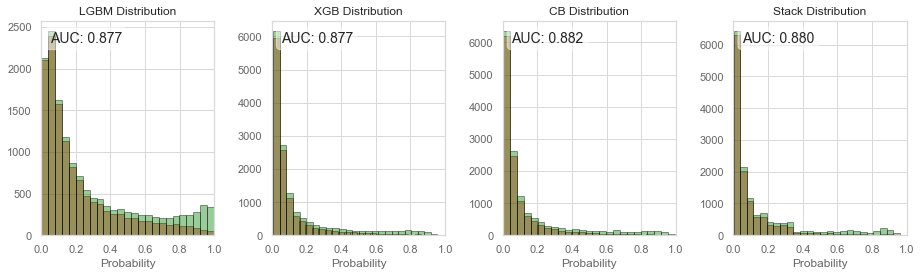

In [262]:
# sns.set(font_scale = 1)
# sns.set_style({"axes.facecolor": "1.0", "axes.edgecolor": "0.85", "grid.color": "0.85",
#                "grid.linestyle": "-", 'axes.labelcolor': '0.4', "xtick.color": "0.4",
#                'ytick.color': '0.4'})

# # Plot
# f, ax = plt.subplots(figsize=(13, 4), nrows=1, ncols = 4)

# for key, counter in zip(classifiers, range(5)):
#     # Get predictions
#     y_pred = results[key]
    
#     # Get AUC
#     auc = metrics.roc_auc_score(y_valid, y_pred)
#     textstr = f"AUC: {auc:.3f}"

#     # Plot false distribution
#     false_pred = results[results["Target"] == 0]
#     sns.distplot(false_pred[key], hist=True, kde=False, 
#                  bins=int(25), color = 'red',
#                  hist_kws={'edgecolor':'black'}, ax = ax[counter])
    
#     # Plot true distribution
#     true_pred = results[results["Target"] == 1]
#     sns.distplot(results[key], hist=True, kde=False, 
#                  bins=int(25), color = 'green',
#                  hist_kws={'edgecolor':'black'}, ax = ax[counter])
    
    
#     # These are matplotlib.patch.Patch properties
#     props = dict(boxstyle='round', facecolor='white', alpha=0.5)
    
#     # Place a text box in upper left in axes coords
#     ax[counter].text(0.05, 0.95, textstr, transform=ax[counter].transAxes, fontsize=14,
#                     verticalalignment = "top", bbox=props)
    
#     # Set axis limits and labels
#     ax[counter].set_title(f"{key} Distribution")
#     ax[counter].set_xlim(0,1)
#     ax[counter].set_xlabel("Probability")

# # Tight layout
# plt.tight_layout()